Dataset Overview: 
    
The wine reviews dataset has been retrieved from Kaggle.com. The dataset has been posted by Zack Thoutt. The data has been scraped from WineEnthusiast on Nov. 22, 2017. 

## The purpose of the Exploratory data analysis are the following: 

1. Find patterns on each region based on price of the wine and year. 
2. Find patterns on each region based on the points of the wine and year. 
3. Find patterns on each region based on the price of the wine and year per variety. 
4. Find patterns on each region based on the points of the wine and year per variety.
5. Know the distribution of regions in each country.
6. Know the distributions of regions that have price filled up.
7. Know the distributions of regions that have points filled up.

======================================================================================= <br>
Analyis performed: 

1. Apply regression on each country based on price of the wine and year per region. 
2. Apply regression on each country based on points of the wine and year per region. 
3. Apply regression on each country based on price of different varieties and year per region. 
4. Apply regression on each country based on points of different varieties and year per region. 



In [1]:
# for plotting
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_style('whitegrid')
%matplotlib inline

#for the image
from IPython.display import Image

# pandas
import numpy as np
import pandas as pd
from pandas import Series,DataFrame
from glob import glob
import numpy as np
import os,re,string
import warnings
warnings.filterwarnings("ignore")
import time

import nltk
from spacy.tokens import Doc
from nltk.stem import WordNetLemmatizer 
lemmatizer = WordNetLemmatizer()
from nltk import word_tokenize          
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
nltk.download('wordnet')

#models
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD
from sklearn.preprocessing import Normalizer
from sklearn.cluster import KMeans, MiniBatchKMeans
from sklearn.pipeline import make_pipeline
from sklearn.pipeline import Pipeline
import re

# statistics 
from statsmodels.formula.api import ols

#metrics 
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score
from sklearn import metrics

# visualization 
import matplotlib.pyplot as plt
import matplotlib.cm as cm
%matplotlib inline
from matplotlib import pyplot

# nlp
import spacy
#nlp_spacy = spacy.load('en')
import operator

import en_core_web_sm
nlp = spacy.load('en_core_web_sm')

from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
stop_words_nltk = set(stopwords.words('english'))
# update stopword
#stop_words_list = stop_words_nltk.union(customize_stop_words)

from nltk.stem import PorterStemmer 
from nltk.stem.snowball import SnowballStemmer

ps = PorterStemmer() 
sb = SnowballStemmer('english')
import time

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\rezan\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [2]:
stop_words_nltk.update({"isnt"})

# EDA: Wine Reviews

In [3]:
def get_reviews_df():
    reviews = pd.read_csv('winemag-data-130k-v2.csv')
    print(f'Initial DataFrame: {reviews.info()}')
    # check the null values
    print('Percentage of null values in the dataframe')
    reviews.isnull().sum()/len(reviews)
    # list of EU countries
    eu_countries = ['Albania', 'Andorra' , 'Armenia', 'Austria', 'Azerbaijan', 'Belarus', 'Belgium', 
                    'Bosnia', 'Herzegovina', 'Bulgaria', 'Croatia', 'Cyprus', 'Czechia', 'Denmark', 'Estonia',
                    'Finland', 'France', 'Georgia', 'Germany', 'Greece', 'Hungary', 'Iceland', 'Ireland', 
                    'Italy', 'Kazakhstan', 'Kosovo', 'Latvia', 'Liechtenstein', 'Lithuania', 'Luxembourg', 
                    'Malta', 'Moldova', 'Monaco', 'Montenegro', 'Netherlands', 'North Macedonia (formerly Macedonia)', 
                    'Norway', 'Poland', 'Portugal', 'Romania', 'Russia', 'San Marino', 'Serbia', 'Slovakia', 'Slovenia', 'Spain',
                    'Sweden', 'Switzerland', 'Turkey', 'Ukraine', 'United Kingdom (UK)', 'Vatican City (Holy See)']

    # get only the wines with title in reviews that has year and only the countries within europe. 
    # this will be the wine to be used from now on.
    reviews['years'] = reviews.title.str.extract('([1-2][0-9]{3})').astype('float64')
    reviews = reviews[reviews['years'] < 2020] 
    filtered_wine_reviews = reviews['country'].isin(eu_countries)
    reviews_df = reviews[filtered_wine_reviews]
    print(f'shape of dataframe after filtering the countries and the years from the wine title.: {reviews_df.shape}')
    print(f'checking the null values after filtering {reviews_df.isnull().sum()/len(reviews_df)}')
    return reviews_df

reviews_df = get_reviews_df()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129971 entries, 0 to 129970
Data columns (total 14 columns):
Unnamed: 0               129971 non-null int64
country                  129908 non-null object
description              129971 non-null object
designation              92506 non-null object
points                   129971 non-null int64
price                    120975 non-null float64
province                 129908 non-null object
region_1                 108724 non-null object
region_2                 50511 non-null object
taster_name              103727 non-null object
taster_twitter_handle    98758 non-null object
title                    129971 non-null object
variety                  129970 non-null object
winery                   129971 non-null object
dtypes: float64(1), int64(2), object(11)
memory usage: 13.9+ MB
Initial DataFrame: None
Percentage of null values in the dataframe
shape of dataframe after filtering the countries and the years from the wine title.: (5730

notes from the dataset: <br>
region_1: The wine growing area in a province or state (ie Napa) <br>
region_2: Sometimes there are more specific regions specified within a wine growing area (ie Rutherford inside the Napa Valley), but this value can sometimes be blank

Remarks: Region_2 will not be included since it is completely unfilled.  

# Descriptive analysis about countries and regions

- Region is a very important factor since this is where the prediction will be based. 

how many countries are captured after filtering
 France         20511
Italy          18550
Spain           6142
Portugal        5374
Austria         3304
Germany         2149
Greece           445
Hungary          143
Bulgaria         141
Romania          120
Turkey            90
Slovenia          85
Georgia           84
Croatia           72
Moldova           57
Serbia            12
Cyprus            10
Switzerland        7
Ukraine            5
Luxembourg         3
Armenia            2
Slovakia           1
Name: country, dtype: int64


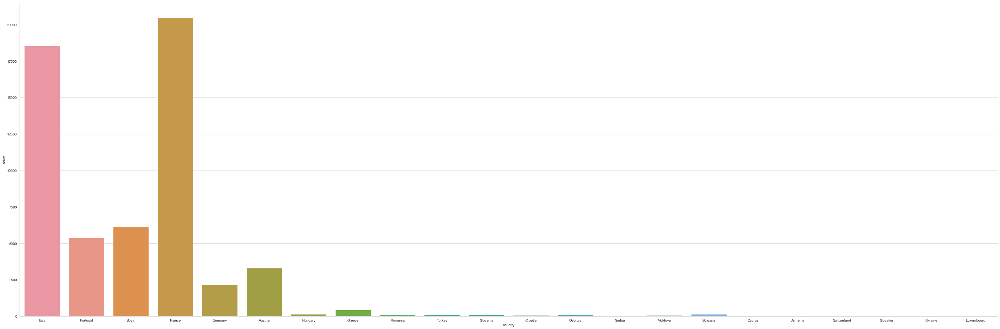

In [4]:
def eda_per_country_counts(reviews_df):
    sns.catplot('country', data=reviews_df, kind='count', height=13, aspect=3, orient='v')
    print(
        'how many countries are captured after filtering\n', 
        reviews_df['country'].value_counts()
    )
    
eda_per_country_counts(reviews_df)

remarks: Count of countries that was filtered. 

how many countries that has available 'regions'. 
    country  count
5   France  20435
10   Italy  18531
18   Spain   6134


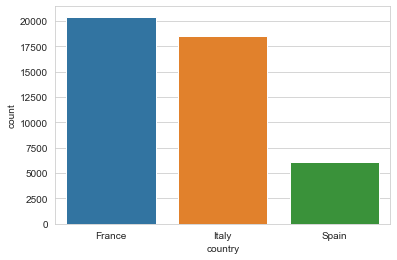

In [5]:
def eda_countries_available_regions(reviews_df):
    data_countries_region_1 = reviews_df.groupby('country')['region_1'].agg(['count']).reset_index().sort_values('count', ascending = False)
    print("how many countries that has available 'regions'. \n", data_countries_region_1[data_countries_region_1['count'] != 0])
    sns.barplot('country','count', data = data_countries_region_1[data_countries_region_1['count'] != 0])

eda_countries_available_regions(reviews_df)

Remarks: These are the countries that have regions available. The analysis will be focus on these 3 countries. 

In [6]:
def eda_checking_null_values(reviews_df):
    # checking how many null values are available after filtering from 3 different countries. (France, Italy, Spain)
    list_of_countries_contains_R1 = ['France','Italy','Spain']
    print('Check if the null values in region_1 : \n',
        reviews_df[reviews_df['country'].isin(list_of_countries_contains_R1)].isnull().sum()
    )
    
    # check from the where those null region_1 are: 

    data = reviews_df[reviews_df['country'].isin(list_of_countries_contains_R1)]
    data_toCheck = data[data['region_1'].isnull()] # check which country got a lot of null regions 
    print('Count of null values in each countries:\n', data_toCheck['country'].value_counts())
    print('\n')
    print(
        'Percentage of null regions in France out of 20511:', 
        (
            len(data_toCheck[data_toCheck['country'] == 'France']
        )/len(reviews_df[reviews_df['country'] == 'France']))*100
    )
    print(
        'Percentage of null regions in Italy out of 18550:',
        (
            len(data_toCheck[data_toCheck['country'] == 'Italy']
        )/len(reviews_df[reviews_df['country'] == 'Italy']))*100
    )
    print(
        'Percentage of null regions in Spain out of 6142:',
        (
            len(data_toCheck[data_toCheck['country'] == 'Spain']
        )/len(reviews_df[reviews_df['country'] == 'Spain']))*100
    )
eda_checking_null_values(reviews_df)

Check if the null values in region_1 : 
 Unnamed: 0                   0
country                      0
description                  0
designation              14412
points                       0
price                     6650
province                     0
region_1                   103
region_2                 45203
taster_name               8120
taster_twitter_handle     8120
title                        0
variety                      0
winery                       0
years                        0
dtype: int64
Count of null values in each countries:
 France    76
Italy     19
Spain      8
Name: country, dtype: int64


Percentage of null regions in France out of 20511: 0.3705328847935254
Percentage of null regions in Italy out of 18550: 0.10242587601078167
Percentage of null regions in Spain out of 6142: 0.1302507326603712


There are 103 unfilled regions. 6650 unfilled price. 

**Note:** Based on the observation above,  since region is a very important variable in this study,  we will discard all the other countries that have unfilled region.

In [7]:
def eda_get_final_data(reviews_df):
    # get only the 3 countries and remove the 103 null regions. 

    countries_to_include = ['France','Italy', 'Spain']
    final_data = reviews_df[reviews_df['country'].isin(countries_to_include)]
    final_data = reviews_df[~reviews_df['region_1'].isnull()] # drop the null regions from filtered data
    print('Shape of the final data: ', final_data.shape)
    print(final_data.isnull().sum())
    
    return final_data
    
final_data = eda_get_final_data(reviews_df)

Shape of the final data:  (45100, 15)
Unnamed: 0                   0
country                      0
description                  0
designation              14396
points                       0
price                     6641
province                     0
region_1                     0
region_2                 45100
taster_name               8120
taster_twitter_handle     8120
title                        0
variety                      0
winery                       0
years                        0
dtype: int64


**Note:** After getting the countries that have region_1 filled and within SPAIN, FRANCE, and ITALY. We are left with 45100x15 shape.

In [8]:
def eda_descriptive_analysis_years_per_country(final_data):
    # descriptive analysis of years recorded per country

    final_data.groupby('country')['years'].agg(['count','min','max', 'mean'])

eda_descriptive_analysis_years_per_country(final_data)

In [9]:
# small view on the final data 

final_data.head()

,Unnamed: 0,country,description,designation,points,price,province,region_1,region_2,taster_name,taster_twitter_handle,title,variety,winery,years
0,0,Italy,"Aromas include tropical fruit, broom, brimston...",Vulkà Bianco,87,NaN,Sicily & Sardinia,Etna,NaN,Kerin O’Keefe,@kerinokeefe,Nicosia 2013 Vulkà Bianco (Etna),White Blend,Nicosia,2013.0
5,5,Spain,Blackberry and raspberry aromas show a typical...,Ars In Vitro,87,15.0,Northern Spain,Navarra,NaN,Michael Schachner,@wineschach,Tandem 2011 Ars In Vitro Tempranillo-Merlot (N...,Tempranillo-Merlot,Tandem,2011.0
6,6,Italy,"Here's a bright, informal red that opens with ...",Belsito,87,16.0,Sicily & Sardinia,Vittoria,NaN,Kerin O’Keefe,@kerinokeefe,Terre di Giurfo 2013 Belsito Frappato (Vittoria),Frappato,Terre di Giurfo,2013.0
7,7,France,This dry and restrained wine offers spice in p...,NaN,87,24.0,Alsace,Alsace,NaN,Roger Voss,@vossroger,Trimbach 2012 Gewurztraminer (Alsace),Gewürztraminer,Trimbach,2012.0
9,9,France,This has great depth of flavor with its fresh ...,Les Natures,87,27.0,Alsace,Alsace,NaN,Roger Voss,@vossroger,Jean-Baptiste Adam 2012 Les Natures Pinot Gris...,Pinot Gris,Jean-Baptiste Adam,2012.0


In [10]:
final_data.to_excel('wine_review_1.xlsx')

In [11]:
final_data.shape

(45100, 15)

# France distribution of Regions

In [12]:
# distribution of region recorded in France

france = final_data[final_data['country'] == 'France']
count_france = pd.DataFrame(france.groupby('region_1')['region_1'].count())
count_france['region_1'].describe()


count     382.000000
mean       53.494764
std       146.937142
min         1.000000
25%         3.000000
50%        11.000000
75%        37.750000
max      2125.000000
Name: region_1, dtype: float64

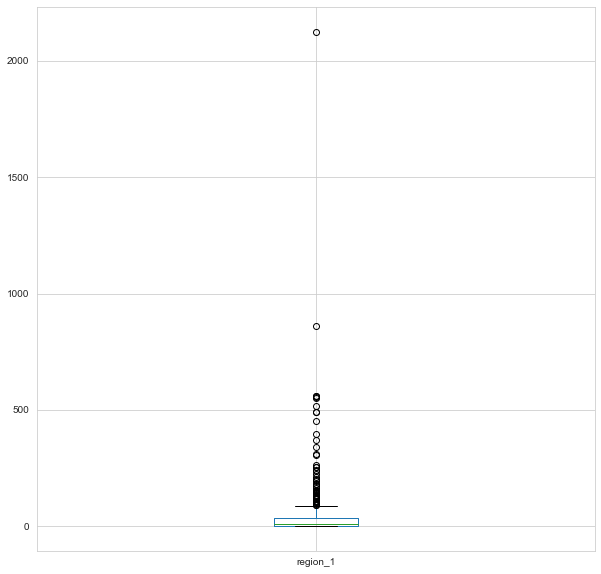

In [13]:
boxplot_france = count_france.boxplot(column = 'region_1', figsize = (10,10))

# Italy distribution of regions

In [14]:
italy = final_data[final_data['country'] == 'Italy']
count_italy = pd.DataFrame(italy.groupby('region_1')['region_1'].count())
count_italy['region_1'].describe()

count     379.000000
mean       48.894459
std       160.409313
min         1.000000
25%         3.000000
50%         8.000000
75%        26.000000
max      1599.000000
Name: region_1, dtype: float64

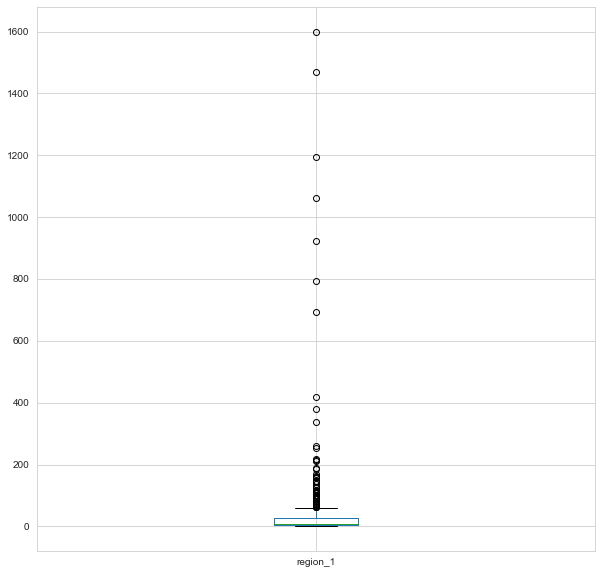

In [15]:
boxplot_italy = count_italy.boxplot(column = 'region_1', figsize = (10,10))

# Spain distributions of regions 

In [16]:
spain = final_data[final_data['country'] == 'Spain']
count_spain = pd.DataFrame(spain.groupby('region_1')['region_1'].count())
count_spain['region_1'].describe()

count      80.00000
mean       76.67500
std       190.10988
min         1.00000
25%         4.00000
50%        11.50000
75%        71.50000
max      1466.00000
Name: region_1, dtype: float64

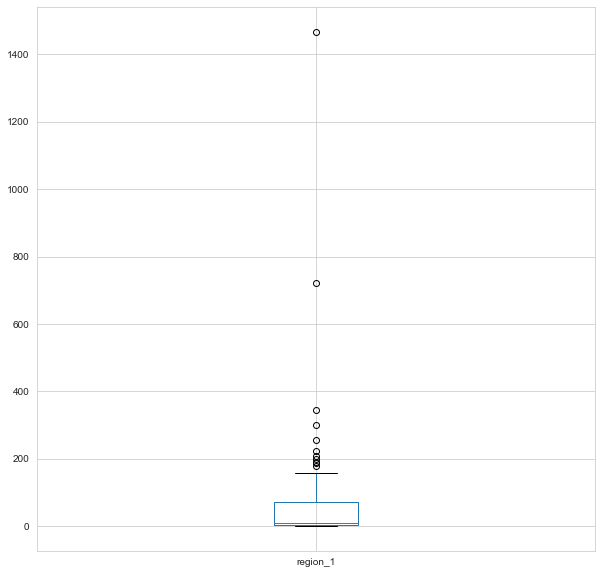

In [17]:
boxplot_spain = count_spain.boxplot(column = 'region_1', figsize = (10,10))

## Comparing the distribution of regions in FRANCE, ITALY, and SPAIN

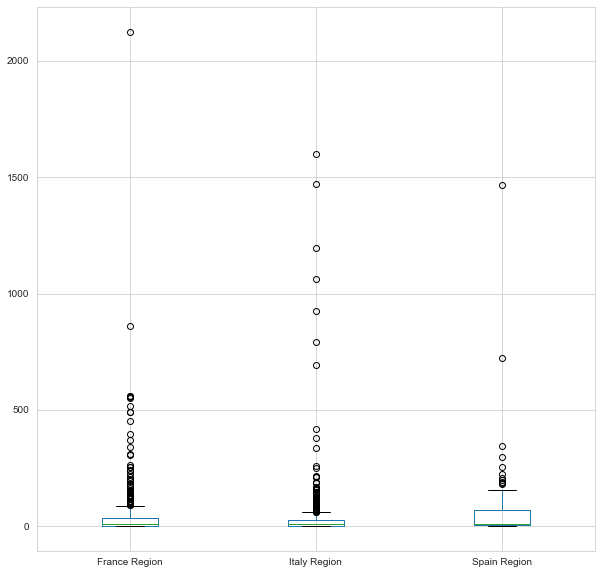

In [18]:
# combine all 3 dataframe and check how skewed the data are. 

count_france.rename({'region_1':'France Region'},axis=1, inplace=True)
count_italy.rename({'region_1':'Italy Region'},axis=1, inplace=True)
count_spain.rename({'region_1':'Spain Region'},axis=1, inplace=True)

all_countries = pd.concat([count_france,count_italy,count_spain], axis = 1)
all_countries.boxplot(column = ['France Region', 'Italy Region', 'Spain Region' ], figsize = (10,10))

Remarks: In all countries, the distribution of the recorded regions has been really skewed. For France, the minimum is 1 and the maximum is 2125. For Italy, the minimum is 1 and maximum is 1599. For Spain, the minimum is 1 and maximum is 1466. Please refer to the results above for more details and remarks.

# Analysis about regions and price

- The price variable is important to have since this is an indication of the quality of the wine on that year per region. <br>

In [19]:
final_data.isnull().sum()

Unnamed: 0                   0
country                      0
description                  0
designation              14396
points                       0
price                     6641
province                     0
region_1                     0
region_2                 45100
taster_name               8120
taster_twitter_handle     8120
title                        0
variety                      0
winery                       0
years                        0
dtype: int64

* We have 6641 null values for price. 

In [20]:
# check which country contains a lot of null values for price. 

final_data_toCheck = final_data[final_data['price'].isnull()]
print('Count of null values in each countries:\n', final_data_toCheck['country'].value_counts())

Count of null values in each countries:
 France    4116
Italy     2457
Spain       68
Name: country, dtype: int64


Remarks: These are the count of the null values for price variable in each country. 

In [21]:
# count of regions that has no available price

final_data_toCheck = final_data[final_data['price'].isnull()]
print('Count of null values in each region:\n', final_data_toCheck['region_1'].value_counts())

Count of null values in each region:
 Saint-Émilion                        274
Alsace                               262
Brunello di Montalcino               259
Barolo                               239
Pessac-Léognan                       234
                                    ... 
Trebbiano d'Abruzzo                    1
Apremont                               1
Cilento                                1
Valpolicella Valpantena Superiore      1
Vino de la Tierra de Castilla          1
Name: region_1, Length: 477, dtype: int64


Remarks: There are 477 regions that doesnt have a price value recorded. Because of this result, the original data will be filtered and the regions that have missing values for price will be filtered. The result of this filtering will be stored in a separate dataframe called "**data_price_df**".

In [22]:
# get which regions has the null values 

regionWithNoPriceAvailable = list(final_data_toCheck['region_1'].unique())

df_noPrice = pd.DataFrame({'region_1':[], 'no_price_count':[], 'region_count':[], 'percentNull':[]})
for region in regionWithNoPriceAvailable:
    whole_region_count = len(final_data[final_data['region_1'] == str(region)])
    num_of_no_price =  len(final_data_toCheck[final_data_toCheck['region_1'] == str(region)])
    regPercent =num_of_no_price/whole_region_count
    df_noPrice = df_noPrice.append({'region_1':region,'percentNull':regPercent,'no_price_count':num_of_no_price, 'region_count':whole_region_count}, ignore_index = True)

In [23]:
df_noPrice.sort_values('percentNull', ascending = False, inplace = True)
df_noPrice.describe()

,no_price_count,region_count,percentNull
count,477.000000,477.000000,477.000000
mean,13.922432,87.993711,0.246710
std,33.995246,202.014606,0.231452
min,1.000000,1.000000,0.002899
25%,1.000000,9.000000,0.101852
50%,3.000000,25.000000,0.170732
75%,11.000000,85.000000,0.285714
max,274.000000,2125.000000,1.000000


Remarks: minimum price count is 1, max region is 274. 

In [24]:
df_noPrice.sort_values('no_price_count', ascending = False) # these are all the regions that have unfilled price.

,region_1,no_price_count,region_count,percentNull
35,Saint-Émilion,274.0,561.0,0.488414
17,Alsace,262.0,2125.0,0.123294
3,Brunello di Montalcino,259.0,1470.0,0.176190
46,Barolo,239.0,1599.0,0.149468
39,Pessac-Léognan,234.0,396.0,0.590909
109,Margaux,169.0,264.0,0.640152
47,Barbaresco,167.0,794.0,0.210327
2,Sicilia,147.0,924.0,0.159091
68,Chablis,138.0,559.0,0.246869
87,Pauillac,136.0,214.0,0.635514


Remarks: The highest region that got missing value is contaning 49% of it's whole record. I will drop just drop all these null values store it in another dataframe and do regression on each region based on their price. 

In [25]:
# get all regions that have price filled completely. 
# use this data for regression
# This data contains filled region and filled price. 
# This data will be used for regression on price and region, but this will not be used for points and region.

data_price_df = final_data[~final_data['price'].isnull()]

In [26]:
data_price_df.isnull().sum()

Unnamed: 0                   0
country                      0
description                  0
designation              12044
points                       0
price                        0
province                     0
region_1                     0
region_2                 38459
taster_name               6550
taster_twitter_handle     6550
title                        0
variety                      0
winery                       0
years                        0
dtype: int64

Remarks: Now, after filtering we dont have a missing value for price anymore and no missing values on region_1 as well. This dataset will be used for the regression on year and price later on. 

In [27]:
data_price_df.to_excel('wine_review_2.xlsx')

## France: Region and Price distribution

In [28]:
# France region distribution that has price feature available. This using the price data only. 

france = data_price_df[data_price_df['country'] == 'France']
print('Shape of France DataSet: ', france.shape)
count_france_price = pd.DataFrame(france.groupby('region_1')['region_1'].count())
#count_france_price['region_1'].describe()
count_france_price['region_1'].describe()

Shape of France DataSet:  (16319, 15)


count     372.000000
mean       43.868280
std       125.515074
min         1.000000
25%         3.000000
50%         9.000000
75%        34.000000
max      1863.000000
Name: region_1, dtype: float64

Remarks: There are 372 unique regions. 

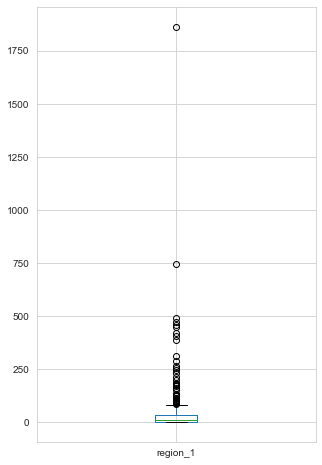

In [29]:
boxplot_france = count_france_price.boxplot(column = 'region_1', figsize = (5,8))

Remarks: Lower 25 percentile is 3 and below. 75 percentile is 34 and above. I will do regression on 75% above including the outliers. Threshold of 34. 

In [30]:
# filter price data on France 
france = data_price_df[data_price_df['country'] == 'France']

# get the region that got >= 9 and put it in a list 
count_france_price = pd.DataFrame(france.groupby('region_1')['region_1'].count())
france_regions_list = count_france_price[count_france_price['region_1'] >= 34].index.tolist()

# filter the france dataset on france_regions_list
france = france[france['region_1'].isin(france_regions_list)]

### France: Regression on Years and Price Per Region.

In [31]:
# function on regression on years vs price per region

def regression(region, price_per_year_df):
    x = pd.DataFrame(price_per_year_df.loc[str(region)]['years']['mean'].values).rename(columns = {0:'year'})
    y = pd.DataFrame(price_per_year_df.loc[str(region)]['price']['mean'].values).rename(columns = {0:'price_mean'}) # this is the y-axis 
    price_df = pd.concat([x,y], axis = 1) # save this dataframe for future use. 
    #sns.lmplot(x='year', y='price_mean', data=price_df)
    x = sm.add_constant(x)
    model = sm.OLS(y,x) # 
    results = model.fit()
    print(results.summary())
    print('=====Result Parameters========')
    print(results.params)
    print(sns.lmplot(x='year', y='price_mean', data=price_df))
    ax = plt.gca()
    print(ax.set_title(f"{region}")) 

====FOR REGION Alsace=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.071
Model:                            OLS   Adj. R-squared:                  0.009
Method:                 Least Squares   F-statistic:                     1.142
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.302
Time:                        14:50:41   Log-Likelihood:                -60.495
No. Observations:                  17   AIC:                             125.0
Df Residuals:                      15   BIC:                             126.7
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        889.7449    

Text(0.5, 1.0, 'Beaujolais-Villages')
====FOR REGION Beaune=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.287
Model:                            OLS   Adj. R-squared:                  0.216
Method:                 Least Squares   F-statistic:                     4.031
Date:                Wed, 10 Jun 2020   Prob (F-statistic):             0.0725
Time:                        14:50:42   Log-Likelihood:                -46.536
No. Observations:                  12   AIC:                             97.07
Df Residuals:                      10   BIC:                             98.04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------

Text(0.5, 1.0, 'Blaye Côtes de Bordeaux')
====FOR REGION Bordeaux=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.103
Model:                            OLS   Adj. R-squared:                  0.047
Method:                 Least Squares   F-statistic:                     1.839
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.194
Time:                        14:50:43   Log-Likelihood:                -80.691
No. Observations:                  18   AIC:                             165.4
Df Residuals:                      16   BIC:                             167.2
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------

Text(0.5, 1.0, 'Bordeaux Supérieur')
====FOR REGION Bourgogne=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.049
Model:                            OLS   Adj. R-squared:                 -0.037
Method:                 Least Squares   F-statistic:                    0.5682
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.467
Time:                        14:50:44   Log-Likelihood:                -49.078
No. Observations:                  13   AIC:                             102.2
Df Residuals:                      11   BIC:                             103.3
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                 -0.165
Method:                 Least Squares   F-statistic:                  0.006289
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.939
Time:                        14:50:45   Log-Likelihood:                -23.495
No. Observations:                   8   AIC:                             50.99
Df Residuals:                       6   BIC:                             51.15
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       -106.8216   1636.200     -0.065      0.9

Text(0.5, 1.0, 'Champagne')
====FOR REGION Chassagne-Montrachet=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.827
Model:                            OLS   Adj. R-squared:                  0.811
Method:                 Least Squares   F-statistic:                     52.51
Date:                Wed, 10 Jun 2020   Prob (F-statistic):           1.65e-05
Time:                        14:50:46   Log-Likelihood:                -41.514
No. Observations:                  13   AIC:                             87.03
Df Residuals:                      11   BIC:                             88.16
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

Text(0.5, 1.0, 'Châteauneuf-du-Pape')
====FOR REGION Clos de Vougeot=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.080
Model:                            OLS   Adj. R-squared:                 -0.022
Method:                 Least Squares   F-statistic:                    0.7818
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.400
Time:                        14:50:47   Log-Likelihood:                -60.276
No. Observations:                  11   AIC:                             124.6
Df Residuals:                       9   BIC:                             125.3
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------

Text(0.5, 1.0, 'Cornas')
====FOR REGION Corse=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.537
Model:                            OLS   Adj. R-squared:                  0.305
Method:                 Least Squares   F-statistic:                     2.318
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.267
Time:                        14:50:48   Log-Likelihood:                -13.164
No. Observations:                   4   AIC:                             30.33
Df Residuals:                       2   BIC:                             29.10
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
c

Text(0.5, 1.0, "Coteaux d'Aix-en-Provence")
====FOR REGION Coteaux du Languedoc=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.328
Model:                            OLS   Adj. R-squared:                  0.261
Method:                 Least Squares   F-statistic:                     4.891
Date:                Wed, 10 Jun 2020   Prob (F-statistic):             0.0514
Time:                        14:50:49   Log-Likelihood:                -44.727
No. Observations:                  12   AIC:                             93.45
Df Residuals:                      10   BIC:                             94.42
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------

Text(0.5, 1.0, 'Côtes de Bordeaux')
====FOR REGION Côtes de Bourg=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.212
Model:                            OLS   Adj. R-squared:                  0.114
Method:                 Least Squares   F-statistic:                     2.156
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.180
Time:                        14:50:50   Log-Likelihood:                -26.668
No. Observations:                  10   AIC:                             57.34
Df Residuals:                       8   BIC:                             57.94
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------

Text(0.5, 1.0, 'Côtes de Provence Sainte-Victoire')
====FOR REGION Côtes du Lot=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.345
Model:                            OLS   Adj. R-squared:                  0.181
Method:                 Least Squares   F-statistic:                     2.103
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.221
Time:                        14:50:51   Log-Likelihood:                -15.233
No. Observations:                   6   AIC:                             34.47
Df Residuals:                       4   BIC:                             34.05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------

Text(0.5, 1.0, 'Entre-Deux-Mers')
====FOR REGION Fleurie=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.029
Model:                            OLS   Adj. R-squared:                 -0.068
Method:                 Least Squares   F-statistic:                    0.3023
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.594
Time:                        14:50:52   Log-Likelihood:                -31.476
No. Observations:                  12   AIC:                             66.95
Df Residuals:                      10   BIC:                             67.92
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------

Text(0.5, 1.0, 'Gaillac')
====FOR REGION Gevrey-Chambertin=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.449
Model:                            OLS   Adj. R-squared:                  0.388
Method:                 Least Squares   F-statistic:                     7.330
Date:                Wed, 10 Jun 2020   Prob (F-statistic):             0.0241
Time:                        14:50:53   Log-Likelihood:                -45.236
No. Observations:                  11   AIC:                             94.47
Df Residuals:                       9   BIC:                             95.27
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------

Text(0.5, 1.0, 'Hermitage')
====FOR REGION Juliénas=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.243
Model:                            OLS   Adj. R-squared:                  0.116
Method:                 Least Squares   F-statistic:                     1.922
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.215
Time:                        14:50:54   Log-Likelihood:                -16.492
No. Observations:                   8   AIC:                             36.98
Df Residuals:                       6   BIC:                             37.14
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------

Text(0.5, 1.0, 'Listrac-Médoc')
====FOR REGION Madiran=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.491
Model:                            OLS   Adj. R-squared:                  0.455
Method:                 Least Squares   F-statistic:                     13.53
Date:                Wed, 10 Jun 2020   Prob (F-statistic):            0.00248
Time:                        14:50:55   Log-Likelihood:                -71.637
No. Observations:                  16   AIC:                             147.3
Df Residuals:                      14   BIC:                             148.8
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------

Text(0.5, 1.0, 'Mercurey')
====FOR REGION Meursault=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.633
Model:                            OLS   Adj. R-squared:                  0.599
Method:                 Least Squares   F-statistic:                     18.94
Date:                Wed, 10 Jun 2020   Prob (F-statistic):            0.00115
Time:                        14:50:56   Log-Likelihood:                -50.373
No. Observations:                  13   AIC:                             104.7
Df Residuals:                      11   BIC:                             105.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------

Text(0.5, 1.0, 'Moulin-à-Vent')
====FOR REGION Muscadet Sèvre et Maine=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.706
Model:                            OLS   Adj. R-squared:                  0.686
Method:                 Least Squares   F-statistic:                     35.98
Date:                Wed, 10 Jun 2020   Prob (F-statistic):           2.44e-05
Time:                        14:50:57   Log-Likelihood:                -45.707
No. Observations:                  17   AIC:                             95.41
Df Residuals:                      15   BIC:                             97.08
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------

Text(0.5, 1.0, 'Nuits-St.-Georges')
====FOR REGION Pauillac=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.115
Model:                            OLS   Adj. R-squared:                  0.027
Method:                 Least Squares   F-statistic:                     1.300
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.281
Time:                        14:50:58   Log-Likelihood:                -71.086
No. Observations:                  12   AIC:                             146.2
Df Residuals:                      10   BIC:                             147.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------

Text(0.5, 1.0, 'Pomerol')
====FOR REGION Pommard=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.029
Model:                            OLS   Adj. R-squared:                 -0.079
Method:                 Least Squares   F-statistic:                    0.2719
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.615
Time:                        14:50:59   Log-Likelihood:                -45.635
No. Observations:                  11   AIC:                             95.27
Df Residuals:                       9   BIC:                             96.06
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------

Text(0.5, 1.0, 'Puligny-Montrachet')
====FOR REGION Rosé d'Anjou=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.168
Model:                            OLS   Adj. R-squared:                  0.029
Method:                 Least Squares   F-statistic:                     1.210
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.314
Time:                        14:51:00   Log-Likelihood:                -14.447
No. Observations:                   8   AIC:                             32.89
Df Residuals:                       6   BIC:                             33.05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------

Text(0.5, 1.0, 'Saint-Émilion')
====FOR REGION Sancerre=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.421
Model:                            OLS   Adj. R-squared:                  0.373
Method:                 Least Squares   F-statistic:                     8.726
Date:                Wed, 10 Jun 2020   Prob (F-statistic):             0.0121
Time:                        14:51:01   Log-Likelihood:                -42.576
No. Observations:                  14   AIC:                             89.15
Df Residuals:                      12   BIC:                             90.43
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

Text(0.5, 1.0, 'Savigny-lès-Beaune')
====FOR REGION Tavel=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.235
Model:                            OLS   Adj. R-squared:                  0.108
Method:                 Least Squares   F-statistic:                     1.846
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.223
Time:                        14:51:02   Log-Likelihood:                -17.566
No. Observations:                   8   AIC:                             39.13
Df Residuals:                       6   BIC:                             39.29
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------

Text(0.5, 1.0, 'Vin de France')
====FOR REGION Vin de Pays d'Oc=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.426
Model:                            OLS   Adj. R-squared:                  0.369
Method:                 Least Squares   F-statistic:                     7.430
Date:                Wed, 10 Jun 2020   Prob (F-statistic):             0.0213
Time:                        14:51:03   Log-Likelihood:                -22.872
No. Observations:                  12   AIC:                             49.74
Df Residuals:                      10   BIC:                             50.71
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

Text(0.5, 1.0, 'Vosne-Romanée')
====FOR REGION Vouvray=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.550
Model:                            OLS   Adj. R-squared:                  0.513
Method:                 Least Squares   F-statistic:                     14.68
Date:                Wed, 10 Jun 2020   Prob (F-statistic):            0.00239
Time:                        14:51:04   Log-Likelihood:                -57.362
No. Observations:                  14   AIC:                             118.7
Df Residuals:                      12   BIC:                             120.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------

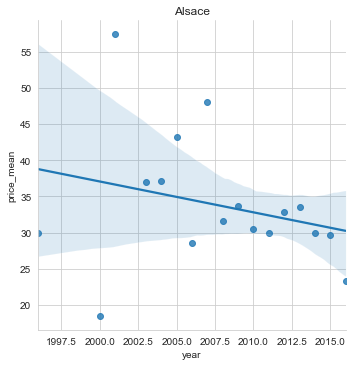

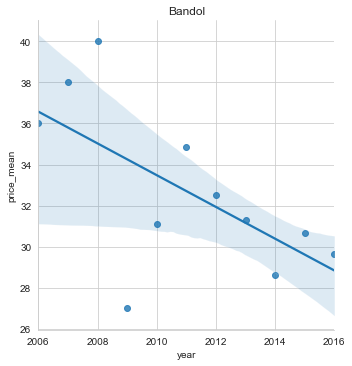

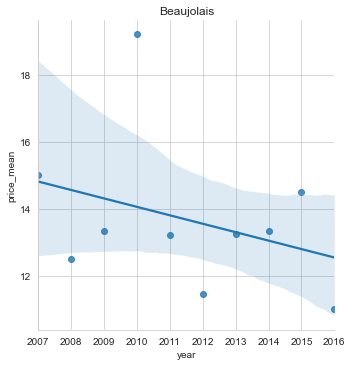

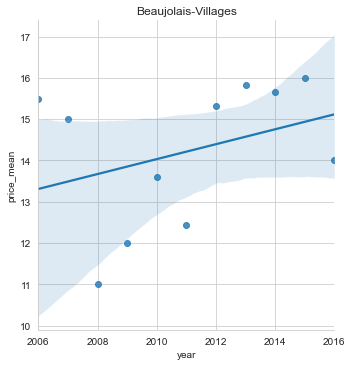

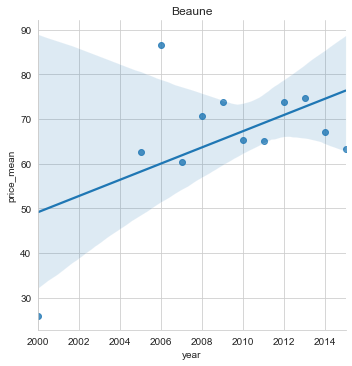

...

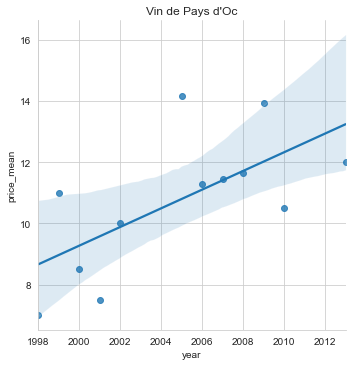

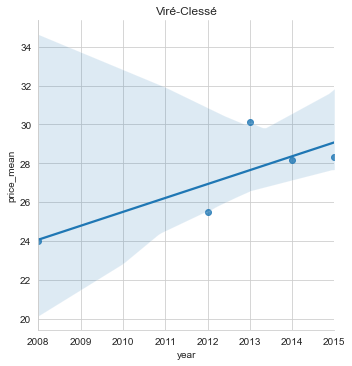

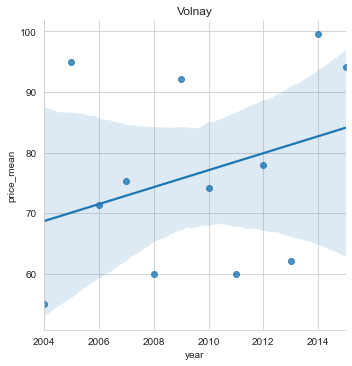

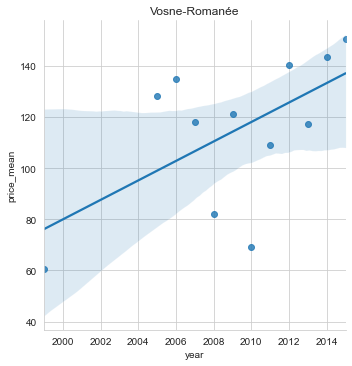

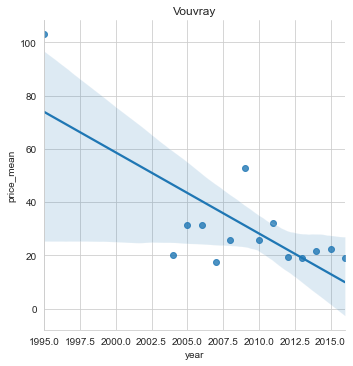

In [32]:
import statsmodels.api as sm
## do lmplot and regression on each region ##

# groupby per region, get the years and the price
price_year_per_region = france.groupby(['region_1','years'])['years','price'].agg(['count','min','max', 'mean']).reset_index().set_index('region_1')
# perform regression on years and price on that region ( use the mean for years and mean for price)

france_list_region = list(price_year_per_region.index.unique())

for region in france_list_region:
    print(f'====FOR REGION {region}=====')
    regression(region,price_year_per_region)

Remarks: This is a regression on each region and the price only. Other variables such as winery or variety are not yet included. 

## Italy: Region and Price distribution

In [33]:
# Italy region distribution that has price feature available. This using the price data only. 

italy = data_price_df[data_price_df['country'] == 'Italy']
print('Shape of Italy DataSet: ', italy.shape)
count_italy_price = pd.DataFrame(italy.groupby('region_1')['region_1'].count())
count_italy_price['region_1'].describe()

Shape of Italy DataSet:  (16074, 15)


count     367.000000
mean       43.798365
std       139.840689
min         1.000000
25%         3.000000
50%         7.000000
75%        25.500000
max      1360.000000
Name: region_1, dtype: float64

Remarks: Getting the 75% and above

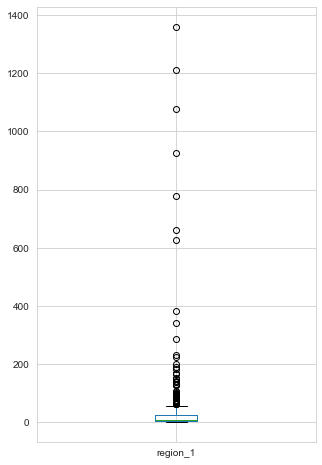

In [34]:
# boxplot
boxplot_italy = count_italy_price.boxplot(column = 'region_1', figsize = (5,8))

====FOR REGION Aglianico del Vulture=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.682
Model:                            OLS   Adj. R-squared:                  0.653
Method:                 Least Squares   F-statistic:                     23.59
Date:                Wed, 10 Jun 2020   Prob (F-statistic):           0.000505
Time:                        14:51:24   Log-Likelihood:                -42.806
No. Observations:                  13   AIC:                             89.61
Df Residuals:                      11   BIC:                             90.74
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const     

Text(0.5, 1.0, 'Amarone della Valpolicella')
====FOR REGION Amarone della Valpolicella Classico=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                 -0.062
Method:                 Least Squares   F-statistic:                   0.01125
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.917
Time:                        14:51:25   Log-Likelihood:                -75.595
No. Observations:                  18   AIC:                             155.2
Df Residuals:                      16   BIC:                             157.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------

Text(0.5, 1.0, "Barbera d'Alba Superiore")
====FOR REGION Barbera d'Asti=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.011
Model:                            OLS   Adj. R-squared:                 -0.071
Method:                 Least Squares   F-statistic:                    0.1373
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.717
Time:                        14:51:26   Log-Likelihood:                -44.861
No. Observations:                  14   AIC:                             93.72
Df Residuals:                      12   BIC:                             95.00
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.138
Model:                            OLS   Adj. R-squared:                  0.060
Method:                 Least Squares   F-statistic:                     1.764
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.211
Time:                        14:51:27   Log-Likelihood:                -55.100
No. Observations:                  13   AIC:                             114.2
Df Residuals:                      11   BIC:                             115.3
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       -276.1573    269.064     -1.026      0.3

Text(0.5, 1.0, 'Cannonau di Sardegna')
====FOR REGION Castel del Monte=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.131
Model:                            OLS   Adj. R-squared:                  0.035
Method:                 Least Squares   F-statistic:                     1.362
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.273
Time:                        14:51:28   Log-Likelihood:                -39.849
No. Observations:                  11   AIC:                             83.70
Df Residuals:                       9   BIC:                             84.49
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------

Text(0.5, 1.0, 'Chianti Colli Senesi')
====FOR REGION Chianti Rufina=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                 -0.088
Method:                 Least Squares   F-statistic:                   0.02554
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.876
Time:                        14:51:29   Log-Likelihood:                -47.583
No. Observations:                  13   AIC:                             99.17
Df Residuals:                      11   BIC:                             100.3
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------

Text(0.5, 1.0, 'Collio')
====FOR REGION Conegliano Valdobbiadene Prosecco Superiore=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.017
Model:                            OLS   Adj. R-squared:                 -0.147
Method:                 Least Squares   F-statistic:                    0.1033
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.759
Time:                        14:51:30   Log-Likelihood:                -16.295
No. Observations:                   8   AIC:                             36.59
Df Residuals:                       6   BIC:                             36.75
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------

Text(0.5, 1.0, "Dolcetto d'Alba")
====FOR REGION Etna=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                 -0.070
Method:                 Least Squares   F-statistic:                   0.01688
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.898
Time:                        14:51:30   Log-Likelihood:                -81.415
No. Observations:                  16   AIC:                             166.8
Df Residuals:                      14   BIC:                             168.4
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------

Text(0.5, 1.0, 'Friuli Colli Orientali')
====FOR REGION Friuli Grave=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.335
Model:                            OLS   Adj. R-squared:                  0.261
Method:                 Least Squares   F-statistic:                     4.536
Date:                Wed, 10 Jun 2020   Prob (F-statistic):             0.0620
Time:                        14:51:32   Log-Likelihood:                -22.457
No. Observations:                  11   AIC:                             48.91
Df Residuals:                       9   BIC:                             49.71
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------

Text(0.5, 1.0, 'Gavi')
====FOR REGION Greco di Tufo=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.032
Model:                            OLS   Adj. R-squared:                 -0.075
Method:                 Least Squares   F-statistic:                    0.3000
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.597
Time:                        14:51:33   Log-Likelihood:                -32.895
No. Observations:                  11   AIC:                             69.79
Df Residuals:                       9   BIC:                             70.59
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------

Text(0.5, 1.0, 'Isonzo del Friuli')
====FOR REGION Langhe=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.099
Model:                            OLS   Adj. R-squared:                  0.009
Method:                 Least Squares   F-statistic:                     1.099
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.319
Time:                        14:51:34   Log-Likelihood:                -61.814
No. Observations:                  12   AIC:                             127.6
Df Residuals:                      10   BIC:                             128.6
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------

Text(0.5, 1.0, 'Maremma')
====FOR REGION Maremma Toscana=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.085
Model:                            OLS   Adj. R-squared:                 -0.067
Method:                 Least Squares   F-statistic:                    0.5599
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.483
Time:                        14:51:35   Log-Likelihood:                -29.793
No. Observations:                   8   AIC:                             63.59
Df Residuals:                       6   BIC:                             63.75
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------

Text(0.5, 1.0, 'Montefalco Sagrantino')
====FOR REGION Montepulciano d'Abruzzo=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.706
Model:                            OLS   Adj. R-squared:                  0.684
Method:                 Least Squares   F-statistic:                     31.24
Date:                Wed, 10 Jun 2020   Prob (F-statistic):           8.78e-05
Time:                        14:51:37   Log-Likelihood:                -57.833
No. Observations:                  15   AIC:                             119.7
Df Residuals:                      13   BIC:                             121.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------

Text(0.5, 1.0, "Nebbiolo d'Alba")
====FOR REGION Piave=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                 -0.124
Method:                 Least Squares   F-statistic:                  0.009549
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.925
Time:                        14:51:38   Log-Likelihood:                -36.904
No. Observations:                  10   AIC:                             77.81
Df Residuals:                       8   BIC:                             78.41
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------

Text(0.5, 1.0, 'Puglia')
====FOR REGION Roero=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.467
Model:                            OLS   Adj. R-squared:                  0.400
Method:                 Least Squares   F-statistic:                     6.999
Date:                Wed, 10 Jun 2020   Prob (F-statistic):             0.0295
Time:                        14:51:39   Log-Likelihood:                -30.687
No. Observations:                  10   AIC:                             65.37
Df Residuals:                       8   BIC:                             65.98
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
c

Text(0.5, 1.0, 'Rosso di Montepulciano')
====FOR REGION Sagrantino di Montefalco=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.015
Model:                            OLS   Adj. R-squared:                 -0.182
Method:                 Least Squares   F-statistic:                   0.07487
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.795
Time:                        14:51:40   Log-Likelihood:                -24.417
No. Observations:                   7   AIC:                             52.83
Df Residuals:                       5   BIC:                             52.73
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------

Text(0.5, 1.0, "Sant'Antimo")
====FOR REGION Sicilia=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.110
Model:                            OLS   Adj. R-squared:                  0.063
Method:                 Least Squares   F-statistic:                     2.352
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.142
Time:                        14:51:41   Log-Likelihood:                -75.994
No. Observations:                  21   AIC:                             156.0
Df Residuals:                      19   BIC:                             158.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------

Text(0.5, 1.0, 'Taurasi')
====FOR REGION Terre Siciliane=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.042
Model:                            OLS   Adj. R-squared:                 -0.095
Method:                 Least Squares   F-statistic:                    0.3049
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.598
Time:                        14:51:42   Log-Likelihood:                -29.633
No. Observations:                   9   AIC:                             63.27
Df Residuals:                       7   BIC:                             63.66
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.006
Model:                            OLS   Adj. R-squared:                 -0.065
Method:                 Least Squares   F-statistic:                   0.08239
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.778
Time:                        14:51:43   Log-Likelihood:                -70.020
No. Observations:                  16   AIC:                             144.0
Df Residuals:                      14   BIC:                             145.6
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        648.0057   2080.126      0.312      0.7

Text(0.5, 1.0, 'Valpolicella')
====FOR REGION Valpolicella Classico=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.075
Model:                            OLS   Adj. R-squared:                 -0.080
Method:                 Least Squares   F-statistic:                    0.4836
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.513
Time:                        14:51:44   Log-Likelihood:                -20.060
No. Observations:                   8   AIC:                             44.12
Df Residuals:                       6   BIC:                             44.28
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------

Text(0.5, 1.0, 'Valpolicella Superiore')
====FOR REGION Valpolicella Superiore Ripasso=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.683
Model:                            OLS   Adj. R-squared:                  0.630
Method:                 Least Squares   F-statistic:                     12.91
Date:                Wed, 10 Jun 2020   Prob (F-statistic):             0.0115
Time:                        14:51:45   Log-Likelihood:                -21.981
No. Observations:                   8   AIC:                             47.96
Df Residuals:                       6   BIC:                             48.12
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------

Text(0.5, 1.0, 'Venezia Giulia')
====FOR REGION Verdicchio dei Castelli di Jesi Classico=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.015
Model:                            OLS   Adj. R-squared:                 -0.067
Method:                 Least Squares   F-statistic:                    0.1785
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.680
Time:                        14:51:46   Log-Likelihood:                -52.727
No. Observations:                  14   AIC:                             109.5
Df Residuals:                      12   BIC:                             110.7
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------

Text(0.5, 1.0, 'Vernaccia di San Gimignano')
====FOR REGION Veronese=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.357
Model:                            OLS   Adj. R-squared:                  0.298
Method:                 Least Squares   F-statistic:                     6.098
Date:                Wed, 10 Jun 2020   Prob (F-statistic):             0.0312
Time:                        14:51:47   Log-Likelihood:                -56.178
No. Observations:                  13   AIC:                             116.4
Df Residuals:                      11   BIC:                             117.5
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------

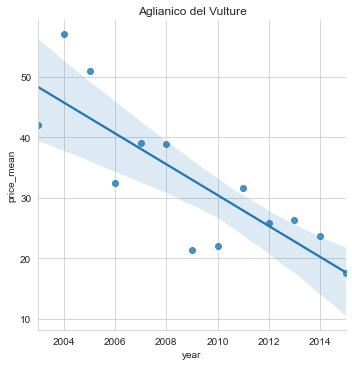

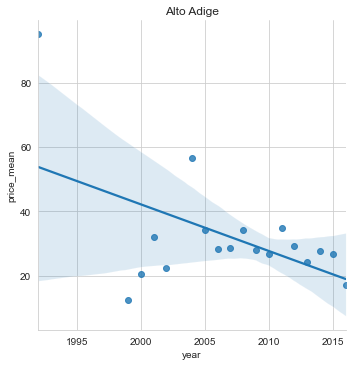

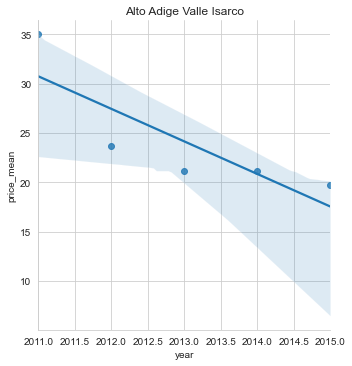

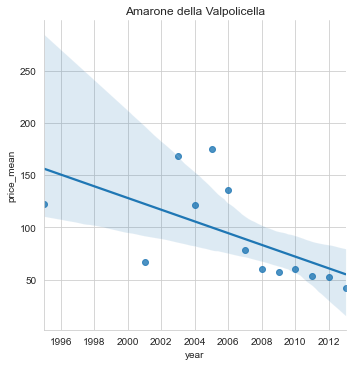

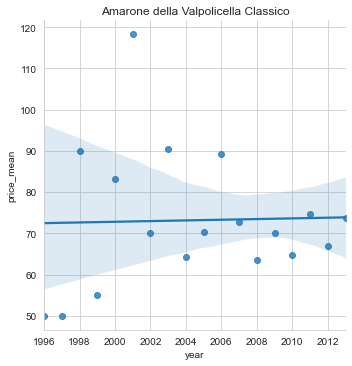

...

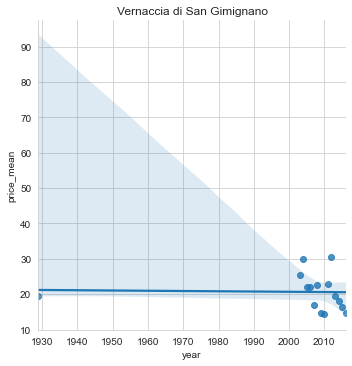

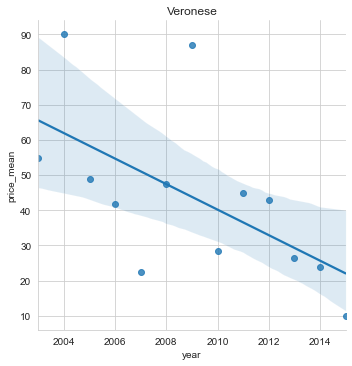

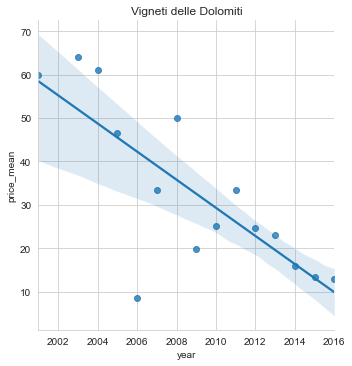

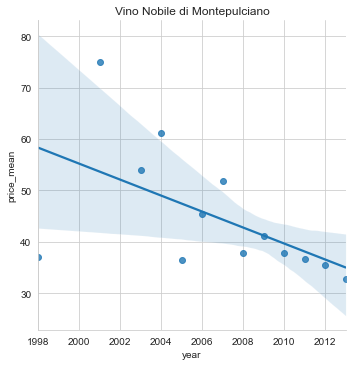

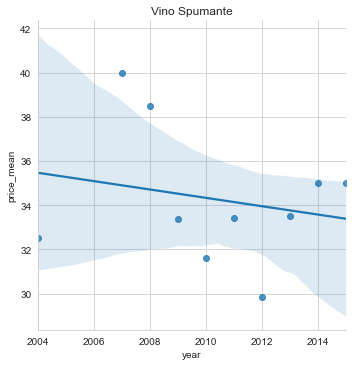

In [35]:
# filter price data on France 
italy = data_price_df[data_price_df['country'] == 'Italy']
# get the region that got >= 9 and put it in a list 
count_italy_price = pd.DataFrame(italy.groupby('region_1')['region_1'].count())
italy_regions_list = count_italy_price[count_italy_price['region_1'] >= 25].index.tolist()
# filter the france dataset on that list 
italy = italy[italy['region_1'].isin(italy_regions_list)]


# groupby per region, get the years and the price
price_year_per_region = italy.groupby(['region_1','years'])['years','price'].agg(['count','min','max', 'mean']).reset_index().set_index('region_1')
# perform regression on years and price on that region ( use the mean for years and mean for price)

italy_list_region = list(price_year_per_region.index.unique())

for region in italy_list_region:
    print(f'====FOR REGION {region}=====')
    regression(region, price_year_per_region)

Remarks: Find the average slope in each region irregardless of how old the wine is.
    (observation: The more negative the correlation is meaning, the wines shows that it 'ages' well because the old wines gets expensive)
    This means that this region is producing fine wines over the years. 

## Spain: Region and Price distribution

In [36]:
# Italy region distribution that has price feature available. This using the price data only. 

spain = data_price_df[data_price_df['country'] == 'Spain']
print('Shape of Spain DataSet: ', italy.shape)
count_spain_price = pd.DataFrame(spain.groupby('region_1')['region_1'].count())
count_spain_price['region_1'].describe()

Shape of Spain DataSet:  (14251, 15)


count      80.000000
mean       75.825000
std       187.793637
min         1.000000
25%         4.000000
50%        11.500000
75%        70.750000
max      1451.000000
Name: region_1, dtype: float64

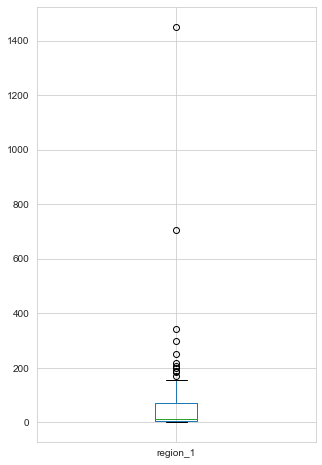

In [37]:
# boxplot
boxplot_spain = count_spain_price.boxplot(column = 'region_1', figsize = (5,8))

====FOR REGION Alicante=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.658
Model:                            OLS   Adj. R-squared:                  0.632
Method:                 Least Squares   F-statistic:                     25.01
Date:                Wed, 10 Jun 2020   Prob (F-statistic):           0.000242
Time:                        14:52:06   Log-Likelihood:                -56.906
No. Observations:                  15   AIC:                             117.8
Df Residuals:                      13   BIC:                             119.2
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       6293.3871  

Text(0.5, 1.0, 'Campo de Borja')
====FOR REGION Cariñena=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.153
Model:                            OLS   Adj. R-squared:                  0.097
Method:                 Least Squares   F-statistic:                     2.709
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.121
Time:                        14:52:07   Log-Likelihood:                -44.394
No. Observations:                  17   AIC:                             92.79
Df Residuals:                      15   BIC:                             94.45
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------

Text(0.5, 1.0, 'La Mancha')
====FOR REGION Montsant=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.478
Model:                            OLS   Adj. R-squared:                  0.426
Method:                 Least Squares   F-statistic:                     9.167
Date:                Wed, 10 Jun 2020   Prob (F-statistic):             0.0127
Time:                        14:52:07   Log-Likelihood:                -32.970
No. Observations:                  12   AIC:                             69.94
Df Residuals:                      10   BIC:                             70.91
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------

Text(0.5, 1.0, 'Priorat')
====FOR REGION Ribera del Duero=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.273
Model:                            OLS   Adj. R-squared:                  0.227
Method:                 Least Squares   F-statistic:                     5.997
Date:                Wed, 10 Jun 2020   Prob (F-statistic):             0.0262
Time:                        14:52:08   Log-Likelihood:                -78.747
No. Observations:                  18   AIC:                             161.5
Df Residuals:                      16   BIC:                             163.3
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------

Text(0.5, 1.0, 'Toro')
====FOR REGION Valencia=====
                            OLS Regression Results                            
Dep. Variable:             price_mean   R-squared:                       0.116
Model:                            OLS   Adj. R-squared:                  0.042
Method:                 Least Squares   F-statistic:                     1.577
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.233
Time:                        14:52:09   Log-Likelihood:                -60.262
No. Observations:                  14   AIC:                             124.5
Df Residuals:                      12   BIC:                             125.8
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------


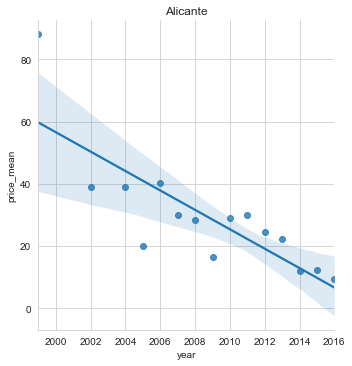

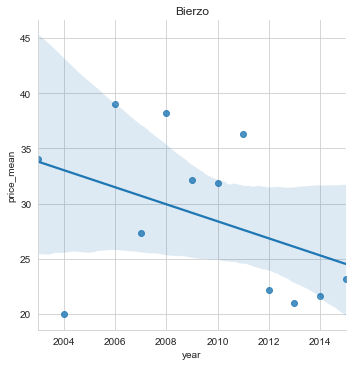

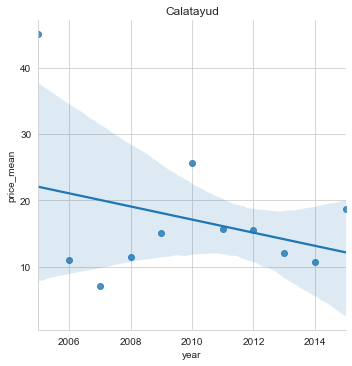

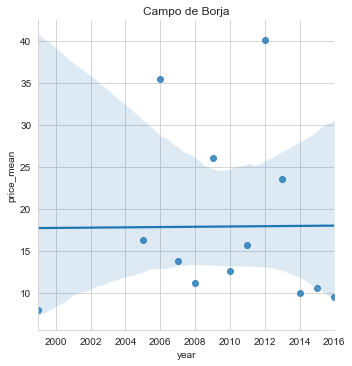

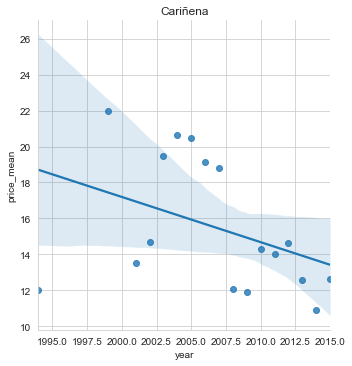

...

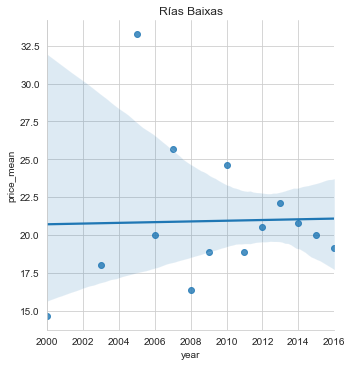

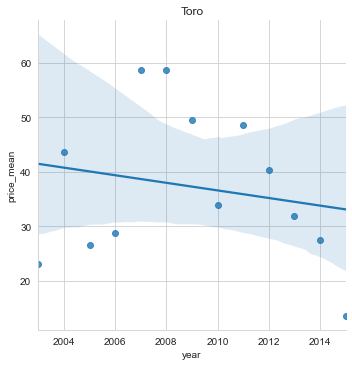

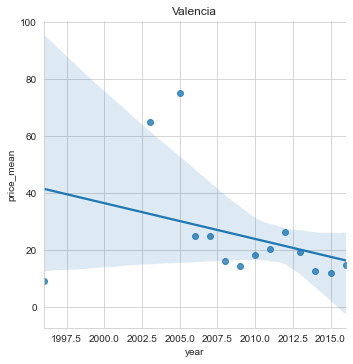

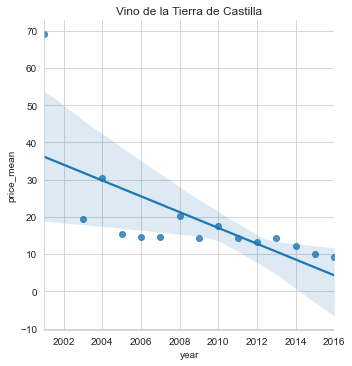

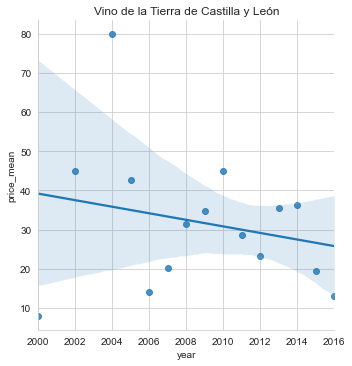

In [38]:
# filter price data on spain country only
spain = data_price_df[data_price_df['country'] == 'Spain']
# get the region that got >= 9 and put it in a list 
count_spain_price = pd.DataFrame(spain.groupby('region_1')['region_1'].count())
spain_regions_list = count_spain_price[count_spain_price['region_1'] >= 70].index.tolist()
# filter the france dataset on that list 
spain = spain[spain['region_1'].isin(spain_regions_list)]


# groupby per region, get the years and the price
price_year_per_region = spain.groupby(['region_1','years'])['years','price'].agg(['count','min','max', 'mean']).reset_index().set_index('region_1')
# perform regression on years and price on that region ( use the mean for years and mean for price)

spain_list_region = list(price_year_per_region.index.unique())

for region in spain_list_region:
    print(f'====FOR REGION {region}=====')
    regression(region, price_year_per_region)

Remarks: Next move is clustering these time series. 

## EDA about regions and points

- The points variable is important to have since this can be indication of the quality of the wine on that year per region. <br>
- In this EDA we are going to use the 'final_data' 

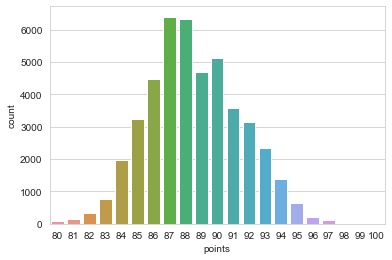

In [39]:
sns.countplot(final_data['points'])

In [40]:
# descriptive analysis of years per country
final_data.groupby('country')['points'].agg(['count','min','max', 'mean'])

,count,min,max,mean
country,,,,
France,20435,80,100,88.869733
Italy,18531,80,100,88.664130
Spain,6134,80,98,87.328660


## France: Region and points Distribution

In [41]:
france = final_data[final_data['country'] == 'France']
print('Shape of France DataSet: ', france.shape)
count_france_price = pd.DataFrame(france.groupby('region_1')['region_1'].count())
count_france_price['region_1'].describe()

Shape of France DataSet:  (20435, 15)


count     382.000000
mean       53.494764
std       146.937142
min         1.000000
25%         3.000000
50%        11.000000
75%        37.750000
max      2125.000000
Name: region_1, dtype: float64

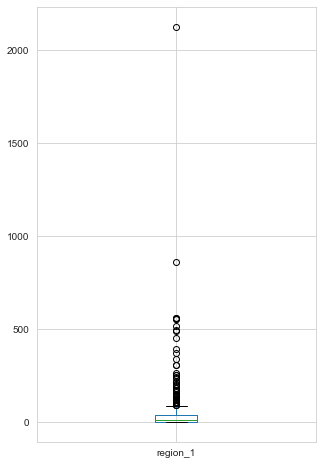

In [42]:
boxplot_france = count_france_price.boxplot(column = 'region_1', figsize = (5,8))

Remarks: There are more data here compared to the other dataset that was used for the price analysis. 

In [43]:
# filter price data on France 
france_points = final_data[final_data['country'] == 'France']
# get the region that got >= 9 and put it in a list 
count_france_price = pd.DataFrame(france_points.groupby('region_1')['region_1'].count())
france_regions_list = count_france_price[count_france_price['region_1'] >= 37].index.tolist() # 75 percentile and above
# filter the france dataset on that list 
france_points = france[france['region_1'].isin(france_regions_list)]

In [44]:
# function on regression on years vs points per region

def regression_on_points(region, price_per_year_df):
    x = pd.DataFrame(price_per_year_df.loc[str(region)]['years']['mean'].values).rename(columns = {0:'year'})
    y = pd.DataFrame(price_per_year_df.loc[str(region)]['points']['mean'].values).rename(columns = {0:'points_mean'}) # this is the y-axis 
    points_df = pd.concat([x,y], axis = 1) # save this dataframe for future use. 
    x = sm.add_constant(x)
    model = sm.OLS(y,x)
    results = model.fit()
    print(results.summary())
    print(sns.lmplot(x='year', y='points_mean', data=points_df))
    ax = plt.gca()
    print(ax.set_title(f"{region}"))

====FOR REGION Alsace=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.389
Model:                            OLS   Adj. R-squared:                  0.349
Method:                 Least Squares   F-statistic:                     9.567
Date:                Wed, 10 Jun 2020   Prob (F-statistic):            0.00742
Time:                        14:52:14   Log-Likelihood:                -21.149
No. Observations:                  17   AIC:                             46.30
Df Residuals:                      15   BIC:                             47.96
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       -156.0789    

Text(0.5, 1.0, 'Beaujolais')
====FOR REGION Beaujolais-Villages=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.273
Model:                            OLS   Adj. R-squared:                  0.192
Method:                 Least Squares   F-statistic:                     3.382
Date:                Wed, 10 Jun 2020   Prob (F-statistic):             0.0991
Time:                        14:52:15   Log-Likelihood:                -11.859
No. Observations:                  11   AIC:                             27.72
Df Residuals:                       9   BIC:                             28.51
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

Text(0.5, 1.0, 'Bergerac Sec')
====FOR REGION Blaye Côtes de Bordeaux=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.206
Model:                            OLS   Adj. R-squared:                  0.093
Method:                 Least Squares   F-statistic:                     1.817
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.220
Time:                        14:52:16   Log-Likelihood:                -14.464
No. Observations:                   9   AIC:                             32.93
Df Residuals:                       7   BIC:                             33.32
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------

Text(0.5, 1.0, 'Bordeaux Rosé')
====FOR REGION Bordeaux Supérieur=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.157
Model:                            OLS   Adj. R-squared:                  0.073
Method:                 Least Squares   F-statistic:                     1.862
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.202
Time:                        14:52:17   Log-Likelihood:                -10.818
No. Observations:                  12   AIC:                             25.64
Df Residuals:                      10   BIC:                             26.61
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------

Text(0.5, 1.0, 'Cadillac Côtes de Bordeaux')
====FOR REGION Cahors=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.246
Model:                            OLS   Adj. R-squared:                  0.188
Method:                 Least Squares   F-statistic:                     4.239
Date:                Wed, 10 Jun 2020   Prob (F-statistic):             0.0601
Time:                        14:52:18   Log-Likelihood:                -23.834
No. Observations:                  15   AIC:                             51.67
Df Residuals:                      13   BIC:                             53.08
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------

strong multicollinearity or other numerical problems.
Text(0.5, 1.0, 'Chambolle-Musigny')
====FOR REGION Champagne=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                 -0.041
Method:                 Least Squares   F-statistic:                   0.02640
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.872
Time:                        14:52:19   Log-Likelihood:                -52.834
No. Observations:                  26   AIC:                             109.7
Df Residuals:                      24   BIC:                             112.2
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------

Text(0.5, 1.0, 'Chiroubles')
====FOR REGION Châteauneuf-du-Pape=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.317
Model:                            OLS   Adj. R-squared:                  0.264
Method:                 Least Squares   F-statistic:                     6.026
Date:                Wed, 10 Jun 2020   Prob (F-statistic):             0.0289
Time:                        14:52:20   Log-Likelihood:                -22.479
No. Observations:                  15   AIC:                             48.96
Df Residuals:                      13   BIC:                             50.37
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

Text(0.5, 1.0, 'Corse')
====FOR REGION Corton-Charlemagne=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.354
Model:                            OLS   Adj. R-squared:                  0.282
Method:                 Least Squares   F-statistic:                     4.924
Date:                Wed, 10 Jun 2020   Prob (F-statistic):             0.0537
Time:                        14:52:21   Log-Likelihood:                -11.496
No. Observations:                  11   AIC:                             26.99
Df Residuals:                       9   BIC:                             27.79
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------

Text(0.5, 1.0, "Coteaux d'Aix-en-Provence")
====FOR REGION Coteaux du Languedoc=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.663
Model:                            OLS   Adj. R-squared:                  0.630
Method:                 Least Squares   F-statistic:                     19.71
Date:                Wed, 10 Jun 2020   Prob (F-statistic):            0.00125
Time:                        14:52:22   Log-Likelihood:                -21.240
No. Observations:                  12   AIC:                             46.48
Df Residuals:                      10   BIC:                             47.45
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------

Text(0.5, 1.0, 'Côtes de Bordeaux')
====FOR REGION Côtes de Bourg=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.020
Model:                            OLS   Adj. R-squared:                 -0.089
Method:                 Least Squares   F-statistic:                    0.1791
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.682
Time:                        14:52:23   Log-Likelihood:                -20.866
No. Observations:                  11   AIC:                             45.73
Df Residuals:                       9   BIC:                             46.53
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------

Text(0.5, 1.0, 'Côtes de Provence Sainte-Victoire')
====FOR REGION Côtes du Lot=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.443
Model:                            OLS   Adj. R-squared:                  0.303
Method:                 Least Squares   F-statistic:                     3.177
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.149
Time:                        14:52:24   Log-Likelihood:                -5.2816
No. Observations:                   6   AIC:                             14.56
Df Residuals:                       4   BIC:                             14.15
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------

strong multicollinearity or other numerical problems.
Text(0.5, 1.0, 'Francs Côtes de Bordeaux')
====FOR REGION Fronsac=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.011
Model:                            OLS   Adj. R-squared:                 -0.099
Method:                 Least Squares   F-statistic:                   0.09565
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.764
Time:                        14:52:25   Log-Likelihood:                -22.169
No. Observations:                  11   AIC:                             48.34
Df Residuals:                       9   BIC:                             49.13
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------

                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.368
Model:                            OLS   Adj. R-squared:                  0.319
Method:                 Least Squares   F-statistic:                     7.565
Date:                Wed, 10 Jun 2020   Prob (F-statistic):             0.0165
Time:                        14:52:26   Log-Likelihood:                -25.142
No. Observations:                  15   AIC:                             54.28
Df Residuals:                      13   BIC:                             55.70
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       -322.1337    148.961     -2.163      0.0

                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.025
Model:                            OLS   Adj. R-squared:                 -0.114
Method:                 Least Squares   F-statistic:                    0.1826
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.682
Time:                        14:52:27   Log-Likelihood:                -15.433
No. Observations:                   9   AIC:                             34.87
Df Residuals:                       7   BIC:                             35.26
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        248.9844    369.289      0.674      0.5

Text(0.5, 1.0, 'Madiran')
====FOR REGION Margaux=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.111
Method:                 Least Squares   F-statistic:                 0.0006920
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.980
Time:                        14:52:28   Log-Likelihood:                -18.361
No. Observations:                  11   AIC:                             40.72
Df Residuals:                       9   BIC:                             41.52
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------

Text(0.5, 1.0, 'Mercurey')
====FOR REGION Meursault=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.744
Model:                            OLS   Adj. R-squared:                  0.721
Method:                 Least Squares   F-statistic:                     32.02
Date:                Wed, 10 Jun 2020   Prob (F-statistic):           0.000147
Time:                        14:52:29   Log-Likelihood:                -7.9417
No. Observations:                  13   AIC:                             19.88
Df Residuals:                      11   BIC:                             21.01
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------

Text(0.5, 1.0, 'Moulin-à-Vent')
====FOR REGION Moulis-en-Médoc=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.032
Model:                            OLS   Adj. R-squared:                 -0.076
Method:                 Least Squares   F-statistic:                    0.2933
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.601
Time:                        14:52:30   Log-Likelihood:                -18.032
No. Observations:                  11   AIC:                             40.06
Df Residuals:                       9   BIC:                             40.86
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------

Text(0.5, 1.0, 'Médoc')
====FOR REGION Nuits-St.-Georges=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.364
Model:                            OLS   Adj. R-squared:                  0.301
Method:                 Least Squares   F-statistic:                     5.726
Date:                Wed, 10 Jun 2020   Prob (F-statistic):             0.0378
Time:                        14:52:31   Log-Likelihood:                -14.651
No. Observations:                  12   AIC:                             33.30
Df Residuals:                      10   BIC:                             34.27
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------

====FOR REGION Pessac-Léognan=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                 -0.089
Method:                 Least Squares   F-statistic:                   0.02131
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.887
Time:                        14:52:32   Log-Likelihood:                -21.823
No. Observations:                  13   AIC:                             47.65
Df Residuals:                      11   BIC:                             48.78
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        122.

strong multicollinearity or other numerical problems.
Text(0.5, 1.0, 'Pouilly-Fuissé')
====FOR REGION Pouilly-Fumé=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.141
Model:                            OLS   Adj. R-squared:                  0.075
Method:                 Least Squares   F-statistic:                     2.130
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.168
Time:                        14:52:33   Log-Likelihood:                -27.771
No. Observations:                  15   AIC:                             59.54
Df Residuals:                      13   BIC:                             60.96
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------

Text(0.5, 1.0, 'Saint-Aubin')
====FOR REGION Saint-Estèphe=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.018
Model:                            OLS   Adj. R-squared:                 -0.080
Method:                 Least Squares   F-statistic:                    0.1848
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.676
Time:                        14:52:34   Log-Likelihood:                -17.521
No. Observations:                  12   AIC:                             39.04
Df Residuals:                      10   BIC:                             40.01
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------

Text(0.5, 1.0, 'Saint-Émilion')
====FOR REGION Sancerre=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.302
Model:                            OLS   Adj. R-squared:                  0.244
Method:                 Least Squares   F-statistic:                     5.188
Date:                Wed, 10 Jun 2020   Prob (F-statistic):             0.0419
Time:                        14:52:34   Log-Likelihood:                -24.987
No. Observations:                  14   AIC:                             53.97
Df Residuals:                      12   BIC:                             55.25
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

Text(0.5, 1.0, 'Savigny-lès-Beaune')
====FOR REGION Tavel=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.166
Model:                            OLS   Adj. R-squared:                  0.027
Method:                 Least Squares   F-statistic:                     1.198
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.316
Time:                        14:52:35   Log-Likelihood:                -11.994
No. Observations:                   8   AIC:                             27.99
Df Residuals:                       6   BIC:                             28.15
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------

Text(0.5, 1.0, 'Vin de France')
====FOR REGION Vin de Pays d'Oc=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.392
Model:                            OLS   Adj. R-squared:                  0.331
Method:                 Least Squares   F-statistic:                     6.449
Date:                Wed, 10 Jun 2020   Prob (F-statistic):             0.0294
Time:                        14:52:36   Log-Likelihood:                -19.829
No. Observations:                  12   AIC:                             43.66
Df Residuals:                      10   BIC:                             44.63
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

Text(0.5, 1.0, 'Vosne-Romanée')
====FOR REGION Vouvray=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.072
Model:                            OLS   Adj. R-squared:                 -0.005
Method:                 Least Squares   F-statistic:                    0.9316
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.353
Time:                        14:52:37   Log-Likelihood:                -20.839
No. Observations:                  14   AIC:                             45.68
Df Residuals:                      12   BIC:                             46.96
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------

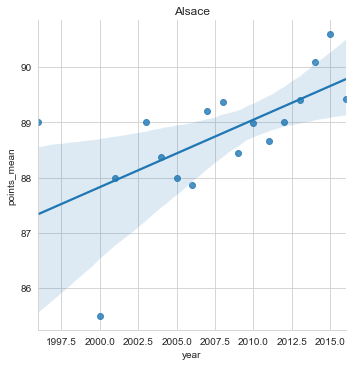

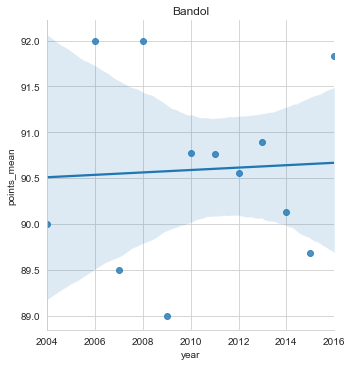

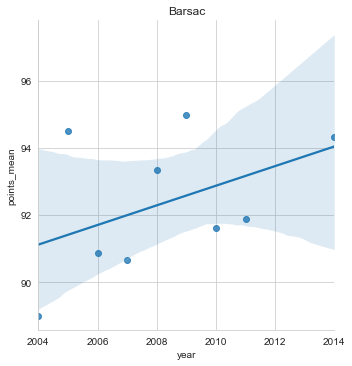

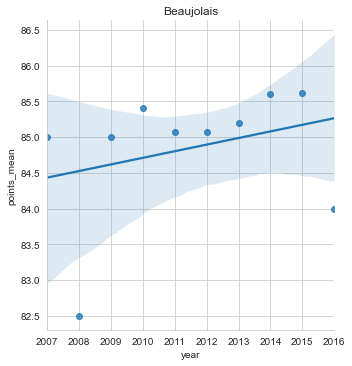

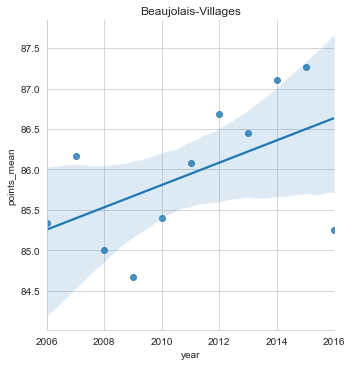

...

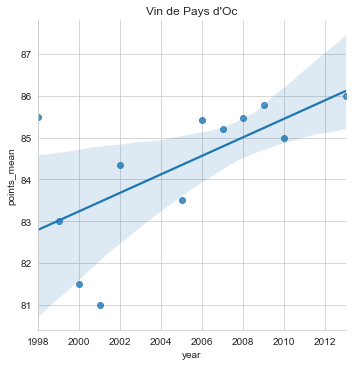

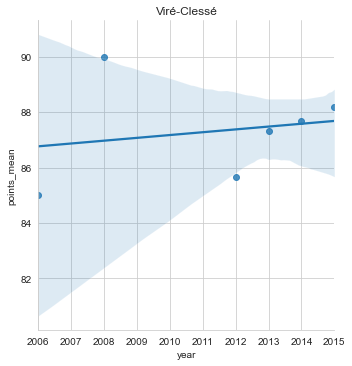

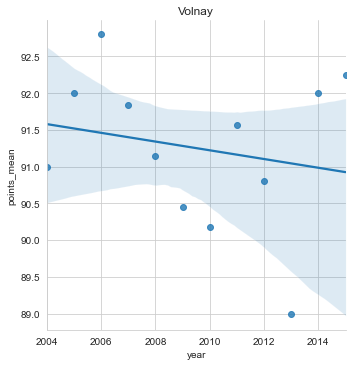

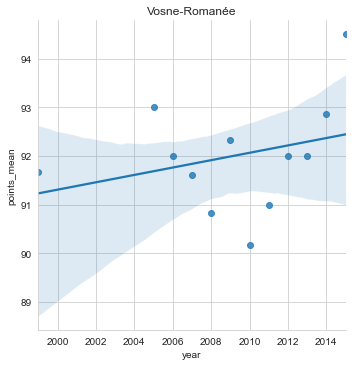

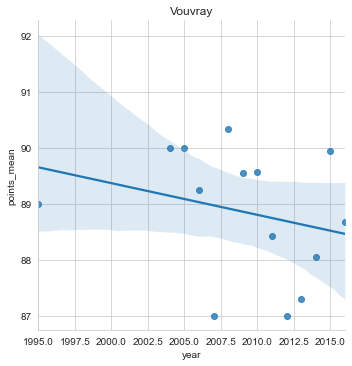

In [45]:
# groupby per region, get the years and the points
points_year_per_region = france_points.groupby(['region_1','years'])['years','points'].agg(['count','min','max', 'mean']).reset_index().set_index('region_1')
# perform regression on years and price on that region ( use the mean for years and mean for price)

france_list_region = list(points_year_per_region.index.unique())

for region in france_list_region: # make this as a function. 
    print(f'====FOR REGION {region}=====')
    regression_on_points(region,points_year_per_region)

## Italy: Region and points Distribution

Shape of France DataSet:  (18531, 15)
count     379.000000
mean       48.894459
std       160.409313
min         1.000000
25%         3.000000
50%         8.000000
75%        26.000000
max      1599.000000
Name: region_1, dtype: float64


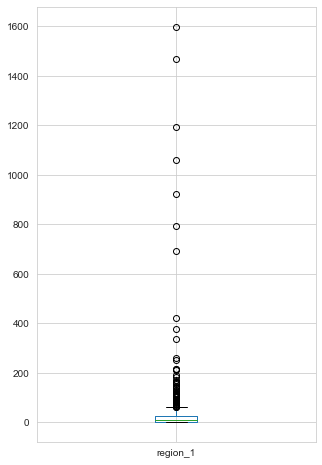

In [46]:
italy_points = final_data[final_data['country'] == 'Italy']
print('Shape of France DataSet: ', italy_points.shape)
count_italy_points = pd.DataFrame(italy_points.groupby('region_1')['region_1'].count())
print(count_italy_points['region_1'].describe())

boxplot_italy = count_italy_points.boxplot(column = 'region_1', figsize = (5,8))

Remarks: 75 percentile and above will considered in the regression 

====FOR REGION Aglianico del Vulture=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.201
Model:                            OLS   Adj. R-squared:                  0.134
Method:                 Least Squares   F-statistic:                     3.020
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.108
Time:                        14:52:57   Log-Likelihood:                -18.424
No. Observations:                  14   AIC:                             40.85
Df Residuals:                      12   BIC:                             42.13
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const     

Text(0.5, 1.0, 'Alto Adige Valle Isarco')
====FOR REGION Amarone della Valpolicella=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.213
Model:                            OLS   Adj. R-squared:                  0.147
Method:                 Least Squares   F-statistic:                     3.243
Date:                Wed, 10 Jun 2020   Prob (F-statistic):             0.0969
Time:                        14:52:58   Log-Likelihood:                -20.508
No. Observations:                  14   AIC:                             45.02
Df Residuals:                      12   BIC:                             46.29
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------

Text(0.5, 1.0, "Barbera d'Alba")
====FOR REGION Barbera d'Alba Superiore=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.318
Model:                            OLS   Adj. R-squared:                  0.242
Method:                 Least Squares   F-statistic:                     4.192
Date:                Wed, 10 Jun 2020   Prob (F-statistic):             0.0709
Time:                        14:52:59   Log-Likelihood:                -17.752
No. Observations:                  11   AIC:                             39.50
Df Residuals:                       9   BIC:                             40.30
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------

Text(0.5, 1.0, 'Barolo')
====FOR REGION Bolgheri=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                 -0.058
Method:                 Least Squares   F-statistic:                   0.01767
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.896
Time:                        14:53:00   Log-Likelihood:                -38.507
No. Observations:                  19   AIC:                             81.01
Df Residuals:                      17   BIC:                             82.90
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.271
Model:                            OLS   Adj. R-squared:                  0.190
Method:                 Least Squares   F-statistic:                     3.347
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.101
Time:                        14:53:01   Log-Likelihood:                -14.686
No. Observations:                  11   AIC:                             33.37
Df Residuals:                       9   BIC:                             34.17
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       -141.3203    125.168     -1.129      0.2

Text(0.5, 1.0, 'Chianti Classico')
====FOR REGION Chianti Colli Senesi=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                 -0.096
Method:                 Least Squares   F-statistic:                   0.03263
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.860
Time:                        14:53:02   Log-Likelihood:                -17.420
No. Observations:                  12   AIC:                             38.84
Df Residuals:                      10   BIC:                             39.81
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------

Text(0.5, 1.0, 'Colli della Toscana Centrale')
====FOR REGION Collio=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.188
Model:                            OLS   Adj. R-squared:                  0.134
Method:                 Least Squares   F-statistic:                     3.480
Date:                Wed, 10 Jun 2020   Prob (F-statistic):             0.0818
Time:                        14:53:03   Log-Likelihood:                -26.008
No. Observations:                  17   AIC:                             56.02
Df Residuals:                      15   BIC:                             57.68
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------

Text(0.5, 1.0, 'Delle Venezie')
====FOR REGION Dolcetto d'Alba=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.635
Model:                            OLS   Adj. R-squared:                  0.604
Method:                 Least Squares   F-statistic:                     20.86
Date:                Wed, 10 Jun 2020   Prob (F-statistic):           0.000647
Time:                        14:53:04   Log-Likelihood:                -17.499
No. Observations:                  14   AIC:                             39.00
Df Residuals:                      12   BIC:                             40.28
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------

Text(0.5, 1.0, 'Franciacorta')
====FOR REGION Friuli Colli Orientali=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.893
Model:                            OLS   Adj. R-squared:                  0.857
Method:                 Least Squares   F-statistic:                     25.03
Date:                Wed, 10 Jun 2020   Prob (F-statistic):             0.0154
Time:                        14:53:05   Log-Likelihood:                -3.4223
No. Observations:                   5   AIC:                             10.84
Df Residuals:                       3   BIC:                             10.06
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------

Text(0.5, 1.0, 'Gattinara')
====FOR REGION Gavi=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.248
Model:                            OLS   Adj. R-squared:                  0.180
Method:                 Least Squares   F-statistic:                     3.633
Date:                Wed, 10 Jun 2020   Prob (F-statistic):             0.0831
Time:                        14:53:06   Log-Likelihood:                -16.782
No. Observations:                  13   AIC:                             37.56
Df Residuals:                      11   BIC:                             38.69
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------

Text(0.5, 1.0, 'Isola dei Nuraghi')
====FOR REGION Isonzo del Friuli=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.333
Model:                            OLS   Adj. R-squared:                  0.259
Method:                 Least Squares   F-statistic:                     4.501
Date:                Wed, 10 Jun 2020   Prob (F-statistic):             0.0629
Time:                        14:53:07   Log-Likelihood:                -16.520
No. Observations:                  11   AIC:                             37.04
Df Residuals:                       9   BIC:                             37.84
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.066
Model:                            OLS   Adj. R-squared:                 -0.037
Method:                 Least Squares   F-statistic:                    0.6407
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.444
Time:                        14:53:08   Log-Likelihood:                -23.035
No. Observations:                  11   AIC:                             50.07
Df Residuals:                       9   BIC:                             50.86
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        374.1296    358.163      1.045      0.3

Text(0.5, 1.0, 'Montecucco')
====FOR REGION Montefalco Rosso=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.211
Model:                            OLS   Adj. R-squared:                  0.123
Method:                 Least Squares   F-statistic:                     2.404
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.155
Time:                        14:53:09   Log-Likelihood:                -17.962
No. Observations:                  11   AIC:                             39.92
Df Residuals:                       9   BIC:                             40.72
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------

Text(0.5, 1.0, 'Morellino di Scansano')
====FOR REGION Moscato d'Asti=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.005
Model:                            OLS   Adj. R-squared:                 -0.095
Method:                 Least Squares   F-statistic:                   0.04930
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.829
Time:                        14:53:10   Log-Likelihood:                -25.515
No. Observations:                  12   AIC:                             55.03
Df Residuals:                      10   BIC:                             56.00
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------

Text(0.5, 1.0, 'Primitivo di Manduria')
====FOR REGION Prosecco=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.019
Model:                            OLS   Adj. R-squared:                 -0.121
Method:                 Least Squares   F-statistic:                    0.1359
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.723
Time:                        14:53:10   Log-Likelihood:                -16.800
No. Observations:                   9   AIC:                             37.60
Df Residuals:                       7   BIC:                             37.99
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

Text(0.5, 1.0, 'Roero')
====FOR REGION Romagna=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.595
Model:                            OLS   Adj. R-squared:                  0.514
Method:                 Least Squares   F-statistic:                     7.350
Date:                Wed, 10 Jun 2020   Prob (F-statistic):             0.0422
Time:                        14:53:11   Log-Likelihood:                -11.605
No. Observations:                   7   AIC:                             27.21
Df Residuals:                       5   BIC:                             27.10
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------


Text(0.5, 1.0, 'Sagrantino di Montefalco')
====FOR REGION Salento=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.053
Model:                            OLS   Adj. R-squared:                 -0.042
Method:                 Least Squares   F-statistic:                    0.5564
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.473
Time:                        14:53:12   Log-Likelihood:                -17.265
No. Observations:                  12   AIC:                             38.53
Df Residuals:                      10   BIC:                             39.50
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------

Text(0.5, 1.0, 'Sicilia')
====FOR REGION Soave=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.181
Model:                            OLS   Adj. R-squared:                  0.099
Method:                 Least Squares   F-statistic:                     2.213
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.168
Time:                        14:53:13   Log-Likelihood:                -21.144
No. Observations:                  12   AIC:                             46.29
Df Residuals:                      10   BIC:                             47.26
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------


Text(0.5, 1.0, 'Terre Siciliane')
====FOR REGION Terre del Volturno=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.138
Model:                            OLS   Adj. R-squared:                 -0.005
Method:                 Least Squares   F-statistic:                    0.9639
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.364
Time:                        14:53:14   Log-Likelihood:                -13.780
No. Observations:                   8   AIC:                             31.56
Df Residuals:                       6   BIC:                             31.72
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------

Text(0.5, 1.0, 'Trento')
====FOR REGION Umbria=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.345
Model:                            OLS   Adj. R-squared:                  0.285
Method:                 Least Squares   F-statistic:                     5.791
Date:                Wed, 10 Jun 2020   Prob (F-statistic):             0.0348
Time:                        14:53:15   Log-Likelihood:                -21.959
No. Observations:                  13   AIC:                             47.92
Df Residuals:                      11   BIC:                             49.05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------


                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.123
Model:                            OLS   Adj. R-squared:                  0.025
Method:                 Least Squares   F-statistic:                     1.259
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.291
Time:                        14:53:16   Log-Likelihood:                -23.802
No. Observations:                  11   AIC:                             51.60
Df Residuals:                       9   BIC:                             52.40
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       -263.9485    312.483     -0.845      0.4

strong multicollinearity or other numerical problems.
Text(0.5, 1.0, 'Valpolicella Superiore Ripasso')
====FOR REGION Valtellina Superiore=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.487
Model:                            OLS   Adj. R-squared:                  0.423
Method:                 Least Squares   F-statistic:                     7.606
Date:                Wed, 10 Jun 2020   Prob (F-statistic):             0.0248
Time:                        14:53:17   Log-Likelihood:                -14.274
No. Observations:                  10   AIC:                             32.55
Df Residuals:                       8   BIC:                             33.15
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025

Text(0.5, 1.0, 'Verdicchio dei Castelli di Jesi Classico')
====FOR REGION Verdicchio dei Castelli di Jesi Classico Superiore=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                 -0.089
Method:                 Least Squares   F-statistic:                   0.02058
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.889
Time:                        14:53:18   Log-Likelihood:                -27.458
No. Observations:                  13   AIC:                             58.92
Df Residuals:                      11   BIC:                             60.05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-

                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.297
Model:                            OLS   Adj. R-squared:                  0.243
Method:                 Least Squares   F-statistic:                     5.491
Date:                Wed, 10 Jun 2020   Prob (F-statistic):             0.0357
Time:                        14:53:19   Log-Likelihood:                -28.747
No. Observations:                  15   AIC:                             61.49
Df Residuals:                      13   BIC:                             62.91
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        573.3462    206.655      2.774      0.0

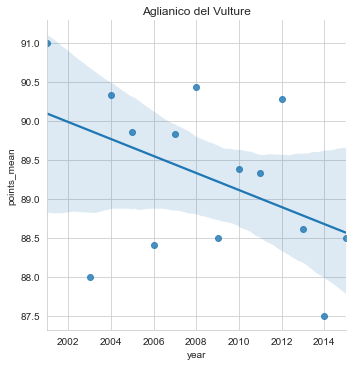

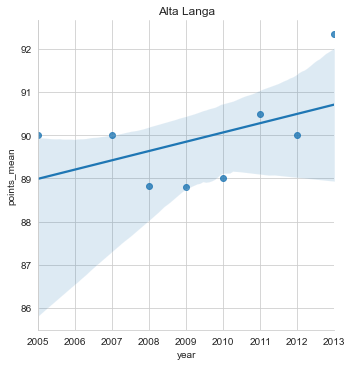

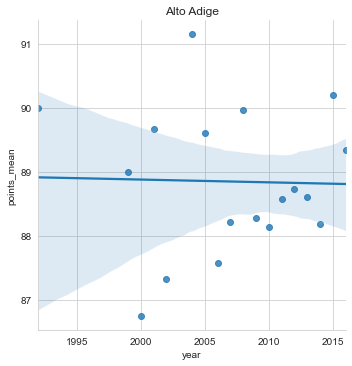

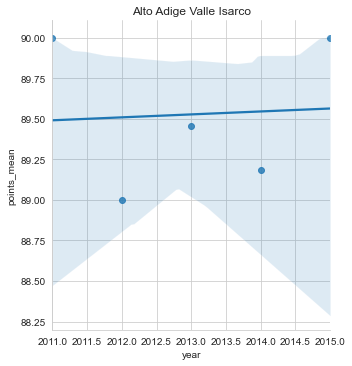

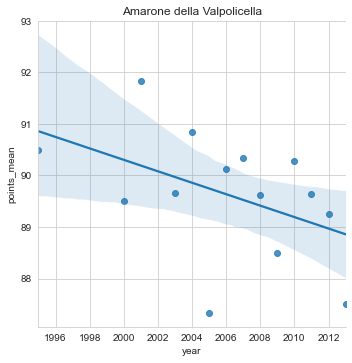

...

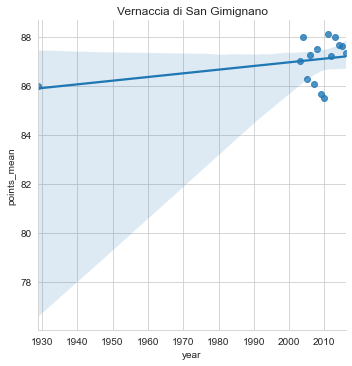

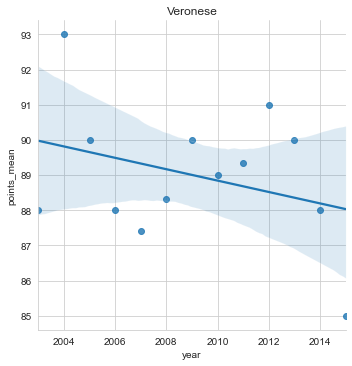

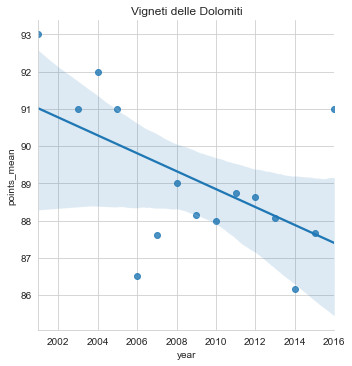

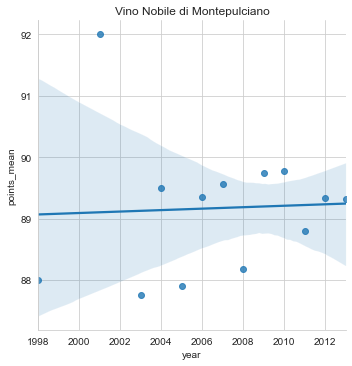

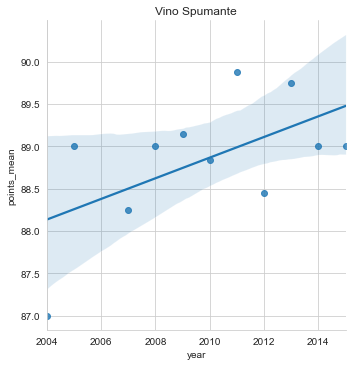

In [47]:
# get the region that got >= 9 and put it in a list 
italy_regions_list = count_italy_points[count_italy_points['region_1'] >= 26].index.tolist()
# filter the france dataset on that list 
italy_points = italy_points[italy_points['region_1'].isin(italy_regions_list)]

# groupby per region, get the years and the points
points_year_per_region = italy_points.groupby(['region_1','years'])['years','points'].agg(['count','min','max', 'mean']).reset_index().set_index('region_1')
# perform regression on years and price on that region ( use the mean for years and mean for price)

italy_list_region = list(points_year_per_region.index.unique())

for region in italy_list_region: # make this as a function. 
    print(f'====FOR REGION {region}=====')
    regression_on_points(region, points_year_per_region)


## Spain: Region and points Distribution

Shape of Spain DataSet:  (6134, 15)
count      80.00000
mean       76.67500
std       190.10988
min         1.00000
25%         4.00000
50%        11.50000
75%        71.50000
max      1466.00000
Name: region_1, dtype: float64


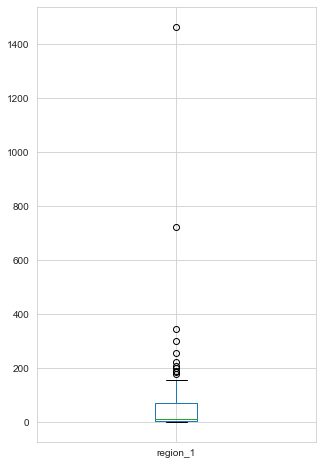

In [48]:
spain_points = final_data[final_data['country'] == 'Spain']
print('Shape of Spain DataSet: ', spain_points.shape)
count_spain_points = pd.DataFrame(spain_points.groupby('region_1')['region_1'].count())
print(count_spain_points['region_1'].describe())

boxplot_spain = count_spain_points.boxplot(column = 'region_1', figsize = (5,8))

====FOR REGION Alicante=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.465
Model:                            OLS   Adj. R-squared:                  0.424
Method:                 Least Squares   F-statistic:                     11.32
Date:                Wed, 10 Jun 2020   Prob (F-statistic):            0.00508
Time:                        14:53:39   Log-Likelihood:                -32.197
No. Observations:                  15   AIC:                             68.39
Df Residuals:                      13   BIC:                             69.81
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        899.7615  

Text(0.5, 1.0, 'Campo de Borja')
====FOR REGION Cariñena=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.122
Model:                            OLS   Adj. R-squared:                  0.063
Method:                 Least Squares   F-statistic:                     2.085
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.169
Time:                        14:53:40   Log-Likelihood:                -31.705
No. Observations:                  17   AIC:                             67.41
Df Residuals:                      15   BIC:                             69.08
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------

Text(0.5, 1.0, 'La Mancha')
====FOR REGION Montsant=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.233
Model:                            OLS   Adj. R-squared:                  0.157
Method:                 Least Squares   F-statistic:                     3.043
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.112
Time:                        14:53:41   Log-Likelihood:                -20.556
No. Observations:                  12   AIC:                             45.11
Df Residuals:                      10   BIC:                             46.08
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------

Text(0.5, 1.0, 'Priorat')
====FOR REGION Ribera del Duero=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.010
Model:                            OLS   Adj. R-squared:                 -0.052
Method:                 Least Squares   F-statistic:                    0.1632
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.692
Time:                        14:53:42   Log-Likelihood:                -41.154
No. Observations:                  18   AIC:                             86.31
Df Residuals:                      16   BIC:                             88.09
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------

Text(0.5, 1.0, 'Rías Baixas')
====FOR REGION Toro=====
                            OLS Regression Results                            
Dep. Variable:            points_mean   R-squared:                       0.073
Model:                            OLS   Adj. R-squared:                 -0.011
Method:                 Least Squares   F-statistic:                    0.8643
Date:                Wed, 10 Jun 2020   Prob (F-statistic):              0.372
Time:                        14:53:43   Log-Likelihood:                -25.456
No. Observations:                  13   AIC:                             54.91
Df Residuals:                      11   BIC:                             56.04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------

Text(0.5, 1.0, 'Vino de la Tierra de Castilla y León')


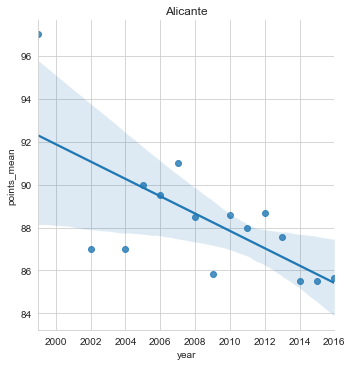

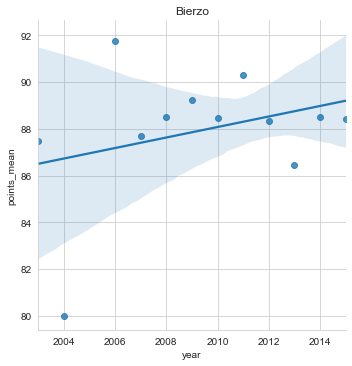

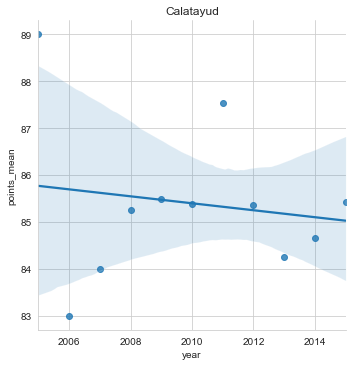

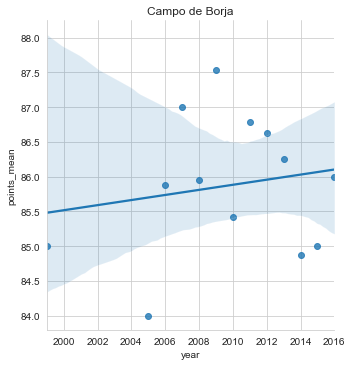

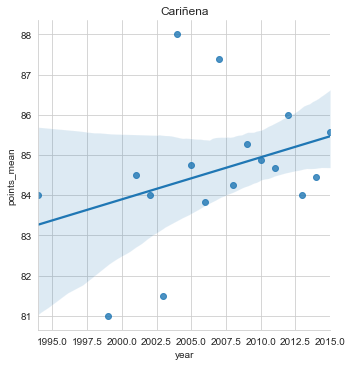

...

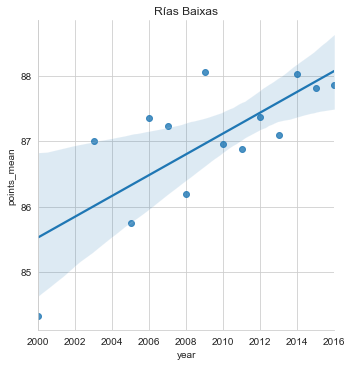

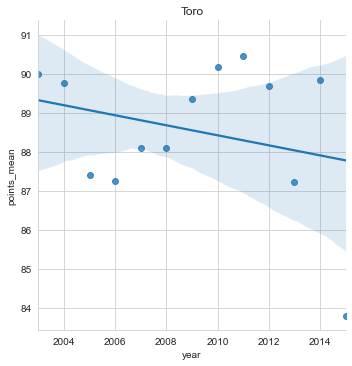

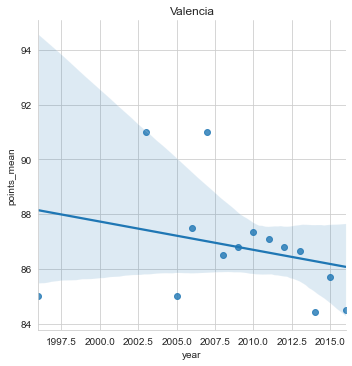

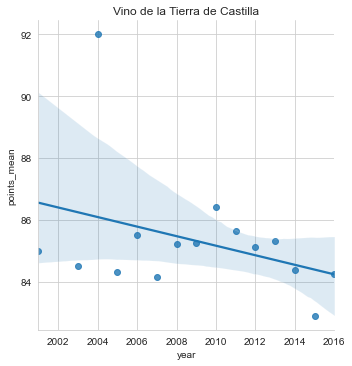

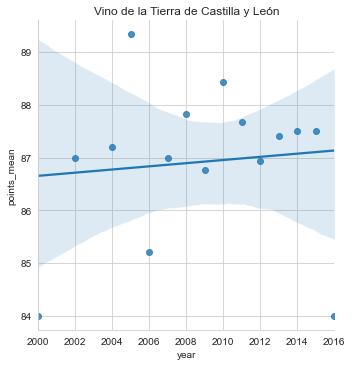

In [49]:
spain_regions_list = count_spain_points[count_spain_points['region_1'] >= 71].index.tolist()
# filter the france dataset on that list 
spain_points = spain_points[spain_points['region_1'].isin(spain_regions_list)]

# groupby per region, get the years and the price
points_year_per_region = spain_points.groupby(['region_1','years'])['years','points'].agg(['count','min','max', 'mean']).reset_index().set_index('region_1')
# perform regression on years and price on that region ( use the mean for years and mean for price)

spain_list_region = list(points_year_per_region.index.unique())

for region in spain_list_region: # make this as a function. 
    print(f'====FOR REGION {region}=====')
    regression_on_points(region, points_year_per_region)


# WITH GRAPE VARIETY

# France Regression on Price, Points and Year based on Grape Variety

#### The data I will use for this is the "data_price_df".

In [50]:
minimum_count_per_region = 10

In [51]:
# Analysis with variety included

# checking the distribution of the variety per region
france_var = data_price_df[data_price_df['country'] == 'France']
fran_variety_year_per_region = france_var.groupby(['region_1','variety'])['years'].agg(['count']) 

In [52]:
#check the distribution of the variety in each region 
fran_variety_year_per_region['count'].describe()#.loc[['Alsace','variety']].describe() # this is an example with the region 'Alsace' and from here I will check the distribution of the count per region

count    946.000000
mean      17.250529
std       54.811149
min        1.000000
25%        1.000000
50%        3.000000
75%        9.000000
max      648.000000
Name: count, dtype: float64

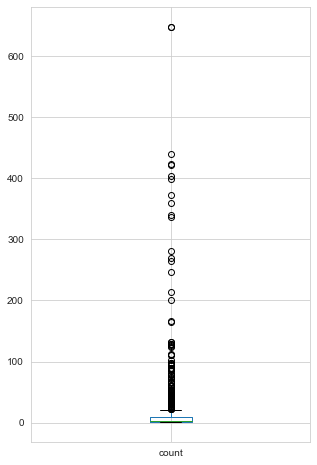

In [53]:
boxplot_france = fran_variety_year_per_region.boxplot(column = 'count', figsize = (5,8))

Remarks: 9 is very small for this very skewed distribution, therefore, I am going to set a manual threshold of 25 to filter out the regions that have very small records in each variety. 

In [54]:
fran_variety_year_per_region = fran_variety_year_per_region[fran_variety_year_per_region['count'] >= minimum_count_per_region].reset_index().set_index('region_1')

In [55]:
# snippet from the 1 region

fran_variety_year_per_region.loc['Alsace']

,variety,count
region_1,,
Alsace,Alsace white blend,47
Alsace,Gewürztraminer,424
Alsace,Muscat,29
Alsace,Pinot Blanc,132
Alsace,Pinot Gris,404
Alsace,Pinot Noir,90
Alsace,Riesling,647
Alsace,Sylvaner,33
Alsace,White Blend,26


In [56]:
# this function is going to apply regression based on years, price in each variety per region. 

def results_summary_to_dataframe(results):
    '''take the result of an statsmodel results table and transforms it into a dataframe'''
    #pvals = results.pvalues
    #print('pvals aaaaaaaaaaaaaaaaaaa:',pvals)
    pvals_cons = results.pvalues[0]
    print('pvals cons:',pvals_cons)
    pvals_year = results.pvalues[1]
    print('pvals year:',pvals_year)
    pvals_points = results.pvalues[2]
    print('pvals points:',pvals_points)
    coeff1 = results.params[1]
    coeff2 = results.params[2]
    print('The coeff1: ',coeff1)
    print('The coeff2: ',coeff2)
    #conf_lower = results.conf_int()[0]
    #conf_higher = results.conf_int()[1]
    r = results.rsquared
    print('the R', r)

    results_df = pd.DataFrame({#"p-value_cons":pvals_cons,
                               "p-value-year":pvals_year,
                               "p-value-points":pvals_points,
                               "coefficient_years":coeff1,
                               "coefficient_points":coeff2,
                               #"conf_lower":conf_lower,
                               #"conf_higher":conf_higher,
                               "R-squared":r
                                },index=[0])

    #Reordering...
    results_df = results_df[["coefficient_years","coefficient_points","p-value-year","p-value-points","R-squared"]] # ,"conf_lower","conf_higher"
    return results_df



def show_plot(country_df,region,list_var):
    '''This function shows the plot and get the p-value, and R-squared'''
    varieties = list_var
    print(varieties)
    df = country_df[(country_df['region_1'] == str(region))&(country_df['variety'].isin(varieties))]
    df = df.groupby(['region_1','variety','years'])['years','price', 'points'].agg(['count', 'mean']).reset_index().set_index('region_1')
    df.reset_index(inplace = True)
    df.columns = df.columns.get_level_values(0)
    #print('11111111111111111111111111')
    #display(df)
    df.columns = ['region', 'variety','year','year_count','year_mean','price_count','price_mean', 'points_count','points_mean']
    #print('222222222222222222222222222')
    #display(df)
    #print(f'The whole dataframe of{}')
    #display(df)
    # filter the dataframe per variety using a for loop 
    final_df = pd.DataFrame({'region':[],'grape_variety':[], 'coefficient_years':[],'coefficient_points':[],'p-value-year':[],'p-value-points':[],'R-squared':[]}) # , 'conf_low':[], 'conf_high':[]
    for var in varieties:
        # print('vaaaaaaaaaar',var)
        variety_df = df[df['variety'] == str(var)] # this will filter the dataframe per variety per region
        # print('The Variety DF=======================')
        # print('VARIETY SHAPE:',variety_df.shape)
        display(variety_df)
        print('++++++++++++++++++++++++++++++++++++++++')
        # if variety_df has more rows.
        if variety_df.shape[0] > 3:
            # print(sns.lmplot(x='year', y='price_mean', data=variety_df, size = 8)) #
            plt.subplots_adjust(hspace = 0.5)
            plt.legend()
            X = variety_df[['year', 'points_mean']] # independent
            Y = variety_df['price_mean'] # dependent variable
            x = sm.add_constant(X)
            model = sm.OLS(Y,x)
            results = model.fit()
            #print(results.summary())
            # print('Printing parameters')
            #print(results.params)
            ax = plt.gca()
            ax.set_title(f"{region},{var}")
            results_df = results_summary_to_dataframe(results)
            # print('##############################')
            #display(results_df)
            for index, row in results_df.iterrows():
                p_value_year = row['p-value-year']
                p_value_points = row['p-value-points']
                r_squared = row['R-squared']
                coeff_year = row['coefficient_years']
                coeff_points = row['coefficient_points']
                #conf_low = row['conf_lower']
                #conf_high = row['conf_higher']
                final_df = final_df.append({'region':region,'grape_variety':var,'coefficient_years':coeff_year,'coefficient_points':coeff_points, 'p-value-year':p_value_year,
                                            'p-value-points':p_value_points,'R-squared':r_squared},ignore_index = True) #, 'conf_low':conf_low, 'conf_high':conf_high
        else:
            # print('ARRRRGGGGGG')
            continue

    return final_df

['Chardonnay']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Montagny,Chardonnay,2007.0,1,2007.0,1,30.000000,1,89.000000
1,Montagny,Chardonnay,2008.0,1,2008.0,1,23.000000,1,87.000000
2,Montagny,Chardonnay,2009.0,3,2009.0,3,25.000000,3,87.666667
3,Montagny,Chardonnay,2010.0,6,2010.0,6,28.333333,6,88.833333
4,Montagny,Chardonnay,2011.0,2,2011.0,2,24.500000,2,86.500000
5,Montagny,Chardonnay,2012.0,2,2012.0,2,22.000000,2,86.000000
6,Montagny,Chardonnay,2013.0,5,2013.0,5,27.600000,5,86.800000
7,Montagny,Chardonnay,2014.0,7,2014.0,7,28.428571,7,88.285714
8,Montagny,Chardonnay,2015.0,3,2015.0,3,33.000000,3,87.666667


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.026652577496443213
pvals year: 0.03865099784329229
pvals points: 0.008917912852497049
The coeff1:  0.7320880968864849
The coeff2:  2.775658014791005
the R 0.7428809621727936
['Bordeaux-style Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Buzet,Bordeaux-style Red Blend,2005.0,2,2005.0,2,19.5,2,88.50
1,Buzet,Bordeaux-style Red Blend,2009.0,1,2009.0,1,14.0,1,88.00
2,Buzet,Bordeaux-style Red Blend,2011.0,4,2011.0,4,15.5,4,86.75
3,Buzet,Bordeaux-style Red Blend,2012.0,1,2012.0,1,15.0,1,87.00
4,Buzet,Bordeaux-style Red Blend,2014.0,3,2014.0,3,16.0,3,88.00


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.5981293623062338
pvals year: 0.5221207318524839
pvals points: 0.6821549136901637
The coeff1:  -0.28963414634148066
The coeff2:  0.8231707317071306
the R 0.4566637630662056
['Bordeaux-style Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Saint-Julien,Bordeaux-style Red Blend,2000.0,2,2000.0,2,45.000000,2,93.000000
1,Saint-Julien,Bordeaux-style Red Blend,2001.0,5,2001.0,5,63.600000,5,93.800000
2,Saint-Julien,Bordeaux-style Red Blend,2003.0,2,2003.0,2,127.500000,2,92.500000
3,Saint-Julien,Bordeaux-style Red Blend,2004.0,1,2004.0,1,70.000000,1,94.000000
4,Saint-Julien,Bordeaux-style Red Blend,2005.0,2,2005.0,2,75.000000,2,94.500000
5,Saint-Julien,Bordeaux-style Red Blend,2007.0,9,2007.0,9,52.777778,9,91.000000
6,Saint-Julien,Bordeaux-style Red Blend,2008.0,5,2008.0,5,80.200000,5,91.200000
7,Saint-Julien,Bordeaux-style Red Blend,2009.0,6,2009.0,6,150.500000,6,94.333333
8,Saint-Julien,Bordeaux-style Red Blend,2010.0,7,2010.0,7,145.857143,7,95.142857
9,Saint-Julien,Bordeaux-style Red Blend,2011.0,3,2011.0,3,141.666667,3,95.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.33811615809615625
pvals year: 0.5158593541518742
pvals points: 0.06790812450706214
The coeff1:  1.2894856924487894
The coeff2:  14.591810959216328
the R 0.30495190025217356
['Chardonnay']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Pouilly-Loché,Chardonnay,2012.0,2,2012.0,2,38.500000,2,86.000000
1,Pouilly-Loché,Chardonnay,2013.0,2,2013.0,2,35.500000,2,87.000000
2,Pouilly-Loché,Chardonnay,2014.0,7,2014.0,7,34.285714,7,88.571429
3,Pouilly-Loché,Chardonnay,2015.0,5,2015.0,5,30.400000,5,88.800000
4,Pouilly-Loché,Chardonnay,2016.0,1,2016.0,1,25.000000,1,89.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.006099653536981757
pvals year: 0.006501549390786172
pvals points: 0.03787851742751387
The coeff1:  -5.178146906431563
The coeff2:  2.523265264657047
the R 0.9962166540814645
['Bordeaux-style Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Saint-Émilion,Bordeaux-style Red Blend,1996.0,1,1996.0,1,35.000000,1,86.000000
1,Saint-Émilion,Bordeaux-style Red Blend,1997.0,1,1997.0,1,20.000000,1,84.000000
2,Saint-Émilion,Bordeaux-style Red Blend,1998.0,1,1998.0,1,20.000000,1,86.000000
3,Saint-Émilion,Bordeaux-style Red Blend,2000.0,8,2000.0,8,80.250000,8,91.625000
4,Saint-Émilion,Bordeaux-style Red Blend,2001.0,1,2001.0,1,15.000000,1,86.000000
5,Saint-Émilion,Bordeaux-style Red Blend,2003.0,2,2003.0,2,39.500000,2,87.000000
6,Saint-Émilion,Bordeaux-style Red Blend,2004.0,1,2004.0,1,84.000000,1,86.000000
7,Saint-Émilion,Bordeaux-style Red Blend,2005.0,8,2005.0,8,75.625000,8,90.125000
8,Saint-Émilion,Bordeaux-style Red Blend,2006.0,13,2006.0,13,51.769231,13,89.000000
9,Saint-Émilion,Bordeaux-style Red Blend,2007.0,18,2007.0,18,93.277778,18,88.944444


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.8324300019507475
pvals year: 0.5623278829405635
pvals points: 0.002771578818273422
The coeff1:  -0.6983455057961945
The coeff2:  11.103141427108355
the R 0.49022258390419093
['Gamay']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Beaujolais-Villages,Gamay,2006.0,1,2006.0,1,15.000000,1,82.000000
1,Beaujolais-Villages,Gamay,2007.0,2,2007.0,2,15.000000,2,88.000000
2,Beaujolais-Villages,Gamay,2008.0,1,2008.0,1,11.000000,1,84.000000
3,Beaujolais-Villages,Gamay,2009.0,5,2009.0,5,12.000000,5,84.400000
4,Beaujolais-Villages,Gamay,2010.0,5,2010.0,5,13.600000,5,85.400000
5,Beaujolais-Villages,Gamay,2011.0,9,2011.0,9,12.444444,9,86.222222
6,Beaujolais-Villages,Gamay,2012.0,13,2012.0,13,15.307692,13,86.923077
7,Beaujolais-Villages,Gamay,2013.0,34,2013.0,34,15.794118,34,86.647059
8,Beaujolais-Villages,Gamay,2014.0,42,2014.0,42,15.380952,42,87.523810
9,Beaujolais-Villages,Gamay,2015.0,50,2015.0,50,16.000000,50,87.340000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.5601258219946288
pvals year: 0.6047400153095679
pvals points: 0.3064093333875647
The coeff1:  0.09623728942208842
The coeff2:  0.3593767456669922
the R 0.2587453671412895
['Chardonnay']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Limoux,Chardonnay,2005.0,1,2005.0,1,21.0,1,92
1,Limoux,Chardonnay,2006.0,1,2006.0,1,27.0,1,90
2,Limoux,Chardonnay,2007.0,1,2007.0,1,10.0,1,85
3,Limoux,Chardonnay,2008.0,1,2008.0,1,20.0,1,89
4,Limoux,Chardonnay,2009.0,1,2009.0,1,17.0,1,89
5,Limoux,Chardonnay,2010.0,1,2010.0,1,20.0,1,90
6,Limoux,Chardonnay,2011.0,1,2011.0,1,80.0,1,91
7,Limoux,Chardonnay,2012.0,1,2012.0,1,30.0,1,90
8,Limoux,Chardonnay,2013.0,1,2013.0,1,40.0,1,90
9,Limoux,Chardonnay,2015.0,1,2015.0,1,18.0,1,90


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.46030021137455046
pvals year: 0.5163060956841428
pvals points: 0.24583389526351132
The coeff1:  1.4031660736330345
The coeff2:  4.533439837339542
the R 0.25205016286914483
['Bordeaux-style Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Montagne-Saint-Émilion,Bordeaux-style Red Blend,1997.0,1,1997.0,1,15.000000,1,83.0
1,Montagne-Saint-Émilion,Bordeaux-style Red Blend,2003.0,1,2003.0,1,40.000000,1,88.0
2,Montagne-Saint-Émilion,Bordeaux-style Red Blend,2006.0,1,2006.0,1,25.000000,1,88.0
3,Montagne-Saint-Émilion,Bordeaux-style Red Blend,2009.0,5,2009.0,5,21.400000,5,88.0
4,Montagne-Saint-Émilion,Bordeaux-style Red Blend,2010.0,3,2010.0,3,23.333333,3,89.0
5,Montagne-Saint-Émilion,Bordeaux-style Red Blend,2011.0,4,2011.0,4,19.000000,4,86.0
6,Montagne-Saint-Émilion,Bordeaux-style Red Blend,2012.0,5,2012.0,5,24.600000,5,88.4
7,Montagne-Saint-Émilion,Bordeaux-style Red Blend,2013.0,4,2013.0,4,28.500000,4,86.5
8,Montagne-Saint-Émilion,Bordeaux-style Red Blend,2014.0,5,2014.0,5,28.800000,5,88.2
9,Montagne-Saint-Émilion,Bordeaux-style Red Blend,2015.0,1,2015.0,1,16.000000,1,90.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.5210385852201321
pvals year: 0.48695978289735764
pvals points: 0.3295161389027623
The coeff1:  -0.4523100396009886
The coeff2:  1.852456202785874
the R 0.13581972146396504
['Chardonnay']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Chablis,Chardonnay,1997.0,1,1997.0,1,85.000000,1,92.000000
1,Chablis,Chardonnay,2004.0,1,2004.0,1,95.000000,1,92.000000
2,Chablis,Chardonnay,2005.0,34,2005.0,34,47.411765,34,90.941176
3,Chablis,Chardonnay,2006.0,41,2006.0,41,54.853659,41,90.634146
4,Chablis,Chardonnay,2007.0,8,2007.0,8,52.250000,8,88.750000
5,Chablis,Chardonnay,2008.0,26,2008.0,26,43.961538,26,90.269231
6,Chablis,Chardonnay,2009.0,21,2009.0,21,64.095238,21,91.571429
7,Chablis,Chardonnay,2010.0,52,2010.0,52,43.057692,52,89.576923
8,Chablis,Chardonnay,2011.0,26,2011.0,26,50.923077,26,89.307692
9,Chablis,Chardonnay,2012.0,40,2012.0,40,43.800000,40,90.675000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.028550529981453705
pvals year: 0.007764753583428536
pvals points: 0.011750333023887245
The coeff1:  -1.9473546698894637
The coeff2:  7.175186206499841
the R 0.7662115617770173
['Chardonnay', 'Pinot Noir']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Pernand-Vergelesses,Chardonnay,2007.0,1,2007.0,1,60.000000,1,91.000000
1,Pernand-Vergelesses,Chardonnay,2010.0,2,2010.0,2,46.500000,2,91.500000
2,Pernand-Vergelesses,Chardonnay,2011.0,2,2011.0,2,50.000000,2,91.000000
3,Pernand-Vergelesses,Chardonnay,2012.0,4,2012.0,4,60.250000,4,88.500000
4,Pernand-Vergelesses,Chardonnay,2013.0,2,2013.0,2,47.500000,2,90.500000
5,Pernand-Vergelesses,Chardonnay,2014.0,3,2014.0,3,43.666667,3,90.666667
6,Pernand-Vergelesses,Chardonnay,2015.0,6,2015.0,6,58.500000,6,91.666667


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.5461072803380619
pvals year: 0.6010854684432352
pvals points: 0.536104320950728
The coeff1:  -0.6818227822478811
The coeff2:  -2.08014408545759
the R 0.1569138603816056


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
7,Pernand-Vergelesses,Pinot Noir,1998.0,1,1998.0,1,33.0,1,92.0
8,Pernand-Vergelesses,Pinot Noir,2005.0,1,2005.0,1,65.0,1,92.0
9,Pernand-Vergelesses,Pinot Noir,2006.0,1,2006.0,1,53.0,1,94.0
10,Pernand-Vergelesses,Pinot Noir,2009.0,1,2009.0,1,50.0,1,92.0
11,Pernand-Vergelesses,Pinot Noir,2010.0,2,2010.0,2,40.0,2,90.5
12,Pernand-Vergelesses,Pinot Noir,2011.0,2,2011.0,2,40.0,2,88.5
13,Pernand-Vergelesses,Pinot Noir,2013.0,2,2013.0,2,50.5,2,90.0
14,Pernand-Vergelesses,Pinot Noir,2014.0,1,2014.0,1,65.0,1,90.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.13808068611175978
pvals year: 0.14054027996270002
pvals points: 0.2125456823820695
The coeff1:  1.726972654211389
The coeff2:  4.2763542427720775
the R 0.39529132166063174
['Chardonnay', 'Pinot Noir']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Bourgogne Hautes Côtes de Nuits,Chardonnay,2006.0,2,2006.0,2,43.50,2,87.00
1,Bourgogne Hautes Côtes de Nuits,Chardonnay,2010.0,1,2010.0,1,23.00,1,88.00
2,Bourgogne Hautes Côtes de Nuits,Chardonnay,2012.0,1,2012.0,1,27.00,1,88.00
3,Bourgogne Hautes Côtes de Nuits,Chardonnay,2014.0,2,2014.0,2,35.00,2,86.50
4,Bourgogne Hautes Côtes de Nuits,Chardonnay,2015.0,4,2015.0,4,35.25,4,86.75


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.11220573294044771
pvals year: 0.16406619817207735
pvals points: 0.07096121263273819
The coeff1:  -1.260706638115558
The coeff2:  -10.516059957173272
the R 0.8745307973296345


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
5,Bourgogne Hautes Côtes de Nuits,Pinot Noir,2007.0,1,2007.0,1,47.000000,1,86.000000
6,Bourgogne Hautes Côtes de Nuits,Pinot Noir,2010.0,1,2010.0,1,20.000000,1,85.000000
7,Bourgogne Hautes Côtes de Nuits,Pinot Noir,2011.0,4,2011.0,4,21.500000,4,85.750000
8,Bourgogne Hautes Côtes de Nuits,Pinot Noir,2012.0,3,2012.0,3,32.000000,3,85.333333
9,Bourgogne Hautes Côtes de Nuits,Pinot Noir,2013.0,1,2013.0,1,28.000000,1,84.000000
10,Bourgogne Hautes Côtes de Nuits,Pinot Noir,2014.0,2,2014.0,2,26.500000,2,86.000000
11,Bourgogne Hautes Côtes de Nuits,Pinot Noir,2015.0,3,2015.0,3,23.666667,3,87.333333


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.19514216835757003
pvals year: 0.19285818982454872
pvals points: 0.6917152622900711
The coeff1:  -2.144107747923317
The coeff2:  1.5312036082181404
the R 0.3803874239080649
['Bordeaux-style Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Francs Côtes de Bordeaux,Bordeaux-style Red Blend,2010.0,3,2010.0,3,26.666667,3,89.000000
1,Francs Côtes de Bordeaux,Bordeaux-style Red Blend,2012.0,4,2012.0,4,20.750000,4,87.250000
2,Francs Côtes de Bordeaux,Bordeaux-style Red Blend,2013.0,2,2013.0,2,16.000000,2,84.000000
3,Francs Côtes de Bordeaux,Bordeaux-style Red Blend,2014.0,7,2014.0,7,23.000000,7,88.285714
4,Francs Côtes de Bordeaux,Bordeaux-style Red Blend,2015.0,1,2015.0,1,19.000000,1,88.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.15150714432313128
pvals year: 0.1355991662946303
pvals points: 0.05732608923904224
The coeff1:  -0.9772121008380297
The coeff2:  1.582123280635611
the R 0.9288857537363874
['Rosé']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Luberon,Rosé,2010.0,2,2010.0,2,14.000000,2,86.500000
1,Luberon,Rosé,2014.0,3,2014.0,3,13.333333,3,87.000000
2,Luberon,Rosé,2015.0,3,2015.0,3,14.000000,3,86.666667
3,Luberon,Rosé,2016.0,2,2016.0,2,19.000000,2,89.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.8680694547012404
pvals year: 0.7296043546218147
pvals points: 0.1819362924945774
The coeff1:  -0.14016963203877364
The coeff2:  1.9753204515018226
the R 0.9432003890826395
['Provence red blend', 'Rhône-style Red Blend', 'Rosé']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Bandol,Provence red blend,2012.0,2,2012.0,2,52.000000,2,93.5
1,Bandol,Provence red blend,2013.0,5,2013.0,5,33.000000,5,92.4
2,Bandol,Provence red blend,2014.0,7,2014.0,7,30.428571,7,91.0


++++++++++++++++++++++++++++++++++++++++


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
3,Bandol,Rhône-style Red Blend,2006.0,1,2006.0,1,36.00,1,91.0
4,Bandol,Rhône-style Red Blend,2008.0,2,2008.0,2,40.00,2,92.0
5,Bandol,Rhône-style Red Blend,2009.0,1,2009.0,1,22.00,1,88.0
6,Bandol,Rhône-style Red Blend,2010.0,5,2010.0,5,34.60,5,89.8
7,Bandol,Rhône-style Red Blend,2011.0,4,2011.0,4,38.75,4,93.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.775837629303266
pvals year: 0.6919931742023421
pvals points: 0.07803431961856626
The coeff1:  -0.47075053197237704
The coeff2:  3.4212229956360156
the R 0.8501510633144137


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
8,Bandol,Rosé,2009.0,3,2009.0,3,28.666667,3,88.333333
9,Bandol,Rosé,2010.0,1,2010.0,1,21.000000,1,87.000000
10,Bandol,Rosé,2011.0,3,2011.0,3,33.000000,3,91.333333
11,Bandol,Rosé,2012.0,4,2012.0,4,27.250000,4,89.000000
12,Bandol,Rosé,2013.0,1,2013.0,1,22.000000,1,90.000000
13,Bandol,Rosé,2014.0,4,2014.0,4,25.500000,4,88.500000
14,Bandol,Rosé,2015.0,14,2015.0,14,28.785714,14,89.500000
15,Bandol,Rosé,2016.0,6,2016.0,6,29.666667,6,91.833333


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.5108464895518037
pvals year: 0.4560489228766217
pvals points: 0.08438123491382284
The coeff1:  -0.5009455859333336
The coeff2:  2.042644089727782
the R 0.48918731010851846
['Pinot Noir']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Chambolle-Musigny,Pinot Noir,1999.0,2,1999.0,2,51.500000,2,88.000000
1,Chambolle-Musigny,Pinot Noir,2005.0,3,2005.0,3,82.333333,3,93.666667
2,Chambolle-Musigny,Pinot Noir,2006.0,1,2006.0,1,75.000000,1,85.000000
3,Chambolle-Musigny,Pinot Noir,2007.0,1,2007.0,1,85.000000,1,90.000000
4,Chambolle-Musigny,Pinot Noir,2008.0,4,2008.0,4,128.000000,4,90.000000
5,Chambolle-Musigny,Pinot Noir,2009.0,6,2009.0,6,94.000000,6,89.666667
6,Chambolle-Musigny,Pinot Noir,2010.0,8,2010.0,8,103.750000,8,90.500000
7,Chambolle-Musigny,Pinot Noir,2011.0,6,2011.0,6,107.166667,6,90.500000
8,Chambolle-Musigny,Pinot Noir,2012.0,4,2012.0,4,98.750000,4,90.250000
9,Chambolle-Musigny,Pinot Noir,2013.0,3,2013.0,3,104.000000,3,90.666667


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.005548570788368074
pvals year: 0.006699166993648625
pvals points: 0.46616851192785036
The coeff1:  4.067578258891128
The coeff2:  1.7186053813850641
the R 0.6914230396616683
['Pinot Noir-Gamay']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Coteaux Bourguignons,Pinot Noir-Gamay,2013.0,1,2013.0,1,14.000000,1,84.000000
1,Coteaux Bourguignons,Pinot Noir-Gamay,2014.0,6,2014.0,6,15.000000,6,84.833333
2,Coteaux Bourguignons,Pinot Noir-Gamay,2015.0,3,2015.0,3,15.666667,3,85.000000


++++++++++++++++++++++++++++++++++++++++
['Bordeaux-style Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Côtes de Bourg,Bordeaux-style Red Blend,2005.0,1,2005.0,1,13.000000,1,82.000000
1,Côtes de Bourg,Bordeaux-style Red Blend,2006.0,1,2006.0,1,20.000000,1,89.000000
2,Côtes de Bourg,Bordeaux-style Red Blend,2009.0,6,2009.0,6,18.666667,6,88.166667
3,Côtes de Bourg,Bordeaux-style Red Blend,2010.0,21,2010.0,21,22.809524,21,87.761905
4,Côtes de Bourg,Bordeaux-style Red Blend,2011.0,15,2011.0,15,17.533333,15,86.000000
5,Côtes de Bourg,Bordeaux-style Red Blend,2012.0,13,2012.0,13,24.615385,13,87.384615
6,Côtes de Bourg,Bordeaux-style Red Blend,2013.0,1,2013.0,1,15.000000,1,84.000000
7,Côtes de Bourg,Bordeaux-style Red Blend,2014.0,12,2014.0,12,20.250000,12,86.916667
8,Côtes de Bourg,Bordeaux-style Red Blend,2015.0,11,2015.0,11,25.272727,11,88.000000
9,Côtes de Bourg,Bordeaux-style Red Blend,2016.0,5,2016.0,5,19.200000,5,87.200000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.2162631252575547
pvals year: 0.29135810213162533
pvals points: 0.014547255694301361
The coeff1:  0.27255499816513495
The coeff2:  1.325094800927145
the R 0.6697150726365557
['Pinot Noir']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Fixin,Pinot Noir,2008.0,1,2008.0,1,36.000000,1,86.000000
1,Fixin,Pinot Noir,2009.0,1,2009.0,1,68.000000,1,85.000000
2,Fixin,Pinot Noir,2010.0,1,2010.0,1,42.000000,1,87.000000
3,Fixin,Pinot Noir,2011.0,3,2011.0,3,33.666667,3,87.666667
4,Fixin,Pinot Noir,2012.0,1,2012.0,1,32.000000,1,85.000000
5,Fixin,Pinot Noir,2013.0,1,2013.0,1,57.000000,1,90.000000
6,Fixin,Pinot Noir,2014.0,2,2014.0,2,42.500000,2,89.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.7393445860428083
pvals year: 0.7387104914439289
pvals points: 0.7321834283827775
The coeff1:  -1.4734170074744206
The coeff2:  1.6915103652518515
the R 0.0376529534012352
['Chardonnay']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Pouilly-Fuissé,Chardonnay,2005.0,1,2005.0,1,35.000000,1,90.000000
1,Pouilly-Fuissé,Chardonnay,2006.0,7,2006.0,7,42.285714,7,90.142857
2,Pouilly-Fuissé,Chardonnay,2007.0,5,2007.0,5,27.000000,5,88.000000
3,Pouilly-Fuissé,Chardonnay,2008.0,18,2008.0,18,36.888889,18,89.611111
4,Pouilly-Fuissé,Chardonnay,2009.0,8,2009.0,8,30.125000,8,88.000000
5,Pouilly-Fuissé,Chardonnay,2010.0,17,2010.0,17,40.882353,17,88.882353
6,Pouilly-Fuissé,Chardonnay,2011.0,9,2011.0,9,28.000000,9,88.333333
7,Pouilly-Fuissé,Chardonnay,2012.0,22,2012.0,22,39.000000,22,88.772727
8,Pouilly-Fuissé,Chardonnay,2013.0,41,2013.0,41,38.512195,41,88.878049
9,Pouilly-Fuissé,Chardonnay,2014.0,79,2014.0,79,36.075949,79,88.607595


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.4290595338869069
pvals year: 0.6370035011568933
pvals points: 0.07348457946503749
The coeff1:  0.18608610808269377
The coeff2:  3.6615851466583607
the R 0.3158891847467964
['Pinot Noir']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Echézeaux,Pinot Noir,2005.0,1,2005.0,1,115.00,1,93.000000
1,Echézeaux,Pinot Noir,2006.0,4,2006.0,4,295.00,4,94.000000
2,Echézeaux,Pinot Noir,2008.0,2,2008.0,2,254.50,2,93.000000
3,Echézeaux,Pinot Noir,2009.0,2,2009.0,2,274.50,2,94.000000
4,Echézeaux,Pinot Noir,2010.0,3,2010.0,3,187.00,3,94.333333
5,Echézeaux,Pinot Noir,2011.0,4,2011.0,4,235.75,4,94.000000
6,Echézeaux,Pinot Noir,2013.0,2,2013.0,2,294.50,2,94.000000
7,Echézeaux,Pinot Noir,2014.0,6,2014.0,6,255.00,6,94.333333
8,Echézeaux,Pinot Noir,2015.0,1,2015.0,1,360.00,1,95.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.37747526089949784
pvals year: 0.5899140945628628
pvals points: 0.40939003155614667
The coeff1:  5.4341564746526645
The coeff2:  46.51176360750421
the R 0.4236568648435347
['Gros and Petit Manseng', 'Petit Manseng']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Jurançon,Gros and Petit Manseng,2011.0,3,2011.0,3,25.00,3,91.333333
1,Jurançon,Gros and Petit Manseng,2012.0,4,2012.0,4,24.75,4,91.750000
2,Jurançon,Gros and Petit Manseng,2013.0,1,2013.0,1,18.00,1,90.000000
3,Jurançon,Gros and Petit Manseng,2014.0,3,2014.0,3,19.00,3,90.000000
4,Jurançon,Gros and Petit Manseng,2015.0,2,2015.0,2,22.00,2,89.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.9352491800700031
pvals year: 0.9538635728939262
pvals points: 0.6296670058678472
The coeff1:  0.17140536149317231
The coeff2:  2.098294069859946
the R 0.42594096940156234


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
5,Jurançon,Petit Manseng,2006.0,1,2006.0,1,128.000000,1,94.000000
6,Jurançon,Petit Manseng,2008.0,1,2008.0,1,50.000000,1,92.000000
7,Jurançon,Petit Manseng,2009.0,1,2009.0,1,18.000000,1,90.000000
8,Jurançon,Petit Manseng,2010.0,3,2010.0,3,26.666667,3,92.000000
9,Jurançon,Petit Manseng,2011.0,3,2011.0,3,19.000000,3,92.000000
10,Jurançon,Petit Manseng,2012.0,2,2012.0,2,29.500000,2,95.000000
11,Jurançon,Petit Manseng,2013.0,3,2013.0,3,30.000000,3,92.666667
12,Jurançon,Petit Manseng,2014.0,2,2014.0,2,35.500000,2,92.500000
13,Jurançon,Petit Manseng,2015.0,3,2015.0,3,35.000000,3,92.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.08230957155394418
pvals year: 0.06531258813056541
pvals points: 0.1338425209619297
The coeff1:  -6.948619132069247
The coeff2:  11.17894820608392
the R 0.5714871142314523
['Chenin Blanc']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Vouvray,Chenin Blanc,1995.0,1,1995.0,1,103.000000,1,89.000000
1,Vouvray,Chenin Blanc,2004.0,1,2004.0,1,20.000000,1,90.000000
2,Vouvray,Chenin Blanc,2005.0,3,2005.0,3,31.333333,3,90.000000
3,Vouvray,Chenin Blanc,2006.0,4,2006.0,4,31.250000,4,89.250000
4,Vouvray,Chenin Blanc,2007.0,6,2007.0,6,17.500000,6,87.000000
5,Vouvray,Chenin Blanc,2008.0,6,2008.0,6,25.666667,6,90.333333
6,Vouvray,Chenin Blanc,2009.0,10,2009.0,10,52.700000,10,90.100000
7,Vouvray,Chenin Blanc,2010.0,12,2010.0,12,25.666667,12,90.000000
8,Vouvray,Chenin Blanc,2011.0,10,2011.0,10,32.100000,10,88.800000
9,Vouvray,Chenin Blanc,2012.0,18,2012.0,18,19.500000,18,87.277778


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.007392663170624288
pvals year: 0.004904907590550777
pvals points: 0.879891885083415
The coeff1:  -3.0134461301792466
The coeff2:  0.5853012846194929
the R 0.5512283481485827
['Jacquère']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Savoie,Jacquère,2012.0,1,2012.0,1,14.000000,1,89.000000
1,Savoie,Jacquère,2015.0,6,2015.0,6,16.833333,6,87.666667
2,Savoie,Jacquère,2016.0,6,2016.0,6,17.000000,6,87.833333


++++++++++++++++++++++++++++++++++++++++
['Chardonnay', 'Pinot Noir']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Savigny-lès-Beaune,Chardonnay,2005.0,1,2005.0,1,60.000000,1,87.000000
1,Savigny-lès-Beaune,Chardonnay,2007.0,1,2007.0,1,32.000000,1,88.000000
2,Savigny-lès-Beaune,Chardonnay,2008.0,1,2008.0,1,55.000000,1,89.000000
3,Savigny-lès-Beaune,Chardonnay,2010.0,2,2010.0,2,49.500000,2,90.000000
4,Savigny-lès-Beaune,Chardonnay,2011.0,4,2011.0,4,47.250000,4,89.500000
5,Savigny-lès-Beaune,Chardonnay,2012.0,3,2012.0,3,56.666667,3,88.666667
6,Savigny-lès-Beaune,Chardonnay,2014.0,2,2014.0,2,50.000000,2,89.000000
7,Savigny-lès-Beaune,Chardonnay,2015.0,3,2015.0,3,53.000000,3,89.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.729290362861468
pvals year: 0.6896714831291115
pvals points: 0.6851326857564569
The coeff1:  0.56951450189128
The coeff2:  -2.168674174892069
the R 0.043615324441474534


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
8,Savigny-lès-Beaune,Pinot Noir,2005.0,6,2005.0,6,39.333333,6,89.000000
9,Savigny-lès-Beaune,Pinot Noir,2009.0,3,2009.0,3,44.000000,3,89.333333
10,Savigny-lès-Beaune,Pinot Noir,2010.0,6,2010.0,6,41.666667,6,89.333333
11,Savigny-lès-Beaune,Pinot Noir,2011.0,6,2011.0,6,43.000000,6,89.000000
12,Savigny-lès-Beaune,Pinot Noir,2012.0,7,2012.0,7,55.428571,7,89.714286
13,Savigny-lès-Beaune,Pinot Noir,2013.0,5,2013.0,5,50.200000,5,89.400000
14,Savigny-lès-Beaune,Pinot Noir,2014.0,23,2014.0,23,50.391304,23,90.130435
15,Savigny-lès-Beaune,Pinot Noir,2015.0,18,2015.0,18,45.833333,18,90.388889


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.21199972678782855
pvals year: 0.30144702557579284
pvals points: 0.9680802192746556
The coeff1:  1.0755695821680469
The coeff2:  0.24726602676437182
the R 0.43070120551209456
['Viognier']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Condrieu,Viognier,2007.0,1,2007.0,1,55.000000,1,90.000000
1,Condrieu,Viognier,2008.0,2,2008.0,2,77.500000,2,90.500000
2,Condrieu,Viognier,2009.0,2,2009.0,2,77.000000,2,91.000000
3,Condrieu,Viognier,2010.0,6,2010.0,6,110.666667,6,92.000000
4,Condrieu,Viognier,2011.0,3,2011.0,3,81.666667,3,91.666667
5,Condrieu,Viognier,2012.0,8,2012.0,8,88.750000,8,92.750000
6,Condrieu,Viognier,2013.0,4,2013.0,4,87.000000,4,91.000000
7,Condrieu,Viognier,2014.0,4,2014.0,4,86.000000,4,91.000000
8,Condrieu,Viognier,2015.0,2,2015.0,2,101.500000,2,93.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.4269944549144345
pvals year: 0.5878474734958942
pvals points: 0.10485255947391064
The coeff1:  1.1046394171388543
The coeff2:  10.056489003859662
the R 0.6077287244026734
['Gamay']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Beaujolais,Gamay,2007.0,1,2007.0,1,15.000000,1,85.000000
1,Beaujolais,Gamay,2008.0,2,2008.0,2,12.500000,2,82.500000
2,Beaujolais,Gamay,2009.0,3,2009.0,3,13.333333,3,85.000000
3,Beaujolais,Gamay,2010.0,5,2010.0,5,19.200000,5,85.400000
4,Beaujolais,Gamay,2011.0,22,2011.0,22,13.227273,22,85.090909
5,Beaujolais,Gamay,2012.0,11,2012.0,11,11.454545,11,85.454545
6,Beaujolais,Gamay,2013.0,8,2013.0,8,13.250000,8,85.250000
7,Beaujolais,Gamay,2014.0,15,2014.0,15,13.333333,15,85.200000
8,Beaujolais,Gamay,2015.0,29,2015.0,29,14.517241,29,85.793103
9,Beaujolais,Gamay,2016.0,1,2016.0,1,11.000000,1,84.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.21599862670687525
pvals year: 0.17610512080296803
pvals points: 0.15442307316815357
The coeff1:  -0.36217602388508685
The coeff2:  1.2199509875877408
the R 0.34819604932747183
['Chardonnay']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Petit Chablis,Chardonnay,2005.0,1,2005.0,1,28.000000,1,87.000000
1,Petit Chablis,Chardonnay,2006.0,3,2006.0,3,23.000000,3,85.333333
2,Petit Chablis,Chardonnay,2007.0,2,2007.0,2,26.000000,2,84.500000
3,Petit Chablis,Chardonnay,2008.0,1,2008.0,1,17.000000,1,84.000000
4,Petit Chablis,Chardonnay,2010.0,1,2010.0,1,20.000000,1,85.000000
5,Petit Chablis,Chardonnay,2011.0,1,2011.0,1,20.000000,1,86.000000
6,Petit Chablis,Chardonnay,2012.0,2,2012.0,2,23.500000,2,84.000000
7,Petit Chablis,Chardonnay,2013.0,2,2013.0,2,20.500000,2,84.500000
8,Petit Chablis,Chardonnay,2014.0,4,2014.0,4,22.250000,4,86.250000
9,Petit Chablis,Chardonnay,2015.0,3,2015.0,3,20.333333,3,86.666667


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.18126593727397275
pvals year: 0.15451605428687304
pvals points: 0.29436945027976086
The coeff1:  -0.45572669472728355
The coeff2:  1.023166500611132
the R 0.33790088488479075
['Bordeaux-style White Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Bergerac Sec,Bordeaux-style White Blend,2005.0,1,2005.0,1,12.000000,1,87.000000
1,Bergerac Sec,Bordeaux-style White Blend,2008.0,3,2008.0,3,24.666667,3,87.333333
2,Bergerac Sec,Bordeaux-style White Blend,2009.0,4,2009.0,4,25.500000,4,88.500000
3,Bergerac Sec,Bordeaux-style White Blend,2010.0,7,2010.0,7,26.285714,7,88.571429
4,Bergerac Sec,Bordeaux-style White Blend,2011.0,5,2011.0,5,16.600000,5,87.200000
5,Bergerac Sec,Bordeaux-style White Blend,2012.0,1,2012.0,1,20.000000,1,88.000000
6,Bergerac Sec,Bordeaux-style White Blend,2013.0,5,2013.0,5,16.400000,5,87.400000
7,Bergerac Sec,Bordeaux-style White Blend,2014.0,4,2014.0,4,12.750000,4,87.250000
8,Bergerac Sec,Bordeaux-style White Blend,2015.0,3,2015.0,3,12.333333,3,87.333333
9,Bergerac Sec,Bordeaux-style White Blend,2016.0,4,2016.0,4,13.750000,4,86.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.9311451939464247
pvals year: 0.4606638047538216
pvals points: 0.016675729491107936
The coeff1:  -0.3061106337176549
The coeff2:  6.364830995622032
the R 0.6468112638759109
['Rhône-style Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Côtes du Roussillon,Rhône-style Red Blend,2005.0,2,2005.0,2,42.000000,2,89.500000
1,Côtes du Roussillon,Rhône-style Red Blend,2006.0,1,2006.0,1,28.000000,1,89.000000
2,Côtes du Roussillon,Rhône-style Red Blend,2008.0,2,2008.0,2,30.000000,2,88.000000
3,Côtes du Roussillon,Rhône-style Red Blend,2009.0,4,2009.0,4,23.000000,4,86.000000
4,Côtes du Roussillon,Rhône-style Red Blend,2010.0,2,2010.0,2,24.000000,2,88.000000
5,Côtes du Roussillon,Rhône-style Red Blend,2011.0,3,2011.0,3,17.666667,3,87.333333


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.1593036743053426
pvals year: 0.13834634542500926
pvals points: 0.6570020213120528
The coeff1:  -2.702231587012724
The coeff2:  1.2351307346040326
the R 0.8024089064134491
['Chardonnay']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Rully,Chardonnay,2007.0,2,2007.0,2,22.50,2,87.5
1,Rully,Chardonnay,2008.0,1,2008.0,1,20.00,1,87.0
2,Rully,Chardonnay,2009.0,2,2009.0,2,28.00,2,88.0
3,Rully,Chardonnay,2010.0,5,2010.0,5,34.40,5,91.0
4,Rully,Chardonnay,2011.0,2,2011.0,2,29.00,2,88.5
5,Rully,Chardonnay,2012.0,3,2012.0,3,44.00,3,88.0
6,Rully,Chardonnay,2013.0,2,2013.0,2,40.00,2,87.5
7,Rully,Chardonnay,2014.0,4,2014.0,4,34.75,4,89.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.031493689551634285
pvals year: 0.03423423001406989
pvals points: 0.6813891127227245
The coeff1:  2.62178571428556
The coeff2:  0.7733333333332721
the R 0.6606148973657089
['Pinot Noir']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Gevrey-Chambertin,Pinot Noir,2005.0,3,2005.0,3,76.000000,3,92.666667
1,Gevrey-Chambertin,Pinot Noir,2006.0,1,2006.0,1,60.000000,1,88.000000
2,Gevrey-Chambertin,Pinot Noir,2007.0,1,2007.0,1,50.000000,1,91.000000
3,Gevrey-Chambertin,Pinot Noir,2008.0,4,2008.0,4,64.250000,4,90.250000
4,Gevrey-Chambertin,Pinot Noir,2009.0,10,2009.0,10,93.300000,10,91.300000
5,Gevrey-Chambertin,Pinot Noir,2010.0,7,2010.0,7,80.142857,7,90.285714
6,Gevrey-Chambertin,Pinot Noir,2011.0,9,2011.0,9,78.555556,9,91.444444
7,Gevrey-Chambertin,Pinot Noir,2012.0,5,2012.0,5,99.600000,5,92.200000
8,Gevrey-Chambertin,Pinot Noir,2013.0,10,2013.0,10,124.800000,10,92.700000
9,Gevrey-Chambertin,Pinot Noir,2014.0,20,2014.0,20,96.750000,20,91.850000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.0201179854464543
pvals year: 0.03077934965276011
pvals points: 0.0533977361495729
The coeff1:  3.4825114609195227
The coeff2:  7.220155140631997
the R 0.664065592202481
['Chardonnay', 'Pinot Noir']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Mercurey,Chardonnay,2005.0,1,2005.0,1,30.000000,1,88.000000
1,Mercurey,Chardonnay,2008.0,1,2008.0,1,57.000000,1,90.000000
2,Mercurey,Chardonnay,2009.0,1,2009.0,1,31.000000,1,87.000000
3,Mercurey,Chardonnay,2010.0,4,2010.0,4,30.250000,4,89.250000
4,Mercurey,Chardonnay,2011.0,5,2011.0,5,36.200000,5,88.400000
5,Mercurey,Chardonnay,2012.0,2,2012.0,2,36.000000,2,87.000000
6,Mercurey,Chardonnay,2013.0,1,2013.0,1,40.000000,1,89.000000
7,Mercurey,Chardonnay,2014.0,7,2014.0,7,42.714286,7,89.571429
8,Mercurey,Chardonnay,2015.0,6,2015.0,6,41.000000,6,88.333333


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.5384752059611169
pvals year: 0.6964052358325179
pvals points: 0.09225449586729825
The coeff1:  0.3436644499519852
The coeff2:  4.994466303590551
the R 0.4227233992027808


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
9,Mercurey,Pinot Noir,2005.0,1,2005.0,1,33.000000,1,91.000000
10,Mercurey,Pinot Noir,2008.0,2,2008.0,2,48.000000,2,89.000000
11,Mercurey,Pinot Noir,2009.0,3,2009.0,3,44.000000,3,89.000000
12,Mercurey,Pinot Noir,2010.0,15,2010.0,15,32.333333,15,87.733333
13,Mercurey,Pinot Noir,2011.0,5,2011.0,5,40.400000,5,89.400000
14,Mercurey,Pinot Noir,2012.0,4,2012.0,4,30.750000,4,86.750000
15,Mercurey,Pinot Noir,2013.0,4,2013.0,4,29.750000,4,86.750000
16,Mercurey,Pinot Noir,2014.0,24,2014.0,24,51.041667,24,90.541667
17,Mercurey,Pinot Noir,2015.0,19,2015.0,19,43.631579,19,91.052632
18,Mercurey,Pinot Noir,2016.0,1,2016.0,1,29.000000,1,88.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.7163585956971296
pvals year: 0.8349559206565356
pvals points: 0.07278038507158432
The coeff1:  0.156289393691329
The coeff2:  3.215102685015881
the R 0.3906882068132419
['Bordeaux-style White Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Monbazillac,Bordeaux-style White Blend,2005.0,1,2005.0,1,11.0,1,85.0
1,Monbazillac,Bordeaux-style White Blend,2006.0,1,2006.0,1,30.0,1,91.0
2,Monbazillac,Bordeaux-style White Blend,2007.0,2,2007.0,2,26.0,2,87.5
3,Monbazillac,Bordeaux-style White Blend,2010.0,1,2010.0,1,26.0,1,85.0
4,Monbazillac,Bordeaux-style White Blend,2011.0,2,2011.0,2,16.0,2,90.0
5,Monbazillac,Bordeaux-style White Blend,2012.0,1,2012.0,1,12.0,1,89.0
6,Monbazillac,Bordeaux-style White Blend,2013.0,2,2013.0,2,16.5,2,87.5
7,Monbazillac,Bordeaux-style White Blend,2014.0,2,2014.0,2,23.5,2,90.5


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.5633813761607497
pvals year: 0.5463917163580765
pvals points: 0.4629006141523333
The coeff1:  -0.5992982177677004
The coeff2:  1.0586594712257746
the R 0.13884599675758846
['Rosé']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Côtes de Provence Sainte-Victoire,Rosé,2009.0,2,2009.0,2,18.000000,2,89.500000
1,Côtes de Provence Sainte-Victoire,Rosé,2010.0,1,2010.0,1,20.000000,1,92.000000
2,Côtes de Provence Sainte-Victoire,Rosé,2011.0,6,2011.0,6,22.000000,6,90.666667
3,Côtes de Provence Sainte-Victoire,Rosé,2012.0,3,2012.0,3,20.333333,3,88.000000
4,Côtes de Provence Sainte-Victoire,Rosé,2013.0,5,2013.0,5,25.800000,5,90.200000
5,Côtes de Provence Sainte-Victoire,Rosé,2014.0,8,2014.0,8,25.500000,8,89.750000
6,Côtes de Provence Sainte-Victoire,Rosé,2015.0,8,2015.0,8,25.875000,8,90.750000
7,Côtes de Provence Sainte-Victoire,Rosé,2016.0,13,2016.0,13,26.230769,13,90.153846


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.0018264684773965454
pvals year: 0.001835205481157502
pvals points: 0.26014897700835055
The coeff1:  1.2404579756603653
The coeff2:  0.5584236247264327
the R 0.8808521697866597
['Rhône-style Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Vacqueyras,Rhône-style Red Blend,2005.0,1,2005.0,1,22.000000,1,84.000000
1,Vacqueyras,Rhône-style Red Blend,2009.0,4,2009.0,4,33.000000,4,90.000000
2,Vacqueyras,Rhône-style Red Blend,2010.0,6,2010.0,6,28.833333,6,88.666667
3,Vacqueyras,Rhône-style Red Blend,2011.0,5,2011.0,5,26.600000,5,88.400000
4,Vacqueyras,Rhône-style Red Blend,2013.0,4,2013.0,4,33.000000,4,91.250000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.049871442593132184
pvals year: 0.04442638979042847
pvals points: 0.008139086908352565
The coeff1:  -0.9903592525169644
The coeff2:  2.573678058761979
the R 0.992315883023825
['Alsace white blend', 'Gewürztraminer', 'Muscat', 'Pinot Blanc', 'Pinot Gris', 'Pinot Noir', 'Riesling', 'Sylvaner', 'White Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Alsace,Alsace white blend,2008.0,4,2008.0,4,15.250000,4,90.000000
1,Alsace,Alsace white blend,2009.0,2,2009.0,2,57.500000,2,94.500000
2,Alsace,Alsace white blend,2011.0,3,2011.0,3,56.666667,3,91.000000
3,Alsace,Alsace white blend,2012.0,7,2012.0,7,46.428571,7,92.285714
4,Alsace,Alsace white blend,2013.0,6,2013.0,6,32.333333,6,90.833333
5,Alsace,Alsace white blend,2014.0,11,2014.0,11,22.727273,11,89.000000
6,Alsace,Alsace white blend,2015.0,13,2015.0,13,19.538462,13,89.769231
7,Alsace,Alsace white blend,2016.0,1,2016.0,1,45.000000,1,95.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.7178826293866186
pvals year: 0.6283775854388605
pvals points: 0.05737301165721131
The coeff1:  -0.9125877185636768
The coeff2:  5.559527698814804
the R 0.5565892092560998


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
8,Alsace,Gewürztraminer,2001.0,2,2001.0,2,121.000000,2,89.500000
9,Alsace,Gewürztraminer,2004.0,1,2004.0,1,47.000000,1,90.000000
10,Alsace,Gewürztraminer,2006.0,6,2006.0,6,32.166667,6,87.166667
11,Alsace,Gewürztraminer,2007.0,18,2007.0,18,42.333333,18,88.833333
12,Alsace,Gewürztraminer,2008.0,13,2008.0,13,40.076923,13,90.692308
13,Alsace,Gewürztraminer,2009.0,21,2009.0,21,39.000000,21,89.476190
14,Alsace,Gewürztraminer,2010.0,29,2010.0,29,31.275862,29,89.827586
15,Alsace,Gewürztraminer,2011.0,41,2011.0,41,35.024390,41,90.121951
16,Alsace,Gewürztraminer,2012.0,60,2012.0,60,34.200000,60,89.216667
17,Alsace,Gewürztraminer,2013.0,85,2013.0,85,36.482353,85,88.929412


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.006568698240125255
pvals year: 0.005683586203991191
pvals points: 0.42238644567185235
The coeff1:  -4.190542328511602
The coeff2:  4.809597831409008
the R 0.5514288425470589


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
21,Alsace,Muscat,2007.0,2,2007.0,2,58.000000,2,88.500000
22,Alsace,Muscat,2008.0,2,2008.0,2,31.500000,2,88.500000
23,Alsace,Muscat,2009.0,1,2009.0,1,33.000000,1,89.000000
24,Alsace,Muscat,2010.0,1,2010.0,1,16.000000,1,89.000000
25,Alsace,Muscat,2011.0,2,2011.0,2,26.500000,2,89.000000
26,Alsace,Muscat,2012.0,1,2012.0,1,20.000000,1,88.000000
27,Alsace,Muscat,2013.0,2,2013.0,2,55.000000,2,94.500000
28,Alsace,Muscat,2014.0,7,2014.0,7,34.714286,7,90.428571
29,Alsace,Muscat,2015.0,11,2015.0,11,27.909091,11,91.727273


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.06494086884942875
pvals year: 0.05880435162984357
pvals points: 0.03247826122064046
The coeff1:  -4.144186075082701
The coeff2:  6.479583465436507
the R 0.5785311130806143


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
30,Alsace,Pinot Blanc,2006.0,2,2006.0,2,22.500000,2,84.500000
31,Alsace,Pinot Blanc,2007.0,2,2007.0,2,22.500000,2,85.000000
32,Alsace,Pinot Blanc,2008.0,6,2008.0,6,16.500000,6,87.833333
33,Alsace,Pinot Blanc,2009.0,7,2009.0,7,17.000000,7,86.285714
34,Alsace,Pinot Blanc,2010.0,8,2010.0,8,16.125000,8,87.625000
35,Alsace,Pinot Blanc,2011.0,18,2011.0,18,17.555556,18,86.388889
36,Alsace,Pinot Blanc,2012.0,10,2012.0,10,17.100000,10,87.100000
37,Alsace,Pinot Blanc,2013.0,14,2013.0,14,17.642857,14,86.357143
38,Alsace,Pinot Blanc,2014.0,27,2014.0,27,18.259259,27,86.814815
39,Alsace,Pinot Blanc,2015.0,38,2015.0,38,17.657895,38,88.131579


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.663314767005486
pvals year: 0.991614706903878
pvals points: 0.01017134210543449
The coeff1:  0.0020416307936483857
The coeff2:  -1.68706720021974
the R 0.7350171274608568


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
40,Alsace,Pinot Gris,2004.0,2,2004.0,2,24.500000,2,88.000000
41,Alsace,Pinot Gris,2005.0,7,2005.0,7,48.571429,7,89.285714
42,Alsace,Pinot Gris,2006.0,4,2006.0,4,23.250000,4,88.750000
43,Alsace,Pinot Gris,2007.0,12,2007.0,12,70.416667,12,91.000000
44,Alsace,Pinot Gris,2008.0,9,2008.0,9,37.000000,9,89.555556
45,Alsace,Pinot Gris,2009.0,13,2009.0,13,39.769231,13,90.230769
46,Alsace,Pinot Gris,2010.0,22,2010.0,22,31.909091,22,90.590909
47,Alsace,Pinot Gris,2011.0,23,2011.0,23,31.652174,23,89.521739
48,Alsace,Pinot Gris,2012.0,47,2012.0,47,37.872340,47,89.851064
49,Alsace,Pinot Gris,2013.0,87,2013.0,87,33.517241,87,89.068966


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.18298052619779284
pvals year: 0.07853028976702756
pvals points: 0.01048690308995422
The coeff1:  -1.3841131470255128
The coeff2:  8.90538033593555
the R 0.5533202210666601


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
53,Alsace,Pinot Noir,2003.0,2,2003.0,2,37.000000,2,89.000000
54,Alsace,Pinot Noir,2009.0,5,2009.0,5,33.000000,5,86.000000
55,Alsace,Pinot Noir,2010.0,6,2010.0,6,27.500000,6,86.666667
56,Alsace,Pinot Noir,2011.0,10,2011.0,10,29.700000,10,87.600000
57,Alsace,Pinot Noir,2012.0,11,2012.0,11,35.272727,11,86.454545
58,Alsace,Pinot Noir,2013.0,20,2013.0,20,30.500000,20,88.750000
59,Alsace,Pinot Noir,2014.0,18,2014.0,18,25.722222,18,87.888889
60,Alsace,Pinot Noir,2015.0,17,2015.0,17,25.823529,17,89.117647
61,Alsace,Pinot Noir,2016.0,1,2016.0,1,20.000000,1,86.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.024811779286797706
pvals year: 0.022483611770951206
pvals points: 0.8444655051739307
The coeff1:  -1.0546214035865782
The coeff2:  0.21814019491340852
the R 0.6208854601167779


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
62,Alsace,Riesling,2000.0,2,2000.0,2,18.500000,2,85.500000
63,Alsace,Riesling,2001.0,3,2001.0,3,15.000000,3,87.000000
64,Alsace,Riesling,2004.0,4,2004.0,4,41.000000,4,88.500000
65,Alsace,Riesling,2005.0,2,2005.0,2,24.500000,2,85.500000
66,Alsace,Riesling,2006.0,9,2006.0,9,29.888889,9,88.666667
67,Alsace,Riesling,2007.0,12,2007.0,12,36.916667,12,87.166667
68,Alsace,Riesling,2008.0,19,2008.0,19,32.842105,19,89.578947
69,Alsace,Riesling,2009.0,20,2009.0,20,31.800000,20,89.650000
70,Alsace,Riesling,2010.0,43,2010.0,43,33.488372,43,90.837209
71,Alsace,Riesling,2011.0,50,2011.0,50,30.740000,50,90.040000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.9243626983005875
pvals year: 0.8515507473625119
pvals points: 0.27744638395516596
The coeff1:  -0.13727357894089165
The coeff2:  2.010627951136501
the R 0.2553990429413344


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
77,Alsace,Sylvaner,2009.0,1,2009.0,1,25.000000,1,87.000000
78,Alsace,Sylvaner,2010.0,1,2010.0,1,18.000000,1,84.000000
79,Alsace,Sylvaner,2011.0,1,2011.0,1,23.000000,1,84.000000
80,Alsace,Sylvaner,2012.0,4,2012.0,4,22.500000,4,86.500000
81,Alsace,Sylvaner,2013.0,2,2013.0,2,25.500000,2,91.000000
82,Alsace,Sylvaner,2014.0,13,2014.0,13,19.769231,13,87.692308
83,Alsace,Sylvaner,2015.0,11,2015.0,11,22.454545,11,90.181818


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.1983591017424061
pvals year: 0.1938900015796194
pvals points: 0.09740542032473325
The coeff1:  -0.892206951028772
The coeff2:  0.9771761051780108
the R 0.5382939776375242


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
84,Alsace,White Blend,2007.0,1,2007.0,1,45.000000,1,94.000000
85,Alsace,White Blend,2008.0,2,2008.0,2,18.500000,2,91.000000
86,Alsace,White Blend,2009.0,3,2009.0,3,13.666667,3,85.000000
87,Alsace,White Blend,2010.0,3,2010.0,3,23.333333,3,88.666667
88,Alsace,White Blend,2011.0,8,2011.0,8,16.750000,8,86.375000
89,Alsace,White Blend,2012.0,3,2012.0,3,16.666667,3,86.333333
90,Alsace,White Blend,2014.0,6,2014.0,6,17.333333,6,89.833333


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.4495770329930762
pvals year: 0.4086850089239976
pvals points: 0.075701435744187
The coeff1:  -1.1997647102469875
The coeff2:  2.3768217138271712
the R 0.7195815601969853
['Savagnin']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Arbois,Savagnin,2005.0,2,2005.0,2,65.0,2,92.0
1,Arbois,Savagnin,2006.0,2,2006.0,2,57.5,2,90.5
2,Arbois,Savagnin,2010.0,2,2010.0,2,34.0,2,89.5
3,Arbois,Savagnin,2011.0,2,2011.0,2,27.5,2,88.0
4,Arbois,Savagnin,2013.0,1,2013.0,1,45.0,1,92.0
5,Arbois,Savagnin,2015.0,1,2015.0,1,40.0,1,92.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.005787412868167526
pvals year: 0.004395708409142478
pvals points: 0.005109059559258472
The coeff1:  -2.6904042011461575
The coeff2:  5.9853596435397
the R 0.9731597366524422
['Rosé']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Bordeaux Rosé,Rosé,2010.0,3,2010.0,3,13.666667,3,84.666667
1,Bordeaux Rosé,Rosé,2011.0,2,2011.0,2,13.500000,2,85.500000
2,Bordeaux Rosé,Rosé,2012.0,4,2012.0,4,23.000000,4,86.000000
3,Bordeaux Rosé,Rosé,2013.0,6,2013.0,6,12.833333,6,84.666667
4,Bordeaux Rosé,Rosé,2014.0,37,2014.0,37,13.432432,37,85.000000
5,Bordeaux Rosé,Rosé,2015.0,49,2015.0,49,13.775510,49,86.142857
6,Bordeaux Rosé,Rosé,2016.0,63,2016.0,63,14.746032,63,86.238095


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.346347629654371
pvals year: 0.294224448881446
pvals points: 0.17086707661808212
The coeff1:  -0.9193842798870411
The coeff2:  3.9928615831054928
the R 0.41906599339890427
['Chardonnay', 'Pinot Noir']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Beaune,Chardonnay,2000.0,1,2000.0,1,26.000000,1,86.000000
1,Beaune,Chardonnay,2005.0,2,2005.0,2,73.500000,2,88.500000
2,Beaune,Chardonnay,2006.0,1,2006.0,1,90.000000,1,89.000000
3,Beaune,Chardonnay,2008.0,1,2008.0,1,32.000000,1,88.000000
4,Beaune,Chardonnay,2009.0,1,2009.0,1,79.000000,1,87.000000
5,Beaune,Chardonnay,2010.0,2,2010.0,2,93.500000,2,92.000000
6,Beaune,Chardonnay,2011.0,3,2011.0,3,70.000000,3,91.333333
7,Beaune,Chardonnay,2012.0,1,2012.0,1,75.000000,1,93.000000
8,Beaune,Chardonnay,2013.0,3,2013.0,3,64.333333,3,90.333333
9,Beaune,Chardonnay,2014.0,3,2014.0,3,82.333333,3,91.333333


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.9743438267046114
pvals year: 0.9468774478585017
pvals points: 0.23555686348827268
The coeff1:  -0.15047808439894528
The coeff2:  5.643709233310778
the R 0.30512410240835874


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
11,Beaune,Pinot Noir,2005.0,8,2005.0,8,59.875000,8,91.500000
12,Beaune,Pinot Noir,2006.0,5,2006.0,5,86.000000,5,90.800000
13,Beaune,Pinot Noir,2007.0,6,2007.0,6,60.333333,6,89.666667
14,Beaune,Pinot Noir,2008.0,7,2008.0,7,76.142857,7,91.000000
15,Beaune,Pinot Noir,2009.0,9,2009.0,9,73.222222,9,91.111111
16,Beaune,Pinot Noir,2010.0,8,2010.0,8,58.375000,8,90.875000
17,Beaune,Pinot Noir,2011.0,13,2011.0,13,64.000000,13,92.230769
18,Beaune,Pinot Noir,2012.0,10,2012.0,10,73.800000,10,91.500000
19,Beaune,Pinot Noir,2013.0,16,2013.0,16,76.750000,16,92.937500
20,Beaune,Pinot Noir,2014.0,25,2014.0,25,65.400000,25,92.360000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.5772314865252206
pvals year: 0.5803913551303685
pvals points: 0.6093935405339119
The coeff1:  -0.783994380303918
The coeff2:  2.531921342248566
the R 0.042714323880196026
['Gamay']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Côte de Brouilly,Gamay,2009.0,3,2009.0,3,19.333333,3,87.666667
1,Côte de Brouilly,Gamay,2010.0,4,2010.0,4,22.250000,4,88.000000
2,Côte de Brouilly,Gamay,2011.0,4,2011.0,4,19.500000,4,89.000000
3,Côte de Brouilly,Gamay,2013.0,2,2013.0,2,19.500000,2,87.500000
4,Côte de Brouilly,Gamay,2014.0,6,2014.0,6,20.166667,6,88.166667
5,Côte de Brouilly,Gamay,2015.0,7,2015.0,7,23.000000,7,89.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.6307392010571086
pvals year: 0.6906653794961517
pvals points: 0.5868232746299918
The coeff1:  0.1613868033937722
The coeff2:  0.8168833546970085
the R 0.2263596285663131
['Rhône-style Red Blend', 'Rhône-style White Blend', 'Rosé']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Costières de Nîmes,Rhône-style Red Blend,1998.0,5,1998.0,5,12.800000,5,85.800
1,Costières de Nîmes,Rhône-style Red Blend,2008.0,1,2008.0,1,37.000000,1,84.000
2,Costières de Nîmes,Rhône-style Red Blend,2009.0,8,2009.0,8,19.125000,8,88.875
3,Costières de Nîmes,Rhône-style Red Blend,2010.0,5,2010.0,5,22.400000,5,89.600
4,Costières de Nîmes,Rhône-style Red Blend,2011.0,4,2011.0,4,17.500000,4,90.250
5,Costières de Nîmes,Rhône-style Red Blend,2012.0,8,2012.0,8,18.625000,8,87.125
6,Costières de Nîmes,Rhône-style Red Blend,2013.0,7,2013.0,7,16.571429,7,89.000
7,Costières de Nîmes,Rhône-style Red Blend,2014.0,1,2014.0,1,16.000000,1,90.000
8,Costières de Nîmes,Rhône-style Red Blend,2015.0,1,2015.0,1,13.000000,1,88.000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.5223892789144551
pvals year: 0.4263196533940219
pvals points: 0.11902430403961241
The coeff1:  0.4777896763939287
The coeff2:  -2.45929613037372
the R 0.3563819242133357


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
9,Costières de Nîmes,Rhône-style White Blend,2008.0,1,2008.0,1,12.00,1,87.0
10,Costières de Nîmes,Rhône-style White Blend,2010.0,3,2010.0,3,14.00,3,86.0
11,Costières de Nîmes,Rhône-style White Blend,2012.0,2,2012.0,2,14.50,2,87.5
12,Costières de Nîmes,Rhône-style White Blend,2013.0,4,2013.0,4,12.25,4,87.5


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.7120159926913746
pvals year: 0.686635490709453
pvals points: 0.6954560646919108
The coeff1:  0.3051181102362097
The coeff2:  -0.9251968503936894
the R 0.2666368208990598


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
13,Costières de Nîmes,Rosé,2008.0,1,2008.0,1,13.000000,1,89.000000
14,Costières de Nîmes,Rosé,2010.0,5,2010.0,5,13.000000,5,88.200000
15,Costières de Nîmes,Rosé,2011.0,1,2011.0,1,12.000000,1,87.000000
16,Costières de Nîmes,Rosé,2013.0,9,2013.0,9,12.666667,9,86.888889
17,Costières de Nîmes,Rosé,2014.0,7,2014.0,7,14.142857,7,87.857143
18,Costières de Nîmes,Rosé,2015.0,3,2015.0,3,13.666667,3,86.000000
19,Costières de Nîmes,Rosé,2016.0,7,2016.0,7,14.571429,7,86.428571


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.016346750169783906
pvals year: 0.014790946806110837
pvals points: 0.0481310735245821
The coeff1:  0.48104688698941445
The coeff2:  0.8976261338232079
the R 0.8175033255050789
['Pinot Noir']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Côte de Nuits-Villages,Pinot Noir,2006.0,1,2006.0,1,79.0,1,89.000000
1,Côte de Nuits-Villages,Pinot Noir,2007.0,1,2007.0,1,68.0,1,87.000000
2,Côte de Nuits-Villages,Pinot Noir,2009.0,2,2009.0,2,32.5,2,86.500000
3,Côte de Nuits-Villages,Pinot Noir,2010.0,1,2010.0,1,23.0,1,88.000000
4,Côte de Nuits-Villages,Pinot Noir,2011.0,7,2011.0,7,36.0,7,85.857143
5,Côte de Nuits-Villages,Pinot Noir,2012.0,1,2012.0,1,31.0,1,88.000000
6,Côte de Nuits-Villages,Pinot Noir,2014.0,4,2014.0,4,44.5,4,88.750000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.12009553674280841
pvals year: 0.10632411385536908
pvals points: 0.330274695229024
The coeff1:  -5.073744376253801
The coeff2:  6.4609100081906625
the R 0.5714123727372833
['Chenin Blanc']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Anjou,Chenin Blanc,2009.0,2,2009.0,2,20.500000,2,88.500000
1,Anjou,Chenin Blanc,2010.0,2,2010.0,2,21.500000,2,90.000000
2,Anjou,Chenin Blanc,2011.0,1,2011.0,1,25.000000,1,90.000000
3,Anjou,Chenin Blanc,2013.0,3,2013.0,3,12.000000,3,86.666667
4,Anjou,Chenin Blanc,2014.0,6,2014.0,6,13.666667,6,87.333333
5,Anjou,Chenin Blanc,2015.0,2,2015.0,2,21.000000,2,87.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.6030381579370235
pvals year: 0.6561290717182864
pvals points: 0.1688041513030278
The coeff1:  0.5583923154707677
The coeff2:  3.250758341760042
the R 0.6209948031285442
['Sauvignon Blanc']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Coteaux du Giennois,Sauvignon Blanc,2012.0,2,2012.0,2,25.000000,2,87.000000
1,Coteaux du Giennois,Sauvignon Blanc,2013.0,3,2013.0,3,25.333333,3,90.000000
2,Coteaux du Giennois,Sauvignon Blanc,2014.0,9,2014.0,9,20.000000,9,86.888889
3,Coteaux du Giennois,Sauvignon Blanc,2015.0,6,2015.0,6,25.500000,6,87.833333


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.8917610303248051
pvals year: 0.8813898389790737
pvals points: 0.6591870507045576
The coeff1:  -0.32705244541430023
The coeff2:  0.9209599841325167
the R 0.2860990314619053
['Bordeaux-style Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Listrac-Médoc,Bordeaux-style Red Blend,2003.0,1,2003.0,1,25.000000,1,87.000000
1,Listrac-Médoc,Bordeaux-style Red Blend,2009.0,4,2009.0,4,40.250000,4,88.000000
2,Listrac-Médoc,Bordeaux-style Red Blend,2010.0,1,2010.0,1,22.000000,1,91.000000
3,Listrac-Médoc,Bordeaux-style Red Blend,2011.0,3,2011.0,3,26.666667,3,87.333333
4,Listrac-Médoc,Bordeaux-style Red Blend,2012.0,12,2012.0,12,26.916667,12,87.916667
5,Listrac-Médoc,Bordeaux-style Red Blend,2013.0,3,2013.0,3,22.333333,3,89.000000
6,Listrac-Médoc,Bordeaux-style Red Blend,2014.0,11,2014.0,11,29.000000,11,89.454545


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.8973458409051752
pvals year: 0.8321135077464448
pvals points: 0.5248077275794159
The coeff1:  0.20389958599667324
The coeff2:  -1.6407832153768214
the R 0.11016575321188271
['Chardonnay']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Meursault,Chardonnay,1998.0,2,1998.0,2,50.000000,2,89.000000
1,Meursault,Chardonnay,2000.0,3,2000.0,3,42.666667,3,88.000000
2,Meursault,Chardonnay,2005.0,3,2005.0,3,79.333333,3,90.333333
3,Meursault,Chardonnay,2006.0,3,2006.0,3,71.666667,3,91.333333
4,Meursault,Chardonnay,2007.0,9,2007.0,9,99.000000,9,90.666667
5,Meursault,Chardonnay,2008.0,9,2008.0,9,76.000000,9,90.666667
6,Meursault,Chardonnay,2009.0,13,2009.0,13,77.615385,13,90.076923
7,Meursault,Chardonnay,2010.0,15,2010.0,15,69.200000,15,90.266667
8,Meursault,Chardonnay,2011.0,8,2011.0,8,74.625000,8,90.625000
9,Meursault,Chardonnay,2012.0,10,2012.0,10,88.000000,10,90.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.043275893658623894
pvals year: 0.17383910442096265
pvals points: 0.04703191840459538
The coeff1:  1.4086565464031091
The coeff2:  10.94670461453629
the R 0.7570756749857406
['Syrah']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Crozes-Hermitage,Syrah,1999.0,1,1999.0,1,13.000000,1,88.000000
1,Crozes-Hermitage,Syrah,2001.0,1,2001.0,1,23.000000,1,82.000000
2,Crozes-Hermitage,Syrah,2005.0,3,2005.0,3,35.000000,3,87.666667
3,Crozes-Hermitage,Syrah,2007.0,2,2007.0,2,25.000000,2,89.000000
4,Crozes-Hermitage,Syrah,2008.0,1,2008.0,1,35.000000,1,91.000000
5,Crozes-Hermitage,Syrah,2009.0,14,2009.0,14,35.785714,14,90.000000
6,Crozes-Hermitage,Syrah,2010.0,3,2010.0,3,32.000000,3,89.000000
7,Crozes-Hermitage,Syrah,2011.0,1,2011.0,1,47.000000,1,93.000000
8,Crozes-Hermitage,Syrah,2013.0,7,2013.0,7,31.285714,7,90.285714


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.12887343097891452
pvals year: 0.1466052493645019
pvals points: 0.6642794182823062
The coeff1:  1.3099611194206386
The coeff2:  0.542321566154216
the R 0.5815660496094268
['Chardonnay']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Chassagne-Montrachet,Chardonnay,1998.0,2,1998.0,2,44.000000,2,88.500000
1,Chassagne-Montrachet,Chardonnay,2000.0,3,2000.0,3,47.000000,3,88.333333
2,Chassagne-Montrachet,Chardonnay,2005.0,1,2005.0,1,115.000000,1,92.000000
3,Chassagne-Montrachet,Chardonnay,2006.0,2,2006.0,2,85.000000,2,91.000000
4,Chassagne-Montrachet,Chardonnay,2007.0,3,2007.0,3,74.000000,3,91.000000
5,Chassagne-Montrachet,Chardonnay,2008.0,6,2008.0,6,75.833333,6,90.333333
6,Chassagne-Montrachet,Chardonnay,2009.0,6,2009.0,6,74.333333,6,90.666667
7,Chassagne-Montrachet,Chardonnay,2010.0,13,2010.0,13,75.769231,13,91.384615
8,Chassagne-Montrachet,Chardonnay,2011.0,7,2011.0,7,91.571429,7,90.000000
9,Chassagne-Montrachet,Chardonnay,2012.0,8,2012.0,8,97.250000,8,92.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.44576410342534567
pvals year: 0.9053100882215455
pvals points: 0.007298049583267684
The coeff1:  0.11349990827407197
The coeff2:  12.604182014057857
the R 0.7318288372188513
['Rhône-style Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Côtes du Rhône Villages,Rhône-style Red Blend,2005.0,3,2005.0,3,21.333333,3,88.333333
1,Côtes du Rhône Villages,Rhône-style Red Blend,2007.0,4,2007.0,4,20.250000,4,86.250000
2,Côtes du Rhône Villages,Rhône-style Red Blend,2008.0,2,2008.0,2,24.000000,2,87.000000
3,Côtes du Rhône Villages,Rhône-style Red Blend,2009.0,14,2009.0,14,17.285714,14,87.500000
4,Côtes du Rhône Villages,Rhône-style Red Blend,2010.0,1,2010.0,1,17.000000,1,89.000000
5,Côtes du Rhône Villages,Rhône-style Red Blend,2011.0,1,2011.0,1,22.000000,1,88.000000
6,Côtes du Rhône Villages,Rhône-style Red Blend,2012.0,2,2012.0,2,16.000000,2,85.000000
7,Côtes du Rhône Villages,Rhône-style Red Blend,2013.0,3,2013.0,3,19.333333,3,88.666667
8,Côtes du Rhône Villages,Rhône-style Red Blend,2015.0,5,2015.0,5,15.400000,5,89.200000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.1129287701277623
pvals year: 0.1195497311560779
pvals points: 0.8233999866606185
The coeff1:  -0.5776705186806338
The coeff2:  0.16774261913918576
the R 0.3569702970907923
['Bordeaux-style Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Castillon Côtes de Bordeaux,Bordeaux-style Red Blend,2009.0,5,2009.0,5,19.200000,5,88.000000
1,Castillon Côtes de Bordeaux,Bordeaux-style Red Blend,2010.0,18,2010.0,18,20.666667,18,88.055556
2,Castillon Côtes de Bordeaux,Bordeaux-style Red Blend,2011.0,14,2011.0,14,31.785714,14,88.500000
3,Castillon Côtes de Bordeaux,Bordeaux-style Red Blend,2012.0,24,2012.0,24,25.791667,24,86.708333
4,Castillon Côtes de Bordeaux,Bordeaux-style Red Blend,2013.0,4,2013.0,4,15.500000,4,84.250000
5,Castillon Côtes de Bordeaux,Bordeaux-style Red Blend,2014.0,30,2014.0,30,25.066667,30,88.466667
6,Castillon Côtes de Bordeaux,Bordeaux-style Red Blend,2015.0,30,2015.0,30,22.633333,30,88.933333


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.8418597391148195
pvals year: 0.8930006451146185
pvals points: 0.2320223208665433
The coeff1:  0.14237258427101906
The coeff2:  1.8671362491564383
the R 0.3323782954218192
['Rosé']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Côtes du Lot,Rosé,2012.0,2,2012.0,2,12.000000,2,84.500000
1,Côtes du Lot,Rosé,2013.0,1,2013.0,1,12.000000,1,84.000000
2,Côtes du Lot,Rosé,2014.0,6,2014.0,6,14.166667,6,85.666667
3,Côtes du Lot,Rosé,2015.0,4,2015.0,4,14.500000,4,84.500000
4,Côtes du Lot,Rosé,2016.0,4,2016.0,4,18.750000,4,86.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.09064523262181316
pvals year: 0.10563712229962753
pvals points: 0.15358351972120843
The coeff1:  1.0304236200253187
The coeff2:  1.2657252888320834
the R 0.9549192493875115
['Bordeaux-style Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Pauillac,Bordeaux-style Red Blend,2000.0,2,2000.0,2,85.000000,2,91.000000
1,Pauillac,Bordeaux-style Red Blend,2003.0,1,2003.0,1,30.000000,1,84.000000
2,Pauillac,Bordeaux-style Red Blend,2005.0,1,2005.0,1,115.000000,1,96.000000
3,Pauillac,Bordeaux-style Red Blend,2006.0,5,2006.0,5,99.000000,5,90.400000
4,Pauillac,Bordeaux-style Red Blend,2007.0,13,2007.0,13,169.307692,13,90.923077
5,Pauillac,Bordeaux-style Red Blend,2008.0,2,2008.0,2,96.500000,2,93.000000
6,Pauillac,Bordeaux-style Red Blend,2009.0,8,2009.0,8,317.500000,8,94.250000
7,Pauillac,Bordeaux-style Red Blend,2010.0,5,2010.0,5,362.600000,5,94.000000
8,Pauillac,Bordeaux-style Red Blend,2011.0,12,2011.0,12,224.250000,12,93.666667
9,Pauillac,Bordeaux-style Red Blend,2012.0,7,2012.0,7,83.714286,7,91.285714


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.6014002107874419
pvals year: 0.6749140837919433
pvals points: 0.1322354576655255
The coeff1:  3.133036284261656
The coeff2:  16.57430871004913
the R 0.32159148485501143
['Bordeaux-style White Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Sauternes,Bordeaux-style White Blend,2003.0,3,2003.0,3,25.000000,3,87.333333
1,Sauternes,Bordeaux-style White Blend,2005.0,4,2005.0,4,271.250000,4,94.250000
2,Sauternes,Bordeaux-style White Blend,2007.0,1,2007.0,1,110.000000,1,94.000000
3,Sauternes,Bordeaux-style White Blend,2008.0,1,2008.0,1,25.000000,1,85.000000
4,Sauternes,Bordeaux-style White Blend,2009.0,5,2009.0,5,48.600000,5,89.400000
5,Sauternes,Bordeaux-style White Blend,2010.0,9,2010.0,9,51.111111,9,91.000000
6,Sauternes,Bordeaux-style White Blend,2011.0,9,2011.0,9,54.333333,9,92.000000
7,Sauternes,Bordeaux-style White Blend,2013.0,4,2013.0,4,39.250000,4,91.500000
8,Sauternes,Bordeaux-style White Blend,2014.0,14,2014.0,14,45.142857,14,93.142857
9,Sauternes,Bordeaux-style White Blend,2015.0,2,2015.0,2,24.000000,2,87.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.11438393378852084
pvals year: 0.09262583939226128
pvals points: 0.029855535121440627
The coeff1:  -8.943522993523716
The coeff2:  15.61567208327066
the R 0.6045395711191035
['Gamay']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Juliénas,Gamay,2006.0,1,2006.0,1,21.000000,1,89.000000
1,Juliénas,Gamay,2007.0,1,2007.0,1,20.000000,1,88.000000
2,Juliénas,Gamay,2009.0,2,2009.0,2,20.500000,2,90.500000
3,Juliénas,Gamay,2010.0,5,2010.0,5,17.200000,5,87.800000
4,Juliénas,Gamay,2011.0,3,2011.0,3,20.333333,3,89.333333
5,Juliénas,Gamay,2012.0,4,2012.0,4,25.000000,4,88.250000
6,Juliénas,Gamay,2014.0,10,2014.0,10,21.900000,10,89.700000
7,Juliénas,Gamay,2015.0,12,2015.0,12,23.333333,12,90.333333


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.32020399581900344
pvals year: 0.3440286490840349
pvals points: 0.7770964623031694
The coeff1:  0.3258722458594505
The coeff2:  0.28427576697609247
the R 0.2559026151516769
['Gamay']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Brouilly,Gamay,2006.0,1,2006.0,1,17.000000,1,88.000000
1,Brouilly,Gamay,2009.0,3,2009.0,3,22.000000,3,89.666667
2,Brouilly,Gamay,2010.0,6,2010.0,6,19.000000,6,86.666667
3,Brouilly,Gamay,2011.0,7,2011.0,7,17.428571,7,87.571429
4,Brouilly,Gamay,2012.0,5,2012.0,5,18.800000,5,86.000000
5,Brouilly,Gamay,2013.0,8,2013.0,8,20.500000,8,87.125000
6,Brouilly,Gamay,2014.0,11,2014.0,11,23.363636,11,88.000000
7,Brouilly,Gamay,2015.0,24,2015.0,24,22.000000,24,87.708333
8,Brouilly,Gamay,2016.0,2,2016.0,2,16.500000,2,87.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.32072036455744135
pvals year: 0.36043890606098355
pvals points: 0.24852042837354704
The coeff1:  0.280806367864751
The coeff2:  1.1244159563782903
the R 0.2599433100431008
['Pinot Noir']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Volnay,Pinot Noir,2004.0,1,2004.0,1,55.000000,1,91.000000
1,Volnay,Pinot Noir,2005.0,1,2005.0,1,95.000000,1,92.000000
2,Volnay,Pinot Noir,2006.0,3,2006.0,3,71.333333,3,92.333333
3,Volnay,Pinot Noir,2007.0,3,2007.0,3,75.333333,3,91.666667
4,Volnay,Pinot Noir,2008.0,3,2008.0,3,60.000000,3,91.000000
5,Volnay,Pinot Noir,2009.0,11,2009.0,11,92.181818,11,90.454545
6,Volnay,Pinot Noir,2010.0,9,2010.0,9,74.111111,9,90.888889
7,Volnay,Pinot Noir,2011.0,4,2011.0,4,60.000000,4,91.000000
8,Volnay,Pinot Noir,2012.0,2,2012.0,2,78.000000,2,92.500000
9,Volnay,Pinot Noir,2013.0,1,2013.0,1,62.000000,1,90.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.19352503469183346
pvals year: 0.2917136573200075
pvals points: 0.13142506458845551
The coeff1:  1.3389690077962668
The coeff2:  8.85134674971984
the R 0.314484378636809
['Bordeaux-style Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Bordeaux Supérieur,Bordeaux-style Red Blend,2004.0,2,2004.0,2,39.000000,2,85.500000
1,Bordeaux Supérieur,Bordeaux-style Red Blend,2005.0,5,2005.0,5,22.600000,5,85.400000
2,Bordeaux Supérieur,Bordeaux-style Red Blend,2006.0,7,2006.0,7,16.571429,7,87.142857
3,Bordeaux Supérieur,Bordeaux-style Red Blend,2007.0,2,2007.0,2,18.000000,2,86.000000
4,Bordeaux Supérieur,Bordeaux-style Red Blend,2008.0,5,2008.0,5,16.600000,5,86.000000
5,Bordeaux Supérieur,Bordeaux-style Red Blend,2009.0,27,2009.0,27,18.666667,27,86.111111
6,Bordeaux Supérieur,Bordeaux-style Red Blend,2010.0,37,2010.0,37,19.432432,37,86.513514
7,Bordeaux Supérieur,Bordeaux-style Red Blend,2011.0,68,2011.0,68,16.926471,68,86.455882
8,Bordeaux Supérieur,Bordeaux-style Red Blend,2012.0,40,2012.0,40,15.750000,40,86.175000
9,Bordeaux Supérieur,Bordeaux-style Red Blend,2013.0,41,2013.0,41,18.097561,41,85.121951


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.09395095972849345
pvals year: 0.16001027565735812
pvals points: 0.409005781655833
The coeff1:  -0.7786641170172464
The coeff2:  -2.383290916232589
the R 0.3490243106867975
['Sauvignon Blanc']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Saint-Bris,Sauvignon Blanc,2006.0,1,2006.0,1,10.0,1,84.000000
1,Saint-Bris,Sauvignon Blanc,2007.0,1,2007.0,1,13.0,1,84.000000
2,Saint-Bris,Sauvignon Blanc,2009.0,1,2009.0,1,13.0,1,85.000000
3,Saint-Bris,Sauvignon Blanc,2010.0,1,2010.0,1,15.0,1,87.000000
4,Saint-Bris,Sauvignon Blanc,2012.0,2,2012.0,2,15.0,2,84.000000
5,Saint-Bris,Sauvignon Blanc,2013.0,1,2013.0,1,15.0,1,85.000000
6,Saint-Bris,Sauvignon Blanc,2014.0,2,2014.0,2,20.0,2,87.000000
7,Saint-Bris,Sauvignon Blanc,2015.0,3,2015.0,3,18.0,3,85.666667


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.0067721200784575716
pvals year: 0.00985250505068921
pvals points: 0.12921230782810764
The coeff1:  0.6844165301292189
The coeff2:  0.8006553795739508
the R 0.8824046237267199
['Aligoté']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Bourgogne Aligoté,Aligoté,2007.0,2,2007.0,2,22.500000,2,86.500000
1,Bourgogne Aligoté,Aligoté,2009.0,1,2009.0,1,17.000000,1,87.000000
2,Bourgogne Aligoté,Aligoté,2010.0,3,2010.0,3,16.666667,3,86.333333
3,Bourgogne Aligoté,Aligoté,2012.0,3,2012.0,3,18.333333,3,87.333333
4,Bourgogne Aligoté,Aligoté,2013.0,2,2013.0,2,19.000000,2,85.000000
5,Bourgogne Aligoté,Aligoté,2014.0,3,2014.0,3,18.666667,3,85.666667
6,Bourgogne Aligoté,Aligoté,2015.0,2,2015.0,2,14.000000,2,85.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.19263661438568222
pvals year: 0.1852671031588376
pvals points: 0.5659878838395584
The coeff1:  -0.6903594771241601
The coeff2:  -0.9235294117646955
the R 0.4037861007888468
['Chenin Blanc']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Saumur,Chenin Blanc,2007.0,1,2007.0,1,25.000000,1,90.000000
1,Saumur,Chenin Blanc,2011.0,3,2011.0,3,58.333333,3,91.666667
2,Saumur,Chenin Blanc,2012.0,1,2012.0,1,45.000000,1,92.000000
3,Saumur,Chenin Blanc,2013.0,2,2013.0,2,25.500000,2,88.000000
4,Saumur,Chenin Blanc,2014.0,5,2014.0,5,17.200000,5,86.200000
5,Saumur,Chenin Blanc,2015.0,1,2015.0,1,20.000000,1,88.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.3823261784574376
pvals year: 0.44563785235453457
pvals points: 0.042690886301238615
The coeff1:  1.496587418283151
The coeff2:  7.140743053937616
the R 0.8090460089753857
['Rhône-style Red Blend', 'Rhône-style White Blend', 'Rosé']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Côtes du Rhône,Rhône-style Red Blend,1998.0,3,1998.0,3,11.666667,3,87.333333
1,Côtes du Rhône,Rhône-style Red Blend,1999.0,4,1999.0,4,9.250000,4,86.000000
2,Côtes du Rhône,Rhône-style Red Blend,2005.0,1,2005.0,1,11.000000,1,84.000000
3,Côtes du Rhône,Rhône-style Red Blend,2006.0,3,2006.0,3,14.000000,3,87.000000
4,Côtes du Rhône,Rhône-style Red Blend,2007.0,4,2007.0,4,10.000000,4,85.000000
5,Côtes du Rhône,Rhône-style Red Blend,2008.0,7,2008.0,7,18.714286,7,86.428571
6,Côtes du Rhône,Rhône-style Red Blend,2009.0,24,2009.0,24,15.958333,24,87.291667
7,Côtes du Rhône,Rhône-style Red Blend,2010.0,5,2010.0,5,15.400000,5,86.400000
8,Côtes du Rhône,Rhône-style Red Blend,2011.0,7,2011.0,7,17.142857,7,89.428571
9,Côtes du Rhône,Rhône-style Red Blend,2012.0,28,2012.0,28,14.821429,28,87.642857


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.017142789713796933
pvals year: 0.036173684566019194
pvals points: 0.04945819231996679
The coeff1:  0.28197246582567964
The coeff2:  0.9906016814010138
the R 0.6254225821693814


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
13,Côtes du Rhône,Rhône-style White Blend,1998.0,1,1998.0,1,10.000000,1,86.000000
14,Côtes du Rhône,Rhône-style White Blend,2006.0,2,2006.0,2,37.000000,2,86.000000
15,Côtes du Rhône,Rhône-style White Blend,2007.0,6,2007.0,6,16.500000,6,86.666667
16,Côtes du Rhône,Rhône-style White Blend,2008.0,6,2008.0,6,16.166667,6,86.500000
17,Côtes du Rhône,Rhône-style White Blend,2009.0,2,2009.0,2,23.000000,2,85.500000
18,Côtes du Rhône,Rhône-style White Blend,2010.0,7,2010.0,7,14.714286,7,87.714286
19,Côtes du Rhône,Rhône-style White Blend,2011.0,3,2011.0,3,41.666667,3,91.333333
20,Côtes du Rhône,Rhône-style White Blend,2013.0,11,2013.0,11,17.000000,11,86.363636
21,Côtes du Rhône,Rhône-style White Blend,2014.0,10,2014.0,10,15.500000,10,87.300000
22,Côtes du Rhône,Rhône-style White Blend,2015.0,9,2015.0,9,15.888889,9,87.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.9727863314869507
pvals year: 0.8450549474800615
pvals points: 0.09757352980147622
The coeff1:  -0.11734625847425506
The coeff2:  3.414201270455565
the R 0.3061628664270949


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
24,Côtes du Rhône,Rosé,2007.0,3,2007.0,3,15.000000,3,86.333333
25,Côtes du Rhône,Rosé,2008.0,1,2008.0,1,14.000000,1,87.000000
26,Côtes du Rhône,Rosé,2010.0,1,2010.0,1,18.000000,1,88.000000
27,Côtes du Rhône,Rosé,2012.0,4,2012.0,4,14.000000,4,85.500000
28,Côtes du Rhône,Rosé,2013.0,1,2013.0,1,16.000000,1,87.000000
29,Côtes du Rhône,Rosé,2014.0,7,2014.0,7,15.428571,7,87.285714
30,Côtes du Rhône,Rosé,2015.0,11,2015.0,11,12.909091,11,86.272727
31,Côtes du Rhône,Rosé,2016.0,11,2016.0,11,14.181818,11,87.636364


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.4637644318085531
pvals year: 0.31778999421113213
pvals points: 0.08756071927351165
The coeff1:  -0.1671805048924534
The coeff2:  1.2898800961471677
the R 0.5121341441939786
['Bordeaux-style Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Premieres Côtes de Bordeaux,Bordeaux-style Red Blend,2003.0,1,2003.0,1,20.0,1,85.000000
1,Premieres Côtes de Bordeaux,Bordeaux-style Red Blend,2005.0,2,2005.0,2,13.5,2,87.500000
2,Premieres Côtes de Bordeaux,Bordeaux-style Red Blend,2006.0,6,2006.0,6,21.0,6,87.333333
3,Premieres Côtes de Bordeaux,Bordeaux-style Red Blend,2007.0,1,2007.0,1,30.0,1,83.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.477349102386177
pvals year: 0.4515430927438759
pvals points: 0.2717749492934188
The coeff1:  1.6115370573201928
The coeff2:  -2.4311792625045654
the R 0.8845675590538392
['Chardonnay', 'Pinot Noir']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Bourgogne,Chardonnay,1998.0,1,1998.0,1,17.000000,1,89.000000
1,Bourgogne,Chardonnay,2005.0,1,2005.0,1,59.000000,1,88.000000
2,Bourgogne,Chardonnay,2006.0,2,2006.0,2,43.000000,2,87.500000
3,Bourgogne,Chardonnay,2007.0,3,2007.0,3,23.000000,3,85.333333
4,Bourgogne,Chardonnay,2008.0,2,2008.0,2,14.000000,2,84.500000
5,Bourgogne,Chardonnay,2009.0,8,2009.0,8,20.000000,8,85.875000
6,Bourgogne,Chardonnay,2010.0,29,2010.0,29,20.379310,29,86.000000
7,Bourgogne,Chardonnay,2011.0,7,2011.0,7,19.571429,7,85.857143
8,Bourgogne,Chardonnay,2012.0,6,2012.0,6,21.833333,6,87.333333
9,Bourgogne,Chardonnay,2013.0,6,2013.0,6,26.666667,6,86.666667


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.9647721194221095
pvals year: 0.7888487965060584
pvals points: 0.20596463481189708
The coeff1:  -0.2145930759556644
The coeff2:  4.3804543511173595
the R 0.20824648287645176


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
13,Bourgogne,Pinot Noir,1998.0,1,1998.0,1,17.000000,1,85.000000
14,Bourgogne,Pinot Noir,2006.0,1,2006.0,1,25.000000,1,85.000000
15,Bourgogne,Pinot Noir,2007.0,1,2007.0,1,29.000000,1,86.000000
16,Bourgogne,Pinot Noir,2008.0,3,2008.0,3,18.000000,3,84.333333
17,Bourgogne,Pinot Noir,2009.0,10,2009.0,10,24.700000,10,85.100000
18,Bourgogne,Pinot Noir,2010.0,13,2010.0,13,23.076923,13,85.615385
19,Bourgogne,Pinot Noir,2011.0,13,2011.0,13,21.846154,13,85.692308
20,Bourgogne,Pinot Noir,2012.0,7,2012.0,7,26.285714,7,86.000000
21,Bourgogne,Pinot Noir,2013.0,5,2013.0,5,23.400000,5,85.800000
22,Bourgogne,Pinot Noir,2014.0,16,2014.0,16,21.562500,16,85.937500


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.2761312739625084
pvals year: 0.5385645266489272
pvals points: 0.14640046075046975
The coeff1:  0.1343809578265429
The coeff2:  2.2752725634622415
the R 0.3565069651230751
['Sauvignon Blanc']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Touraine,Sauvignon Blanc,2007.0,2,2007.0,2,14.000000,2,86.500000
1,Touraine,Sauvignon Blanc,2009.0,2,2009.0,2,16.000000,2,88.000000
2,Touraine,Sauvignon Blanc,2010.0,3,2010.0,3,14.000000,3,86.333333
3,Touraine,Sauvignon Blanc,2011.0,2,2011.0,2,15.500000,2,86.500000
4,Touraine,Sauvignon Blanc,2012.0,2,2012.0,2,14.000000,2,84.500000
5,Touraine,Sauvignon Blanc,2013.0,7,2013.0,7,14.857143,7,85.714286
6,Touraine,Sauvignon Blanc,2014.0,9,2014.0,9,14.111111,9,85.333333
7,Touraine,Sauvignon Blanc,2015.0,6,2015.0,6,13.833333,6,85.666667
8,Touraine,Sauvignon Blanc,2016.0,24,2016.0,24,13.833333,24,86.250000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.9635284659277046
pvals year: 0.8444067017209967
pvals points: 0.12885118792370404
The coeff1:  -0.019768018989992697
The coeff2:  0.5149613984249872
the R 0.4349336338592489
['Rosé']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Coteaux d'Aix-en-Provence,Rosé,2007.0,3,2007.0,3,14.333333,3,88.333333
1,Coteaux d'Aix-en-Provence,Rosé,2009.0,3,2009.0,3,15.666667,3,87.000000
2,Coteaux d'Aix-en-Provence,Rosé,2010.0,5,2010.0,5,17.800000,5,90.000000
3,Coteaux d'Aix-en-Provence,Rosé,2011.0,10,2011.0,10,17.300000,10,89.000000
4,Coteaux d'Aix-en-Provence,Rosé,2012.0,4,2012.0,4,18.750000,4,89.500000
5,Coteaux d'Aix-en-Provence,Rosé,2013.0,11,2013.0,11,18.818182,11,88.545455
6,Coteaux d'Aix-en-Provence,Rosé,2014.0,16,2014.0,16,18.562500,16,88.500000
7,Coteaux d'Aix-en-Provence,Rosé,2015.0,21,2015.0,21,16.428571,21,88.666667
8,Coteaux d'Aix-en-Provence,Rosé,2016.0,14,2016.0,14,15.714286,14,88.214286


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.26579980790248187
pvals year: 0.344025569823814
pvals points: 0.15288289335217292
The coeff1:  0.17726291893361734
The coeff2:  0.9807611432711527
the R 0.3990780237082331
['Champagne Blend', 'Chardonnay', 'Pinot Noir']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Champagne,Champagne Blend,1988.0,3,1988.0,3,131.666667,3,89.000000
1,Champagne,Champagne Blend,1989.0,2,1989.0,2,85.000000,2,87.000000
2,Champagne,Champagne Blend,1990.0,4,1990.0,4,170.250000,4,90.250000
3,Champagne,Champagne Blend,1992.0,5,1992.0,5,70.800000,5,90.600000
4,Champagne,Champagne Blend,1994.0,5,1994.0,5,100.800000,5,89.200000
5,Champagne,Champagne Blend,1995.0,11,1995.0,11,93.181818,11,90.545455
6,Champagne,Champagne Blend,1996.0,3,1996.0,3,168.333333,3,93.666667
7,Champagne,Champagne Blend,1997.0,2,1997.0,2,94.500000,2,92.000000
8,Champagne,Champagne Blend,1998.0,14,1998.0,14,206.428571,14,92.642857
9,Champagne,Champagne Blend,1999.0,12,1999.0,12,112.083333,12,91.583333


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.003534902404945243
pvals year: 0.0025274276679212084
pvals points: 0.0038453211275711195
The coeff1:  -4.266655170555888
The coeff2:  17.631952288246342
the R 0.393195472461876


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
23,Champagne,Chardonnay,1985.0,1,1985.0,1,216.000000,1,96.000000
24,Champagne,Chardonnay,1988.0,1,1988.0,1,200.000000,1,93.000000
25,Champagne,Chardonnay,1996.0,3,1996.0,3,210.000000,3,93.333333
26,Champagne,Chardonnay,1998.0,3,1998.0,3,79.333333,3,90.666667
27,Champagne,Chardonnay,1999.0,5,1999.0,5,101.000000,5,91.400000
28,Champagne,Chardonnay,2000.0,9,2000.0,9,135.555556,9,91.777778
29,Champagne,Chardonnay,2002.0,8,2002.0,8,248.125000,8,94.625000
30,Champagne,Chardonnay,2003.0,1,2003.0,1,75.000000,1,87.000000
31,Champagne,Chardonnay,2004.0,11,2004.0,11,150.272727,11,93.090909
32,Champagne,Chardonnay,2005.0,10,2005.0,10,86.200000,10,91.700000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.012575106832325735
pvals year: 0.003310036316496398
pvals points: 0.0086680408062728
The coeff1:  -4.430491250424401
The coeff2:  15.177766066290785
the R 0.668183118751497


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
40,Champagne,Pinot Noir,2002.0,1,2002.0,1,300.000000,1,96.000000
41,Champagne,Pinot Noir,2003.0,1,2003.0,1,100.000000,1,91.000000
42,Champagne,Pinot Noir,2005.0,2,2005.0,2,80.000000,2,92.000000
43,Champagne,Pinot Noir,2007.0,3,2007.0,3,89.666667,3,90.000000
44,Champagne,Pinot Noir,2008.0,3,2008.0,3,87.333333,3,92.666667
45,Champagne,Pinot Noir,2009.0,3,2009.0,3,88.333333,3,90.000000
46,Champagne,Pinot Noir,2010.0,2,2010.0,2,70.000000,2,93.000000
47,Champagne,Pinot Noir,2012.0,1,2012.0,1,45.000000,1,89.000000
48,Champagne,Pinot Noir,2014.0,1,2014.0,1,45.000000,1,88.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.48894771147371974
pvals year: 0.40033991627190696
pvals points: 0.11891950444864142
The coeff1:  -5.688761092321855
The coeff2:  18.830433490840008
the R 0.6794849570553134
['Bordeaux-style Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Côtes de Bergerac,Bordeaux-style Red Blend,2005.0,3,2005.0,3,28.333333,3,89.666667
1,Côtes de Bergerac,Bordeaux-style Red Blend,2006.0,1,2006.0,1,21.000000,1,90.000000
2,Côtes de Bergerac,Bordeaux-style Red Blend,2007.0,1,2007.0,1,18.000000,1,90.000000
3,Côtes de Bergerac,Bordeaux-style Red Blend,2008.0,3,2008.0,3,31.000000,3,90.000000
4,Côtes de Bergerac,Bordeaux-style Red Blend,2009.0,4,2009.0,4,27.500000,4,90.750000
5,Côtes de Bergerac,Bordeaux-style Red Blend,2010.0,2,2010.0,2,33.000000,2,92.000000
6,Côtes de Bergerac,Bordeaux-style Red Blend,2011.0,1,2011.0,1,27.000000,1,90.000000
7,Côtes de Bergerac,Bordeaux-style Red Blend,2012.0,1,2012.0,1,13.000000,1,88.000000
8,Côtes de Bergerac,Bordeaux-style Red Blend,2014.0,2,2014.0,2,17.500000,2,90.500000
9,Côtes de Bergerac,Bordeaux-style Red Blend,2015.0,1,2015.0,1,23.000000,1,91.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.26580549097978456
pvals year: 0.1651203351744933
pvals points: 0.035692866273008814
The coeff1:  -0.7836096064739131
The coeff2:  4.2462311557789345
the R 0.5376071193255911
['Chardonnay', 'Pinot Noir', 'Rosé']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Pays d'Oc,Chardonnay,2010.0,4,2010.0,4,13.250000,4,85.250000
1,Pays d'Oc,Chardonnay,2013.0,1,2013.0,1,16.000000,1,85.000000
2,Pays d'Oc,Chardonnay,2014.0,2,2014.0,2,21.000000,2,85.000000
3,Pays d'Oc,Chardonnay,2015.0,6,2015.0,6,12.666667,6,86.000000
4,Pays d'Oc,Chardonnay,2016.0,7,2016.0,7,13.142857,7,86.285714


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.23272273657448764
pvals year: 0.17751774550122876
pvals points: 0.09053966236909788
The coeff1:  1.2012455411962792
The coeff2:  -6.997271114749422
the R 0.8271417878287947


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
5,Pays d'Oc,Pinot Noir,2010.0,6,2010.0,6,11.50,6,84.833333
6,Pays d'Oc,Pinot Noir,2013.0,1,2013.0,1,16.00,1,84.000000
7,Pays d'Oc,Pinot Noir,2014.0,1,2014.0,1,17.00,1,85.000000
8,Pays d'Oc,Pinot Noir,2015.0,4,2015.0,4,11.25,4,85.250000
9,Pays d'Oc,Pinot Noir,2016.0,2,2016.0,2,15.00,2,84.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.8224157578679407
pvals year: 0.7282540191117766
pvals points: 0.5337287889784392
The coeff1:  0.2748004561003796
The coeff2:  -2.0285062713796407
the R 0.2933737841097718


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
10,Pays d'Oc,Rosé,2010.0,3,2010.0,3,12.333333,3,85.000000
11,Pays d'Oc,Rosé,2012.0,3,2012.0,3,11.000000,3,87.666667
12,Pays d'Oc,Rosé,2013.0,2,2013.0,2,13.500000,2,86.000000
13,Pays d'Oc,Rosé,2014.0,9,2014.0,9,14.555556,9,86.555556
14,Pays d'Oc,Rosé,2015.0,16,2015.0,16,12.062500,16,85.562500
15,Pays d'Oc,Rosé,2016.0,17,2016.0,17,13.058824,17,86.117647


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.5902270863357264
pvals year: 0.5535659692559707
pvals points: 0.6762736503882365
The coeff1:  0.20171459703108674
The coeff2:  -0.33118065490389936
the R 0.16557737332432065
['Rhône-style Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Gigondas,Rhône-style Red Blend,2006.0,1,2006.0,1,30.000000,1,87.000000
1,Gigondas,Rhône-style Red Blend,2007.0,2,2007.0,2,51.500000,2,87.500000
2,Gigondas,Rhône-style Red Blend,2009.0,15,2009.0,15,33.333333,15,89.733333
3,Gigondas,Rhône-style Red Blend,2010.0,5,2010.0,5,35.400000,5,90.000000
4,Gigondas,Rhône-style Red Blend,2011.0,3,2011.0,3,27.666667,3,89.000000
5,Gigondas,Rhône-style Red Blend,2012.0,4,2012.0,4,40.000000,4,90.000000
6,Gigondas,Rhône-style Red Blend,2013.0,1,2013.0,1,51.000000,1,93.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.5868287408750654
pvals year: 0.5754402916127286
pvals points: 0.40278685706250295
The coeff1:  -2.1370932331608063
The coeff2:  4.26835539171676
the R 0.21240602830927657
['Rhône-style Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Côtes du Roussillon Villages,Rhône-style Red Blend,2006.0,3,2006.0,3,19.333333,3,87.333333
1,Côtes du Roussillon Villages,Rhône-style Red Blend,2007.0,1,2007.0,1,16.000000,1,89.000000
2,Côtes du Roussillon Villages,Rhône-style Red Blend,2008.0,7,2008.0,7,46.428571,7,89.857143
3,Côtes du Roussillon Villages,Rhône-style Red Blend,2009.0,4,2009.0,4,26.750000,4,87.250000
4,Côtes du Roussillon Villages,Rhône-style Red Blend,2010.0,2,2010.0,2,33.000000,2,88.000000
5,Côtes du Roussillon Villages,Rhône-style Red Blend,2011.0,1,2011.0,1,17.000000,1,89.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.9103751071137702
pvals year: 0.9451462354296424
pvals points: 0.5671899617441629
The coeff1:  0.2557409158959034
The coeff2:  3.926295664916368
the R 0.1274482043945524
['Pinot Noir']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Nuits-St.-Georges,Pinot Noir,1999.0,2,1999.0,2,44.500000,2,88.000000
1,Nuits-St.-Georges,Pinot Noir,2005.0,4,2005.0,4,78.000000,4,89.000000
2,Nuits-St.-Georges,Pinot Noir,2006.0,2,2006.0,2,132.000000,2,91.500000
3,Nuits-St.-Georges,Pinot Noir,2007.0,1,2007.0,1,114.000000,1,91.000000
4,Nuits-St.-Georges,Pinot Noir,2008.0,6,2008.0,6,98.666667,6,90.000000
5,Nuits-St.-Georges,Pinot Noir,2009.0,8,2009.0,8,76.125000,8,89.125000
6,Nuits-St.-Georges,Pinot Noir,2010.0,9,2010.0,9,126.555556,9,91.111111
7,Nuits-St.-Georges,Pinot Noir,2011.0,13,2011.0,13,95.230769,13,90.615385
8,Nuits-St.-Georges,Pinot Noir,2012.0,8,2012.0,8,91.000000,8,90.625000
9,Nuits-St.-Georges,Pinot Noir,2013.0,4,2013.0,4,66.250000,4,88.750000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.5815229090013901
pvals year: 0.1335267594340796
pvals points: 0.00011241482297127957
The coeff1:  -1.399466745497556
The coeff2:  22.11982353645023
the R 0.8305826554067924
['Chardonnay']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Saint-Véran,Chardonnay,2006.0,2,2006.0,2,19.000000,2,85.500000
1,Saint-Véran,Chardonnay,2007.0,3,2007.0,3,23.666667,3,88.666667
2,Saint-Véran,Chardonnay,2008.0,7,2008.0,7,31.142857,7,88.571429
3,Saint-Véran,Chardonnay,2009.0,1,2009.0,1,20.000000,1,86.000000
4,Saint-Véran,Chardonnay,2010.0,5,2010.0,5,21.200000,5,87.200000
5,Saint-Véran,Chardonnay,2011.0,4,2011.0,4,19.250000,4,85.500000
6,Saint-Véran,Chardonnay,2012.0,15,2012.0,15,38.600000,15,88.066667
7,Saint-Véran,Chardonnay,2013.0,11,2013.0,11,24.727273,11,87.272727
8,Saint-Véran,Chardonnay,2014.0,41,2014.0,41,25.073171,41,87.926829
9,Saint-Véran,Chardonnay,2015.0,21,2015.0,21,23.619048,21,87.095238


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.45320603516707936
pvals year: 0.6076101863700293
pvals points: 0.04313911483761592
The coeff1:  0.2933254666036751
The coeff2:  3.450398157983831
the R 0.4907535533998222
['Pinot Noir']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Corton,Pinot Noir,2005.0,1,2005.0,1,195.000000,1,95.000
1,Corton,Pinot Noir,2006.0,2,2006.0,2,105.500000,2,92.500
2,Corton,Pinot Noir,2007.0,1,2007.0,1,140.000000,1,93.000
3,Corton,Pinot Noir,2008.0,1,2008.0,1,120.000000,1,93.000
4,Corton,Pinot Noir,2009.0,3,2009.0,3,128.333333,3,93.000
5,Corton,Pinot Noir,2010.0,2,2010.0,2,172.500000,2,93.500
6,Corton,Pinot Noir,2011.0,6,2011.0,6,124.666667,6,94.000
7,Corton,Pinot Noir,2012.0,1,2012.0,1,140.000000,1,93.000
8,Corton,Pinot Noir,2013.0,4,2013.0,4,114.500000,4,92.750
9,Corton,Pinot Noir,2014.0,8,2014.0,8,158.625000,8,94.375


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.6211459011129841
pvals year: 0.899172463240858
pvals points: 0.00799280085454025
The coeff1:  -0.2321844095403769
The coeff2:  26.870984422467885
the R 0.6096955269730815
['Bordeaux-style Red Blend', 'Bordeaux-style White Blend', 'Sauvignon Blanc']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Blaye Côtes de Bordeaux,Bordeaux-style Red Blend,2008.0,2,2008.0,2,24.000000,2,90.000000
1,Blaye Côtes de Bordeaux,Bordeaux-style Red Blend,2009.0,3,2009.0,3,29.666667,3,88.666667
2,Blaye Côtes de Bordeaux,Bordeaux-style Red Blend,2010.0,38,2010.0,38,21.315789,38,87.210526
3,Blaye Côtes de Bordeaux,Bordeaux-style Red Blend,2011.0,19,2011.0,19,20.842105,19,87.000000
4,Blaye Côtes de Bordeaux,Bordeaux-style Red Blend,2012.0,41,2012.0,41,20.536585,41,87.121951
5,Blaye Côtes de Bordeaux,Bordeaux-style Red Blend,2013.0,8,2013.0,8,23.500000,8,83.750000
6,Blaye Côtes de Bordeaux,Bordeaux-style Red Blend,2014.0,81,2014.0,81,21.320988,81,87.333333
7,Blaye Côtes de Bordeaux,Bordeaux-style Red Blend,2015.0,72,2015.0,72,21.430556,72,88.194444
8,Blaye Côtes de Bordeaux,Bordeaux-style Red Blend,2016.0,5,2016.0,5,22.600000,5,87.200000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.3596978735353274
pvals year: 0.3506669016464013
pvals points: 0.8306575492922553
The coeff1:  -0.4212481139512603
The coeff2:  0.15140819597270228
the R 0.20450491266983306


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
9,Blaye Côtes de Bordeaux,Bordeaux-style White Blend,2009.0,1,2009.0,1,24.000000,1,88.000000
10,Blaye Côtes de Bordeaux,Bordeaux-style White Blend,2010.0,1,2010.0,1,13.000000,1,85.000000
11,Blaye Côtes de Bordeaux,Bordeaux-style White Blend,2013.0,1,2013.0,1,18.000000,1,85.000000
12,Blaye Côtes de Bordeaux,Bordeaux-style White Blend,2014.0,3,2014.0,3,25.666667,3,88.333333
13,Blaye Côtes de Bordeaux,Bordeaux-style White Blend,2015.0,9,2015.0,9,16.000000,9,87.111111
14,Blaye Côtes de Bordeaux,Bordeaux-style White Blend,2016.0,9,2016.0,9,17.777778,9,86.666667


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.7742434846109821
pvals year: 0.647220326548771
pvals points: 0.08540239627798937
The coeff1:  -0.28779233220186073
The coeff2:  2.789260501051703
the R 0.6826368411478202


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
15,Blaye Côtes de Bordeaux,Sauvignon Blanc,2010.0,3,2010.0,3,20.666667,3,88.666667
16,Blaye Côtes de Bordeaux,Sauvignon Blanc,2012.0,2,2012.0,2,19.500000,2,87.000000
17,Blaye Côtes de Bordeaux,Sauvignon Blanc,2013.0,2,2013.0,2,14.000000,2,88.000000
18,Blaye Côtes de Bordeaux,Sauvignon Blanc,2015.0,2,2015.0,2,14.500000,2,86.500000
19,Blaye Côtes de Bordeaux,Sauvignon Blanc,2016.0,1,2016.0,1,15.000000,1,87.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.1901130754930321
pvals year: 0.17893491388483304
pvals points: 0.5302945185198479
The coeff1:  -1.4835469676679032
The coeff2:  -1.490912569352612
the R 0.7408307801344499
['Pinot Noir']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Charmes-Chambertin,Pinot Noir,2000.0,1,2000.0,1,240.00,1,91.00
1,Charmes-Chambertin,Pinot Noir,2005.0,2,2005.0,2,179.50,2,97.00
2,Charmes-Chambertin,Pinot Noir,2008.0,4,2008.0,4,205.25,4,93.75
3,Charmes-Chambertin,Pinot Noir,2009.0,1,2009.0,1,359.00,1,93.00
4,Charmes-Chambertin,Pinot Noir,2010.0,1,2010.0,1,128.00,1,94.00
5,Charmes-Chambertin,Pinot Noir,2011.0,1,2011.0,1,262.00,1,94.00
6,Charmes-Chambertin,Pinot Noir,2012.0,1,2012.0,1,312.00,1,95.00
7,Charmes-Chambertin,Pinot Noir,2013.0,2,2013.0,2,265.00,2,95.00
8,Charmes-Chambertin,Pinot Noir,2014.0,1,2014.0,1,330.00,1,96.00


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.2590540604991747
pvals year: 0.24552032474972676
pvals points: 0.4578617939870222
The coeff1:  9.295085574065713
The coeff2:  -14.393174782311682
the R 0.21828298490618703
['Syrah']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Cornas,Syrah,2005.0,2,2005.0,2,83.000000,2,92.000000
1,Cornas,Syrah,2008.0,1,2008.0,1,84.000000,1,93.000000
2,Cornas,Syrah,2009.0,9,2009.0,9,87.777778,9,92.222222
3,Cornas,Syrah,2010.0,4,2010.0,4,97.000000,4,91.250000
4,Cornas,Syrah,2011.0,6,2011.0,6,69.500000,6,92.166667
5,Cornas,Syrah,2012.0,1,2012.0,1,69.000000,1,90.000000
6,Cornas,Syrah,2013.0,4,2013.0,4,73.250000,4,89.250000
7,Cornas,Syrah,2014.0,3,2014.0,3,88.666667,3,91.333333


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.9980657738732943
pvals year: 0.9630002336249625
pvals points: 0.5204822706147093
The coeff1:  -0.08884008748278838
The coeff2:  2.9550255855842043
the R 0.14551802276727743
['Rhône-style Red Blend', 'Rhône-style White Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Châteauneuf-du-Pape,Rhône-style Red Blend,1998.0,3,1998.0,3,24.666667,3,90.333333
1,Châteauneuf-du-Pape,Rhône-style Red Blend,2003.0,1,2003.0,1,70.000000,1,89.000000
2,Châteauneuf-du-Pape,Rhône-style Red Blend,2004.0,1,2004.0,1,38.000000,1,89.000000
3,Châteauneuf-du-Pape,Rhône-style Red Blend,2005.0,4,2005.0,4,50.500000,4,89.000000
4,Châteauneuf-du-Pape,Rhône-style Red Blend,2006.0,3,2006.0,3,71.333333,3,92.333333
5,Châteauneuf-du-Pape,Rhône-style Red Blend,2007.0,8,2007.0,8,66.375000,8,89.000000
6,Châteauneuf-du-Pape,Rhône-style Red Blend,2008.0,11,2008.0,11,52.727273,11,87.636364
7,Châteauneuf-du-Pape,Rhône-style Red Blend,2009.0,28,2009.0,28,58.785714,28,90.892857
8,Châteauneuf-du-Pape,Rhône-style Red Blend,2010.0,21,2010.0,21,97.095238,21,92.190476
9,Châteauneuf-du-Pape,Rhône-style Red Blend,2011.0,10,2011.0,10,51.400000,10,91.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.19170541573574076
pvals year: 0.26826964238579804
pvals points: 0.13636693674732944
The coeff1:  1.2519428779366366
The coeff2:  5.267313251293411
the R 0.34333646504451254


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
13,Châteauneuf-du-Pape,Rhône-style White Blend,2006.0,5,2006.0,5,67.200000,5,87.800000
14,Châteauneuf-du-Pape,Rhône-style White Blend,2007.0,3,2007.0,3,42.333333,3,86.333333
15,Châteauneuf-du-Pape,Rhône-style White Blend,2009.0,5,2009.0,5,52.400000,5,87.400000
16,Châteauneuf-du-Pape,Rhône-style White Blend,2011.0,4,2011.0,4,69.500000,4,90.250000
17,Châteauneuf-du-Pape,Rhône-style White Blend,2012.0,6,2012.0,6,69.000000,6,90.833333
18,Châteauneuf-du-Pape,Rhône-style White Blend,2013.0,6,2013.0,6,72.666667,6,90.166667
19,Châteauneuf-du-Pape,Rhône-style White Blend,2014.0,8,2014.0,8,54.875000,8,91.000000
20,Châteauneuf-du-Pape,Rhône-style White Blend,2015.0,5,2015.0,5,95.600000,5,88.400000
21,Châteauneuf-du-Pape,Rhône-style White Blend,2016.0,1,2016.0,1,30.000000,1,91.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.7190519482793998
pvals year: 0.7109992771148093
pvals points: 0.7793057141263553
The coeff1:  1.2643915264841579
The coeff2:  -1.881999523422659
the R 0.024564853399605457
['Chardonnay']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Mâcon-Lugny,Chardonnay,2008.0,4,2008.0,4,20.250000,4,88.000000
1,Mâcon-Lugny,Chardonnay,2009.0,1,2009.0,1,14.000000,1,86.000000
2,Mâcon-Lugny,Chardonnay,2010.0,1,2010.0,1,15.000000,1,86.000000
3,Mâcon-Lugny,Chardonnay,2011.0,2,2011.0,2,17.500000,2,87.000000
4,Mâcon-Lugny,Chardonnay,2012.0,2,2012.0,2,16.000000,2,85.500000
5,Mâcon-Lugny,Chardonnay,2013.0,3,2013.0,3,24.333333,3,86.666667
6,Mâcon-Lugny,Chardonnay,2014.0,2,2014.0,2,18.000000,2,86.500000
7,Mâcon-Lugny,Chardonnay,2016.0,2,2016.0,2,17.000000,2,85.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.09252933787584904
pvals year: 0.11573955713318636
pvals points: 0.04736356441125659
The coeff1:  0.7790723458408606
The coeff2:  3.405624542054234
the R 0.5916552187601266
['Rhône-style Red Blend', 'Rosé']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Corbières,Rhône-style Red Blend,2003.0,1,2003.0,1,11.0,1,88.0
1,Corbières,Rhône-style Red Blend,2004.0,5,2004.0,5,17.6,5,87.6
2,Corbières,Rhône-style Red Blend,2005.0,2,2005.0,2,31.5,2,90.0
3,Corbières,Rhône-style Red Blend,2006.0,2,2006.0,2,10.5,2,85.5
4,Corbières,Rhône-style Red Blend,2008.0,5,2008.0,5,17.4,5,89.6
5,Corbières,Rhône-style Red Blend,2009.0,2,2009.0,2,14.5,2,87.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.9326601182391869
pvals year: 0.9850003868541108
pvals points: 0.14437688019730738
The coeff1:  -0.02586088369490991
The coeff2:  3.4502218611336426
the R 0.5633811263871391


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
6,Corbières,Rosé,2009.0,1,2009.0,1,16.00,1,84.000000
7,Corbières,Rosé,2010.0,1,2010.0,1,12.00,1,86.000000
8,Corbières,Rosé,2014.0,4,2014.0,4,15.75,4,87.500000
9,Corbières,Rosé,2015.0,3,2015.0,3,15.00,3,84.333333
10,Corbières,Rosé,2016.0,1,2016.0,1,13.00,1,88.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.8185495421200475
pvals year: 0.7801470132824231
pvals points: 0.5609645331175186
The coeff1:  0.1361407646474352
The coeff2:  -0.5095270605759517
the R 0.19410574273259062
['Chardonnay']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Bourgogne Hautes Côtes de Beaune,Chardonnay,2006.0,1,2006.0,1,52.0,1,90.000000
1,Bourgogne Hautes Côtes de Beaune,Chardonnay,2007.0,1,2007.0,1,45.0,1,84.000000
2,Bourgogne Hautes Côtes de Beaune,Chardonnay,2010.0,2,2010.0,2,23.5,2,86.500000
3,Bourgogne Hautes Côtes de Beaune,Chardonnay,2011.0,3,2011.0,3,20.0,3,87.333333
4,Bourgogne Hautes Côtes de Beaune,Chardonnay,2012.0,2,2012.0,2,40.0,2,87.500000
5,Bourgogne Hautes Côtes de Beaune,Chardonnay,2013.0,1,2013.0,1,50.0,1,89.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.5622969723216342
pvals year: 0.5451863061180127
pvals points: 0.5105147642162884
The coeff1:  -1.7101120552491818
The coeff2:  2.5043332543419696
the R 0.22590877953115973
['Cabernet Franc']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Saumur-Champigny,Cabernet Franc,2008.0,1,2008.0,1,22.000000,1,90.000000
1,Saumur-Champigny,Cabernet Franc,2009.0,3,2009.0,3,24.000000,3,88.333333
2,Saumur-Champigny,Cabernet Franc,2010.0,3,2010.0,3,31.000000,3,90.666667
3,Saumur-Champigny,Cabernet Franc,2011.0,3,2011.0,3,33.666667,3,90.000000
4,Saumur-Champigny,Cabernet Franc,2012.0,1,2012.0,1,25.000000,1,88.000000
5,Saumur-Champigny,Cabernet Franc,2014.0,7,2014.0,7,42.857143,7,89.428571
6,Saumur-Champigny,Cabernet Franc,2015.0,1,2015.0,1,25.000000,1,90.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.34171583172638875
pvals year: 0.3595036974550534
pvals points: 0.6176338855338184
The coeff1:  1.280024179263215
The coeff2:  1.755035752407494
the R 0.2536415436418643
['Malbec', 'Malbec-Merlot', 'Malbec-Tannat', 'Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Cahors,Malbec,1997.0,1,1997.0,1,60.000000,1,93.000000
1,Cahors,Malbec,2002.0,1,2002.0,1,50.000000,1,87.000000
2,Cahors,Malbec,2005.0,8,2005.0,8,24.875000,8,88.000000
3,Cahors,Malbec,2006.0,6,2006.0,6,30.500000,6,89.833333
4,Cahors,Malbec,2007.0,21,2007.0,21,32.619048,21,89.809524
5,Cahors,Malbec,2008.0,20,2008.0,20,41.400000,20,90.700000
6,Cahors,Malbec,2009.0,55,2009.0,55,43.709091,55,90.472727
7,Cahors,Malbec,2010.0,33,2010.0,33,38.606061,33,90.272727
8,Cahors,Malbec,2011.0,46,2011.0,46,36.934783,46,90.413043
9,Cahors,Malbec,2012.0,70,2012.0,70,34.685714,70,90.285714


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.07045719675753194
pvals year: 0.03765679901830376
pvals points: 0.10344266417412902
The coeff1:  -1.1074040027424166
The coeff2:  3.0898092556503403
the R 0.5085397342716916


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
14,Cahors,Malbec-Merlot,2007.0,1,2007.0,1,14.0000,1,91.000000
15,Cahors,Malbec-Merlot,2008.0,1,2008.0,1,18.0000,1,91.000000
16,Cahors,Malbec-Merlot,2009.0,8,2009.0,8,21.2500,8,89.500000
17,Cahors,Malbec-Merlot,2010.0,5,2010.0,5,19.4000,5,89.400000
18,Cahors,Malbec-Merlot,2011.0,10,2011.0,10,15.2000,10,88.000000
19,Cahors,Malbec-Merlot,2012.0,8,2012.0,8,17.5000,8,89.000000
20,Cahors,Malbec-Merlot,2013.0,9,2013.0,9,20.0000,9,87.444444
21,Cahors,Malbec-Merlot,2014.0,16,2014.0,16,20.3125,16,88.437500
22,Cahors,Malbec-Merlot,2015.0,8,2015.0,8,20.0000,8,89.500000
23,Cahors,Malbec-Merlot,2016.0,1,2016.0,1,21.0000,1,92.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.1161885129350578
pvals year: 0.10764216820572124
pvals points: 0.8621429264916967
The coeff1:  0.46994726974556
The coeff2:  0.09665068923423181
the R 0.3276426600244361


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
24,Cahors,Malbec-Tannat,2009.0,1,2009.0,1,24.00,1,93.0
25,Cahors,Malbec-Tannat,2011.0,2,2011.0,2,27.00,2,93.0
26,Cahors,Malbec-Tannat,2012.0,2,2012.0,2,24.00,2,92.0
27,Cahors,Malbec-Tannat,2013.0,1,2013.0,1,55.00,1,92.0
28,Cahors,Malbec-Tannat,2014.0,4,2014.0,4,31.75,4,92.0
29,Cahors,Malbec-Tannat,2015.0,1,2015.0,1,25.00,1,92.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.8192337300717779
pvals year: 0.863821123314582
pvals points: 0.635225864934423
The coeff1:  -1.0178571428575491
The coeff2:  -12.000000000000975
the R 0.1406448758365123


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
30,Cahors,Red Blend,1997.0,2,1997.0,2,15.500000,2,85.5
31,Cahors,Red Blend,2005.0,3,2005.0,3,28.666667,3,89.0
32,Cahors,Red Blend,2006.0,1,2006.0,1,14.000000,1,88.0
33,Cahors,Red Blend,2010.0,1,2010.0,1,18.000000,1,88.0
34,Cahors,Red Blend,2013.0,2,2013.0,2,39.500000,2,90.0
35,Cahors,Red Blend,2014.0,1,2014.0,1,34.000000,1,91.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.7848496330915246
pvals year: 0.6676991655043085
pvals points: 0.22036288624413275
The coeff1:  -0.5932435881076464
The coeff2:  6.3594275020201785
the R 0.7019648366594431
['Rosé']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Corse,Rosé,2014.0,2,2014.0,2,20.00,2,87.000000
1,Corse,Rosé,2015.0,8,2015.0,8,22.25,8,88.250000
2,Corse,Rosé,2016.0,3,2016.0,3,20.00,3,87.333333


++++++++++++++++++++++++++++++++++++++++
['Chardonnay']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Bâtard-Montrachet,Chardonnay,2000.0,1,2000.0,1,220.000000,1,92
1,Bâtard-Montrachet,Chardonnay,2006.0,2,2006.0,2,380.500000,2,96
2,Bâtard-Montrachet,Chardonnay,2008.0,2,2008.0,2,342.500000,2,95
3,Bâtard-Montrachet,Chardonnay,2009.0,1,2009.0,1,299.000000,1,93
4,Bâtard-Montrachet,Chardonnay,2010.0,1,2010.0,1,560.000000,1,99
5,Bâtard-Montrachet,Chardonnay,2011.0,1,2011.0,1,428.000000,1,94
6,Bâtard-Montrachet,Chardonnay,2013.0,1,2013.0,1,370.000000,1,96
7,Bâtard-Montrachet,Chardonnay,2014.0,3,2014.0,3,455.333333,3,96
8,Bâtard-Montrachet,Chardonnay,2015.0,1,2015.0,1,400.000000,1,96


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.207921458025677
pvals year: 0.36051116460979327
pvals points: 0.010488347864397198
The coeff1:  4.3510619174732135
The coeff2:  36.31060299655751
the R 0.808370666273421
['Gamay']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Saint-Amour,Gamay,2009.0,4,2009.0,4,21.000000,4,91.250000
1,Saint-Amour,Gamay,2010.0,4,2010.0,4,19.500000,4,89.000000
2,Saint-Amour,Gamay,2012.0,1,2012.0,1,22.000000,1,89.000000
3,Saint-Amour,Gamay,2013.0,3,2013.0,3,21.333333,3,87.000000
4,Saint-Amour,Gamay,2014.0,4,2014.0,4,22.250000,4,87.750000
5,Saint-Amour,Gamay,2015.0,15,2015.0,15,25.000000,15,88.533333
6,Saint-Amour,Gamay,2016.0,1,2016.0,1,22.000000,1,87.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.02326739497284557
pvals year: 0.021630169403725506
pvals points: 0.07542452089149713
The coeff1:  0.926651079763066
The coeff2:  1.0481254920577445
the R 0.7798235438191272
['Bordeaux-style White Blend', 'Sauvignon Blanc']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Bordeaux Blanc,Bordeaux-style White Blend,1998.0,2,1998.0,2,8.500000,2,86.500000
1,Bordeaux Blanc,Bordeaux-style White Blend,1999.0,2,1999.0,2,10.000000,2,82.500000
2,Bordeaux Blanc,Bordeaux-style White Blend,2000.0,1,2000.0,1,15.000000,1,84.000000
3,Bordeaux Blanc,Bordeaux-style White Blend,2001.0,1,2001.0,1,9.000000,1,85.000000
4,Bordeaux Blanc,Bordeaux-style White Blend,2005.0,1,2005.0,1,19.000000,1,85.000000
5,Bordeaux Blanc,Bordeaux-style White Blend,2006.0,10,2006.0,10,21.400000,10,86.200000
6,Bordeaux Blanc,Bordeaux-style White Blend,2007.0,9,2007.0,9,21.000000,9,87.666667
7,Bordeaux Blanc,Bordeaux-style White Blend,2008.0,2,2008.0,2,20.500000,2,86.500000
8,Bordeaux Blanc,Bordeaux-style White Blend,2009.0,9,2009.0,9,12.444444,9,85.666667
9,Bordeaux Blanc,Bordeaux-style White Blend,2010.0,15,2010.0,15,17.800000,15,85.866667


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.1484735267345312
pvals year: 0.21184926933033382
pvals points: 0.6682843861600447
The coeff1:  0.3321598968307556
The coeff2:  0.5130835986419813
the R 0.2481481354831826


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
16,Bordeaux Blanc,Sauvignon Blanc,2006.0,1,2006.0,1,10.000000,1,86.000000
17,Bordeaux Blanc,Sauvignon Blanc,2007.0,5,2007.0,5,12.000000,5,86.200000
18,Bordeaux Blanc,Sauvignon Blanc,2008.0,2,2008.0,2,10.000000,2,85.000000
19,Bordeaux Blanc,Sauvignon Blanc,2010.0,1,2010.0,1,13.000000,1,84.000000
20,Bordeaux Blanc,Sauvignon Blanc,2011.0,6,2011.0,6,14.333333,6,85.833333
21,Bordeaux Blanc,Sauvignon Blanc,2012.0,4,2012.0,4,13.500000,4,86.000000
22,Bordeaux Blanc,Sauvignon Blanc,2013.0,6,2013.0,6,15.833333,6,86.500000
23,Bordeaux Blanc,Sauvignon Blanc,2014.0,5,2014.0,5,17.200000,5,86.000000
24,Bordeaux Blanc,Sauvignon Blanc,2015.0,2,2015.0,2,12.500000,2,85.000000
25,Bordeaux Blanc,Sauvignon Blanc,2016.0,7,2016.0,7,14.714286,7,85.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.008607740490492687
pvals year: 0.009995327235655107
pvals points: 0.15595031346811297
The coeff1:  0.528701220576957
The coeff2:  1.0695908707656003
the R 0.6604603191737634
['Rosé']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Coteaux Varois en Provence,Rosé,2012.0,1,2012.0,1,11.000000,1,86.00
1,Coteaux Varois en Provence,Rosé,2013.0,5,2013.0,5,21.400000,5,87.80
2,Coteaux Varois en Provence,Rosé,2014.0,10,2014.0,10,15.800000,10,86.60
3,Coteaux Varois en Provence,Rosé,2015.0,13,2015.0,13,16.923077,13,87.00
4,Coteaux Varois en Provence,Rosé,2016.0,16,2016.0,16,18.937500,16,88.25


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.7818468417364577
pvals year: 0.6748674644871573
pvals points: 0.12457410068747053
The coeff1:  -0.4740651569485217
The coeff2:  4.361818511503966
the R 0.8166364496918508
['Gamay']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Régnié,Gamay,2010.0,3,2010.0,3,14.666667,3,85.333333
1,Régnié,Gamay,2011.0,4,2011.0,4,15.750000,4,88.000000
2,Régnié,Gamay,2012.0,1,2012.0,1,17.000000,1,85.000000
3,Régnié,Gamay,2013.0,1,2013.0,1,19.000000,1,88.000000
4,Régnié,Gamay,2014.0,4,2014.0,4,17.000000,4,88.000000
5,Régnié,Gamay,2015.0,6,2015.0,6,19.833333,6,88.666667


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.10569849321973716
pvals year: 0.11170446975247202
pvals points: 0.9361947468714089
The coeff1:  0.8795097132285021
The coeff2:  0.04070305272896679
the R 0.7596270432322596
['Rosé']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Coteaux Varois,Rosé,2006.0,1,2006.0,1,18.0,1,88.0
1,Coteaux Varois,Rosé,2007.0,2,2007.0,2,16.5,2,87.0
2,Coteaux Varois,Rosé,2009.0,1,2009.0,1,13.0,1,86.0
3,Coteaux Varois,Rosé,2010.0,2,2010.0,2,13.0,2,87.0
4,Coteaux Varois,Rosé,2011.0,5,2011.0,5,19.6,5,87.8
5,Coteaux Varois,Rosé,2015.0,1,2015.0,1,29.0,1,91.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.6081959668441673
pvals year: 0.8693700916795256
pvals points: 0.017956514772080174
The coeff1:  0.06611484019060843
The coeff2:  3.251173790560955
the R 0.9396047167373253
['Chardonnay', 'Pinot Noir']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Santenay,Chardonnay,2008.0,1,2008.0,1,40.000000,1,88.000000
1,Santenay,Chardonnay,2010.0,3,2010.0,3,50.333333,3,89.333333
2,Santenay,Chardonnay,2011.0,1,2011.0,1,60.000000,1,91.000000
3,Santenay,Chardonnay,2012.0,1,2012.0,1,58.000000,1,87.000000
4,Santenay,Chardonnay,2013.0,1,2013.0,1,37.000000,1,88.000000
5,Santenay,Chardonnay,2014.0,2,2014.0,2,42.500000,2,88.500000
6,Santenay,Chardonnay,2015.0,4,2015.0,4,45.750000,4,90.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.8018917338716952
pvals year: 0.7717956458917814
pvals points: 0.5019121947741643
The coeff1:  -0.53414942469424
The coeff2:  2.2417006346421733
the R 0.12981143090726532


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
7,Santenay,Pinot Noir,2008.0,3,2008.0,3,41.000000,3,88.000000
8,Santenay,Pinot Noir,2009.0,3,2009.0,3,54.000000,3,87.333333
9,Santenay,Pinot Noir,2010.0,6,2010.0,6,41.500000,6,90.000000
10,Santenay,Pinot Noir,2011.0,7,2011.0,7,39.714286,7,87.857143
11,Santenay,Pinot Noir,2013.0,3,2013.0,3,52.666667,3,87.666667
12,Santenay,Pinot Noir,2014.0,3,2014.0,3,33.666667,3,87.333333
13,Santenay,Pinot Noir,2015.0,6,2015.0,6,43.666667,6,88.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.6353874823810528
pvals year: 0.6721062677660394
pvals points: 0.7023912223802192
The coeff1:  -0.6053053329126046
The coeff2:  -1.5437674380823712
the R 0.07817314769953443
['Bordeaux-style Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Haut-Médoc,Bordeaux-style Red Blend,2003.0,3,2003.0,3,29.666667,3,86.000000
1,Haut-Médoc,Bordeaux-style Red Blend,2004.0,4,2004.0,4,41.250000,4,90.750000
2,Haut-Médoc,Bordeaux-style Red Blend,2005.0,3,2005.0,3,25.000000,3,88.333333
3,Haut-Médoc,Bordeaux-style Red Blend,2006.0,11,2006.0,11,30.090909,11,87.727273
4,Haut-Médoc,Bordeaux-style Red Blend,2007.0,7,2007.0,7,27.571429,7,87.714286
5,Haut-Médoc,Bordeaux-style Red Blend,2008.0,8,2008.0,8,22.750000,8,89.250000
6,Haut-Médoc,Bordeaux-style Red Blend,2009.0,16,2009.0,16,27.750000,16,89.250000
7,Haut-Médoc,Bordeaux-style Red Blend,2010.0,13,2010.0,13,30.692308,13,89.615385
8,Haut-Médoc,Bordeaux-style Red Blend,2011.0,55,2011.0,55,25.109091,55,87.454545
9,Haut-Médoc,Bordeaux-style Red Blend,2012.0,43,2012.0,43,29.372093,43,88.627907


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.04404013434514118
pvals year: 0.03738228903338483
pvals points: 0.07898415437459044
The coeff1:  -0.7332768493929902
The coeff2:  1.5927098768530747
the R 0.4132104764344722
['Bordeaux-style Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Pomerol,Bordeaux-style Red Blend,2000.0,3,2000.0,3,109.666667,3,93.666667
1,Pomerol,Bordeaux-style Red Blend,2005.0,3,2005.0,3,170.000000,3,94.000000
2,Pomerol,Bordeaux-style Red Blend,2006.0,2,2006.0,2,96.500000,2,90.000000
3,Pomerol,Bordeaux-style Red Blend,2007.0,4,2007.0,4,56.500000,4,88.500000
4,Pomerol,Bordeaux-style Red Blend,2008.0,4,2008.0,4,74.250000,4,89.750000
5,Pomerol,Bordeaux-style Red Blend,2009.0,9,2009.0,9,197.000000,9,92.000000
6,Pomerol,Bordeaux-style Red Blend,2010.0,4,2010.0,4,276.750000,4,94.250000
7,Pomerol,Bordeaux-style Red Blend,2011.0,6,2011.0,6,372.666667,6,90.833333
8,Pomerol,Bordeaux-style Red Blend,2012.0,2,2012.0,2,53.000000,2,89.000000
9,Pomerol,Bordeaux-style Red Blend,2013.0,9,2013.0,9,102.888889,9,89.888889


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.44257383578880827
pvals year: 0.5173095252077704
pvals points: 0.13477213270457922
The coeff1:  4.8322848808008665
The coeff2:  25.382444374442
the R 0.2368939995339765
['Pinot Noir']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Aloxe-Corton,Pinot Noir,2005.0,3,2005.0,3,63.000000,3,89.333333
1,Aloxe-Corton,Pinot Noir,2007.0,1,2007.0,1,64.000000,1,88.000000
2,Aloxe-Corton,Pinot Noir,2008.0,2,2008.0,2,37.000000,2,90.500000
3,Aloxe-Corton,Pinot Noir,2009.0,2,2009.0,2,44.000000,2,88.000000
4,Aloxe-Corton,Pinot Noir,2010.0,1,2010.0,1,43.000000,1,88.000000
5,Aloxe-Corton,Pinot Noir,2011.0,1,2011.0,1,50.000000,1,88.000000
6,Aloxe-Corton,Pinot Noir,2012.0,3,2012.0,3,65.000000,3,90.333333
7,Aloxe-Corton,Pinot Noir,2013.0,3,2013.0,3,56.666667,3,91.333333
8,Aloxe-Corton,Pinot Noir,2014.0,5,2014.0,5,74.000000,5,91.200000
9,Aloxe-Corton,Pinot Noir,2015.0,3,2015.0,3,76.666667,3,90.666667


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.4278445849246165
pvals year: 0.48182764828881885
pvals points: 0.4941875405827175
The coeff1:  1.227865136704354
The coeff2:  2.677433064174057
the R 0.2575333979947534
['Provence red blend', 'Provence white blend', 'Red Blend', 'Rhône-style Red Blend', 'Rosé', 'White Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Côtes de Provence,Provence red blend,2012.0,1,2012.0,1,38.00,1,92.000000
1,Côtes de Provence,Provence red blend,2013.0,16,2013.0,16,31.25,16,89.000000
2,Côtes de Provence,Provence red blend,2014.0,2,2014.0,2,22.00,2,86.000000
3,Côtes de Provence,Provence red blend,2015.0,6,2015.0,6,25.00,6,89.666667


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.1073769909697843
pvals year: 0.10430153961096277
pvals points: 0.11095141613452765
The coeff1:  -3.237499999999315
The coeff2:  1.5874999999997308
the R 0.9931036860797904


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
4,Côtes de Provence,Provence white blend,2012.0,2,2012.0,2,15.0,2,87.000
5,Côtes de Provence,Provence white blend,2013.0,2,2013.0,2,15.0,2,87.500
6,Côtes de Provence,Provence white blend,2014.0,8,2014.0,8,25.5,8,88.375
7,Côtes de Provence,Provence white blend,2015.0,2,2015.0,2,20.0,2,86.500
8,Côtes de Provence,Provence white blend,2016.0,2,2016.0,2,21.0,2,86.500


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.10925648915570563
pvals year: 0.1143997684428038
pvals points: 0.1598233378704012
The coeff1:  2.5215568862267475
The coeff2:  4.107784431136892
the R 0.8137595367640345


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
9,Côtes de Provence,Red Blend,1998.0,1,1998.0,1,11.000000,1,88.000000
10,Côtes de Provence,Red Blend,2006.0,3,2006.0,3,17.666667,3,87.666667
11,Côtes de Provence,Red Blend,2008.0,1,2008.0,1,22.000000,1,84.000000
12,Côtes de Provence,Red Blend,2010.0,1,2010.0,1,20.000000,1,91.000000
13,Côtes de Provence,Red Blend,2011.0,1,2011.0,1,14.000000,1,90.000000
14,Côtes de Provence,Red Blend,2012.0,2,2012.0,2,15.000000,2,84.500000
15,Côtes de Provence,Red Blend,2013.0,3,2013.0,3,18.000000,3,88.666667


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.3690878557462986
pvals year: 0.3429700306263411
pvals points: 0.6926951984014904
The coeff1:  0.3413561889432023
The coeff2:  -0.2640647390220454
the R 0.2463508747273706


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
16,Côtes de Provence,Rhône-style Red Blend,1996.0,1,1996.0,1,12.000000,1,82.000000
17,Côtes de Provence,Rhône-style Red Blend,1997.0,1,1997.0,1,20.000000,1,84.000000
18,Côtes de Provence,Rhône-style Red Blend,2004.0,2,2004.0,2,30.000000,2,89.000000
19,Côtes de Provence,Rhône-style Red Blend,2006.0,2,2006.0,2,23.500000,2,87.000000
20,Côtes de Provence,Rhône-style Red Blend,2007.0,2,2007.0,2,13.000000,2,87.000000
21,Côtes de Provence,Rhône-style Red Blend,2008.0,1,2008.0,1,12.000000,1,86.000000
22,Côtes de Provence,Rhône-style Red Blend,2009.0,3,2009.0,3,16.000000,3,85.000000
23,Côtes de Provence,Rhône-style Red Blend,2010.0,7,2010.0,7,19.142857,7,86.142857
24,Côtes de Provence,Rhône-style Red Blend,2011.0,2,2011.0,2,25.000000,2,85.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.6905910105989629
pvals year: 0.5824089941093618
pvals points: 0.12490408187213792
The coeff1:  -0.2625677300659516
The coeff2:  2.1999853253526283
the R 0.3602981926549953


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
25,Côtes de Provence,Rosé,1752.0,1,1752.0,1,20.000000,1,88.000000
26,Côtes de Provence,Rosé,2000.0,1,2000.0,1,13.000000,1,82.000000
27,Côtes de Provence,Rosé,2001.0,1,2001.0,1,10.000000,1,81.000000
28,Côtes de Provence,Rosé,2006.0,6,2006.0,6,27.166667,6,85.833333
29,Côtes de Provence,Rosé,2007.0,15,2007.0,15,29.533333,15,88.333333
30,Côtes de Provence,Rosé,2008.0,4,2008.0,4,45.500000,4,87.250000
31,Côtes de Provence,Rosé,2009.0,16,2009.0,16,24.625000,16,87.875000
32,Côtes de Provence,Rosé,2010.0,20,2010.0,20,25.300000,20,87.850000
33,Côtes de Provence,Rosé,2011.0,49,2011.0,49,22.571429,49,87.632653
34,Côtes de Provence,Rosé,2012.0,37,2012.0,37,24.378378,37,88.054054


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.08276816157566674
pvals year: 0.46962803804924924
pvals points: 0.04591828532146638
The coeff1:  0.021864532295931785
The coeff2:  1.9104069497626313
the R 0.3289386906794448


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
39,Côtes de Provence,White Blend,2005.0,1,2005.0,1,42.0,1,88.0
40,Côtes de Provence,White Blend,2007.0,2,2007.0,2,27.5,2,86.5
41,Côtes de Provence,White Blend,2008.0,2,2008.0,2,33.0,2,87.0
42,Côtes de Provence,White Blend,2009.0,2,2009.0,2,30.0,2,88.5
43,Côtes de Provence,White Blend,2010.0,2,2010.0,2,15.0,2,87.0
44,Côtes de Provence,White Blend,2013.0,1,2013.0,1,26.0,1,90.0
45,Côtes de Provence,White Blend,2016.0,1,2016.0,1,20.0,1,88.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.05035088945185213
pvals year: 0.04812402977218465
pvals points: 0.20359994112990165
The coeff1:  -2.1306760204081767
The coeff2:  3.631887755102061
the R 0.6669108580496563
['Rhône-style Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Minervois,Rhône-style Red Blend,2004.0,1,2004.0,1,17.000000,1,88.000000
1,Minervois,Rhône-style Red Blend,2005.0,3,2005.0,3,15.666667,3,86.666667
2,Minervois,Rhône-style Red Blend,2006.0,1,2006.0,1,18.000000,1,89.000000
3,Minervois,Rhône-style Red Blend,2007.0,10,2007.0,10,20.500000,10,87.500000
4,Minervois,Rhône-style Red Blend,2008.0,4,2008.0,4,16.500000,4,87.750000
5,Minervois,Rhône-style Red Blend,2011.0,2,2011.0,2,18.000000,2,89.500000
6,Minervois,Rhône-style Red Blend,2012.0,1,2012.0,1,15.000000,1,86.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.8319143215302645
pvals year: 0.7600250220585701
pvals points: 0.28781263702834925
The coeff1:  -0.08374440783554737
The coeff2:  0.7669874599008457
the R 0.2955723816045088
['Gamay']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Fleurie,Gamay,2005.0,1,2005.0,1,22.000000,1,91.000000
1,Fleurie,Gamay,2006.0,3,2006.0,3,25.000000,3,90.333333
2,Fleurie,Gamay,2007.0,1,2007.0,1,21.000000,1,91.000000
3,Fleurie,Gamay,2008.0,1,2008.0,1,17.000000,1,90.000000
4,Fleurie,Gamay,2009.0,4,2009.0,4,22.750000,4,91.250000
5,Fleurie,Gamay,2010.0,5,2010.0,5,24.600000,5,88.800000
6,Fleurie,Gamay,2011.0,6,2011.0,6,23.000000,6,89.166667
7,Fleurie,Gamay,2012.0,2,2012.0,2,21.000000,2,89.500000
8,Fleurie,Gamay,2013.0,5,2013.0,5,22.800000,5,88.600000
9,Fleurie,Gamay,2014.0,17,2014.0,17,21.294118,17,89.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.3181044952405022
pvals year: 0.3402028567569757
pvals points: 0.3135742337973524
The coeff1:  0.35077160664050655
The coeff2:  1.4048738522295334
the R 0.138421680882426
['Bordeaux-style Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Bordeaux Clairet,Bordeaux-style Red Blend,2014.0,3,2014.0,3,16.00,3,84.000000
1,Bordeaux Clairet,Bordeaux-style Red Blend,2015.0,6,2015.0,6,16.00,6,85.666667
2,Bordeaux Clairet,Bordeaux-style Red Blend,2016.0,4,2016.0,4,14.25,4,84.750000


++++++++++++++++++++++++++++++++++++++++
['Rosé']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Rosé d'Anjou,Rosé,2010.0,3,2010.0,3,15.000000,3,83.666667
1,Rosé d'Anjou,Rosé,2011.0,1,2011.0,1,12.000000,1,84.000000
2,Rosé d'Anjou,Rosé,2012.0,4,2012.0,4,11.750000,4,84.500000
3,Rosé d'Anjou,Rosé,2013.0,7,2013.0,7,12.571429,7,84.000000
4,Rosé d'Anjou,Rosé,2014.0,1,2014.0,1,12.000000,1,84.000000
5,Rosé d'Anjou,Rosé,2015.0,11,2015.0,11,12.363636,11,83.545455
6,Rosé d'Anjou,Rosé,2016.0,5,2016.0,5,14.800000,5,85.200000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.8858459229262683
pvals year: 0.8364338622357903
pvals points: 0.585403111554369
The coeff1:  -0.07481877288519545
The coeff2:  0.7747630213289147
the R 0.08108823671373333
['Pinot Noir', 'Sauvignon Blanc']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Menetou-Salon,Pinot Noir,2005.0,1,2005.0,1,25.000000,1,85.000000
1,Menetou-Salon,Pinot Noir,2006.0,1,2006.0,1,24.000000,1,88.000000
2,Menetou-Salon,Pinot Noir,2008.0,1,2008.0,1,23.000000,1,88.000000
3,Menetou-Salon,Pinot Noir,2012.0,5,2012.0,5,22.600000,5,85.600000
4,Menetou-Salon,Pinot Noir,2013.0,1,2013.0,1,24.000000,1,87.000000
5,Menetou-Salon,Pinot Noir,2014.0,4,2014.0,4,20.750000,4,85.750000
6,Menetou-Salon,Pinot Noir,2015.0,3,2015.0,3,21.666667,3,89.333333


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.06687472944767364
pvals year: 0.0788020251823777
pvals points: 0.9158261662636631
The coeff1:  -0.2783701635386069
The coeff2:  -0.03412332293220244
the R 0.5954747579919251


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
7,Menetou-Salon,Sauvignon Blanc,2006.0,2,2006.0,2,19.000000,2,85.500000
8,Menetou-Salon,Sauvignon Blanc,2008.0,1,2008.0,1,23.000000,1,87.000000
9,Menetou-Salon,Sauvignon Blanc,2009.0,2,2009.0,2,22.000000,2,89.500000
10,Menetou-Salon,Sauvignon Blanc,2010.0,2,2010.0,2,22.000000,2,88.000000
11,Menetou-Salon,Sauvignon Blanc,2011.0,1,2011.0,1,24.000000,1,89.000000
12,Menetou-Salon,Sauvignon Blanc,2012.0,8,2012.0,8,22.000000,8,86.125000
13,Menetou-Salon,Sauvignon Blanc,2013.0,3,2013.0,3,20.000000,3,88.000000
14,Menetou-Salon,Sauvignon Blanc,2014.0,14,2014.0,14,23.357143,14,88.000000
15,Menetou-Salon,Sauvignon Blanc,2015.0,12,2015.0,12,22.083333,12,87.416667
16,Menetou-Salon,Sauvignon Blanc,2016.0,1,2016.0,1,20.000000,1,89.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.9160888812284427
pvals year: 0.8893974396911214
pvals points: 0.41513183000122267
The coeff1:  -0.028064871430862892
The coeff2:  0.42183996839137916
the R 0.10174341574367252
['Sparkling Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Crémant d'Alsace,Sparkling Blend,1904.0,1,1904.0,1,40.000000,1,91.000000
1,Crémant d'Alsace,Sparkling Blend,2007.0,1,2007.0,1,30.000000,1,87.000000
2,Crémant d'Alsace,Sparkling Blend,2009.0,2,2009.0,2,18.500000,2,88.500000
3,Crémant d'Alsace,Sparkling Blend,2010.0,6,2010.0,6,29.500000,6,89.666667
4,Crémant d'Alsace,Sparkling Blend,2011.0,3,2011.0,3,28.666667,3,89.333333
5,Crémant d'Alsace,Sparkling Blend,2012.0,4,2012.0,4,43.250000,4,91.250000
6,Crémant d'Alsace,Sparkling Blend,2013.0,13,2013.0,13,26.923077,13,90.153846
7,Crémant d'Alsace,Sparkling Blend,2014.0,6,2014.0,6,29.833333,6,90.166667
8,Crémant d'Alsace,Sparkling Blend,2015.0,7,2015.0,7,25.571429,7,89.714286


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.7065225611516859
pvals year: 0.3666026009606638
pvals points: 0.17134684459596292
The coeff1:  -0.06468472736772973
The coeff2:  2.8579270052138224
the R 0.4549375577124858
['Bordeaux-style Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Lussac Saint-Émilion,Bordeaux-style Red Blend,2008.0,1,2008.0,1,40.000000,1,87.000000
1,Lussac Saint-Émilion,Bordeaux-style Red Blend,2009.0,4,2009.0,4,25.750000,4,89.250000
2,Lussac Saint-Émilion,Bordeaux-style Red Blend,2010.0,3,2010.0,3,22.666667,3,89.666667
3,Lussac Saint-Émilion,Bordeaux-style Red Blend,2011.0,6,2011.0,6,32.833333,6,86.666667
4,Lussac Saint-Émilion,Bordeaux-style Red Blend,2012.0,2,2012.0,2,16.500000,2,88.500000
5,Lussac Saint-Émilion,Bordeaux-style Red Blend,2013.0,1,2013.0,1,19.000000,1,84.000000
6,Lussac Saint-Émilion,Bordeaux-style Red Blend,2014.0,2,2014.0,2,26.500000,2,89.000000
7,Lussac Saint-Émilion,Bordeaux-style Red Blend,2015.0,1,2015.0,1,33.000000,1,91.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.5259048882955225
pvals year: 0.5229337667477834
pvals points: 0.7121712046133626
The coeff1:  -0.9476952841134851
The coeff2:  0.6063082473832859
the R 0.09975117187692051
['Chardonnay']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Mâcon La Roche Vineuse,Chardonnay,2012.0,1,2012.0,1,28.000000,1,89.0
1,Mâcon La Roche Vineuse,Chardonnay,2013.0,2,2013.0,2,26.000000,2,84.5
2,Mâcon La Roche Vineuse,Chardonnay,2014.0,3,2014.0,3,28.333333,3,87.0
3,Mâcon La Roche Vineuse,Chardonnay,2015.0,1,2015.0,1,15.000000,1,89.0
4,Mâcon La Roche Vineuse,Chardonnay,2016.0,3,2016.0,3,18.333333,3,87.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.18105372040585735
pvals year: 0.18579366132458894
pvals points: 0.5618196546870077
The coeff1:  -2.98911070780344
The coeff2:  -0.8844525105871887
the R 0.6938795512944791
['Rosé']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Ile de Beauté,Rosé,2015.0,9,2015.0,9,16.000000,9,86.111111
1,Ile de Beauté,Rosé,2016.0,9,2016.0,9,13.111111,9,85.777778


++++++++++++++++++++++++++++++++++++++++
['Rosé']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Tavel,Rosé,2007.0,3,2007.0,3,22.666667,3,89.333333
1,Tavel,Rosé,2009.0,1,2009.0,1,24.000000,1,90.000000
2,Tavel,Rosé,2010.0,3,2010.0,3,23.333333,3,88.333333
3,Tavel,Rosé,2012.0,5,2012.0,5,17.200000,5,88.000000
4,Tavel,Rosé,2013.0,7,2013.0,7,22.428571,7,87.857143
5,Tavel,Rosé,2014.0,7,2014.0,7,23.142857,7,89.714286
6,Tavel,Rosé,2015.0,9,2015.0,9,21.777778,9,90.888889
7,Tavel,Rosé,2016.0,11,2016.0,11,17.454545,11,91.272727


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.2506825763666993
pvals year: 0.26781084390497306
pvals points: 0.8011627363484037
The coeff1:  -0.45396283619000977
The coeff2:  0.23358529791973015
the R 0.24595285264126254
['Pinot Noir']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Givry,Pinot Noir,2008.0,1,2008.0,1,34.000000,1,90.000000
1,Givry,Pinot Noir,2009.0,1,2009.0,1,32.000000,1,89.000000
2,Givry,Pinot Noir,2010.0,5,2010.0,5,30.200000,5,87.200000
3,Givry,Pinot Noir,2011.0,3,2011.0,3,36.333333,3,87.333333
4,Givry,Pinot Noir,2013.0,1,2013.0,1,45.000000,1,90.000000
5,Givry,Pinot Noir,2014.0,7,2014.0,7,35.857143,7,88.285714
6,Givry,Pinot Noir,2015.0,3,2015.0,3,38.333333,3,88.666667


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.0720862650563953
pvals year: 0.08276412803949322
pvals points: 0.1290072424860176
The coeff1:  1.2118749799569395
The coeff2:  2.3328399025373674
the R 0.6727622321515421
['Bordeaux-style Red Blend', 'Bordeaux-style White Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Pessac-Léognan,Bordeaux-style Red Blend,2005.0,1,2005.0,1,75.000000,1,92.000000
1,Pessac-Léognan,Bordeaux-style Red Blend,2006.0,3,2006.0,3,47.333333,3,89.000000
2,Pessac-Léognan,Bordeaux-style Red Blend,2007.0,7,2007.0,7,117.571429,7,90.285714
3,Pessac-Léognan,Bordeaux-style Red Blend,2008.0,2,2008.0,2,53.000000,2,89.000000
4,Pessac-Léognan,Bordeaux-style Red Blend,2009.0,7,2009.0,7,384.714286,7,93.000000
5,Pessac-Léognan,Bordeaux-style Red Blend,2010.0,7,2010.0,7,70.285714,7,91.571429
6,Pessac-Léognan,Bordeaux-style Red Blend,2011.0,7,2011.0,7,46.000000,7,88.285714
7,Pessac-Léognan,Bordeaux-style Red Blend,2012.0,9,2012.0,9,40.000000,9,87.888889
8,Pessac-Léognan,Bordeaux-style Red Blend,2013.0,30,2013.0,30,59.766667,30,88.866667
9,Pessac-Léognan,Bordeaux-style Red Blend,2014.0,22,2014.0,22,77.818182,22,93.318182


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.8830569678459643
pvals year: 0.7929922176013863
pvals points: 0.1106194740784727
The coeff1:  -2.8848859477396456
The coeff2:  29.162205193091157
the R 0.33054762771441903


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
10,Pessac-Léognan,Bordeaux-style White Blend,2007.0,13,2007.0,13,145.000000,13,92.461538
11,Pessac-Léognan,Bordeaux-style White Blend,2009.0,4,2009.0,4,430.000000,4,94.250000
12,Pessac-Léognan,Bordeaux-style White Blend,2010.0,2,2010.0,2,82.000000,2,93.500000
13,Pessac-Léognan,Bordeaux-style White Blend,2011.0,2,2011.0,2,116.000000,2,94.000000
14,Pessac-Léognan,Bordeaux-style White Blend,2012.0,6,2012.0,6,49.333333,6,92.833333
15,Pessac-Léognan,Bordeaux-style White Blend,2013.0,21,2013.0,21,134.857143,21,91.714286
16,Pessac-Léognan,Bordeaux-style White Blend,2014.0,11,2014.0,11,193.272727,11,94.818182
17,Pessac-Léognan,Bordeaux-style White Blend,2015.0,1,2015.0,1,35.000000,1,93.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.3505633029760167
pvals year: 0.28755627446112336
pvals points: 0.2370688386249164
The coeff1:  -19.653826180014384
The coeff2:  58.14563182537607
the R 0.3807107662138701
['Rhône-style Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Coteaux du Languedoc,Rhône-style Red Blend,2004.0,2,2004.0,2,18.500,2,85.000
1,Coteaux du Languedoc,Rhône-style Red Blend,2005.0,4,2005.0,4,16.500,4,86.250
2,Coteaux du Languedoc,Rhône-style Red Blend,2007.0,4,2007.0,4,20.750,4,88.000
3,Coteaux du Languedoc,Rhône-style Red Blend,2008.0,8,2008.0,8,44.375,8,90.625
4,Coteaux du Languedoc,Rhône-style Red Blend,2010.0,1,2010.0,1,15.000,1,87.000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.3478238852546234
pvals year: 0.30940701443418916
pvals points: 0.07113057592489035
The coeff1:  -2.1356057882438177
The coeff2:  6.312331475822548
the R 0.8686397208367889
['Gamay']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Morgon,Gamay,2006.0,3,2006.0,3,27.000000,3,91.333333
1,Morgon,Gamay,2007.0,3,2007.0,3,26.333333,3,88.333333
2,Morgon,Gamay,2008.0,1,2008.0,1,19.000000,1,90.000000
3,Morgon,Gamay,2009.0,6,2009.0,6,24.500000,6,91.333333
4,Morgon,Gamay,2010.0,11,2010.0,11,17.727273,11,90.363636
5,Morgon,Gamay,2011.0,10,2011.0,10,19.000000,10,89.400000
6,Morgon,Gamay,2012.0,9,2012.0,9,26.777778,9,90.333333
7,Morgon,Gamay,2013.0,14,2013.0,14,24.642857,14,89.000000
8,Morgon,Gamay,2014.0,25,2014.0,25,22.360000,25,89.960000
9,Morgon,Gamay,2015.0,36,2015.0,36,24.916667,36,89.888889


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.6927949203877036
pvals year: 0.6574505501207419
pvals points: 0.735473448943799
The coeff1:  -0.18057807507446988
The coeff2:  0.4655841814182706
the R 0.06146265627482972
['Bordeaux-style Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Bergerac,Bordeaux-style Red Blend,1999.0,1,1999.0,1,8.000000,1,83.000000
1,Bergerac,Bordeaux-style Red Blend,2003.0,1,2003.0,1,30.000000,1,84.000000
2,Bergerac,Bordeaux-style Red Blend,2005.0,1,2005.0,1,9.000000,1,85.000000
3,Bergerac,Bordeaux-style Red Blend,2007.0,3,2007.0,3,18.666667,3,88.333333
4,Bergerac,Bordeaux-style Red Blend,2008.0,2,2008.0,2,13.500000,2,87.000000
5,Bergerac,Bordeaux-style Red Blend,2009.0,4,2009.0,4,19.750000,4,89.000000
6,Bergerac,Bordeaux-style Red Blend,2010.0,6,2010.0,6,14.166667,6,87.333333
7,Bergerac,Bordeaux-style Red Blend,2011.0,2,2011.0,2,15.000000,2,86.000000
8,Bergerac,Bordeaux-style Red Blend,2012.0,1,2012.0,1,14.000000,1,88.000000
9,Bergerac,Bordeaux-style Red Blend,2014.0,5,2014.0,5,12.400000,5,86.200000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.5636245083126658
pvals year: 0.5586692256597878
pvals points: 0.560226781103267
The coeff1:  -0.37951585703525437
The coeff2:  0.929448315987597
the R 0.0510925441541642
['Rhône-style Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Saint-Chinian,Rhône-style Red Blend,2007.0,1,2007.0,1,18.000000,1,85.000000
1,Saint-Chinian,Rhône-style Red Blend,2009.0,3,2009.0,3,14.333333,3,87.333333
2,Saint-Chinian,Rhône-style Red Blend,2010.0,1,2010.0,1,14.000000,1,90.000000
3,Saint-Chinian,Rhône-style Red Blend,2012.0,2,2012.0,2,20.500000,2,89.000000
4,Saint-Chinian,Rhône-style Red Blend,2013.0,2,2013.0,2,21.000000,2,90.000000
5,Saint-Chinian,Rhône-style Red Blend,2014.0,2,2014.0,2,17.500000,2,87.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.41449225801629797
pvals year: 0.4137631974812997
pvals points: 0.7454552069537448
The coeff1:  0.659539653700695
The coeff2:  -0.3396339995183968
the R 0.24195334767980903
['Rosé']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Côtes de Provence La Londe,Rosé,2013.0,3,2013.0,3,32.0,3,90.333333
1,Côtes de Provence La Londe,Rosé,2015.0,3,2015.0,3,31.0,3,90.000000
2,Côtes de Provence La Londe,Rosé,2016.0,7,2016.0,7,28.0,7,89.571429


++++++++++++++++++++++++++++++++++++++++
['Rosé']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Mediterranée,Rosé,2013.0,1,2013.0,1,15.0,1,87.000
1,Mediterranée,Rosé,2014.0,7,2014.0,7,13.0,7,86.000
2,Mediterranée,Rosé,2015.0,10,2015.0,10,11.9,10,85.800
3,Mediterranée,Rosé,2016.0,8,2016.0,8,12.5,8,85.875


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.9510416438969342
pvals year: 0.894734658925201
pvals points: 0.22394717953932403
The coeff1:  -0.05951889324800086
The coeff2:  2.239107990914756
the R 0.9622796016314471
['Chardonnay']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Saint-Aubin,Chardonnay,2005.0,1,2005.0,1,48.000000,1,91.000000
1,Saint-Aubin,Chardonnay,2008.0,1,2008.0,1,36.000000,1,90.000000
2,Saint-Aubin,Chardonnay,2009.0,4,2009.0,4,35.000000,4,88.500000
3,Saint-Aubin,Chardonnay,2010.0,6,2010.0,6,43.833333,6,89.166667
4,Saint-Aubin,Chardonnay,2011.0,3,2011.0,3,43.666667,3,90.666667
5,Saint-Aubin,Chardonnay,2012.0,3,2012.0,3,47.666667,3,89.000000
6,Saint-Aubin,Chardonnay,2013.0,2,2013.0,2,41.500000,2,88.000000
7,Saint-Aubin,Chardonnay,2014.0,8,2014.0,8,63.125000,8,90.875000
8,Saint-Aubin,Chardonnay,2015.0,2,2015.0,2,49.500000,2,91.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.0954943710074935
pvals year: 0.1261053954888046
pvals points: 0.08127337175427239
The coeff1:  1.292501634775475
The coeff2:  4.1347196649390385
the R 0.5489684784541384
['Bordeaux-style Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Moulis-en-Médoc,Bordeaux-style Red Blend,2007.0,1,2007.0,1,30.000000,1,90.000000
1,Moulis-en-Médoc,Bordeaux-style Red Blend,2009.0,3,2009.0,3,48.000000,3,89.666667
2,Moulis-en-Médoc,Bordeaux-style Red Blend,2010.0,3,2010.0,3,68.333333,3,89.333333
3,Moulis-en-Médoc,Bordeaux-style Red Blend,2011.0,6,2011.0,6,29.166667,6,88.666667
4,Moulis-en-Médoc,Bordeaux-style Red Blend,2012.0,8,2012.0,8,32.500000,8,89.875000
5,Moulis-en-Médoc,Bordeaux-style Red Blend,2013.0,4,2013.0,4,25.000000,4,86.500000
6,Moulis-en-Médoc,Bordeaux-style Red Blend,2014.0,6,2014.0,6,25.166667,6,90.833333
7,Moulis-en-Médoc,Bordeaux-style Red Blend,2015.0,1,2015.0,1,35.000000,1,91.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.43344870276813724
pvals year: 0.42550307962010053
pvals points: 0.7610225070367163
The coeff1:  -1.9928782037276749
The coeff2:  1.3852232769058386
the R 0.13997087140479103
['Bordeaux-style Red Blend', 'Merlot']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Bordeaux,Bordeaux-style Red Blend,1997.0,2,1997.0,2,17.000000,2,81.000000
1,Bordeaux,Bordeaux-style Red Blend,1998.0,5,1998.0,5,9.000000,5,84.200000
2,Bordeaux,Bordeaux-style Red Blend,1999.0,3,1999.0,3,13.000000,3,85.666667
3,Bordeaux,Bordeaux-style Red Blend,2000.0,4,2000.0,4,108.500000,4,90.500000
4,Bordeaux,Bordeaux-style Red Blend,2003.0,1,2003.0,1,20.000000,1,86.000000
5,Bordeaux,Bordeaux-style Red Blend,2004.0,2,2004.0,2,47.500000,2,87.000000
6,Bordeaux,Bordeaux-style Red Blend,2005.0,7,2005.0,7,14.428571,7,86.000000
7,Bordeaux,Bordeaux-style Red Blend,2006.0,6,2006.0,6,11.666667,6,85.500000
8,Bordeaux,Bordeaux-style Red Blend,2007.0,2,2007.0,2,12.000000,2,84.500000
9,Bordeaux,Bordeaux-style Red Blend,2008.0,5,2008.0,5,15.000000,5,85.600000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.03863412198705054
pvals year: 0.008825985195920085
pvals points: 6.98471039703546e-05
The coeff1:  -1.6804831078556668
The coeff2:  10.283900565511328
the R 0.6963969439294182


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
18,Bordeaux,Merlot,1998.0,1,1998.0,1,9.000000,1,81.000000
19,Bordeaux,Merlot,2005.0,1,2005.0,1,12.000000,1,85.000000
20,Bordeaux,Merlot,2006.0,2,2006.0,2,12.500000,2,86.000000
21,Bordeaux,Merlot,2008.0,1,2008.0,1,13.000000,1,84.000000
22,Bordeaux,Merlot,2009.0,1,2009.0,1,18.000000,1,85.000000
23,Bordeaux,Merlot,2010.0,2,2010.0,2,16.000000,2,85.500000
24,Bordeaux,Merlot,2012.0,3,2012.0,3,15.666667,3,86.666667
25,Bordeaux,Merlot,2013.0,3,2013.0,3,15.000000,3,83.000000
26,Bordeaux,Merlot,2014.0,3,2014.0,3,14.000000,3,86.666667
27,Bordeaux,Merlot,2015.0,2,2015.0,2,12.500000,2,86.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.1720502083003148
pvals year: 0.20179992430656238
pvals points: 0.8666927303433705
The coeff1:  0.2581048504316427
The coeff2:  0.09222784794643557
the R 0.37513220681806425
['Syrah']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Saint-Joseph,Syrah,1999.0,1,1999.0,1,28.000000,1,93.000000
1,Saint-Joseph,Syrah,2005.0,3,2005.0,3,32.000000,3,86.666667
2,Saint-Joseph,Syrah,2006.0,1,2006.0,1,54.000000,1,89.000000
3,Saint-Joseph,Syrah,2007.0,3,2007.0,3,87.333333,3,91.666667
4,Saint-Joseph,Syrah,2009.0,7,2009.0,7,30.142857,7,88.000000
5,Saint-Joseph,Syrah,2010.0,5,2010.0,5,43.200000,5,89.600000
6,Saint-Joseph,Syrah,2011.0,5,2011.0,5,39.000000,5,91.000000
7,Saint-Joseph,Syrah,2012.0,1,2012.0,1,60.000000,1,91.000000
8,Saint-Joseph,Syrah,2013.0,2,2013.0,2,46.500000,2,92.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.49724752198856015
pvals year: 0.5292509757152771
pvals points: 0.4636190039396041
The coeff1:  1.0841507144808862
The coeff2:  2.6074991217281642
the R 0.14996742836408672
['Cabernet Franc']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Bourgueil,Cabernet Franc,2008.0,2,2008.0,2,23.500000,2,88.500000
1,Bourgueil,Cabernet Franc,2009.0,1,2009.0,1,10.000000,1,88.000000
2,Bourgueil,Cabernet Franc,2011.0,2,2011.0,2,22.500000,2,90.000000
3,Bourgueil,Cabernet Franc,2012.0,2,2012.0,2,25.000000,2,90.500000
4,Bourgueil,Cabernet Franc,2013.0,2,2013.0,2,30.000000,2,86.000000
5,Bourgueil,Cabernet Franc,2014.0,7,2014.0,7,18.285714,7,88.142857
6,Bourgueil,Cabernet Franc,2015.0,2,2015.0,2,21.000000,2,88.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.6349654525402402
pvals year: 0.6176936067662073
pvals points: 0.8921171328370585
The coeff1:  0.6357344696908114
The coeff2:  -0.2974984215900154
the R 0.07866243175468768
['Chardonnay']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Chevalier-Montrachet,Chardonnay,2006.0,1,2006.0,1,574.0,1,97.0
1,Chevalier-Montrachet,Chardonnay,2007.0,1,2007.0,1,328.0,1,95.0
2,Chevalier-Montrachet,Chardonnay,2008.0,1,2008.0,1,550.0,1,97.0
3,Chevalier-Montrachet,Chardonnay,2009.0,1,2009.0,1,320.0,1,94.0
4,Chevalier-Montrachet,Chardonnay,2010.0,1,2010.0,1,398.0,1,95.0
5,Chevalier-Montrachet,Chardonnay,2011.0,2,2011.0,2,347.5,2,94.5
6,Chevalier-Montrachet,Chardonnay,2013.0,1,2013.0,1,476.0,1,97.0
7,Chevalier-Montrachet,Chardonnay,2014.0,2,2014.0,2,697.5,2,95.0
8,Chevalier-Montrachet,Chardonnay,2015.0,1,2015.0,1,450.0,1,96.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.3598244510616371
pvals year: 0.44641277242050725
pvals points: 0.15133849368914679
The coeff1:  10.933737646001767
The coeff2:  59.799576434347316
the R 0.34594484390345426
['Red Blend', 'White Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Gaillac,Red Blend,2004.0,1,2004.0,1,26.000000,1,90.000000
1,Gaillac,Red Blend,2005.0,1,2005.0,1,20.000000,1,88.000000
2,Gaillac,Red Blend,2006.0,3,2006.0,3,17.666667,3,89.666667
3,Gaillac,Red Blend,2008.0,1,2008.0,1,16.000000,1,87.000000
4,Gaillac,Red Blend,2009.0,2,2009.0,2,28.000000,2,89.000000
5,Gaillac,Red Blend,2010.0,3,2010.0,3,14.333333,3,87.666667
6,Gaillac,Red Blend,2011.0,2,2011.0,2,21.000000,2,91.000000
7,Gaillac,Red Blend,2012.0,10,2012.0,10,20.300000,10,89.500000
8,Gaillac,Red Blend,2013.0,5,2013.0,5,20.800000,5,87.400000
9,Gaillac,Red Blend,2014.0,7,2014.0,7,18.571429,7,89.142857


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.7740350752298895
pvals year: 0.6496747541001701
pvals points: 0.1860746369146207
The coeff1:  -0.13656203036854164
The coeff2:  1.2921208678658278
the R 0.23367301658554407


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
12,Gaillac,White Blend,2006.0,2,2006.0,2,20.000000,2,88.500000
13,Gaillac,White Blend,2007.0,1,2007.0,1,13.000000,1,87.000000
14,Gaillac,White Blend,2008.0,1,2008.0,1,12.000000,1,87.000000
15,Gaillac,White Blend,2010.0,1,2010.0,1,15.000000,1,88.000000
16,Gaillac,White Blend,2011.0,3,2011.0,3,14.333333,3,88.000000
17,Gaillac,White Blend,2012.0,6,2012.0,6,28.500000,6,88.666667
18,Gaillac,White Blend,2013.0,1,2013.0,1,20.000000,1,92.000000
19,Gaillac,White Blend,2014.0,9,2014.0,9,17.777778,9,88.777778
20,Gaillac,White Blend,2015.0,3,2015.0,3,15.333333,3,86.666667
21,Gaillac,White Blend,2016.0,3,2016.0,3,19.666667,3,88.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.48790561499607654
pvals year: 0.5637024846972458
pvals points: 0.22364780808052312
The coeff1:  0.2817581039014281
The coeff2:  1.4126393784792581
the R 0.2706674987887572
['Gamay']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Moulin-à-Vent,Gamay,2005.0,1,2005.0,1,26.000000,1,87.000000
1,Moulin-à-Vent,Gamay,2007.0,2,2007.0,2,20.500000,2,89.000000
2,Moulin-à-Vent,Gamay,2008.0,1,2008.0,1,20.000000,1,89.000000
3,Moulin-à-Vent,Gamay,2009.0,2,2009.0,2,21.000000,2,91.000000
4,Moulin-à-Vent,Gamay,2010.0,7,2010.0,7,26.142857,7,90.857143
5,Moulin-à-Vent,Gamay,2011.0,9,2011.0,9,29.555556,9,89.777778
6,Moulin-à-Vent,Gamay,2012.0,13,2012.0,13,33.461538,13,89.846154
7,Moulin-à-Vent,Gamay,2013.0,8,2013.0,8,39.000000,8,89.500000
8,Moulin-à-Vent,Gamay,2014.0,17,2014.0,17,26.705882,17,89.705882
9,Moulin-à-Vent,Gamay,2015.0,23,2015.0,23,25.347826,23,90.608696


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.5808814040153231
pvals year: 0.6030182939751328
pvals points: 0.7755606222171365
The coeff1:  0.34261125215007837
The coeff2:  0.5379496971751931
the R 0.06034112009096748
['Gros and Petit Manseng']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Jurançon Sec,Gros and Petit Manseng,2005.0,1,2005.0,1,30.000000,1,90.000000
1,Jurançon Sec,Gros and Petit Manseng,2010.0,1,2010.0,1,18.000000,1,92.000000
2,Jurançon Sec,Gros and Petit Manseng,2011.0,1,2011.0,1,20.000000,1,87.000000
3,Jurançon Sec,Gros and Petit Manseng,2013.0,3,2013.0,3,30.000000,3,90.333333
4,Jurançon Sec,Gros and Petit Manseng,2014.0,7,2014.0,7,18.571429,7,89.000000
5,Jurançon Sec,Gros and Petit Manseng,2015.0,4,2015.0,4,21.000000,4,89.250000
6,Jurançon Sec,Gros and Petit Manseng,2016.0,2,2016.0,2,18.000000,2,88.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.35491045901154666
pvals year: 0.336851457847056
pvals points: 0.8574914410377581
The coeff1:  -0.715763198162112
The coeff2:  0.28900910024715243
the R 0.2817736839175772
['Rhône-style Red Blend', 'Syrah']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Côte Rôtie,Rhône-style Red Blend,1998.0,2,1998.0,2,175.0,2,95.5
1,Côte Rôtie,Rhône-style Red Blend,1999.0,2,1999.0,2,127.5,2,94.5
2,Côte Rôtie,Rhône-style Red Blend,2009.0,1,2009.0,1,145.0,1,93.0
3,Côte Rôtie,Rhône-style Red Blend,2010.0,1,2010.0,1,78.0,1,93.0
4,Côte Rôtie,Rhône-style Red Blend,2011.0,2,2011.0,2,70.0,2,92.5
5,Côte Rôtie,Rhône-style Red Blend,2012.0,1,2012.0,1,60.0,1,89.0
6,Côte Rôtie,Rhône-style Red Blend,2013.0,2,2013.0,2,73.0,2,89.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.4190290640718192
pvals year: 0.3516630076105127
pvals points: 0.5213828987096139
The coeff1:  -3.752270299145339
The coeff2:  6.214155982905792
the R 0.7011954760731269


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
7,Côte Rôtie,Syrah,1999.0,1,1999.0,1,40.00,1,94.0
8,Côte Rôtie,Syrah,2007.0,4,2007.0,4,99.25,4,89.5
9,Côte Rôtie,Syrah,2008.0,1,2008.0,1,92.00,1,88.0
10,Côte Rôtie,Syrah,2009.0,1,2009.0,1,75.00,1,90.0
11,Côte Rôtie,Syrah,2010.0,3,2010.0,3,146.00,3,92.0
12,Côte Rôtie,Syrah,2012.0,1,2012.0,1,78.00,1,91.0
13,Côte Rôtie,Syrah,2013.0,5,2013.0,5,164.80,5,90.6


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.1269224857045979
pvals year: 0.11585941913552142
pvals points: 0.7007122046883918
The coeff1:  7.380939683216715
The coeff2:  3.6744534806247877
the R 0.5259070263421499
['Chardonnay']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Mâcon-Villages,Chardonnay,2007.0,2,2007.0,2,22.500000,2,88.000000
1,Mâcon-Villages,Chardonnay,2008.0,7,2008.0,7,21.857143,7,87.000000
2,Mâcon-Villages,Chardonnay,2009.0,4,2009.0,4,13.500000,4,85.750000
3,Mâcon-Villages,Chardonnay,2010.0,5,2010.0,5,15.000000,5,85.800000
4,Mâcon-Villages,Chardonnay,2011.0,5,2011.0,5,14.400000,5,84.200000
5,Mâcon-Villages,Chardonnay,2012.0,8,2012.0,8,14.750000,8,85.000000
6,Mâcon-Villages,Chardonnay,2013.0,16,2013.0,16,18.125000,16,84.875000
7,Mâcon-Villages,Chardonnay,2014.0,23,2014.0,23,16.782609,23,86.913043
8,Mâcon-Villages,Chardonnay,2015.0,9,2015.0,9,17.888889,9,85.666667
9,Mâcon-Villages,Chardonnay,2016.0,18,2016.0,18,17.388889,18,85.277778


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.6633468456583833
pvals year: 0.8232319151939196
pvals points: 0.04341398116890499
The coeff1:  0.07058754691043223
The coeff2:  1.9766762364516013
the R 0.507892319336505
['Pinot Noir']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Clos de Vougeot,Pinot Noir,2000.0,1,2000.0,1,400.000000,1,92.000000
1,Clos de Vougeot,Pinot Noir,2005.0,2,2005.0,2,215.000000,2,92.000000
2,Clos de Vougeot,Pinot Noir,2006.0,1,2006.0,1,200.000000,1,95.000000
3,Clos de Vougeot,Pinot Noir,2008.0,5,2008.0,5,168.400000,5,92.000000
4,Clos de Vougeot,Pinot Noir,2009.0,2,2009.0,2,218.500000,2,93.500000
5,Clos de Vougeot,Pinot Noir,2010.0,3,2010.0,3,228.000000,3,92.000000
6,Clos de Vougeot,Pinot Noir,2011.0,6,2011.0,6,189.166667,6,92.833333
7,Clos de Vougeot,Pinot Noir,2012.0,3,2012.0,3,287.000000,3,92.666667
8,Clos de Vougeot,Pinot Noir,2013.0,6,2013.0,6,280.500000,6,94.333333
9,Clos de Vougeot,Pinot Noir,2014.0,7,2014.0,7,253.142857,7,93.857143


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.4219671652293874
pvals year: 0.4578950741466362
pvals points: 0.9492405905410248
The coeff1:  -4.1984854941069045
The coeff2:  1.4448076403226153
the R 0.08042180342975591
['Cabernet Sauvignon', 'Chardonnay', 'Malbec', 'Pinot Noir', 'Red Blend', 'Rosé', 'Sauvignon Blanc', 'White Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Vin de France,Cabernet Sauvignon,2012.0,1,2012.0,1,12.0,1,85.000000
1,Vin de France,Cabernet Sauvignon,2013.0,1,2013.0,1,10.0,1,84.000000
2,Vin de France,Cabernet Sauvignon,2014.0,6,2014.0,6,13.5,6,85.166667
3,Vin de France,Cabernet Sauvignon,2015.0,4,2015.0,4,10.5,4,84.000000
4,Vin de France,Cabernet Sauvignon,2016.0,1,2016.0,1,12.0,1,84.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.06813377387329532
pvals year: 0.08224635248765352
pvals points: 0.030105485669754455
The coeff1:  0.5815217391303165
The coeff2:  2.65760869565224
the R 0.9408879164313834


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
5,Vin de France,Chardonnay,2009.0,1,2009.0,1,32.000000,1,89.000000
6,Vin de France,Chardonnay,2011.0,1,2011.0,1,11.000000,1,85.000000
7,Vin de France,Chardonnay,2012.0,1,2012.0,1,12.000000,1,84.000000
8,Vin de France,Chardonnay,2014.0,3,2014.0,3,11.000000,3,85.000000
9,Vin de France,Chardonnay,2015.0,19,2015.0,19,11.684211,19,85.315789
10,Vin de France,Chardonnay,2016.0,10,2016.0,10,12.000000,10,85.400000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.31406022926986327
pvals year: 0.21238547520125414
pvals points: 0.013209704929571065
The coeff1:  -0.7751928294379664
The coeff2:  3.9589747478692607
the R 0.9498039302979016


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
11,Vin de France,Malbec,2011.0,1,2011.0,1,13.00,1,87.00
12,Vin de France,Malbec,2012.0,1,2012.0,1,16.00,1,90.00
13,Vin de France,Malbec,2014.0,2,2014.0,2,12.00,2,85.00
14,Vin de France,Malbec,2015.0,4,2015.0,4,10.25,4,84.75
15,Vin de France,Malbec,2016.0,2,2016.0,2,8.50,2,85.50


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.3477633794292432
pvals year: 0.3239187839278429
pvals points: 0.29622689676236535
The coeff1:  -0.6626911538739362
The coeff2:  0.684349162215768
the R 0.853249822570955


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
16,Vin de France,Pinot Noir,2009.0,1,2009.0,1,40.00,1,88.00
17,Vin de France,Pinot Noir,2010.0,2,2010.0,2,12.00,2,84.00
18,Vin de France,Pinot Noir,2012.0,3,2012.0,3,14.00,3,85.00
19,Vin de France,Pinot Noir,2013.0,2,2013.0,2,12.00,2,84.50
20,Vin de France,Pinot Noir,2014.0,4,2014.0,4,13.25,4,84.75
21,Vin de France,Pinot Noir,2015.0,10,2015.0,10,10.40,10,85.40
22,Vin de France,Pinot Noir,2016.0,10,2016.0,10,11.90,10,84.90


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.07877107662337168
pvals year: 0.03962697026624319
pvals points: 0.002108293049734805
The coeff1:  -1.3830571190721184
The coeff2:  6.413176872503689
the R 0.9586655010345898


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
23,Vin de France,Red Blend,2010.0,1,2010.0,1,35.000000,1,85.0
24,Vin de France,Red Blend,2012.0,1,2012.0,1,13.000000,1,86.0
25,Vin de France,Red Blend,2013.0,5,2013.0,5,22.800000,5,86.8
26,Vin de France,Red Blend,2014.0,6,2014.0,6,15.666667,6,87.0
27,Vin de France,Red Blend,2016.0,1,2016.0,1,10.000000,1,85.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.1855094275044503
pvals year: 0.19145415727045126
pvals points: 0.8363880371711343
The coeff1:  -3.5661641541036646
The coeff2:  -1.010050251255728
the R 0.6662798279811732


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
28,Vin de France,Rosé,2012.0,1,2012.0,1,23.000000,1,86.000000
29,Vin de France,Rosé,2013.0,1,2013.0,1,12.000000,1,85.000000
30,Vin de France,Rosé,2014.0,1,2014.0,1,40.000000,1,91.000000
31,Vin de France,Rosé,2015.0,14,2015.0,14,12.642857,14,85.071429
32,Vin de France,Rosé,2016.0,13,2016.0,13,13.230769,13,85.538462


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.247680760204454
pvals year: 0.20657731213109193
pvals points: 0.012445708295852453
The coeff1:  -1.504628973871219
The coeff2:  4.519840435834376
the R 0.9768053895508062


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
33,Vin de France,Sauvignon Blanc,2013.0,3,2013.0,3,14.00,3,85.333333
34,Vin de France,Sauvignon Blanc,2014.0,4,2014.0,4,13.00,4,85.250000
35,Vin de France,Sauvignon Blanc,2015.0,12,2015.0,12,11.75,12,84.666667
36,Vin de France,Sauvignon Blanc,2016.0,15,2016.0,15,12.60,15,85.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.9052742211290596
pvals year: 0.7026178848179978
pvals points: 0.3007585030759577
The coeff1:  -0.14939613526571272
The coeff2:  2.4985507246376955
the R 0.9104451436410612


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
37,Vin de France,White Blend,2009.0,1,2009.0,1,9.000000,1,85.000000
38,Vin de France,White Blend,2011.0,1,2011.0,1,10.000000,1,86.000000
39,Vin de France,White Blend,2013.0,3,2013.0,3,12.333333,3,86.333333
40,Vin de France,White Blend,2014.0,2,2014.0,2,25.000000,2,88.000000
41,Vin de France,White Blend,2015.0,12,2015.0,12,10.166667,12,85.583333
42,Vin de France,White Blend,2016.0,4,2016.0,4,12.500000,4,86.250000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.9757934472395473
pvals year: 0.6382885683188391
pvals points: 0.014248389055605694
The coeff1:  -0.23043466200648854
The coeff2:  5.859399184488541
the R 0.9102691920696816
['Chardonnay']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Corton-Charlemagne,Chardonnay,2000.0,1,2000.0,1,90.000000,1,92.000000
1,Corton-Charlemagne,Chardonnay,2006.0,3,2006.0,3,156.333333,3,93.333333
2,Corton-Charlemagne,Chardonnay,2008.0,1,2008.0,1,80.000000,1,93.000000
3,Corton-Charlemagne,Chardonnay,2009.0,2,2009.0,2,127.500000,2,94.500000
4,Corton-Charlemagne,Chardonnay,2010.0,2,2010.0,2,126.500000,2,94.500000
5,Corton-Charlemagne,Chardonnay,2011.0,6,2011.0,6,187.833333,6,94.000000
6,Corton-Charlemagne,Chardonnay,2012.0,2,2012.0,2,215.000000,2,92.500000
7,Corton-Charlemagne,Chardonnay,2013.0,1,2013.0,1,307.000000,1,95.000000
8,Corton-Charlemagne,Chardonnay,2014.0,7,2014.0,7,232.285714,7,94.714286
9,Corton-Charlemagne,Chardonnay,2015.0,2,2015.0,2,179.500000,2,94.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.09876602065565854
pvals year: 0.14619399405017333
pvals points: 0.8700335013799257
The coeff1:  10.03960763865198
The coeff2:  4.464927871361686
the R 0.4716738623231356
['Bordeaux-style Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Lalande de Pomerol,Bordeaux-style Red Blend,2005.0,1,2005.0,1,40.000000,1,89.000000
1,Lalande de Pomerol,Bordeaux-style Red Blend,2006.0,3,2006.0,3,29.000000,3,88.666667
2,Lalande de Pomerol,Bordeaux-style Red Blend,2007.0,2,2007.0,2,30.500000,2,87.500000
3,Lalande de Pomerol,Bordeaux-style Red Blend,2008.0,4,2008.0,4,31.750000,4,88.000000
4,Lalande de Pomerol,Bordeaux-style Red Blend,2009.0,4,2009.0,4,38.500000,4,89.000000
5,Lalande de Pomerol,Bordeaux-style Red Blend,2010.0,7,2010.0,7,46.000000,7,90.285714
6,Lalande de Pomerol,Bordeaux-style Red Blend,2011.0,12,2011.0,12,33.000000,12,87.583333
7,Lalande de Pomerol,Bordeaux-style Red Blend,2012.0,8,2012.0,8,33.500000,8,89.625000
8,Lalande de Pomerol,Bordeaux-style Red Blend,2013.0,7,2013.0,7,31.571429,7,88.428571
9,Lalande de Pomerol,Bordeaux-style Red Blend,2014.0,11,2014.0,11,26.909091,11,89.727273


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.09561624543574875
pvals year: 0.08662313196687542
pvals points: 0.23424939558960634
The coeff1:  -1.2404281269261999
The coeff2:  2.8350339491548766
the R 0.3358148849935496
['Pinot Noir']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Pommard,Pinot Noir,2005.0,4,2005.0,4,76.500000,4,92.000000
1,Pommard,Pinot Noir,2006.0,3,2006.0,3,90.000000,3,91.666667
2,Pommard,Pinot Noir,2007.0,2,2007.0,2,102.500000,2,92.000000
3,Pommard,Pinot Noir,2008.0,2,2008.0,2,52.000000,2,88.500000
4,Pommard,Pinot Noir,2009.0,4,2009.0,4,88.250000,4,90.000000
5,Pommard,Pinot Noir,2010.0,8,2010.0,8,69.250000,8,89.500000
6,Pommard,Pinot Noir,2011.0,10,2011.0,10,72.000000,10,89.100000
7,Pommard,Pinot Noir,2012.0,8,2012.0,8,70.875000,8,89.000000
8,Pommard,Pinot Noir,2013.0,2,2013.0,2,109.000000,2,91.000000
9,Pommard,Pinot Noir,2014.0,12,2014.0,12,84.166667,12,90.750000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.19107492938504006
pvals year: 0.29228111387105193
pvals points: 0.010239722187253202
The coeff1:  1.2563747299006032
The coeff2:  8.98708295178955
the R 0.5945336533819738
['Chardonnay']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Puligny-Montrachet,Chardonnay,1998.0,1,1998.0,1,55.000000,1,92.000000
1,Puligny-Montrachet,Chardonnay,2000.0,3,2000.0,3,47.000000,3,89.333333
2,Puligny-Montrachet,Chardonnay,2005.0,1,2005.0,1,115.000000,1,93.000000
3,Puligny-Montrachet,Chardonnay,2006.0,3,2006.0,3,175.333333,3,93.666667
4,Puligny-Montrachet,Chardonnay,2007.0,2,2007.0,2,162.500000,2,92.500000
5,Puligny-Montrachet,Chardonnay,2008.0,6,2008.0,6,151.000000,6,92.666667
6,Puligny-Montrachet,Chardonnay,2009.0,11,2009.0,11,141.545455,11,92.454545
7,Puligny-Montrachet,Chardonnay,2010.0,15,2010.0,15,105.466667,15,91.600000
8,Puligny-Montrachet,Chardonnay,2011.0,5,2011.0,5,85.000000,5,90.800000
9,Puligny-Montrachet,Chardonnay,2012.0,6,2012.0,6,120.333333,6,93.166667


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.2183653211663496
pvals year: 0.5811880054709411
pvals points: 0.005760947250557312
The coeff1:  0.8871203282233435
The coeff2:  24.86212734623769
the R 0.5952928681134112
['Bordeaux-style Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Puisseguin Saint-Émilion,Bordeaux-style Red Blend,2003.0,1,2003.0,1,15.000000,1,86.000000
1,Puisseguin Saint-Émilion,Bordeaux-style Red Blend,2009.0,3,2009.0,3,36.333333,3,90.333333
2,Puisseguin Saint-Émilion,Bordeaux-style Red Blend,2010.0,4,2010.0,4,31.250000,4,89.250000
3,Puisseguin Saint-Émilion,Bordeaux-style Red Blend,2011.0,1,2011.0,1,25.000000,1,86.000000
4,Puisseguin Saint-Émilion,Bordeaux-style Red Blend,2012.0,4,2012.0,4,37.250000,4,89.000000
5,Puisseguin Saint-Émilion,Bordeaux-style Red Blend,2014.0,6,2014.0,6,30.666667,6,89.500000
6,Puisseguin Saint-Émilion,Bordeaux-style Red Blend,2015.0,4,2015.0,4,30.750000,4,90.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.41488946150631945
pvals year: 0.5144383003008642
pvals points: 0.1437757349319879
The coeff1:  0.48681834354970555
The coeff2:  2.5811434743201005
the R 0.6838437070062613
['Chardonnay', 'Sauvignon Blanc']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Val de Loire,Chardonnay,2011.0,1,2011.0,1,12.000000,1,85.000000
1,Val de Loire,Chardonnay,2012.0,2,2012.0,2,12.500000,2,85.500000
2,Val de Loire,Chardonnay,2014.0,1,2014.0,1,12.000000,1,84.000000
3,Val de Loire,Chardonnay,2015.0,3,2015.0,3,13.666667,3,86.000000
4,Val de Loire,Chardonnay,2016.0,3,2016.0,3,14.333333,3,85.333333


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.0639478450277966
pvals year: 0.07295606815502578
pvals points: 0.14053273174998937
The coeff1:  0.3736318407959289
The coeff2:  0.7068656716417923
the R 0.9135003375084146


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
5,Val de Loire,Sauvignon Blanc,2011.0,2,2011.0,2,18.000000,2,86.500000
6,Val de Loire,Sauvignon Blanc,2012.0,1,2012.0,1,13.000000,1,85.000000
7,Val de Loire,Sauvignon Blanc,2013.0,1,2013.0,1,13.000000,1,85.000000
8,Val de Loire,Sauvignon Blanc,2014.0,4,2014.0,4,13.250000,4,84.500000
9,Val de Loire,Sauvignon Blanc,2015.0,3,2015.0,3,13.666667,3,84.666667
10,Val de Loire,Sauvignon Blanc,2016.0,3,2016.0,3,13.000000,3,84.666667


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.278089362120551
pvals year: 0.3859000524748239
pvals points: 0.0255018697861503
The coeff1:  0.29890415439975904
The coeff2:  3.113591756623922
the R 0.9072252143093067
['Rhône-style White Blend', 'Syrah']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Hermitage,Rhône-style White Blend,1999.0,2,1999.0,2,164.0,2,93.5
1,Hermitage,Rhône-style White Blend,2006.0,1,2006.0,1,65.0,1,89.0
2,Hermitage,Rhône-style White Blend,2007.0,2,2007.0,2,68.5,2,93.0
3,Hermitage,Rhône-style White Blend,2008.0,1,2008.0,1,72.0,1,91.0
4,Hermitage,Rhône-style White Blend,2009.0,4,2009.0,4,78.5,4,92.0
5,Hermitage,Rhône-style White Blend,2011.0,1,2011.0,1,120.0,1,89.0
6,Hermitage,Rhône-style White Blend,2012.0,1,2012.0,1,75.0,1,92.0
7,Hermitage,Rhône-style White Blend,2013.0,1,2013.0,1,84.0,1,93.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.21309974575159188
pvals year: 0.19817003676138586
pvals points: 0.8190485206855092
The coeff1:  -4.279854540631335
The coeff2:  1.7467282695194584
the R 0.336879342455495


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
8,Hermitage,Syrah,1998.0,1,1998.0,1,54.00,1,92.0
9,Hermitage,Syrah,2006.0,1,2006.0,1,90.00,1,92.0
10,Hermitage,Syrah,2007.0,4,2007.0,4,104.75,4,90.0
11,Hermitage,Syrah,2009.0,1,2009.0,1,90.00,1,93.0
12,Hermitage,Syrah,2010.0,5,2010.0,5,111.00,5,92.4
13,Hermitage,Syrah,2011.0,2,2011.0,2,74.00,2,92.0
14,Hermitage,Syrah,2013.0,3,2013.0,3,101.00,3,92.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.13314482206402264
pvals year: 0.1016200674709317
pvals points: 0.43545439728249424
The coeff1:  2.8970763415156107
The coeff2:  -6.2761672000697395
the R 0.5469429724684153
['Cabernet Sauvignon', 'Chardonnay', 'Merlot']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Vin de Pays d'Oc,Cabernet Sauvignon,1998.0,1,1998.0,1,7.000000,1,85.000000
1,Vin de Pays d'Oc,Cabernet Sauvignon,2000.0,1,2000.0,1,7.000000,1,81.000000
2,Vin de Pays d'Oc,Cabernet Sauvignon,2001.0,1,2001.0,1,8.000000,1,80.000000
3,Vin de Pays d'Oc,Cabernet Sauvignon,2006.0,4,2006.0,4,9.500000,4,84.750000
4,Vin de Pays d'Oc,Cabernet Sauvignon,2009.0,3,2009.0,3,9.666667,3,83.333333


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.0383111928466583
pvals year: 0.038853213174303326
pvals points: 0.7104499161722548
The coeff1:  0.2693442403110996
The coeff2:  0.04760627598233348
the R 0.9302993963637094


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
5,Vin de Pays d'Oc,Chardonnay,2002.0,1,2002.0,1,8.000000,1,82.000000
6,Vin de Pays d'Oc,Chardonnay,2005.0,2,2005.0,2,16.500000,2,82.500000
7,Vin de Pays d'Oc,Chardonnay,2006.0,1,2006.0,1,12.000000,1,85.000000
8,Vin de Pays d'Oc,Chardonnay,2007.0,3,2007.0,3,13.333333,3,85.000000
9,Vin de Pays d'Oc,Chardonnay,2008.0,6,2008.0,6,11.833333,6,86.166667
10,Vin de Pays d'Oc,Chardonnay,2009.0,4,2009.0,4,12.000000,4,86.250000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.06746337415898938
pvals year: 0.06726466258850906
pvals points: 0.08362414269115516
The coeff1:  2.604707707324156
The coeff2:  -3.2274200857531126
the R 0.7256237957118488


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
11,Vin de Pays d'Oc,Merlot,2000.0,1,2000.0,1,10.0,1,82.0
12,Vin de Pays d'Oc,Merlot,2001.0,1,2001.0,1,7.0,1,82.0
13,Vin de Pays d'Oc,Merlot,2005.0,2,2005.0,2,13.0,2,83.5
14,Vin de Pays d'Oc,Merlot,2006.0,2,2006.0,2,10.5,2,86.5
15,Vin de Pays d'Oc,Merlot,2007.0,2,2007.0,2,10.5,2,84.5
16,Vin de Pays d'Oc,Merlot,2008.0,2,2008.0,2,10.0,2,84.5
17,Vin de Pays d'Oc,Merlot,2009.0,4,2009.0,4,12.5,4,86.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.523043366691972
pvals year: 0.5481285560749495
pvals points: 0.9209687681704286
The coeff1:  0.28571428571423696
The coeff2:  0.08928571428577303
the R 0.3264751552795129
['Pinot Noir']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Chambertin,Pinot Noir,2005.0,1,2005.0,1,169.000000,1,93.000000
1,Chambertin,Pinot Noir,2008.0,2,2008.0,2,260.500000,2,93.500000
2,Chambertin,Pinot Noir,2009.0,1,2009.0,1,360.000000,1,95.000000
3,Chambertin,Pinot Noir,2010.0,1,2010.0,1,260.000000,1,92.000000
4,Chambertin,Pinot Noir,2011.0,3,2011.0,3,338.666667,3,95.000000
5,Chambertin,Pinot Noir,2012.0,1,2012.0,1,310.000000,1,94.000000
6,Chambertin,Pinot Noir,2014.0,3,2014.0,3,494.000000,3,95.333333
7,Chambertin,Pinot Noir,2015.0,1,2015.0,1,399.000000,1,95.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.020617735050603832
pvals year: 0.036630248124772474
pvals points: 0.06464082316842812
The coeff1:  17.31126469882269
The coeff2:  39.39579553635696
the R 0.8673655934368154
['Sauvignon Blanc']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Pouilly-Fumé,Sauvignon Blanc,1999.0,2,1999.0,2,19.000000,2,83.500000
1,Pouilly-Fumé,Sauvignon Blanc,2000.0,6,2000.0,6,22.666667,6,86.666667
2,Pouilly-Fumé,Sauvignon Blanc,2004.0,1,2004.0,1,99.000000,1,92.000000
3,Pouilly-Fumé,Sauvignon Blanc,2005.0,3,2005.0,3,29.000000,3,89.333333
4,Pouilly-Fumé,Sauvignon Blanc,2006.0,3,2006.0,3,22.333333,3,87.333333
5,Pouilly-Fumé,Sauvignon Blanc,2007.0,3,2007.0,3,30.000000,3,88.666667
6,Pouilly-Fumé,Sauvignon Blanc,2008.0,7,2008.0,7,40.285714,7,90.571429
7,Pouilly-Fumé,Sauvignon Blanc,2009.0,5,2009.0,5,34.600000,5,90.800000
8,Pouilly-Fumé,Sauvignon Blanc,2010.0,8,2010.0,8,36.375000,8,90.250000
9,Pouilly-Fumé,Sauvignon Blanc,2011.0,2,2011.0,2,28.000000,2,89.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.03114537837883159
pvals year: 0.016997896878931204
pvals points: 0.0010314037487121402
The coeff1:  -2.093687611819077
The coeff2:  7.866601805442455
the R 0.6157910074158631
['Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Côtes du Marmandais,Red Blend,2009.0,1,2009.0,1,13.000000,1,85.000000
1,Côtes du Marmandais,Red Blend,2010.0,1,2010.0,1,13.000000,1,90.000000
2,Côtes du Marmandais,Red Blend,2011.0,3,2011.0,3,17.333333,3,88.333333
3,Côtes du Marmandais,Red Blend,2012.0,4,2012.0,4,23.500000,4,87.500000
4,Côtes du Marmandais,Red Blend,2013.0,2,2013.0,2,15.000000,2,88.000000
5,Côtes du Marmandais,Red Blend,2014.0,2,2014.0,2,25.000000,2,90.500000
6,Côtes du Marmandais,Red Blend,2015.0,1,2015.0,1,13.000000,1,86.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.5432270431557229
pvals year: 0.5692319725386887
pvals points: 0.36234048983539296
The coeff1:  0.6256236022707848
The coeff2:  1.1316015826595631
the R 0.29257999124252954
['Pinot Noir']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Vosne-Romanée,Pinot Noir,1999.0,3,1999.0,3,60.666667,3,91.666667
1,Vosne-Romanée,Pinot Noir,2005.0,3,2005.0,3,128.333333,3,93.000000
2,Vosne-Romanée,Pinot Noir,2006.0,3,2006.0,3,135.000000,3,92.333333
3,Vosne-Romanée,Pinot Noir,2007.0,3,2007.0,3,118.000000,3,91.333333
4,Vosne-Romanée,Pinot Noir,2008.0,4,2008.0,4,82.000000,4,90.500000
5,Vosne-Romanée,Pinot Noir,2009.0,3,2009.0,3,121.333333,3,92.333333
6,Vosne-Romanée,Pinot Noir,2010.0,2,2010.0,2,69.000000,2,88.500000
7,Vosne-Romanée,Pinot Noir,2011.0,5,2011.0,5,109.200000,5,91.800000
8,Vosne-Romanée,Pinot Noir,2012.0,6,2012.0,6,140.500000,6,92.166667
9,Vosne-Romanée,Pinot Noir,2013.0,2,2013.0,2,117.500000,2,92.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.011793269699904385
pvals year: 0.03165821485292924
pvals points: 0.0025421467449184974
The coeff1:  2.7441837464094463
The coeff2:  13.765201614866838
the R 0.7710461014633121
['Red Blend', 'Tannat', 'Tannat-Cabernet', 'Tannat-Cabernet Franc']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Madiran,Red Blend,2002.0,1,2002.0,1,40.000000,1,89.000000
1,Madiran,Red Blend,2007.0,1,2007.0,1,18.000000,1,91.000000
2,Madiran,Red Blend,2008.0,1,2008.0,1,27.000000,1,92.000000
3,Madiran,Red Blend,2009.0,3,2009.0,3,31.666667,3,92.666667
4,Madiran,Red Blend,2010.0,2,2010.0,2,23.000000,2,93.000000
5,Madiran,Red Blend,2011.0,3,2011.0,3,17.000000,3,91.333333
6,Madiran,Red Blend,2012.0,2,2012.0,2,23.500000,2,92.000000
7,Madiran,Red Blend,2013.0,1,2013.0,1,16.000000,1,87.000000
8,Madiran,Red Blend,2014.0,2,2014.0,2,17.000000,2,88.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.0246893836965188
pvals year: 0.023025488448812876
pvals points: 0.7286948200187126
The coeff1:  -1.7060856999463065
The coeff2:  0.3470354602565271
the R 0.6248519551746254


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
9,Madiran,Tannat,1996.0,1,1996.0,1,115.000000,1,88.000000
10,Madiran,Tannat,1999.0,1,1999.0,1,115.000000,1,96.000000
11,Madiran,Tannat,2002.0,1,2002.0,1,35.000000,1,89.000000
12,Madiran,Tannat,2003.0,1,2003.0,1,30.000000,1,92.000000
13,Madiran,Tannat,2004.0,3,2004.0,3,29.000000,3,90.666667
14,Madiran,Tannat,2005.0,1,2005.0,1,18.000000,1,92.000000
15,Madiran,Tannat,2006.0,2,2006.0,2,50.000000,2,95.000000
16,Madiran,Tannat,2007.0,6,2007.0,6,21.833333,6,91.333333
17,Madiran,Tannat,2008.0,2,2008.0,2,26.500000,2,91.500000
18,Madiran,Tannat,2009.0,8,2009.0,8,31.875000,8,91.750000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.0030847286560663086
pvals year: 0.0027967010951179534
pvals points: 0.19748099140476855
The coeff1:  -4.525364358396237
The coeff2:  4.205723188179986
the R 0.5417386125424519


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
24,Madiran,Tannat-Cabernet,2005.0,1,2005.0,1,13.000000,1,91.000
25,Madiran,Tannat-Cabernet,2007.0,2,2007.0,2,16.500000,2,89.000
26,Madiran,Tannat-Cabernet,2008.0,2,2008.0,2,11.000000,2,86.000
27,Madiran,Tannat-Cabernet,2009.0,1,2009.0,1,40.000000,1,94.000
28,Madiran,Tannat-Cabernet,2010.0,3,2010.0,3,19.333333,3,92.000
29,Madiran,Tannat-Cabernet,2011.0,1,2011.0,1,30.000000,1,93.000
30,Madiran,Tannat-Cabernet,2012.0,8,2012.0,8,18.375000,8,90.375
31,Madiran,Tannat-Cabernet,2013.0,5,2013.0,5,19.800000,5,90.600
32,Madiran,Tannat-Cabernet,2014.0,1,2014.0,1,15.000000,1,91.000
33,Madiran,Tannat-Cabernet,2015.0,1,2015.0,1,65.000000,1,93.000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.25941813579056877
pvals year: 0.31194111179223644
pvals points: 0.0948151038136518
The coeff1:  1.5895403148109595
The coeff2:  3.9261144316543417
the R 0.5063115044925833


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
34,Madiran,Tannat-Cabernet Franc,2006.0,1,2006.0,1,14.000000,1,92.000000
35,Madiran,Tannat-Cabernet Franc,2007.0,1,2007.0,1,35.000000,1,94.000000
36,Madiran,Tannat-Cabernet Franc,2008.0,1,2008.0,1,25.000000,1,90.000000
37,Madiran,Tannat-Cabernet Franc,2010.0,3,2010.0,3,27.333333,3,92.333333
38,Madiran,Tannat-Cabernet Franc,2011.0,5,2011.0,5,21.200000,5,90.400000
39,Madiran,Tannat-Cabernet Franc,2014.0,2,2014.0,2,14.000000,2,90.000000
40,Madiran,Tannat-Cabernet Franc,2015.0,1,2015.0,1,14.000000,1,90.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.917824891062323
pvals year: 0.8243801821306018
pvals points: 0.26436586661148015
The coeff1:  -0.26541755273312573
The coeff2:  3.1897183223693286
the R 0.4779971470530501
['Pinot Noir']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Marsannay,Pinot Noir,2010.0,4,2010.0,4,49.250000,4,88.500000
1,Marsannay,Pinot Noir,2011.0,2,2011.0,2,30.000000,2,89.500000
2,Marsannay,Pinot Noir,2012.0,1,2012.0,1,35.000000,1,85.000000
3,Marsannay,Pinot Noir,2013.0,2,2013.0,2,50.000000,2,92.000000
4,Marsannay,Pinot Noir,2014.0,7,2014.0,7,42.142857,7,89.285714
5,Marsannay,Pinot Noir,2015.0,2,2015.0,2,28.000000,2,88.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.5211165032586971
pvals year: 0.505960840154538
pvals points: 0.3609148004168815
The coeff1:  -1.798008246400613
The coeff2:  2.1022970506725676
the R 0.34656683768376717
['Pinot Noir']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Chorey-lès-Beaune,Pinot Noir,2005.0,1,2005.0,1,29.00,1,88.000000
1,Chorey-lès-Beaune,Pinot Noir,2008.0,1,2008.0,1,25.00,1,88.000000
2,Chorey-lès-Beaune,Pinot Noir,2009.0,1,2009.0,1,25.00,1,89.000000
3,Chorey-lès-Beaune,Pinot Noir,2010.0,3,2010.0,3,33.00,3,87.666667
4,Chorey-lès-Beaune,Pinot Noir,2011.0,3,2011.0,3,29.00,3,85.333333
5,Chorey-lès-Beaune,Pinot Noir,2012.0,1,2012.0,1,30.00,1,88.000000
6,Chorey-lès-Beaune,Pinot Noir,2013.0,1,2013.0,1,37.00,1,87.000000
7,Chorey-lès-Beaune,Pinot Noir,2014.0,8,2014.0,8,36.75,8,86.625000
8,Chorey-lès-Beaune,Pinot Noir,2015.0,2,2015.0,2,37.50,2,88.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.04098515310877055
pvals year: 0.03300392504835286
pvals points: 0.8194725337657983
The coeff1:  1.1695499751505694
The coeff2:  -0.2898073952763198
the R 0.5849367166532373
['Rhône-style Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Faugères,Rhône-style Red Blend,2007.0,4,2007.0,4,23.750000,4,89.250000
1,Faugères,Rhône-style Red Blend,2008.0,4,2008.0,4,24.500000,4,89.500000
2,Faugères,Rhône-style Red Blend,2009.0,9,2009.0,9,27.222222,9,88.777778


++++++++++++++++++++++++++++++++++++++++
['Sauvignon Blanc']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Quincy,Sauvignon Blanc,2007.0,1,2007.0,1,16.000000,1,88.000000
1,Quincy,Sauvignon Blanc,2014.0,10,2014.0,10,19.300000,10,87.400000
2,Quincy,Sauvignon Blanc,2015.0,7,2015.0,7,19.714286,7,88.285714


++++++++++++++++++++++++++++++++++++++++
['Chardonnay']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Beaujolais Blanc,Chardonnay,2010.0,2,2010.0,2,16.500000,2,84.500000
1,Beaujolais Blanc,Chardonnay,2012.0,3,2012.0,3,15.333333,3,85.000000
2,Beaujolais Blanc,Chardonnay,2013.0,5,2013.0,5,21.800000,5,86.400000
3,Beaujolais Blanc,Chardonnay,2014.0,11,2014.0,11,19.000000,11,85.363636
4,Beaujolais Blanc,Chardonnay,2015.0,5,2015.0,5,18.000000,5,85.800000
5,Beaujolais Blanc,Chardonnay,2016.0,1,2016.0,1,14.000000,1,85.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.25548417965476067
pvals year: 0.16229932162115485
pvals points: 0.0298552549151158
The coeff1:  -0.6009186512049101
The coeff2:  4.074680073811329
the R 0.8368196841250368
['Bordeaux-style Red Blend', 'Bordeaux-style White Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Graves,Bordeaux-style Red Blend,2003.0,5,2003.0,5,23.400000,5,86.600000
1,Graves,Bordeaux-style Red Blend,2004.0,1,2004.0,1,15.000000,1,88.000000
2,Graves,Bordeaux-style Red Blend,2005.0,5,2005.0,5,31.400000,5,88.200000
3,Graves,Bordeaux-style Red Blend,2006.0,4,2006.0,4,22.750000,4,86.500000
4,Graves,Bordeaux-style Red Blend,2007.0,5,2007.0,5,21.000000,5,84.800000
5,Graves,Bordeaux-style Red Blend,2008.0,3,2008.0,3,26.333333,3,89.000000
6,Graves,Bordeaux-style Red Blend,2009.0,3,2009.0,3,25.000000,3,87.666667
7,Graves,Bordeaux-style Red Blend,2010.0,7,2010.0,7,24.000000,7,86.857143
8,Graves,Bordeaux-style Red Blend,2011.0,7,2011.0,7,28.428571,7,87.714286
9,Graves,Bordeaux-style Red Blend,2012.0,6,2012.0,6,24.166667,6,87.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.6907481708195785
pvals year: 0.5790443891574937
pvals points: 0.1815722767765588
The coeff1:  -0.19527383534512577
The coeff2:  1.5319587849721468
the R 0.1900501791509276


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
13,Graves,Bordeaux-style White Blend,2005.0,1,2005.0,1,20.000000,1,86.000000
14,Graves,Bordeaux-style White Blend,2006.0,2,2006.0,2,17.500000,2,89.000000
15,Graves,Bordeaux-style White Blend,2007.0,7,2007.0,7,21.714286,7,89.714286
16,Graves,Bordeaux-style White Blend,2008.0,3,2008.0,3,30.333333,3,90.333333
17,Graves,Bordeaux-style White Blend,2009.0,1,2009.0,1,20.000000,1,90.000000
18,Graves,Bordeaux-style White Blend,2010.0,5,2010.0,5,18.400000,5,87.000000
19,Graves,Bordeaux-style White Blend,2011.0,5,2011.0,5,26.200000,5,87.200000
20,Graves,Bordeaux-style White Blend,2012.0,3,2012.0,3,20.666667,3,86.333333
21,Graves,Bordeaux-style White Blend,2013.0,5,2013.0,5,20.000000,5,87.600000
22,Graves,Bordeaux-style White Blend,2014.0,5,2014.0,5,17.600000,5,87.600000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.6412320175274955
pvals year: 0.6891873054652566
pvals points: 0.3611487906532507
The coeff1:  0.18671427935904822
The coeff2:  1.1061880873011811
the R 0.09735822618913237
['Pinot Noir']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Morey-Saint-Denis,Pinot Noir,2005.0,1,2005.0,1,60.000,1,87.00
1,Morey-Saint-Denis,Pinot Noir,2009.0,2,2009.0,2,86.000,2,91.00
2,Morey-Saint-Denis,Pinot Noir,2010.0,1,2010.0,1,94.000,1,91.00
3,Morey-Saint-Denis,Pinot Noir,2012.0,2,2012.0,2,59.000,2,91.00
4,Morey-Saint-Denis,Pinot Noir,2014.0,8,2014.0,8,75.625,8,90.75
5,Morey-Saint-Denis,Pinot Noir,2015.0,1,2015.0,1,79.000,1,92.00


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.3763598613378329
pvals year: 0.3528553783294892
pvals points: 0.2003546776628453
The coeff1:  -3.1351269445753562
The coeff2:  9.77261095023145
the R 0.49295444115712594
['Cabernet Franc']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Saint-Nicolas-de-Bourgueil,Cabernet Franc,2010.0,3,2010.0,3,30.0,3,90.0
1,Saint-Nicolas-de-Bourgueil,Cabernet Franc,2011.0,2,2011.0,2,40.0,2,89.0
2,Saint-Nicolas-de-Bourgueil,Cabernet Franc,2012.0,5,2012.0,5,32.0,5,88.4
3,Saint-Nicolas-de-Bourgueil,Cabernet Franc,2013.0,2,2013.0,2,16.0,2,88.5
4,Saint-Nicolas-de-Bourgueil,Cabernet Franc,2014.0,4,2014.0,4,35.0,4,89.5
5,Saint-Nicolas-de-Bourgueil,Cabernet Franc,2015.0,2,2015.0,2,23.5,2,89.5


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.5431226438338106
pvals year: 0.5152768364567257
pvals points: 0.755012036763036
The coeff1:  -1.7519644935973115
The coeff2:  2.4236030267753748
the R 0.18930690577338483
['Pinot Noir', 'Rosé', 'Sauvignon Blanc']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Sancerre,Pinot Noir,2005.0,1,2005.0,1,22.000000,1,87.000000
1,Sancerre,Pinot Noir,2006.0,1,2006.0,1,26.000000,1,86.000000
2,Sancerre,Pinot Noir,2008.0,1,2008.0,1,22.000000,1,87.000000
3,Sancerre,Pinot Noir,2009.0,3,2009.0,3,34.000000,3,88.000000
4,Sancerre,Pinot Noir,2010.0,7,2010.0,7,40.428571,7,88.000000
5,Sancerre,Pinot Noir,2011.0,1,2011.0,1,35.000000,1,88.000000
6,Sancerre,Pinot Noir,2012.0,7,2012.0,7,39.285714,7,88.571429
7,Sancerre,Pinot Noir,2013.0,10,2013.0,10,30.000000,10,88.000000
8,Sancerre,Pinot Noir,2014.0,27,2014.0,27,33.037037,27,88.851852
9,Sancerre,Pinot Noir,2015.0,13,2015.0,13,36.307692,13,89.846154


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.7256585827865002
pvals year: 0.8431839321849403
pvals points: 0.37264940628568766
The coeff1:  0.2509888031604268
The coeff2:  3.6108834389127953
the R 0.4908549092513157


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
10,Sancerre,Rosé,2009.0,1,2009.0,1,22.000000,1,88.000000
11,Sancerre,Rosé,2012.0,4,2012.0,4,27.000000,4,85.500000
12,Sancerre,Rosé,2013.0,5,2013.0,5,28.600000,5,86.400000
13,Sancerre,Rosé,2014.0,21,2014.0,21,24.476190,21,86.619048
14,Sancerre,Rosé,2015.0,9,2015.0,9,24.666667,9,87.444444
15,Sancerre,Rosé,2016.0,9,2016.0,9,24.000000,9,86.555556


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.7966947069184959
pvals year: 0.9729395405660999
pvals points: 0.16648526595669275
The coeff1:  -0.014100011253997735
The coeff2:  -1.9880859595813467
the R 0.5427669552678005


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
16,Sancerre,Sauvignon Blanc,2000.0,8,2000.0,8,20.625000,8,87.625000
17,Sancerre,Sauvignon Blanc,2001.0,2,2001.0,2,15.500000,2,84.000000
18,Sancerre,Sauvignon Blanc,2005.0,2,2005.0,2,27.500000,2,88.500000
19,Sancerre,Sauvignon Blanc,2006.0,3,2006.0,3,32.333333,3,90.000000
20,Sancerre,Sauvignon Blanc,2007.0,2,2007.0,2,24.500000,2,83.000000
21,Sancerre,Sauvignon Blanc,2008.0,10,2008.0,10,26.900000,10,90.700000
22,Sancerre,Sauvignon Blanc,2009.0,4,2009.0,4,38.000000,4,91.250000
23,Sancerre,Sauvignon Blanc,2010.0,24,2010.0,24,37.416667,24,90.916667
24,Sancerre,Sauvignon Blanc,2011.0,14,2011.0,14,42.071429,14,90.857143
25,Sancerre,Sauvignon Blanc,2012.0,37,2012.0,37,30.162162,37,89.189189


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.07314074351743856
pvals year: 0.12134499310276102
pvals points: 0.009141560910376097
The coeff1:  0.4804410790650594
The coeff2:  1.7754745308872248
the R 0.6874132020853567
['Bordeaux-style Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Saint-Estèphe,Bordeaux-style Red Blend,2000.0,2,2000.0,2,62.500000,2,92.500000
1,Saint-Estèphe,Bordeaux-style Red Blend,2007.0,3,2007.0,3,62.666667,3,91.000000
2,Saint-Estèphe,Bordeaux-style Red Blend,2009.0,11,2009.0,11,84.818182,11,90.727273
3,Saint-Estèphe,Bordeaux-style Red Blend,2010.0,12,2010.0,12,48.333333,12,91.583333
4,Saint-Estèphe,Bordeaux-style Red Blend,2011.0,16,2011.0,16,55.312500,16,89.062500
5,Saint-Estèphe,Bordeaux-style Red Blend,2012.0,15,2012.0,15,33.533333,15,88.733333
6,Saint-Estèphe,Bordeaux-style Red Blend,2013.0,12,2013.0,12,44.916667,12,90.916667
7,Saint-Estèphe,Bordeaux-style Red Blend,2014.0,17,2014.0,17,49.764706,17,92.823529
8,Saint-Estèphe,Bordeaux-style Red Blend,2015.0,1,2015.0,1,35.000000,1,91.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.1989687456499912
pvals year: 0.17801560483057413
pvals points: 0.864444246700318
The coeff1:  -1.8759753019771102
The coeff2:  0.7304341142169197
the R 0.31309110211375835
['Bordeaux-style Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Médoc,Bordeaux-style Red Blend,1995.0,1,1995.0,1,15.000000,1,86.000000
1,Médoc,Bordeaux-style Red Blend,2004.0,1,2004.0,1,30.000000,1,86.000000
2,Médoc,Bordeaux-style Red Blend,2005.0,1,2005.0,1,15.000000,1,85.000000
3,Médoc,Bordeaux-style Red Blend,2006.0,6,2006.0,6,25.500000,6,87.333333
4,Médoc,Bordeaux-style Red Blend,2007.0,9,2007.0,9,21.333333,9,86.000000
5,Médoc,Bordeaux-style Red Blend,2008.0,7,2008.0,7,20.714286,7,86.285714
6,Médoc,Bordeaux-style Red Blend,2009.0,13,2009.0,13,29.384615,13,87.846154
7,Médoc,Bordeaux-style Red Blend,2010.0,41,2010.0,41,22.609756,41,87.682927
8,Médoc,Bordeaux-style Red Blend,2011.0,34,2011.0,34,22.735294,34,86.970588
9,Médoc,Bordeaux-style Red Blend,2012.0,37,2012.0,37,24.810811,37,87.270270


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.1577987305243385
pvals year: 0.1456388790870681
pvals points: 0.2618240695111498
The coeff1:  3.887033190077459
The coeff2:  -11.865743130806322
the R 0.20152957351134682
['Gamay']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Chénas,Gamay,2009.0,1,2009.0,1,19.000000,1,89.000000
1,Chénas,Gamay,2011.0,2,2011.0,2,31.500000,2,90.000000
2,Chénas,Gamay,2012.0,1,2012.0,1,35.000000,1,92.000000
3,Chénas,Gamay,2014.0,2,2014.0,2,24.000000,2,89.500000
4,Chénas,Gamay,2015.0,11,2015.0,11,22.272727,11,89.727273


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.9690336080245396
pvals year: 0.8093541957639483
pvals points: 0.11822212638927732
The coeff1:  -0.25696610969953815
The coeff2:  5.123768025013533
the R 0.7775322910726679
['Bordeaux-style Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Cadillac Côtes de Bordeaux,Bordeaux-style Red Blend,2009.0,6,2009.0,6,39.166667,6,88.500000
1,Cadillac Côtes de Bordeaux,Bordeaux-style Red Blend,2010.0,16,2010.0,16,23.437500,16,87.062500
2,Cadillac Côtes de Bordeaux,Bordeaux-style Red Blend,2011.0,9,2011.0,9,22.555556,9,87.444444
3,Cadillac Côtes de Bordeaux,Bordeaux-style Red Blend,2012.0,16,2012.0,16,18.687500,16,87.375000
4,Cadillac Côtes de Bordeaux,Bordeaux-style Red Blend,2013.0,4,2013.0,4,20.750000,4,86.250000
5,Cadillac Côtes de Bordeaux,Bordeaux-style Red Blend,2014.0,35,2014.0,35,21.285714,35,87.742857
6,Cadillac Côtes de Bordeaux,Bordeaux-style Red Blend,2015.0,25,2015.0,25,21.120000,25,88.560000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.07608484552390014
pvals year: 0.06017941570936527
pvals points: 0.12350688548277397
The coeff1:  -2.2063240992810265
The coeff2:  4.412592763312764
the R 0.7185843613564513
['Cabernet Franc']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Chinon,Cabernet Franc,2005.0,1,2005.0,1,42.000000,1,91.000000
1,Chinon,Cabernet Franc,2006.0,2,2006.0,2,15.500000,2,87.000000
2,Chinon,Cabernet Franc,2007.0,1,2007.0,1,21.000000,1,85.000000
3,Chinon,Cabernet Franc,2008.0,4,2008.0,4,21.250000,4,89.250000
4,Chinon,Cabernet Franc,2009.0,2,2009.0,2,26.500000,2,87.000000
5,Chinon,Cabernet Franc,2010.0,19,2010.0,19,27.631579,19,90.789474
6,Chinon,Cabernet Franc,2011.0,6,2011.0,6,17.000000,6,87.333333
7,Chinon,Cabernet Franc,2012.0,3,2012.0,3,17.000000,3,87.000000
8,Chinon,Cabernet Franc,2013.0,2,2013.0,2,14.500000,2,86.000000
9,Chinon,Cabernet Franc,2014.0,4,2014.0,4,26.500000,4,88.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.21839499913200144
pvals year: 0.1433452654702313
pvals points: 0.012092122488339201
The coeff1:  -0.7256667622488769
The coeff2:  2.839535489224284
the R 0.6299074643615443
['Bordeaux-style Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Fronsac,Bordeaux-style Red Blend,2005.0,1,2005.0,1,19.000000,1,92.000
1,Fronsac,Bordeaux-style Red Blend,2006.0,1,2006.0,1,25.000000,1,85.000
2,Fronsac,Bordeaux-style Red Blend,2007.0,1,2007.0,1,30.000000,1,86.000
3,Fronsac,Bordeaux-style Red Blend,2009.0,2,2009.0,2,57.500000,2,90.000
4,Fronsac,Bordeaux-style Red Blend,2010.0,6,2010.0,6,28.833333,6,88.000
5,Fronsac,Bordeaux-style Red Blend,2011.0,5,2011.0,5,26.600000,5,88.400
6,Fronsac,Bordeaux-style Red Blend,2012.0,8,2012.0,8,24.125000,8,88.375
7,Fronsac,Bordeaux-style Red Blend,2013.0,5,2013.0,5,16.600000,5,88.200
8,Fronsac,Bordeaux-style Red Blend,2014.0,3,2014.0,3,21.333333,3,89.000
9,Fronsac,Bordeaux-style Red Blend,2015.0,2,2015.0,2,31.500000,2,86.500


++++++++++++++++++++++++++++++++++++++++


No handles with labels found to put in legend.


pvals cons: 0.8313038869952989
pvals year: 0.8307508005304189
pvals points: 0.9011488023370966
The coeff1:  -0.2788611961236587
The coeff2:  0.27580772362601924
the R 0.010190912982064981
['Rhône-style Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Lirac,Rhône-style Red Blend,1999.0,1,1999.0,1,12.000000,1,87.000000
1,Lirac,Rhône-style Red Blend,2009.0,2,2009.0,2,33.000000,2,90.500000
2,Lirac,Rhône-style Red Blend,2010.0,3,2010.0,3,37.000000,3,90.333333
3,Lirac,Rhône-style Red Blend,2011.0,4,2011.0,4,24.000000,4,87.500000
4,Lirac,Rhône-style Red Blend,2012.0,3,2012.0,3,20.333333,3,89.666667
5,Lirac,Rhône-style Red Blend,2014.0,3,2014.0,3,29.666667,3,90.666667


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.59385404061147
pvals year: 0.7558876623734768
pvals points: 0.23189635331054906
The coeff1:  0.2719766623323514
The coeff2:  3.8949712736428266
the R 0.6453987218680741
['Melon']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Muscadet Sèvre et Maine,Melon,1995.0,1,1995.0,1,32.000000,1,93.000000
1,Muscadet Sèvre et Maine,Melon,1997.0,1,1997.0,1,30.000000,1,92.000000
2,Muscadet Sèvre et Maine,Melon,1999.0,1,1999.0,1,30.000000,1,88.000000
3,Muscadet Sèvre et Maine,Melon,2001.0,1,2001.0,1,35.000000,1,93.000000
4,Muscadet Sèvre et Maine,Melon,2002.0,1,2002.0,1,21.000000,1,91.000000
5,Muscadet Sèvre et Maine,Melon,2005.0,2,2005.0,2,21.000000,2,91.000000
6,Muscadet Sèvre et Maine,Melon,2006.0,8,2006.0,8,20.000000,8,89.375000
7,Muscadet Sèvre et Maine,Melon,2007.0,12,2007.0,12,16.250000,12,88.000000
8,Muscadet Sèvre et Maine,Melon,2008.0,1,2008.0,1,16.000000,1,88.000000
9,Muscadet Sèvre et Maine,Melon,2009.0,7,2009.0,7,26.714286,7,88.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.008364777653229075
pvals year: 0.003267777160604291
pvals points: 0.34591254951469386
The coeff1:  -0.7409608567400008
The coeff2:  0.7356932320245616
the R 0.7244705429679833
['Chardonnay']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Pouilly-Vinzelles,Chardonnay,2000.0,1,2000.0,1,14.000000,1,85.000000
1,Pouilly-Vinzelles,Chardonnay,2008.0,1,2008.0,1,35.000000,1,88.000000
2,Pouilly-Vinzelles,Chardonnay,2010.0,1,2010.0,1,22.000000,1,87.000000
3,Pouilly-Vinzelles,Chardonnay,2012.0,3,2012.0,3,37.333333,3,85.333333
4,Pouilly-Vinzelles,Chardonnay,2013.0,2,2013.0,2,29.500000,2,87.500000
5,Pouilly-Vinzelles,Chardonnay,2014.0,4,2014.0,4,32.750000,4,88.500000
6,Pouilly-Vinzelles,Chardonnay,2015.0,2,2015.0,2,23.000000,2,90.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.17535361320773932
pvals year: 0.1781581247582573
pvals points: 0.46027940818775076
The coeff1:  1.3810430557124822
The coeff2:  -2.015301163973384
the R 0.4129141799588739
['Rhône-style Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Ventoux,Rhône-style Red Blend,2007.0,1,2007.0,1,22.000000,1,88.000000
1,Ventoux,Rhône-style Red Blend,2008.0,2,2008.0,2,17.000000,2,87.500000
2,Ventoux,Rhône-style Red Blend,2009.0,8,2009.0,8,21.750000,8,89.750000
3,Ventoux,Rhône-style Red Blend,2010.0,1,2010.0,1,15.000000,1,87.000000
4,Ventoux,Rhône-style Red Blend,2014.0,3,2014.0,3,13.333333,3,85.666667


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.5698516639526798
pvals year: 0.49548441234167795
pvals points: 0.2396765785423145
The coeff1:  -0.47625525599814766
The coeff2:  1.7291615137272365
the R 0.829889448718148
['Chardonnay']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Viré-Clessé,Chardonnay,2008.0,2,2008.0,2,24.000000,2,90.000000
1,Viré-Clessé,Chardonnay,2012.0,8,2012.0,8,25.500000,8,85.875000
2,Viré-Clessé,Chardonnay,2013.0,9,2013.0,9,30.111111,9,87.000000
3,Viré-Clessé,Chardonnay,2014.0,12,2014.0,12,28.166667,12,87.666667
4,Viré-Clessé,Chardonnay,2015.0,10,2015.0,10,28.300000,10,87.900000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.2731874445832606
pvals year: 0.25363573080382107
pvals points: 0.9203885537349711
The coeff1:  0.7466007822644039
The coeff2:  0.09497782826872303
the R 0.6330657391730332
['Bordeaux-style Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Côtes de Bordeaux,Bordeaux-style Red Blend,2006.0,1,2006.0,1,28.000000,1,90.000000
1,Côtes de Bordeaux,Bordeaux-style Red Blend,2007.0,1,2007.0,1,24.000000,1,88.000000
2,Côtes de Bordeaux,Bordeaux-style Red Blend,2008.0,1,2008.0,1,20.000000,1,86.000000
3,Côtes de Bordeaux,Bordeaux-style Red Blend,2010.0,8,2010.0,8,19.625000,8,87.375000
4,Côtes de Bordeaux,Bordeaux-style Red Blend,2011.0,6,2011.0,6,26.333333,6,87.500000
5,Côtes de Bordeaux,Bordeaux-style Red Blend,2012.0,9,2012.0,9,21.111111,9,87.000000
6,Côtes de Bordeaux,Bordeaux-style Red Blend,2013.0,1,2013.0,1,14.000000,1,85.000000
7,Côtes de Bordeaux,Bordeaux-style Red Blend,2014.0,4,2014.0,4,22.500000,4,88.750000
8,Côtes de Bordeaux,Bordeaux-style Red Blend,2015.0,14,2015.0,14,19.285714,14,87.928571


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.22604881960912018
pvals year: 0.14551934814600764
pvals points: 0.014120048583454987
The coeff1:  -0.45941683472509864
The coeff2:  2.038436934861108
the R 0.7593436917997894
['Gamay']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Chiroubles,Gamay,2009.0,2,2009.0,2,16.500000,2,89.500
1,Chiroubles,Gamay,2010.0,2,2010.0,2,17.500000,2,88.500
2,Chiroubles,Gamay,2011.0,3,2011.0,3,16.666667,3,88.000
3,Chiroubles,Gamay,2012.0,4,2012.0,4,18.000000,4,87.500
4,Chiroubles,Gamay,2013.0,1,2013.0,1,22.000000,1,90.000
5,Chiroubles,Gamay,2014.0,12,2014.0,12,20.750000,12,88.000
6,Chiroubles,Gamay,2015.0,16,2015.0,16,20.812500,16,88.625
7,Chiroubles,Gamay,2016.0,1,2016.0,1,14.000000,1,87.000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.18921199497208613
pvals year: 0.2247259079809724
pvals points: 0.08281644693298576
The coeff1:  0.5341006298560836
The coeff2:  2.0557880283763783
the R 0.4976163601704393
['Rosé']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Languedoc,Rosé,2010.0,1,2010.0,1,18.000000,1,85.000000
1,Languedoc,Rosé,2013.0,1,2013.0,1,15.000000,1,86.000000
2,Languedoc,Rosé,2014.0,3,2014.0,3,14.666667,3,87.666667
3,Languedoc,Rosé,2015.0,7,2015.0,7,16.428571,7,85.285714
4,Languedoc,Rosé,2016.0,2,2016.0,2,16.500000,2,87.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.8236991616727233
pvals year: 0.8859593755308899
pvals points: 0.5319039595427237
The coeff1:  -0.06650452084538339
The coeff2:  -0.571374391953134
the R 0.3658426519551171
['Bordeaux-style White Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Entre-Deux-Mers,Bordeaux-style White Blend,2006.0,1,2006.0,1,12.000000,1,84.000000
1,Entre-Deux-Mers,Bordeaux-style White Blend,2008.0,1,2008.0,1,13.000000,1,88.000000
2,Entre-Deux-Mers,Bordeaux-style White Blend,2011.0,5,2011.0,5,14.600000,5,86.400000
3,Entre-Deux-Mers,Bordeaux-style White Blend,2012.0,6,2012.0,6,13.500000,6,86.166667
4,Entre-Deux-Mers,Bordeaux-style White Blend,2013.0,2,2013.0,2,11.500000,2,85.500000
5,Entre-Deux-Mers,Bordeaux-style White Blend,2014.0,9,2014.0,9,13.777778,9,85.888889
6,Entre-Deux-Mers,Bordeaux-style White Blend,2015.0,8,2015.0,8,13.500000,8,86.125000
7,Entre-Deux-Mers,Bordeaux-style White Blend,2016.0,3,2016.0,3,13.000000,3,85.666667


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.5312277700539259
pvals year: 0.5872602319634788
pvals points: 0.3074833263491477
The coeff1:  0.064264739762313
The coeff2:  0.391629927079411
the R 0.25687564273576047
['Negrette', 'Red Blend', 'Rosé']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Fronton,Negrette,2010.0,1,2010.0,1,25.0,1,90.0
1,Fronton,Negrette,2011.0,2,2011.0,2,21.5,2,89.5
2,Fronton,Negrette,2012.0,3,2012.0,3,19.0,3,89.0
3,Fronton,Negrette,2014.0,4,2014.0,4,19.5,4,87.5
4,Fronton,Negrette,2015.0,1,2015.0,1,15.0,1,87.0
5,Fronton,Negrette,2016.0,1,2016.0,1,15.0,1,86.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.10032359231480956
pvals year: 0.09740095334953192
pvals points: 0.17177499821543404
The coeff1:  -6.000000000000484
The coeff2:  -6.783783783784415
the R 0.9360077566355169


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
6,Fronton,Red Blend,2004.0,2,2004.0,2,22.000000,2,87.000000
7,Fronton,Red Blend,2005.0,1,2005.0,1,26.000000,1,91.000000
8,Fronton,Red Blend,2007.0,1,2007.0,1,11.000000,1,84.000000
9,Fronton,Red Blend,2008.0,5,2008.0,5,16.800000,5,87.200000
10,Fronton,Red Blend,2009.0,1,2009.0,1,25.000000,1,90.000000
11,Fronton,Red Blend,2010.0,4,2010.0,4,14.250000,4,86.500000
12,Fronton,Red Blend,2011.0,3,2011.0,3,26.333333,3,88.666667
13,Fronton,Red Blend,2012.0,5,2012.0,5,15.200000,5,87.200000
14,Fronton,Red Blend,2013.0,3,2013.0,3,17.333333,3,89.333333
15,Fronton,Red Blend,2014.0,1,2014.0,1,45.000000,1,92.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.8156127142267994
pvals year: 0.9898359983015415
pvals points: 0.00469247822524338
The coeff1:  -0.007197191410896586
The coeff2:  3.3448170541569686
the R 0.6836593605184842


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
17,Fronton,Rosé,2013.0,3,2013.0,3,15.0,3,85.0
18,Fronton,Rosé,2014.0,5,2014.0,5,15.2,5,85.2
19,Fronton,Rosé,2015.0,2,2015.0,2,16.0,2,85.5
20,Fronton,Rosé,2016.0,1,2016.0,1,14.0,1,87.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.2164961608860919
pvals year: 0.20864824826633455
pvals points: 0.1547000435317564
The coeff1:  0.9565217391304284
The coeff2:  -1.8674948240165605
the R 0.9490050892920932
['Pinot Noir']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Hautes Côtes de Nuits,Pinot Noir,2008.0,2,2008.0,2,16.500000,2,84.500000
1,Hautes Côtes de Nuits,Pinot Noir,2009.0,2,2009.0,2,20.500000,2,85.500000
2,Hautes Côtes de Nuits,Pinot Noir,2010.0,3,2010.0,3,20.000000,3,85.666667
3,Hautes Côtes de Nuits,Pinot Noir,2014.0,3,2014.0,3,34.333333,3,87.333333
4,Hautes Côtes de Nuits,Pinot Noir,2015.0,2,2015.0,2,23.500000,2,87.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.4371504609805157
pvals year: 0.3944415358569602
pvals points: 0.19049745865400336
The coeff1:  -2.23263344824003
The coeff2:  10.854904418678085
the R 0.8478987541551767
['Bordeaux-style Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Margaux,Bordeaux-style Red Blend,2000.0,9,2000.0,9,55.555556,9,91.777778
1,Margaux,Bordeaux-style Red Blend,2006.0,3,2006.0,3,32.333333,3,87.333333
2,Margaux,Bordeaux-style Red Blend,2007.0,9,2007.0,9,83.111111,9,88.888889
3,Margaux,Bordeaux-style Red Blend,2008.0,6,2008.0,6,54.833333,6,90.833333
4,Margaux,Bordeaux-style Red Blend,2009.0,14,2009.0,14,213.714286,14,92.142857
5,Margaux,Bordeaux-style Red Blend,2010.0,6,2010.0,6,43.666667,6,89.833333
6,Margaux,Bordeaux-style Red Blend,2011.0,6,2011.0,6,145.666667,6,90.166667
7,Margaux,Bordeaux-style Red Blend,2012.0,9,2012.0,9,50.888889,9,90.333333
8,Margaux,Bordeaux-style Red Blend,2013.0,14,2013.0,14,63.642857,14,89.928571
9,Margaux,Bordeaux-style Red Blend,2014.0,18,2014.0,18,78.055556,18,92.555556


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.6751329424565955
pvals year: 0.7744184291859268
pvals points: 0.257043994636752
The coeff1:  1.3906437089568326
The coeff2:  15.02120934765863
the R 0.19792577042162673
['Colombard-Sauvignon Blanc', 'Gros Manseng', 'Red Blend', 'Rosé', 'Sauvignon Blanc', 'White Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Côtes de Gascogne,Colombard-Sauvignon Blanc,2011.0,1,2011.0,1,13.000000,1,84.000000
1,Côtes de Gascogne,Colombard-Sauvignon Blanc,2012.0,1,2012.0,1,9.000000,1,87.000000
2,Côtes de Gascogne,Colombard-Sauvignon Blanc,2013.0,3,2013.0,3,10.666667,3,86.000000
3,Côtes de Gascogne,Colombard-Sauvignon Blanc,2014.0,3,2014.0,3,12.666667,3,85.333333
4,Côtes de Gascogne,Colombard-Sauvignon Blanc,2015.0,1,2015.0,1,11.000000,1,85.000000
5,Côtes de Gascogne,Colombard-Sauvignon Blanc,2016.0,2,2016.0,2,11.000000,2,85.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.7136071793111529
pvals year: 0.908313834232171
pvals points: 0.0499779828134044
The coeff1:  -0.02682497801233552
The coeff2:  -1.273350923482877
the R 0.7727761684226058


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
6,Côtes de Gascogne,Gros Manseng,2011.0,3,2011.0,3,13.0,3,86.333333
7,Côtes de Gascogne,Gros Manseng,2012.0,2,2012.0,2,15.0,2,87.000000
8,Côtes de Gascogne,Gros Manseng,2014.0,2,2014.0,2,15.5,2,90.000000
9,Côtes de Gascogne,Gros Manseng,2015.0,5,2015.0,5,15.8,5,87.200000
10,Côtes de Gascogne,Gros Manseng,2016.0,2,2016.0,2,16.0,2,89.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.1940452823397846
pvals year: 0.20221093480106056
pvals points: 0.845372960148727
The coeff1:  0.47998800948424636
The coeff2:  0.0720918491537853
the R 0.7928722520731611


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
11,Côtes de Gascogne,Red Blend,2010.0,1,2010.0,1,18.0,1,90.0
12,Côtes de Gascogne,Red Blend,2011.0,1,2011.0,1,12.0,1,89.0
13,Côtes de Gascogne,Red Blend,2012.0,2,2012.0,2,12.0,2,88.0
14,Côtes de Gascogne,Red Blend,2013.0,2,2013.0,2,11.0,2,84.5
15,Côtes de Gascogne,Red Blend,2014.0,4,2014.0,4,14.0,4,88.5
16,Côtes de Gascogne,Red Blend,2015.0,2,2015.0,2,10.0,2,84.5
17,Côtes de Gascogne,Red Blend,2016.0,2,2016.0,2,12.0,2,84.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.9421931598046769
pvals year: 0.9692156182727814
pvals points: 0.2728304154261521
The coeff1:  0.029480060575497014
The coeff2:  0.7858657243816456
the R 0.5331643718776642


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
18,Côtes de Gascogne,Rosé,2011.0,1,2011.0,1,9.00,1,86.0
19,Côtes de Gascogne,Rosé,2012.0,2,2012.0,2,11.00,2,85.5
20,Côtes de Gascogne,Rosé,2013.0,2,2013.0,2,10.00,2,84.0
21,Côtes de Gascogne,Rosé,2014.0,5,2014.0,5,11.80,5,85.0
22,Côtes de Gascogne,Rosé,2015.0,5,2015.0,5,12.40,5,84.4
23,Côtes de Gascogne,Rosé,2016.0,4,2016.0,4,11.75,4,85.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.12558289265857442
pvals year: 0.11066750909939622
pvals points: 0.8728310181860642
The coeff1:  0.5889940187686875
The coeff2:  0.11846447354821055
the R 0.68588402678443


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
24,Côtes de Gascogne,Sauvignon Blanc,2010.0,2,2010.0,2,10.000000,2,86.000000
25,Côtes de Gascogne,Sauvignon Blanc,2011.0,1,2011.0,1,11.000000,1,86.000000
26,Côtes de Gascogne,Sauvignon Blanc,2012.0,7,2012.0,7,11.428571,7,85.285714
27,Côtes de Gascogne,Sauvignon Blanc,2013.0,5,2013.0,5,11.000000,5,84.400000
28,Côtes de Gascogne,Sauvignon Blanc,2014.0,3,2014.0,3,11.333333,3,85.000000
29,Côtes de Gascogne,Sauvignon Blanc,2015.0,1,2015.0,1,15.000000,1,85.000000
30,Côtes de Gascogne,Sauvignon Blanc,2016.0,6,2016.0,6,12.500000,6,86.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.12297380097309171
pvals year: 0.10618717670459536
pvals points: 0.9476588802835857
The coeff1:  0.545074089606493
The coeff2:  -0.06242573565388865
the R 0.544209797771921


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
31,Côtes de Gascogne,White Blend,2010.0,1,2010.0,1,10.000000,1,86.000000
32,Côtes de Gascogne,White Blend,2011.0,1,2011.0,1,9.000000,1,86.000000
33,Côtes de Gascogne,White Blend,2012.0,4,2012.0,4,13.000000,4,85.750000
34,Côtes de Gascogne,White Blend,2013.0,3,2013.0,3,8.666667,3,86.000000
35,Côtes de Gascogne,White Blend,2014.0,9,2014.0,9,12.333333,9,86.333333
36,Côtes de Gascogne,White Blend,2015.0,15,2015.0,15,10.800000,15,85.466667
37,Côtes de Gascogne,White Blend,2016.0,6,2016.0,6,11.500000,6,86.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.5317933525760611
pvals year: 0.495740364378422
pvals points: 0.9568588852491713
The coeff1:  0.26835351375019467
The coeff2:  0.1666863138040604
the R 0.12330077608218959
['Melon']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Muscadet Côtes de Grandlieu,Melon,2003.0,1,2003.0,1,20.000000,1,91.000000
1,Muscadet Côtes de Grandlieu,Melon,2005.0,1,2005.0,1,80.000000,1,90.000000
2,Muscadet Côtes de Grandlieu,Melon,2006.0,1,2006.0,1,20.000000,1,92.000000
3,Muscadet Côtes de Grandlieu,Melon,2009.0,2,2009.0,2,16.500000,2,87.500000
4,Muscadet Côtes de Grandlieu,Melon,2010.0,1,2010.0,1,19.000000,1,91.000000
5,Muscadet Côtes de Grandlieu,Melon,2012.0,1,2012.0,1,18.000000,1,90.000000
6,Muscadet Côtes de Grandlieu,Melon,2013.0,6,2013.0,6,16.666667,6,88.000000
7,Muscadet Côtes de Grandlieu,Melon,2014.0,2,2014.0,2,16.000000,2,87.500000
8,Muscadet Côtes de Grandlieu,Melon,2015.0,5,2015.0,5,14.400000,5,86.600000
9,Muscadet Côtes de Grandlieu,Melon,2016.0,6,2016.0,6,13.833333,6,87.666667


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.2081161525683541
pvals year: 0.19394696045173637
pvals points: 0.6034308173482441
The coeff1:  -3.1167495862874532
The coeff2:  -2.804265128173341
the R 0.279776057185552
['Chenin Blanc']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Savennières,Chenin Blanc,2009.0,2,2009.0,2,38.0,2,91.0
1,Savennières,Chenin Blanc,2011.0,1,2011.0,1,45.0,1,92.0
2,Savennières,Chenin Blanc,2012.0,2,2012.0,2,42.5,2,93.5
3,Savennières,Chenin Blanc,2013.0,5,2013.0,5,26.8,5,91.4
4,Savennières,Chenin Blanc,2014.0,1,2014.0,1,30.0,1,92.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.14055751473701628
pvals year: 0.1293911448529694
pvals points: 0.16218942530683167
The coeff1:  -3.365358025725615
The coeff2:  5.9106297398083125
the R 0.8061509101523707
(227, 9)


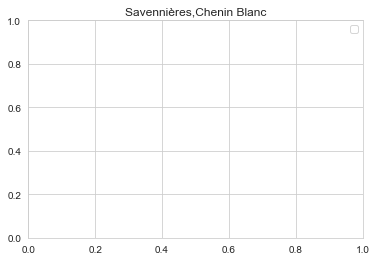

In [57]:
def get_france_classified_regions():
    france_region = fran_variety_year_per_region.index.tolist()
    myFrancelist = set(france_region)
    myFrancelist = list(myFrancelist)

    appended_dfs = []
    for region in myFrancelist:
        # print(f'===================={region}==========================')
        try:
            varieties = list(fran_variety_year_per_region.loc[str(region)]['variety'].values)
            summary_stat_france = show_plot(france_var,region,varieties) ## append this df to another df. 
            appended_dfs.append(summary_stat_france)
        except:
            variety = pd.DataFrame(fran_variety_year_per_region.loc[str(region)]).transpose()['variety'].values
            summary_stat_france2 = (show_plot(france_var,region, variety))
            appended_dfs.append(summary_stat_france2)



    france_classified_regions = pd.concat(appended_dfs)
    france_classified_regions['country'] = 'France'
    france_classified_regions['classification'] = np.where((france_classified_regions['coefficient_years'] < 0) & (france_classified_regions['p-value-year'] < 0.05) , 'appreciating', 'depreciating')
    print(france_classified_regions.shape)
    
france_classified_regions = get_france_classified_regions()

# Italy Regression on Price, Points and Year based on Grape Variety

#### The data I will use for this is the "data_price_df".

Remarks: Based on the distribution, I will set a manual threshold of 25 or 10 for regression. 

In [58]:
# Analysis with variety included

# checking the distribution of the variety per region
italy_var = data_price_df[data_price_df['country'] == 'Italy']
italy_variety_year_per_region = italy_var.groupby(['region_1','variety'])['years'].agg(['count']) 

In [59]:
#check the distribution of the variety in each region 

print(italy_variety_year_per_region['count'].describe())

count    1155.000000
mean       13.916883
std        60.751718
min         1.000000
25%         1.000000
50%         2.000000
75%         7.000000
max      1360.000000
Name: count, dtype: float64


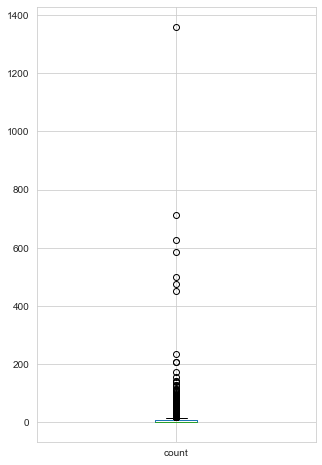

In [60]:
boxplot_italy = italy_variety_year_per_region.boxplot(column = 'count', figsize = (5,8))

In [61]:
italy_variety_year_per_region = italy_variety_year_per_region[italy_variety_year_per_region['count'] >= minimum_count_per_region].reset_index().set_index('region_1')

In [62]:
# snippet on 1 italian region
italy_variety_year_per_region.loc['Alto Adige']

,variety,count
region_1,,
Alto Adige,Chardonnay,28
Alto Adige,Gewürztraminer,41
Alto Adige,Kerner,15
Alto Adige,Lagrein,67
Alto Adige,Müller-Thurgau,15
Alto Adige,Pinot Bianco,106
Alto Adige,Pinot Grigio,111
Alto Adige,Pinot Nero,72
Alto Adige,Red Blend,13


['Red Blend', 'Sangiovese']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Chianti,Red Blend,2009.0,5,2009.0,5,19.800000,5,86.800000
1,Chianti,Red Blend,2010.0,2,2010.0,2,26.000000,2,88.000000
2,Chianti,Red Blend,2011.0,10,2011.0,10,16.000000,10,86.800000
3,Chianti,Red Blend,2012.0,12,2012.0,12,16.166667,12,86.666667
4,Chianti,Red Blend,2013.0,24,2013.0,24,15.458333,24,86.666667
5,Chianti,Red Blend,2014.0,2,2014.0,2,13.500000,2,85.000000
6,Chianti,Red Blend,2015.0,19,2015.0,19,17.421053,19,86.473684


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.8583462366624093
pvals year: 0.6928894305747169
pvals points: 0.09104139199031949
The coeff1:  -0.27378679437946785
The coeff2:  3.5168013719052533
the R 0.7201469375510325


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
7,Chianti,Sangiovese,1929.0,1,1929.0,1,20.000000,1,85.000000
8,Chianti,Sangiovese,1997.0,1,1997.0,1,12.000000,1,83.000000
9,Chianti,Sangiovese,1998.0,4,1998.0,4,13.750000,4,83.500000
10,Chianti,Sangiovese,1999.0,2,1999.0,2,6.500000,2,82.500000
11,Chianti,Sangiovese,2000.0,3,2000.0,3,9.666667,3,84.666667
12,Chianti,Sangiovese,2001.0,1,2001.0,1,10.000000,1,83.000000
13,Chianti,Sangiovese,2003.0,1,2003.0,1,26.000000,1,86.000000
14,Chianti,Sangiovese,2005.0,1,2005.0,1,20.000000,1,88.000000
15,Chianti,Sangiovese,2007.0,1,2007.0,1,12.000000,1,85.000000
16,Chianti,Sangiovese,2008.0,7,2008.0,7,12.142857,7,85.285714


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.606473587644743
pvals year: 0.06899154306960031
pvals points: 0.004641410885024392
The coeff1:  -0.0965519111690484
The coeff2:  1.82935570090167
the R 0.4761368139425395
['Red Blend', 'Sangiovese']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Chianti Rufina,Red Blend,2009.0,2,2009.0,2,14.000000,2,87.000000
1,Chianti Rufina,Red Blend,2010.0,1,2010.0,1,18.000000,1,89.000000
2,Chianti Rufina,Red Blend,2011.0,7,2011.0,7,31.428571,7,88.857143
3,Chianti Rufina,Red Blend,2012.0,8,2012.0,8,20.250000,8,88.000000
4,Chianti Rufina,Red Blend,2013.0,9,2013.0,9,22.000000,9,88.888889
5,Chianti Rufina,Red Blend,2014.0,4,2014.0,4,17.000000,4,88.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.8965841511562054
pvals year: 0.8138387524542532
pvals points: 0.31983494043258837
The coeff1:  -0.4354712207866047
The coeff2:  4.923179979456892
the R 0.3337700731365125


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
6,Chianti Rufina,Sangiovese,1997.0,1,1997.0,1,12.000000,1,81.000000
7,Chianti Rufina,Sangiovese,2004.0,1,2004.0,1,19.000000,1,89.000000
8,Chianti Rufina,Sangiovese,2005.0,2,2005.0,2,21.500000,2,88.000000
9,Chianti Rufina,Sangiovese,2006.0,1,2006.0,1,30.000000,1,88.000000
10,Chianti Rufina,Sangiovese,2007.0,3,2007.0,3,32.000000,3,91.333333
11,Chianti Rufina,Sangiovese,2008.0,4,2008.0,4,49.750000,4,87.750000
12,Chianti Rufina,Sangiovese,2009.0,5,2009.0,5,37.200000,5,87.800000
13,Chianti Rufina,Sangiovese,2010.0,1,2010.0,1,25.000000,1,88.000000
14,Chianti Rufina,Sangiovese,2011.0,3,2011.0,3,24.000000,3,87.000000
15,Chianti Rufina,Sangiovese,2012.0,3,2012.0,3,29.333333,3,91.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.8593126803006896
pvals year: 0.7665202944883169
pvals points: 0.10171871502203222
The coeff1:  -0.18417513246673411
The coeff2:  2.0687989178125537
the R 0.2532086004205777
['Corvina, Rondinella, Molinara', 'Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Amarone della Valpolicella,"Corvina, Rondinella, Molinara",1995.0,1,1995.0,1,220.000000,1,94.000000
1,Amarone della Valpolicella,"Corvina, Rondinella, Molinara",2001.0,6,2001.0,6,66.500000,6,91.833333
2,Amarone della Valpolicella,"Corvina, Rondinella, Molinara",2003.0,4,2003.0,4,168.500000,4,91.000000
3,Amarone della Valpolicella,"Corvina, Rondinella, Molinara",2004.0,10,2004.0,10,122.800000,10,91.300000
4,Amarone della Valpolicella,"Corvina, Rondinella, Molinara",2005.0,2,2005.0,2,49.500000,2,88.000000
5,Amarone della Valpolicella,"Corvina, Rondinella, Molinara",2006.0,11,2006.0,11,135.181818,11,90.181818
6,Amarone della Valpolicella,"Corvina, Rondinella, Molinara",2007.0,12,2007.0,12,67.666667,12,90.500000
7,Amarone della Valpolicella,"Corvina, Rondinella, Molinara",2008.0,13,2008.0,13,49.461538,13,89.384615


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.664841132273316
pvals year: 0.5788056995688396
pvals points: 0.3937228931812928
The coeff1:  -4.680670454734782
The coeff2:  17.21509505682368
the R 0.5858881480338087


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
8,Amarone della Valpolicella,Red Blend,2004.0,1,2004.0,1,110.000000,1,92.000000
9,Amarone della Valpolicella,Red Blend,2005.0,2,2005.0,2,300.000000,2,87.000000
10,Amarone della Valpolicella,Red Blend,2006.0,4,2006.0,4,138.750000,4,90.000000
11,Amarone della Valpolicella,Red Blend,2007.0,6,2007.0,6,100.000000,6,89.833333
12,Amarone della Valpolicella,Red Blend,2008.0,14,2008.0,14,70.357143,14,89.857143
13,Amarone della Valpolicella,Red Blend,2009.0,20,2009.0,20,57.650000,20,88.550000
14,Amarone della Valpolicella,Red Blend,2010.0,14,2010.0,14,60.214286,14,90.428571
15,Amarone della Valpolicella,Red Blend,2011.0,17,2011.0,17,53.882353,17,90.000000
16,Amarone della Valpolicella,Red Blend,2012.0,20,2012.0,20,52.200000,20,89.250000
17,Amarone della Valpolicella,Red Blend,2013.0,6,2013.0,6,41.666667,6,87.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.0008300188115615354
pvals year: 0.0010115520192955578
pvals points: 0.006520443056242731
The coeff1:  -22.490626265451823
The coeff2:  -33.164542022021834
the R 0.8306064087728373
['Fiano']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Fiano di Avellino,Fiano,1860.0,7,1860.0,7,30.857143,7,88.428571
1,Fiano di Avellino,Fiano,2003.0,2,2003.0,2,56.000000,2,89.000000
2,Fiano di Avellino,Fiano,2005.0,4,2005.0,4,26.000000,4,88.250000
3,Fiano di Avellino,Fiano,2006.0,4,2006.0,4,26.000000,4,88.750000
4,Fiano di Avellino,Fiano,2007.0,9,2007.0,9,30.777778,9,87.555556
5,Fiano di Avellino,Fiano,2008.0,2,2008.0,2,32.500000,2,89.500000
6,Fiano di Avellino,Fiano,2009.0,5,2009.0,5,23.600000,5,87.800000
7,Fiano di Avellino,Fiano,2010.0,3,2010.0,3,20.666667,3,86.333333
8,Fiano di Avellino,Fiano,2011.0,5,2011.0,5,21.800000,5,88.800000
9,Fiano di Avellino,Fiano,2012.0,18,2012.0,18,25.388889,18,88.833333


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.20854899798341087
pvals year: 0.7109112786014223
pvals points: 0.0955958788719442
The coeff1:  -0.023734534161292654
The coeff2:  4.803538021291727
the R 0.23739040422292879
['Corvina, Rondinella, Molinara', 'Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Valpolicella Superiore,"Corvina, Rondinella, Molinara",2003.0,2,2003.0,2,25.000000,2,87.000000
1,Valpolicella Superiore,"Corvina, Rondinella, Molinara",2004.0,1,2004.0,1,27.000000,1,87.000000
2,Valpolicella Superiore,"Corvina, Rondinella, Molinara",2006.0,5,2006.0,5,47.000000,5,87.800000
3,Valpolicella Superiore,"Corvina, Rondinella, Molinara",2007.0,6,2007.0,6,60.666667,6,88.833333
4,Valpolicella Superiore,"Corvina, Rondinella, Molinara",2008.0,6,2008.0,6,29.166667,6,86.500000
5,Valpolicella Superiore,"Corvina, Rondinella, Molinara",2009.0,4,2009.0,4,26.000000,4,87.750000
6,Valpolicella Superiore,"Corvina, Rondinella, Molinara",2010.0,2,2010.0,2,24.000000,2,86.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.5367322931785405
pvals year: 0.7414077219430587
pvals points: 0.04218217814590468
The coeff1:  0.5541257161401005
The coeff2:  12.575075641347652
the R 0.6846474051672151


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
7,Valpolicella Superiore,Red Blend,2007.0,2,2007.0,2,45.0,2,86.0
8,Valpolicella Superiore,Red Blend,2009.0,1,2009.0,1,30.0,1,89.0
9,Valpolicella Superiore,Red Blend,2011.0,1,2011.0,1,15.0,1,87.0
10,Valpolicella Superiore,Red Blend,2013.0,1,2013.0,1,35.0,1,87.0
11,Valpolicella Superiore,Red Blend,2015.0,4,2015.0,4,18.5,4,86.5
12,Valpolicella Superiore,Red Blend,2016.0,1,2016.0,1,15.0,1,87.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.14577978805175174
pvals year: 0.1506959011492994
pvals points: 0.6101125273064107
The coeff1:  -2.6216505894966304
The coeff2:  -2.6484458735275425
the R 0.5575733008093914
['Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Bardolino,Red Blend,2006.0,1,2006.0,1,13.000000,1,84.000000
1,Bardolino,Red Blend,2012.0,1,2012.0,1,12.000000,1,86.000000
2,Bardolino,Red Blend,2015.0,1,2015.0,1,20.000000,1,94.000000
3,Bardolino,Red Blend,2016.0,9,2016.0,9,17.222222,9,88.111111


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.8792873438423787
pvals year: 0.9146536490197988
pvals points: 0.38132673338159784
The coeff1:  0.06536502546688006
The coeff2:  0.7393887945670699
the R 0.838764712445757
['Lambrusco di Sorbara']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Lambrusco di Sorbara,Lambrusco di Sorbara,2012.0,2,2012.0,2,23.0,2,88.5
1,Lambrusco di Sorbara,Lambrusco di Sorbara,2013.0,4,2013.0,4,18.5,4,89.5
2,Lambrusco di Sorbara,Lambrusco di Sorbara,2016.0,5,2016.0,5,17.2,5,90.8


++++++++++++++++++++++++++++++++++++++++
['Barbera']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Barbera d'Alba Superiore,Barbera,2003.0,1,2003.0,1,20.000000,1,85.000000
1,Barbera d'Alba Superiore,Barbera,2004.0,1,2004.0,1,17.000000,1,86.000000
2,Barbera d'Alba Superiore,Barbera,2005.0,2,2005.0,2,24.000000,2,85.000000
3,Barbera d'Alba Superiore,Barbera,2006.0,3,2006.0,3,32.666667,3,89.000000
4,Barbera d'Alba Superiore,Barbera,2007.0,6,2007.0,6,21.333333,6,87.333333
5,Barbera d'Alba Superiore,Barbera,2008.0,1,2008.0,1,25.000000,1,90.000000
6,Barbera d'Alba Superiore,Barbera,2009.0,1,2009.0,1,20.000000,1,88.000000
7,Barbera d'Alba Superiore,Barbera,2011.0,12,2011.0,12,26.333333,12,88.166667
8,Barbera d'Alba Superiore,Barbera,2012.0,9,2012.0,9,27.777778,9,89.444444
9,Barbera d'Alba Superiore,Barbera,2013.0,5,2013.0,5,31.400000,5,87.600000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.6020804680238159
pvals year: 0.668324881257404
pvals points: 0.39290744141965483
The coeff1:  0.2266019911722008
The coeff2:  1.0278023637215603
the R 0.2593320992929432
['Red Blend', 'Sangiovese']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Maremma Toscana,Red Blend,2007.0,4,2007.0,4,39.000000,4,89.000000
1,Maremma Toscana,Red Blend,2008.0,6,2008.0,6,55.000000,6,88.500000
2,Maremma Toscana,Red Blend,2009.0,2,2009.0,2,33.000000,2,88.500000
3,Maremma Toscana,Red Blend,2010.0,8,2010.0,8,27.875000,8,89.000000
4,Maremma Toscana,Red Blend,2011.0,10,2011.0,10,38.300000,10,89.500000
5,Maremma Toscana,Red Blend,2012.0,7,2012.0,7,48.571429,7,89.285714
6,Maremma Toscana,Red Blend,2013.0,11,2013.0,11,28.090909,11,87.909091
7,Maremma Toscana,Red Blend,2014.0,1,2014.0,1,19.000000,1,87.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.5459725274167484
pvals year: 0.44395297107392684
pvals points: 0.32031956427763836
The coeff1:  -1.5506084234585793
The coeff2:  6.182348887212341
the R 0.4314314990188064


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
8,Maremma Toscana,Sangiovese,2009.0,1,2009.0,1,44.000000,1,89.0
9,Maremma Toscana,Sangiovese,2010.0,1,2010.0,1,19.000000,1,88.0
10,Maremma Toscana,Sangiovese,2011.0,1,2011.0,1,15.000000,1,88.0
11,Maremma Toscana,Sangiovese,2012.0,2,2012.0,2,30.000000,2,88.5
12,Maremma Toscana,Sangiovese,2013.0,3,2013.0,3,24.333333,3,89.0
13,Maremma Toscana,Sangiovese,2014.0,2,2014.0,2,20.000000,2,88.5


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.17979218907190567
pvals year: 0.100005256513382
pvals points: 0.041860052007817464
The coeff1:  -3.0772946859909585
The coeff2:  18.705314009664676
the R 0.8380905098563954
['Red Blend', 'Vermentino']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Maremma,Red Blend,2003.0,1,2003.0,1,60.000000,1,92.000000
1,Maremma,Red Blend,2004.0,9,2004.0,9,64.222222,9,90.444444
2,Maremma,Red Blend,2005.0,11,2005.0,11,41.727273,11,89.545455
3,Maremma,Red Blend,2006.0,1,2006.0,1,65.000000,1,91.000000
4,Maremma,Red Blend,2007.0,3,2007.0,3,38.333333,3,88.000000
5,Maremma,Red Blend,2008.0,6,2008.0,6,48.333333,6,90.333333
6,Maremma,Red Blend,2009.0,5,2009.0,5,27.400000,5,89.200000
7,Maremma,Red Blend,2011.0,1,2011.0,1,12.000000,1,88.000000
8,Maremma,Red Blend,2015.0,2,2015.0,2,13.000000,2,88.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.13420606903172366
pvals year: 0.07967095340306035
pvals points: 0.08544397026116089
The coeff1:  -2.7283072764356144
The coeff2:  6.879732341708529
the R 0.8546180930699769


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
9,Maremma,Vermentino,2007.0,3,2007.0,3,14.666667,3,86.666667
10,Maremma,Vermentino,2008.0,3,2008.0,3,16.666667,3,87.000000
11,Maremma,Vermentino,2009.0,5,2009.0,5,20.400000,5,86.600000
12,Maremma,Vermentino,2010.0,1,2010.0,1,16.000000,1,85.000000
13,Maremma,Vermentino,2011.0,2,2011.0,2,16.000000,2,86.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.7378265094709787
pvals year: 0.7436294208646225
pvals points: 0.7342240889482519
The coeff1:  0.3936837143531564
The coeff2:  0.8300730615132395
the R 0.09041613040696694
['Garganega']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Recioto di Soave,Garganega,2004.0,1,2004.0,1,55.000000,1,92.000000
1,Recioto di Soave,Garganega,2007.0,2,2007.0,2,46.500000,2,93.000000
2,Recioto di Soave,Garganega,2009.0,3,2009.0,3,55.000000,3,88.666667
3,Recioto di Soave,Garganega,2010.0,1,2010.0,1,28.000000,1,89.000000
4,Recioto di Soave,Garganega,2011.0,3,2011.0,3,38.333333,3,89.000000
5,Recioto di Soave,Garganega,2012.0,1,2012.0,1,38.000000,1,88.000000
6,Recioto di Soave,Garganega,2013.0,1,2013.0,1,28.000000,1,89.000000
7,Recioto di Soave,Garganega,2014.0,1,2014.0,1,31.000000,1,88.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.06686297182576172
pvals year: 0.06092905598236944
pvals points: 0.4363687011134787
The coeff1:  -3.750692719280803
The coeff2:  -2.323905981272228
the R 0.6671453151484102
['Montepulciano']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Montepulciano d'Abruzzo,Montepulciano,2000.0,1,2000.0,1,73.000000,1,90.000000
1,Montepulciano d'Abruzzo,Montepulciano,2001.0,2,2001.0,2,84.500000,2,90.000000
2,Montepulciano d'Abruzzo,Montepulciano,2003.0,4,2003.0,4,50.250000,4,87.500000
3,Montepulciano d'Abruzzo,Montepulciano,2004.0,4,2004.0,4,34.750000,4,87.500000
4,Montepulciano d'Abruzzo,Montepulciano,2005.0,8,2005.0,8,32.625000,8,87.625000
5,Montepulciano d'Abruzzo,Montepulciano,2006.0,9,2006.0,9,27.666667,9,87.111111
6,Montepulciano d'Abruzzo,Montepulciano,2007.0,7,2007.0,7,19.285714,7,87.571429
7,Montepulciano d'Abruzzo,Montepulciano,2008.0,14,2008.0,14,21.857143,14,87.142857
8,Montepulciano d'Abruzzo,Montepulciano,2009.0,14,2009.0,14,15.785714,14,86.428571
9,Montepulciano d'Abruzzo,Montepulciano,2010.0,11,2010.0,11,18.545455,11,86.272727


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.2740073912657765
pvals year: 0.1358115318507542
pvals points: 0.0384812514125675
The coeff1:  -1.7672198304963176
The coeff2:  8.349187981165556
the R 0.7973723078383758
['Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Chianti Superiore,Red Blend,2009.0,1,2009.0,1,21.000000,1,87.000000
1,Chianti Superiore,Red Blend,2011.0,2,2011.0,2,26.500000,2,88.500000
2,Chianti Superiore,Red Blend,2012.0,3,2012.0,3,22.666667,3,87.000000
3,Chianti Superiore,Red Blend,2014.0,3,2014.0,3,20.000000,3,86.333333
4,Chianti Superiore,Red Blend,2015.0,3,2015.0,3,16.333333,3,87.333333


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.4763998002149389
pvals year: 0.416353393032286
pvals points: 0.44042342497758136
The coeff1:  -0.7615981166041763
The coeff2:  2.1462401329457945
the R 0.5717649595878103
['Prosecco']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Prosecco di Valdobbiadene,Prosecco,2005.0,1,2005.0,1,37.000000,1,87.000000
1,Prosecco di Valdobbiadene,Prosecco,2006.0,1,2006.0,1,25.000000,1,88.000000
2,Prosecco di Valdobbiadene,Prosecco,2007.0,6,2007.0,6,24.333333,6,88.166667
3,Prosecco di Valdobbiadene,Prosecco,2008.0,6,2008.0,6,22.666667,6,85.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.22318061071900924
pvals year: 0.2230840073430797
pvals points: 0.4644523833541898
The coeff1:  -5.369214768590747
The coeff2:  -2.313572542901717
the R 0.8824524568726477
['Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Montefalco Rosso,Red Blend,2003.0,1,2003.0,1,18.000000,1,86.000000
1,Montefalco Rosso,Red Blend,2004.0,1,2004.0,1,25.000000,1,87.000000
2,Montefalco Rosso,Red Blend,2006.0,1,2006.0,1,45.000000,1,90.000000
3,Montefalco Rosso,Red Blend,2007.0,1,2007.0,1,22.000000,1,88.000000
4,Montefalco Rosso,Red Blend,2008.0,4,2008.0,4,36.750000,4,89.500000
5,Montefalco Rosso,Red Blend,2009.0,8,2009.0,8,26.625000,8,87.625000
6,Montefalco Rosso,Red Blend,2010.0,19,2010.0,19,23.894737,19,87.947368
7,Montefalco Rosso,Red Blend,2011.0,12,2011.0,12,23.750000,12,89.000000
8,Montefalco Rosso,Red Blend,2012.0,5,2012.0,5,22.600000,5,90.000000
9,Montefalco Rosso,Red Blend,2013.0,2,2013.0,2,23.500000,2,88.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.033487630640962156
pvals year: 0.01835287291995299
pvals points: 0.0029496339755874052
The coeff1:  -1.3821324988716452
The coeff2:  5.64693570995077
the R 0.7100138887792471
['Pinot Grigio']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Valdadige,Pinot Grigio,2002.0,2,2002.0,2,16.5,2,85.5
1,Valdadige,Pinot Grigio,2006.0,1,2006.0,1,25.0,1,86.0
2,Valdadige,Pinot Grigio,2007.0,1,2007.0,1,18.0,1,86.0
3,Valdadige,Pinot Grigio,2008.0,1,2008.0,1,14.0,1,86.0
4,Valdadige,Pinot Grigio,2009.0,1,2009.0,1,14.0,1,87.0
5,Valdadige,Pinot Grigio,2010.0,1,2010.0,1,14.0,1,85.0
6,Valdadige,Pinot Grigio,2011.0,1,2011.0,1,15.0,1,87.0
7,Valdadige,Pinot Grigio,2014.0,2,2014.0,2,17.0,2,84.5


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.4556056095532233
pvals year: 0.4787587130887736
pvals points: 0.7481691838741567
The coeff1:  -0.336879904242509
The coeff2:  -0.6109190051867515
the R 0.11222219585996962
['Cannonau']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Cannonau di Sardegna,Cannonau,2001.0,1,2001.0,1,22.000000,1,88.000000
1,Cannonau di Sardegna,Cannonau,2006.0,1,2006.0,1,15.000000,1,87.000000
2,Cannonau di Sardegna,Cannonau,2007.0,2,2007.0,2,42.000000,2,90.000000
3,Cannonau di Sardegna,Cannonau,2008.0,1,2008.0,1,33.000000,1,86.000000
4,Cannonau di Sardegna,Cannonau,2009.0,3,2009.0,3,26.666667,3,87.333333
5,Cannonau di Sardegna,Cannonau,2010.0,4,2010.0,4,30.750000,4,87.250000
6,Cannonau di Sardegna,Cannonau,2011.0,3,2011.0,3,30.333333,3,88.000000
7,Cannonau di Sardegna,Cannonau,2012.0,5,2012.0,5,21.600000,5,87.200000
8,Cannonau di Sardegna,Cannonau,2013.0,6,2013.0,6,18.166667,6,88.333333
9,Cannonau di Sardegna,Cannonau,2014.0,1,2014.0,1,24.000000,1,89.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.8908178597202427
pvals year: 0.8063498448508521
pvals points: 0.41022246011406704
The coeff1:  -0.18964087795080098
The coeff2:  2.22682562249416
the R 0.10159856346849361
['Chardonnay', 'Sparkling Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Trento,Chardonnay,1999.0,1,1999.0,1,90.0,1,93.000000
1,Trento,Chardonnay,2001.0,1,2001.0,1,85.0,1,92.000000
2,Trento,Chardonnay,2002.0,3,2002.0,3,70.0,3,91.666667
3,Trento,Chardonnay,2003.0,1,2003.0,1,42.0,1,91.000000
4,Trento,Chardonnay,2004.0,4,2004.0,4,56.5,4,91.250000
5,Trento,Chardonnay,2005.0,2,2005.0,2,42.0,2,89.000000
6,Trento,Chardonnay,2006.0,3,2006.0,3,42.0,3,91.000000
7,Trento,Chardonnay,2007.0,5,2007.0,5,39.2,5,89.800000
8,Trento,Chardonnay,2008.0,1,2008.0,1,38.0,1,92.000000
9,Trento,Chardonnay,2010.0,1,2010.0,1,30.0,1,86.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.005943008719172628
pvals year: 0.003918464328082292
pvals points: 0.7621365115097357
The coeff1:  -4.522613338434739
The coeff2:  0.7286151676927952
the R 0.8415795601500273


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
12,Trento,Sparkling Blend,2000.0,1,2000.0,1,24.00,1,90.000000
13,Trento,Sparkling Blend,2001.0,1,2001.0,1,16.00,1,90.000000
14,Trento,Sparkling Blend,2003.0,2,2003.0,2,39.50,2,91.000000
15,Trento,Sparkling Blend,2004.0,2,2004.0,2,115.00,2,89.500000
16,Trento,Sparkling Blend,2005.0,2,2005.0,2,102.50,2,90.000000
17,Trento,Sparkling Blend,2006.0,2,2006.0,2,112.50,2,89.500000
18,Trento,Sparkling Blend,2007.0,4,2007.0,4,49.75,4,89.750000
19,Trento,Sparkling Blend,2008.0,3,2008.0,3,38.00,3,90.000000
20,Trento,Sparkling Blend,2009.0,4,2009.0,4,56.00,4,90.500000
21,Trento,Sparkling Blend,2010.0,3,2010.0,3,46.00,3,89.666667


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.9789990889800937
pvals year: 0.9936215331461308
pvals points: 0.8158140660752992
The coeff1:  0.021019721578624084
The coeff2:  1.7276459427732807
the R 0.005687333923583782
['Ruché']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Ruché di Castagnole Monferrato,Ruché,2006.0,1,2006.0,1,15.000000,1,86.000000
1,Ruché di Castagnole Monferrato,Ruché,2007.0,3,2007.0,3,20.666667,3,85.666667
2,Ruché di Castagnole Monferrato,Ruché,2008.0,3,2008.0,3,35.333333,3,87.666667
3,Ruché di Castagnole Monferrato,Ruché,2010.0,2,2010.0,2,26.000000,2,87.000000
4,Ruché di Castagnole Monferrato,Ruché,2013.0,2,2013.0,2,31.500000,2,87.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.7876676287338356
pvals year: 0.9813586895898021
pvals points: 0.14067893653747598
The coeff1:  -0.03010843246649575
The coeff2:  8.417833456153094
the R 0.838539565767394
['Cabernet Sauvignon', 'Catarratto', 'Chardonnay', 'Frappato', 'Grillo', 'Insolia', 'Inzolia', 'Merlot', 'Nerello Mascalese', "Nero d'Avola", 'Red Blend', 'Syrah', 'White Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Sicilia,Cabernet Sauvignon,2004.0,1,2004.0,1,45.0,1,91.000000
1,Sicilia,Cabernet Sauvignon,2005.0,2,2005.0,2,58.5,2,91.500000
2,Sicilia,Cabernet Sauvignon,2006.0,3,2006.0,3,11.0,3,86.333333
3,Sicilia,Cabernet Sauvignon,2007.0,3,2007.0,3,11.0,3,85.666667
4,Sicilia,Cabernet Sauvignon,2008.0,2,2008.0,2,45.0,2,90.500000
5,Sicilia,Cabernet Sauvignon,2009.0,2,2009.0,2,43.0,2,89.500000
6,Sicilia,Cabernet Sauvignon,2010.0,3,2010.0,3,16.0,3,87.000000
7,Sicilia,Cabernet Sauvignon,2011.0,1,2011.0,1,10.0,1,87.000000
8,Sicilia,Cabernet Sauvignon,2015.0,1,2015.0,1,10.0,1,86.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.7164035564170476
pvals year: 0.8809851812487022
pvals points: 0.00010899594310493007
The coeff1:  -0.09798107574761328
The coeff2:  8.17968931842332
the R 0.9517483798164214


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
9,Sicilia,Catarratto,2007.0,2,2007.0,2,12.0,2,84.5
10,Sicilia,Catarratto,2008.0,1,2008.0,1,18.0,1,87.0
11,Sicilia,Catarratto,2009.0,1,2009.0,1,17.0,1,87.0
12,Sicilia,Catarratto,2010.0,5,2010.0,5,17.6,5,86.6
13,Sicilia,Catarratto,2011.0,2,2011.0,2,16.0,2,86.0
14,Sicilia,Catarratto,2013.0,1,2013.0,1,16.0,1,87.0
15,Sicilia,Catarratto,2015.0,5,2015.0,5,23.4,5,87.8


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.3434715366299766
pvals year: 0.49907646394003913
pvals points: 0.0737933783118836
The coeff1:  0.27005660558380384
The coeff2:  2.3405929195049726
the R 0.7952515262261957


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
16,Sicilia,Chardonnay,2005.0,1,2005.0,1,50.000000,1,88.000000
17,Sicilia,Chardonnay,2006.0,2,2006.0,2,38.500000,2,89.500000
18,Sicilia,Chardonnay,2007.0,7,2007.0,7,25.857143,7,87.857143
19,Sicilia,Chardonnay,2008.0,4,2008.0,4,17.500000,4,88.250000
20,Sicilia,Chardonnay,2009.0,5,2009.0,5,43.800000,5,87.800000
21,Sicilia,Chardonnay,2010.0,5,2010.0,5,28.800000,5,88.600000
22,Sicilia,Chardonnay,2011.0,7,2011.0,7,25.285714,7,88.428571
23,Sicilia,Chardonnay,2012.0,1,2012.0,1,35.000000,1,87.000000
24,Sicilia,Chardonnay,2013.0,2,2013.0,2,36.000000,2,88.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.41815259626573276
pvals year: 0.43731296824221516
pvals points: 0.5952257992605772
The coeff1:  -1.2903517842892063
The coeff2:  -3.508864432853005
the R 0.1114372082628774


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
25,Sicilia,Frappato,2006.0,1,2006.0,1,17.0,1,85.000000
26,Sicilia,Frappato,2009.0,2,2009.0,2,23.5,2,85.000000
27,Sicilia,Frappato,2010.0,3,2010.0,3,28.0,3,88.333333
28,Sicilia,Frappato,2011.0,1,2011.0,1,16.0,1,87.000000
29,Sicilia,Frappato,2012.0,2,2012.0,2,35.0,2,87.500000
30,Sicilia,Frappato,2013.0,2,2013.0,2,31.5,2,87.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.37866280608050545
pvals year: 0.4072312112375245
pvals points: 0.7884351538164364
The coeff1:  1.71772422389797
The coeff2:  0.9567875586157744
the R 0.4584925850896705


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
31,Sicilia,Grillo,1875.0,2,1875.0,2,9.000000,2,85.000000
32,Sicilia,Grillo,2006.0,1,2006.0,1,30.000000,1,93.000000
33,Sicilia,Grillo,2007.0,8,2007.0,8,16.000000,8,86.000000
34,Sicilia,Grillo,2008.0,2,2008.0,2,16.500000,2,86.500000
35,Sicilia,Grillo,2009.0,3,2009.0,3,13.666667,3,85.000000
36,Sicilia,Grillo,2010.0,12,2010.0,12,17.583333,12,85.500000
37,Sicilia,Grillo,2011.0,16,2011.0,16,19.187500,16,86.812500
38,Sicilia,Grillo,2012.0,3,2012.0,3,28.000000,3,87.333333
39,Sicilia,Grillo,2013.0,8,2013.0,8,17.750000,8,86.875000
40,Sicilia,Grillo,2015.0,13,2015.0,13,15.846154,13,88.692308


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.013937968360474324
pvals year: 0.22664918969321443
pvals points: 0.018841987189194803
The coeff1:  0.042759764172412396
The coeff2:  1.7463878584025396
the R 0.6351211130188523


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
42,Sicilia,Insolia,2007.0,5,2007.0,5,16.0,5,86.00
43,Sicilia,Insolia,2008.0,2,2008.0,2,17.0,2,85.50
44,Sicilia,Insolia,2010.0,2,2010.0,2,13.0,2,85.50
45,Sicilia,Insolia,2011.0,5,2011.0,5,15.4,5,87.00
46,Sicilia,Insolia,2012.0,3,2012.0,3,17.0,3,87.00
47,Sicilia,Insolia,2013.0,4,2013.0,4,21.0,4,87.75


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.6930924445341766
pvals year: 0.6227044344995576
pvals points: 0.23354332626075072
The coeff1:  -0.42004369197177804
The coeff2:  2.855488803932591
the R 0.5437406650971399


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
48,Sicilia,Inzolia,2007.0,4,2007.0,4,19.500000,4,86.25
49,Sicilia,Inzolia,2008.0,1,2008.0,1,15.000000,1,87.00
50,Sicilia,Inzolia,2009.0,1,2009.0,1,14.000000,1,85.00
51,Sicilia,Inzolia,2010.0,3,2010.0,3,13.666667,3,86.00
52,Sicilia,Inzolia,2011.0,5,2011.0,5,12.200000,5,85.40
53,Sicilia,Inzolia,2013.0,4,2013.0,4,12.000000,4,85.50
54,Sicilia,Inzolia,2015.0,2,2015.0,2,16.500000,2,87.50


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.2833707941555455
pvals year: 0.22253956231633973
pvals points: 0.13223918894340203
The coeff1:  -0.4685625608384596
The coeff2:  1.9194870898326701
the R 0.538381939811709


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
55,Sicilia,Merlot,2000.0,1,2000.0,1,11.0,1,84.000000
56,Sicilia,Merlot,2002.0,1,2002.0,1,40.0,1,84.000000
57,Sicilia,Merlot,2006.0,3,2006.0,3,16.0,3,87.666667
58,Sicilia,Merlot,2007.0,1,2007.0,1,10.0,1,86.000000
59,Sicilia,Merlot,2010.0,2,2010.0,2,26.0,2,88.500000
60,Sicilia,Merlot,2011.0,2,2011.0,2,26.0,2,88.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.6777628759490653
pvals year: 0.6748555633619506
pvals points: 0.6857045575992937
The coeff1:  1.8894176452460192
The coeff2:  -3.7554178506617557
the R 0.06716089277832493


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
61,Sicilia,Nerello Mascalese,2004.0,1,2004.0,1,19.000000,1,89.000000
62,Sicilia,Nerello Mascalese,2005.0,1,2005.0,1,18.000000,1,89.000000
63,Sicilia,Nerello Mascalese,2006.0,1,2006.0,1,41.000000,1,90.000000
64,Sicilia,Nerello Mascalese,2007.0,3,2007.0,3,22.333333,3,87.333333
65,Sicilia,Nerello Mascalese,2008.0,1,2008.0,1,32.000000,1,90.000000
66,Sicilia,Nerello Mascalese,2009.0,2,2009.0,2,17.000000,2,84.500000
67,Sicilia,Nerello Mascalese,2010.0,2,2010.0,2,34.000000,2,88.500000
68,Sicilia,Nerello Mascalese,2011.0,1,2011.0,1,25.000000,1,88.000000
69,Sicilia,Nerello Mascalese,2012.0,1,2012.0,1,34.000000,1,92.000000
70,Sicilia,Nerello Mascalese,2013.0,2,2013.0,2,18.500000,2,87.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.8255932779385629
pvals year: 0.7457567845557094
pvals points: 0.11830415185025396
The coeff1:  -0.2549414435161994
The coeff2:  2.1739212325542008
the R 0.2771706016300137


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
72,Sicilia,Nero d'Avola,2000.0,1,2000.0,1,31.000000,1,88.000000
73,Sicilia,Nero d'Avola,2003.0,2,2003.0,2,38.000000,2,87.500000
74,Sicilia,Nero d'Avola,2004.0,5,2004.0,5,39.400000,5,90.200000
75,Sicilia,Nero d'Avola,2005.0,9,2005.0,9,27.000000,9,87.666667
76,Sicilia,Nero d'Avola,2006.0,16,2006.0,16,24.250000,16,87.187500
77,Sicilia,Nero d'Avola,2007.0,15,2007.0,15,26.733333,15,87.400000
78,Sicilia,Nero d'Avola,2008.0,19,2008.0,19,30.263158,19,87.684211
79,Sicilia,Nero d'Avola,2009.0,28,2009.0,28,21.535714,28,87.250000
80,Sicilia,Nero d'Avola,2010.0,36,2010.0,36,21.444444,36,87.416667
81,Sicilia,Nero d'Avola,2011.0,20,2011.0,20,20.950000,20,87.050000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.004080955513981547
pvals year: 0.0005573824465961353
pvals points: 0.012085321989189712
The coeff1:  -1.0026482768158345
The coeff2:  4.028194872298424
the R 0.7668916798533277


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
87,Sicilia,Red Blend,1997.0,1,1997.0,1,12.000000,1,90.000000
88,Sicilia,Red Blend,1998.0,1,1998.0,1,40.000000,1,91.000000
89,Sicilia,Red Blend,1999.0,1,1999.0,1,21.000000,1,90.000000
90,Sicilia,Red Blend,2003.0,2,2003.0,2,49.000000,2,89.000000
91,Sicilia,Red Blend,2004.0,4,2004.0,4,31.000000,4,88.000000
92,Sicilia,Red Blend,2005.0,13,2005.0,13,43.769231,13,89.076923
93,Sicilia,Red Blend,2006.0,8,2006.0,8,31.250000,8,89.375000
94,Sicilia,Red Blend,2007.0,8,2007.0,8,30.250000,8,88.625000
95,Sicilia,Red Blend,2008.0,15,2008.0,15,25.866667,15,88.066667
96,Sicilia,Red Blend,2009.0,14,2009.0,14,25.142857,14,88.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.9373240681515713
pvals year: 0.9977413739554795
pvals points: 0.6237092892137056
The coeff1:  -0.0018296904458598995
The coeff2:  1.7028718359787103
the R 0.03390497714925422


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
102,Sicilia,Syrah,2003.0,2,2003.0,2,60.000000,2,91.500000
103,Sicilia,Syrah,2004.0,1,2004.0,1,55.000000,1,92.000000
104,Sicilia,Syrah,2005.0,2,2005.0,2,47.000000,2,91.000000
105,Sicilia,Syrah,2006.0,3,2006.0,3,22.666667,3,88.666667
106,Sicilia,Syrah,2007.0,3,2007.0,3,15.333333,3,87.000000
107,Sicilia,Syrah,2008.0,6,2008.0,6,21.500000,6,88.000000
108,Sicilia,Syrah,2009.0,11,2009.0,11,22.909091,11,88.272727
109,Sicilia,Syrah,2010.0,9,2010.0,9,14.333333,9,86.777778
110,Sicilia,Syrah,2011.0,6,2011.0,6,24.000000,6,87.666667
111,Sicilia,Syrah,2012.0,1,2012.0,1,45.000000,1,87.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.02215687900943905
pvals year: 0.03222013740232337
pvals points: 0.0011895528909966983
The coeff1:  3.1955452646312645
The coeff2:  12.213072606125273
the R 0.7178420605282189


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
114,Sicilia,White Blend,1998.0,1,1998.0,1,5.000000,1,82.000000
115,Sicilia,White Blend,2000.0,1,2000.0,1,23.000000,1,90.000000
116,Sicilia,White Blend,2005.0,1,2005.0,1,11.000000,1,85.000000
117,Sicilia,White Blend,2006.0,7,2006.0,7,27.285714,7,87.428571
118,Sicilia,White Blend,2007.0,13,2007.0,13,16.846154,13,86.692308
119,Sicilia,White Blend,2008.0,2,2008.0,2,24.500000,2,90.000000
120,Sicilia,White Blend,2009.0,5,2009.0,5,13.800000,5,85.400000
121,Sicilia,White Blend,2010.0,18,2010.0,18,15.888889,18,86.222222
122,Sicilia,White Blend,2011.0,22,2011.0,22,17.409091,22,86.772727
123,Sicilia,White Blend,2013.0,4,2013.0,4,15.250000,4,87.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.9209443894509227
pvals year: 0.646702525665479
pvals points: 6.184071691281518e-05
The coeff1:  -0.08251765157496943
The coeff2:  2.50437082033011
the R 0.8278234310700154
['Albana', 'Sangiovese']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Romagna,Albana,2014.0,1,2014.0,1,22.0,1,93.0
1,Romagna,Albana,2015.0,10,2015.0,10,17.7,10,89.0
2,Romagna,Albana,2016.0,1,2016.0,1,15.0,1,91.0


++++++++++++++++++++++++++++++++++++++++


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
3,Romagna,Sangiovese,2011.0,3,2011.0,3,12.333333,3,84.000000
4,Romagna,Sangiovese,2012.0,1,2012.0,1,20.000000,1,89.000000
5,Romagna,Sangiovese,2013.0,17,2013.0,17,32.235294,17,88.235294
6,Romagna,Sangiovese,2014.0,1,2014.0,1,38.000000,1,89.000000
7,Romagna,Sangiovese,2015.0,21,2015.0,21,17.000000,21,87.333333


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.9006991228329864
pvals year: 0.9269032396843541
pvals points: 0.3673234760988111
The coeff1:  0.4112176998336441
The coeff2:  3.48317345024905
the R 0.49665807474804646
['Aglianico']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Taurasi,Aglianico,2001.0,4,2001.0,4,53.500000,4,91.000000
1,Taurasi,Aglianico,2003.0,3,2003.0,3,58.666667,3,89.666667
2,Taurasi,Aglianico,2004.0,9,2004.0,9,55.666667,9,91.000000
3,Taurasi,Aglianico,2005.0,2,2005.0,2,45.000000,2,90.000000
4,Taurasi,Aglianico,2006.0,9,2006.0,9,57.777778,9,92.000000
5,Taurasi,Aglianico,2007.0,15,2007.0,15,51.933333,15,90.133333
6,Taurasi,Aglianico,2008.0,13,2008.0,13,49.846154,13,90.461538
7,Taurasi,Aglianico,2009.0,8,2009.0,8,66.750000,8,92.250000
8,Taurasi,Aglianico,2010.0,12,2010.0,12,42.416667,12,90.583333
9,Taurasi,Aglianico,2011.0,12,2011.0,12,71.333333,12,91.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.5562746662209759
pvals year: 0.5130516051213837
pvals points: 0.37704537517324965
The coeff1:  -0.6207831987279606
The coeff2:  3.0966150165990225
the R 0.08976171960969959
['Greco']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Greco di Tufo,Greco,2005.0,3,2005.0,3,20.333333,3,88.333333
1,Greco di Tufo,Greco,2006.0,5,2006.0,5,24.000000,5,87.400000
2,Greco di Tufo,Greco,2007.0,12,2007.0,12,29.083333,12,87.583333
3,Greco di Tufo,Greco,2009.0,2,2009.0,2,27.500000,2,89.000000
4,Greco di Tufo,Greco,2010.0,3,2010.0,3,20.000000,3,87.666667
5,Greco di Tufo,Greco,2011.0,9,2011.0,9,28.333333,9,88.111111
6,Greco di Tufo,Greco,2012.0,17,2012.0,17,23.823529,17,89.176471
7,Greco di Tufo,Greco,2013.0,9,2013.0,9,32.777778,9,90.111111
8,Greco di Tufo,Greco,2014.0,7,2014.0,7,35.142857,7,89.571429
9,Greco di Tufo,Greco,2015.0,21,2015.0,21,23.476190,21,88.761905


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.7516071073549138
pvals year: 0.5951053425270308
pvals points: 0.16605437028885456
The coeff1:  -0.31163314955856647
The coeff2:  3.6421021144309678
the R 0.2499605901647579
['Red Blend', 'Sangiovese']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Chianti Classico,Red Blend,2007.0,5,2007.0,5,38.200000,5,90.400000
1,Chianti Classico,Red Blend,2008.0,7,2008.0,7,30.571429,7,88.857143
2,Chianti Classico,Red Blend,2009.0,36,2009.0,36,31.833333,36,87.972222
3,Chianti Classico,Red Blend,2010.0,113,2010.0,113,31.486726,113,88.902655
4,Chianti Classico,Red Blend,2011.0,106,2011.0,106,35.698113,106,88.735849
5,Chianti Classico,Red Blend,2012.0,94,2012.0,94,27.872340,94,89.212766
6,Chianti Classico,Red Blend,2013.0,95,2013.0,95,24.705263,95,88.473684
7,Chianti Classico,Red Blend,2014.0,19,2014.0,19,17.894737,19,86.684211
8,Chianti Classico,Red Blend,2015.0,1,2015.0,1,20.000000,1,87.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.1302282609622015
pvals year: 0.08516053321962706
pvals points: 0.13400560411368506
The coeff1:  -1.3104788053739935
The coeff2:  2.662581428631705
the R 0.8315486253620226


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
9,Chianti Classico,Sangiovese,1995.0,2,1995.0,2,32.500000,2,83.500000
10,Chianti Classico,Sangiovese,1996.0,4,1996.0,4,22.500000,4,83.000000
11,Chianti Classico,Sangiovese,1997.0,3,1997.0,3,16.666667,3,82.666667
12,Chianti Classico,Sangiovese,1998.0,16,1998.0,16,20.187500,16,86.750000
13,Chianti Classico,Sangiovese,1999.0,7,1999.0,7,21.714286,7,86.714286
14,Chianti Classico,Sangiovese,2000.0,2,2000.0,2,15.500000,2,85.000000
15,Chianti Classico,Sangiovese,2001.0,1,2001.0,1,15.000000,1,87.000000
16,Chianti Classico,Sangiovese,2003.0,1,2003.0,1,30.000000,1,89.000000
17,Chianti Classico,Sangiovese,2004.0,8,2004.0,8,35.625000,8,90.000000
18,Chianti Classico,Sangiovese,2005.0,26,2005.0,26,32.230769,26,88.269231


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.8113748608662501
pvals year: 0.9797119111071335
pvals points: 0.05935311337742085
The coeff1:  0.011056629001198637
The coeff2:  2.2436611680744702
the R 0.4168899765179622
['Red Blend', 'Sangiovese']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Montecucco,Red Blend,2004.0,2,2004.0,2,24.500000,2,88.000000
1,Montecucco,Red Blend,2007.0,1,2007.0,1,28.000000,1,91.000000
2,Montecucco,Red Blend,2008.0,1,2008.0,1,18.000000,1,87.000000
3,Montecucco,Red Blend,2009.0,3,2009.0,3,24.333333,3,87.000000
4,Montecucco,Red Blend,2010.0,1,2010.0,1,25.000000,1,88.000000
5,Montecucco,Red Blend,2011.0,3,2011.0,3,26.000000,3,87.666667
6,Montecucco,Red Blend,2012.0,2,2012.0,2,14.000000,2,86.000000
7,Montecucco,Red Blend,2013.0,2,2013.0,2,23.500000,2,86.000000
8,Montecucco,Red Blend,2014.0,5,2014.0,5,19.800000,5,85.400000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.6380234451557135
pvals year: 0.7181420162495105
pvals points: 0.0923296606071966
The coeff1:  0.209595319252744
The coeff2:  2.10920351961303
the R 0.48697193212208534


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
9,Montecucco,Sangiovese,2005.0,1,2005.0,1,75.000000,1,91.000000
10,Montecucco,Sangiovese,2006.0,2,2006.0,2,57.000000,2,90.000000
11,Montecucco,Sangiovese,2007.0,2,2007.0,2,59.000000,2,92.500000
12,Montecucco,Sangiovese,2008.0,3,2008.0,3,25.000000,3,87.666667
13,Montecucco,Sangiovese,2009.0,2,2009.0,2,38.500000,2,89.500000
14,Montecucco,Sangiovese,2010.0,1,2010.0,1,40.000000,1,86.000000
15,Montecucco,Sangiovese,2011.0,4,2011.0,4,31.500000,4,86.000000
16,Montecucco,Sangiovese,2012.0,3,2012.0,3,38.333333,3,87.000000
17,Montecucco,Sangiovese,2013.0,3,2013.0,3,27.666667,3,87.666667
18,Montecucco,Sangiovese,2014.0,1,2014.0,1,25.000000,1,87.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.14622601201697324
pvals year: 0.11895233461481133
pvals points: 0.22138821397276404
The coeff1:  -2.875091538457756
The coeff2:  2.980489390427989
the R 0.723973014414983
['Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Sant'Antimo,Red Blend,2003.0,1,2003.0,1,68.000000,1,92.000000
1,Sant'Antimo,Red Blend,2004.0,4,2004.0,4,55.500000,4,91.250000
2,Sant'Antimo,Red Blend,2005.0,2,2005.0,2,46.000000,2,89.500000
3,Sant'Antimo,Red Blend,2006.0,3,2006.0,3,26.666667,3,89.333333
4,Sant'Antimo,Red Blend,2007.0,2,2007.0,2,51.000000,2,91.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.33270303002119606
pvals year: 0.2847218963466181
pvals points: 0.11221008335508509
The coeff1:  -3.6674491606379167
The coeff2:  8.968745734952279
the R 0.8796617132623719
['Negroamaro', 'Primitivo', 'Red Blend', 'Rosato']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Salento,Negroamaro,2005.0,2,2005.0,2,24.000000,2,87.500000
1,Salento,Negroamaro,2006.0,4,2006.0,4,13.000000,4,86.000000
2,Salento,Negroamaro,2007.0,3,2007.0,3,12.333333,3,86.000000
3,Salento,Negroamaro,2008.0,1,2008.0,1,16.000000,1,85.000000
4,Salento,Negroamaro,2009.0,3,2009.0,3,12.666667,3,86.333333
5,Salento,Negroamaro,2010.0,8,2010.0,8,36.500000,8,87.375000
6,Salento,Negroamaro,2011.0,6,2011.0,6,16.500000,6,85.166667
7,Salento,Negroamaro,2012.0,11,2012.0,11,21.454545,11,87.000000
8,Salento,Negroamaro,2013.0,9,2013.0,9,16.444444,9,87.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.6224295047140209
pvals year: 0.7895179334313264
pvals points: 0.10180504465899755
The coeff1:  0.2512959604024415
The coeff2:  5.2079940588878255
the R 0.3954297464552572


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
9,Salento,Primitivo,2003.0,1,2003.0,1,30.000000,1,86.000000
10,Salento,Primitivo,2004.0,1,2004.0,1,34.000000,1,88.000000
11,Salento,Primitivo,2005.0,6,2005.0,6,18.000000,6,84.833333
12,Salento,Primitivo,2006.0,6,2006.0,6,18.333333,6,87.000000
13,Salento,Primitivo,2007.0,4,2007.0,4,14.500000,4,86.500000
14,Salento,Primitivo,2008.0,1,2008.0,1,62.000000,1,84.000000
15,Salento,Primitivo,2009.0,4,2009.0,4,14.500000,4,86.750000
16,Salento,Primitivo,2010.0,3,2010.0,3,25.666667,3,87.666667
17,Salento,Primitivo,2011.0,6,2011.0,6,17.333333,6,86.000000
18,Salento,Primitivo,2012.0,9,2012.0,9,22.000000,9,87.555556


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.4189085035624136
pvals year: 0.4885620414964169
pvals points: 0.2907441093201177
The coeff1:  -0.9726242857982337
The coeff2:  -3.9277405206728493
the R 0.17896494226283421


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
20,Salento,Red Blend,2005.0,1,2005.0,1,53.00,1,90.00
21,Salento,Red Blend,2006.0,2,2006.0,2,28.50,2,87.50
22,Salento,Red Blend,2007.0,1,2007.0,1,21.00,1,87.00
23,Salento,Red Blend,2008.0,1,2008.0,1,21.00,1,87.00
24,Salento,Red Blend,2009.0,2,2009.0,2,14.00,2,86.50
25,Salento,Red Blend,2012.0,4,2012.0,4,23.75,4,88.25
26,Salento,Red Blend,2013.0,1,2013.0,1,18.00,1,87.00


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.09144651815268007
pvals year: 0.02972142671917229
pvals points: 0.0007245793125664667
The coeff1:  -1.274347549331639
The coeff2:  9.078294080203584
the R 0.9724306142211051


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
27,Salento,Rosato,2011.0,1,2011.0,1,29.000,1,86.000
28,Salento,Rosato,2013.0,2,2013.0,2,14.000,2,89.000
29,Salento,Rosato,2016.0,8,2016.0,8,15.875,8,87.125


++++++++++++++++++++++++++++++++++++++++
['Corvina, Rondinella, Molinara', 'Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Valpolicella Classico Superiore Ripasso,"Corvina, Rondinella, Molinara",2005.0,2,2005.0,2,30.000000,2,87.000000
1,Valpolicella Classico Superiore Ripasso,"Corvina, Rondinella, Molinara",2006.0,3,2006.0,3,40.666667,3,88.000000
2,Valpolicella Classico Superiore Ripasso,"Corvina, Rondinella, Molinara",2007.0,17,2007.0,17,22.941176,17,87.529412
3,Valpolicella Classico Superiore Ripasso,"Corvina, Rondinella, Molinara",2008.0,20,2008.0,20,22.700000,20,87.900000
4,Valpolicella Classico Superiore Ripasso,"Corvina, Rondinella, Molinara",2009.0,30,2009.0,30,25.333333,30,88.233333
5,Valpolicella Classico Superiore Ripasso,"Corvina, Rondinella, Molinara",2010.0,20,2010.0,20,20.050000,20,87.750000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.050437178825671246
pvals year: 0.04821749457732363
pvals points: 0.1338360930275132
The coeff1:  -4.4090204504453965
The coeff2:  12.099050250330594
the R 0.776977323381813


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
6,Valpolicella Classico Superiore Ripasso,Red Blend,2006.0,1,2006.0,1,27.000000,1,87.000000
7,Valpolicella Classico Superiore Ripasso,Red Blend,2009.0,8,2009.0,8,25.000000,8,88.250000
8,Valpolicella Classico Superiore Ripasso,Red Blend,2010.0,16,2010.0,16,23.562500,16,87.562500
9,Valpolicella Classico Superiore Ripasso,Red Blend,2011.0,18,2011.0,18,19.444444,18,87.277778
10,Valpolicella Classico Superiore Ripasso,Red Blend,2012.0,1,2012.0,1,25.000000,1,88.000000
11,Valpolicella Classico Superiore Ripasso,Red Blend,2014.0,2,2014.0,2,18.500000,2,87.000000
12,Valpolicella Classico Superiore Ripasso,Red Blend,2015.0,3,2015.0,3,23.333333,3,88.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.1132994077063283
pvals year: 0.07368570520275187
pvals points: 0.14847877297966647
The coeff1:  -0.7326303525806868
The coeff2:  3.2506493305046744
the R 0.653232509092376
['Corvina, Rondinella, Molinara', 'Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Amarone della Valpolicella Classico,"Corvina, Rondinella, Molinara",1997.0,1,1997.0,1,50.000000,1,91.000000
1,Amarone della Valpolicella Classico,"Corvina, Rondinella, Molinara",1998.0,1,1998.0,1,90.000000,1,93.000000
2,Amarone della Valpolicella Classico,"Corvina, Rondinella, Molinara",1999.0,1,1999.0,1,55.000000,1,92.000000
3,Amarone della Valpolicella Classico,"Corvina, Rondinella, Molinara",2000.0,4,2000.0,4,83.250000,4,92.250000
4,Amarone della Valpolicella Classico,"Corvina, Rondinella, Molinara",2001.0,12,2001.0,12,118.250000,12,90.416667
5,Amarone della Valpolicella Classico,"Corvina, Rondinella, Molinara",2002.0,1,2002.0,1,70.000000,1,88.000000
6,Amarone della Valpolicella Classico,"Corvina, Rondinella, Molinara",2003.0,15,2003.0,15,73.066667,15,89.933333
7,Amarone della Valpolicella Classico,"Corvina, Rondinella, Molinara",2004.0,26,2004.0,26,64.230769,26,89.423077
8,Amarone della Valpolicella Classico,"Corvina, Rondinella, Molinara",2005.0,15,2005.0,15,62.400000,15,90.200000
9,Amarone della Valpolicella Classico,"Corvina, Rondinella, Molinara",2006.0,18,2006.0,18,79.666667,18,90.722222


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.47703599126604135
pvals year: 0.4314740607068783
pvals points: 0.7523901064836294
The coeff1:  -1.5041524403061897
The coeff2:  1.7011019064590034
the R 0.13705916516369965


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
13,Amarone della Valpolicella Classico,Red Blend,1996.0,1,1996.0,1,50.000000,1,86.000000
14,Amarone della Valpolicella Classico,Red Blend,2003.0,1,2003.0,1,350.000000,1,90.000000
15,Amarone della Valpolicella Classico,Red Blend,2005.0,4,2005.0,4,100.000000,4,93.000000
16,Amarone della Valpolicella Classico,Red Blend,2006.0,10,2006.0,10,106.400000,10,91.400000
17,Amarone della Valpolicella Classico,Red Blend,2007.0,17,2007.0,17,111.000000,17,90.882353
18,Amarone della Valpolicella Classico,Red Blend,2008.0,32,2008.0,32,71.812500,32,89.593750
19,Amarone della Valpolicella Classico,Red Blend,2009.0,47,2009.0,47,73.595745,47,90.297872
20,Amarone della Valpolicella Classico,Red Blend,2010.0,40,2010.0,40,64.825000,40,89.900000
21,Amarone della Valpolicella Classico,Red Blend,2011.0,34,2011.0,34,74.705882,34,90.970588
22,Amarone della Valpolicella Classico,Red Blend,2012.0,17,2012.0,17,66.882353,17,89.588235


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.281102247175411
pvals year: 0.2633560700339675
pvals points: 0.3638972211740372
The coeff1:  -7.826093936420701
The coeff2:  17.696494166416723
the R 0.16791997573874107
['Cortese']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Gavi,Cortese,1999.0,2,1999.0,2,16.000000,2,86.500000
1,Gavi,Cortese,2004.0,1,2004.0,1,46.000000,1,85.000000
2,Gavi,Cortese,2005.0,1,2005.0,1,14.000000,1,86.000000
3,Gavi,Cortese,2006.0,3,2006.0,3,31.000000,3,84.333333
4,Gavi,Cortese,2007.0,4,2007.0,4,25.500000,4,85.750000
5,Gavi,Cortese,2008.0,2,2008.0,2,16.500000,2,87.000000
6,Gavi,Cortese,2009.0,7,2009.0,7,24.000000,7,86.428571
7,Gavi,Cortese,2010.0,5,2010.0,5,23.400000,5,86.000000
8,Gavi,Cortese,2011.0,3,2011.0,3,17.666667,3,87.666667
9,Gavi,Cortese,2012.0,7,2012.0,7,22.857143,7,87.571429


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.7572882410234408
pvals year: 0.561108538893847
pvals points: 0.13500025953450348
The coeff1:  0.38038150652992747
The coeff2:  -4.258038924328701
the R 0.21343416879454546
['Chardonnay', 'Sparkling Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Franciacorta,Chardonnay,2000.0,1,2000.0,1,95.000000,1,92.000000
1,Franciacorta,Chardonnay,2002.0,1,2002.0,1,65.000000,1,88.000000
2,Franciacorta,Chardonnay,2004.0,2,2004.0,2,34.000000,2,90.500000
3,Franciacorta,Chardonnay,2005.0,4,2005.0,4,29.000000,4,88.250000
4,Franciacorta,Chardonnay,2006.0,4,2006.0,4,46.750000,4,90.000000
5,Franciacorta,Chardonnay,2007.0,4,2007.0,4,53.250000,4,90.500000
6,Franciacorta,Chardonnay,2008.0,3,2008.0,3,40.333333,3,89.333333
7,Franciacorta,Chardonnay,2009.0,10,2009.0,10,49.200000,10,88.700000
8,Franciacorta,Chardonnay,2010.0,5,2010.0,5,37.400000,5,87.600000
9,Franciacorta,Chardonnay,2011.0,4,2011.0,4,47.000000,4,87.750000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.39074194087804237
pvals year: 0.3206645517831679
pvals points: 0.43814102250465137
The coeff1:  -1.8233007671865868
The coeff2:  3.6970008019601748
the R 0.3730671911604574


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
11,Franciacorta,Sparkling Blend,1996.0,1,1996.0,1,85.000000,1,92.000000
12,Franciacorta,Sparkling Blend,1997.0,1,1997.0,1,28.000000,1,85.000000
13,Franciacorta,Sparkling Blend,2002.0,2,2002.0,2,84.500000,2,90.000000
14,Franciacorta,Sparkling Blend,2004.0,6,2004.0,6,71.000000,6,90.833333
15,Franciacorta,Sparkling Blend,2005.0,5,2005.0,5,56.400000,5,91.000000
16,Franciacorta,Sparkling Blend,2006.0,14,2006.0,14,51.642857,14,90.285714
17,Franciacorta,Sparkling Blend,2007.0,6,2007.0,6,56.833333,6,89.333333
18,Franciacorta,Sparkling Blend,2008.0,9,2008.0,9,47.555556,9,89.111111
19,Franciacorta,Sparkling Blend,2009.0,24,2009.0,24,50.416667,24,89.166667
20,Franciacorta,Sparkling Blend,2010.0,11,2010.0,11,51.545455,11,89.909091


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.03431343797622309
pvals year: 0.0147214435828555
pvals points: 0.001289093731826418
The coeff1:  -1.6927761192244404
The coeff2:  7.734046273522232
the R 0.7395626856204154
['Verdicchio']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Verdicchio dei Castelli di Jesi,Verdicchio,2004.0,1,2004.0,1,32.000000,1,87.000000
1,Verdicchio dei Castelli di Jesi,Verdicchio,2008.0,1,2008.0,1,23.000000,1,87.000000
2,Verdicchio dei Castelli di Jesi,Verdicchio,2009.0,2,2009.0,2,35.000000,2,88.500000
3,Verdicchio dei Castelli di Jesi,Verdicchio,2010.0,2,2010.0,2,17.000000,2,84.000000
4,Verdicchio dei Castelli di Jesi,Verdicchio,2011.0,4,2011.0,4,18.500000,4,85.250000
5,Verdicchio dei Castelli di Jesi,Verdicchio,2012.0,6,2012.0,6,15.166667,6,87.166667
6,Verdicchio dei Castelli di Jesi,Verdicchio,2013.0,1,2013.0,1,14.000000,1,87.000000
7,Verdicchio dei Castelli di Jesi,Verdicchio,2014.0,2,2014.0,2,20.000000,2,87.000000
8,Verdicchio dei Castelli di Jesi,Verdicchio,2015.0,3,2015.0,3,12.666667,3,86.333333


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.014939113006784337
pvals year: 0.010514238052500118
pvals points: 0.07011531553358778
The coeff1:  -1.6717084208493032
The coeff2:  2.646679334422986
the R 0.7713489614017904
['Barbera']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Barbera d'Alba,Barbera,2003.0,1,2003.0,1,30.000000,1,87.000000
1,Barbera d'Alba,Barbera,2004.0,4,2004.0,4,27.500000,4,85.750000
2,Barbera d'Alba,Barbera,2005.0,11,2005.0,11,21.818182,11,87.272727
3,Barbera d'Alba,Barbera,2006.0,12,2006.0,12,24.666667,12,87.000000
4,Barbera d'Alba,Barbera,2007.0,15,2007.0,15,23.666667,15,87.666667
5,Barbera d'Alba,Barbera,2008.0,10,2008.0,10,23.200000,10,88.100000
6,Barbera d'Alba,Barbera,2009.0,5,2009.0,5,35.400000,5,88.200000
7,Barbera d'Alba,Barbera,2010.0,6,2010.0,6,29.666667,6,86.000000
8,Barbera d'Alba,Barbera,2011.0,6,2011.0,6,24.000000,6,87.166667
9,Barbera d'Alba,Barbera,2012.0,18,2012.0,18,26.388889,18,88.611111


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.23010491001041494
pvals year: 0.28211331114251403
pvals points: 0.9334702764273448
The coeff1:  -0.421150236163095
The coeff2:  0.12088403447733809
the R 0.14802889983141476
['Aglianico']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Aglianico del Vulture,Aglianico,2003.0,1,2003.0,1,42.000000,1,88.000000
1,Aglianico del Vulture,Aglianico,2004.0,2,2004.0,2,57.000000,2,91.500000
2,Aglianico del Vulture,Aglianico,2005.0,6,2005.0,6,51.000000,6,90.166667
3,Aglianico del Vulture,Aglianico,2006.0,2,2006.0,2,32.500000,2,89.000000
4,Aglianico del Vulture,Aglianico,2007.0,8,2007.0,8,39.125000,8,90.000000
5,Aglianico del Vulture,Aglianico,2008.0,7,2008.0,7,38.857143,7,90.428571
6,Aglianico del Vulture,Aglianico,2009.0,3,2009.0,3,21.333333,3,88.666667
7,Aglianico del Vulture,Aglianico,2010.0,7,2010.0,7,22.000000,7,89.142857
8,Aglianico del Vulture,Aglianico,2011.0,11,2011.0,11,31.545455,11,89.272727
9,Aglianico del Vulture,Aglianico,2012.0,10,2012.0,10,25.800000,10,89.900000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.0077451630885018805
pvals year: 0.0029652715071208286
pvals points: 0.054298656023650825
The coeff1:  -2.011735270517023
The coeff2:  3.914220362359991
the R 0.7843715671675163
['Negroamaro', 'Nero di Troia', 'Primitivo', 'Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Puglia,Negroamaro,2003.0,1,2003.0,1,11.00,1,86.00
1,Puglia,Negroamaro,2004.0,1,2004.0,1,11.00,1,86.00
2,Puglia,Negroamaro,2005.0,1,2005.0,1,23.00,1,88.00
3,Puglia,Negroamaro,2006.0,2,2006.0,2,12.50,2,87.00
4,Puglia,Negroamaro,2008.0,1,2008.0,1,15.00,1,87.00
5,Puglia,Negroamaro,2009.0,1,2009.0,1,18.00,1,86.00
6,Puglia,Negroamaro,2010.0,2,2010.0,2,18.50,2,86.00
7,Puglia,Negroamaro,2011.0,2,2011.0,2,11.50,2,86.50
8,Puglia,Negroamaro,2012.0,4,2012.0,4,12.75,4,87.25
9,Puglia,Negroamaro,2013.0,2,2013.0,2,15.00,2,87.50


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.899396389157255
pvals year: 0.9351505590049065
pvals points: 0.2998766873683814
The coeff1:  -0.03420269384043784
The coeff2:  2.1610755183372574
the R 0.15511033376667638


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
10,Puglia,Nero di Troia,2006.0,2,2006.0,2,20.0,2,87.0
11,Puglia,Nero di Troia,2008.0,1,2008.0,1,30.0,1,90.0
12,Puglia,Nero di Troia,2009.0,2,2009.0,2,19.0,2,85.5
13,Puglia,Nero di Troia,2010.0,1,2010.0,1,17.0,1,86.0
14,Puglia,Nero di Troia,2011.0,2,2011.0,2,36.0,2,89.0
15,Puglia,Nero di Troia,2012.0,2,2012.0,2,14.0,2,86.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.6128845186601575
pvals year: 0.7093195907107742
pvals points: 0.04529206564694638
The coeff1:  0.43676277850600265
The coeff2:  4.149847094801253
the R 0.7858215787208469


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
16,Puglia,Primitivo,1998.0,1,1998.0,1,5.00,1,83.0
17,Puglia,Primitivo,2004.0,1,2004.0,1,11.00,1,85.0
18,Puglia,Primitivo,2005.0,1,2005.0,1,11.00,1,85.0
19,Puglia,Primitivo,2006.0,1,2006.0,1,9.00,1,86.0
20,Puglia,Primitivo,2007.0,1,2007.0,1,16.00,1,83.0
21,Puglia,Primitivo,2010.0,2,2010.0,2,15.00,2,87.0
22,Puglia,Primitivo,2011.0,5,2011.0,5,18.20,5,87.4
23,Puglia,Primitivo,2012.0,4,2012.0,4,16.75,4,85.5
24,Puglia,Primitivo,2013.0,1,2013.0,1,21.00,1,89.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.002989883352765581
pvals year: 0.00401353663665734
pvals points: 0.6203418540977563
The coeff1:  1.0818068529320766
The coeff2:  -0.3003249742317462
the R 0.872238345599764


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
25,Puglia,Red Blend,2005.0,1,2005.0,1,15.000000,1,85.000000
26,Puglia,Red Blend,2008.0,3,2008.0,3,19.666667,3,84.666667
27,Puglia,Red Blend,2009.0,2,2009.0,2,18.500000,2,88.000000
28,Puglia,Red Blend,2010.0,2,2010.0,2,14.500000,2,86.000000
29,Puglia,Red Blend,2011.0,1,2011.0,1,42.000000,1,87.000000
30,Puglia,Red Blend,2012.0,3,2012.0,3,11.666667,3,86.333333


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.8461848931876346
pvals year: 0.874363020096801
pvals points: 0.7196741295682398
The coeff1:  0.49252736963416854
The coeff2:  2.256104148660368
the R 0.10631896485960735
['Nebbiolo']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Ghemme,Nebbiolo,2004.0,1,2004.0,1,32.0,1,89.0
1,Ghemme,Nebbiolo,2006.0,2,2006.0,2,46.5,2,90.0
2,Ghemme,Nebbiolo,2007.0,1,2007.0,1,38.0,1,91.0
3,Ghemme,Nebbiolo,2008.0,2,2008.0,2,37.5,2,85.5
4,Ghemme,Nebbiolo,2009.0,2,2009.0,2,45.0,2,91.5
5,Ghemme,Nebbiolo,2010.0,1,2010.0,1,52.0,1,91.0
6,Ghemme,Nebbiolo,2011.0,2,2011.0,2,46.0,2,89.5
7,Ghemme,Nebbiolo,2012.0,1,2012.0,1,40.0,1,90.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.23352111503346565
pvals year: 0.2509533157278884
pvals points: 0.3167147455441165
The coeff1:  1.0799158101337718
The coeff2:  1.30765456329733
the R 0.4121947198538447
['Red Blend', 'Sangiovese']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Colli della Toscana Centrale,Red Blend,2001.0,1,2001.0,1,50.000000,1,90.0
1,Colli della Toscana Centrale,Red Blend,2002.0,1,2002.0,1,35.000000,1,90.0
2,Colli della Toscana Centrale,Red Blend,2003.0,1,2003.0,1,49.000000,1,91.0
3,Colli della Toscana Centrale,Red Blend,2004.0,1,2004.0,1,55.000000,1,90.0
4,Colli della Toscana Centrale,Red Blend,2006.0,1,2006.0,1,44.000000,1,87.0
5,Colli della Toscana Centrale,Red Blend,2008.0,3,2008.0,3,43.333333,3,90.0
6,Colli della Toscana Centrale,Red Blend,2010.0,2,2010.0,2,61.500000,2,88.5
7,Colli della Toscana Centrale,Red Blend,2011.0,3,2011.0,3,28.000000,3,87.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.7454641512833321
pvals year: 0.779106710588498
pvals points: 0.46228737050660834
The coeff1:  0.47589940200608005
The coeff2:  3.166883680555424
the R 0.1280047401219383


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
8,Colli della Toscana Centrale,Sangiovese,2003.0,1,2003.0,1,46.000000,1,89.000000
9,Colli della Toscana Centrale,Sangiovese,2004.0,2,2004.0,2,70.000000,2,89.500000
10,Colli della Toscana Centrale,Sangiovese,2007.0,4,2007.0,4,54.250000,4,89.750000
11,Colli della Toscana Centrale,Sangiovese,2010.0,1,2010.0,1,60.000000,1,86.000000
12,Colli della Toscana Centrale,Sangiovese,2013.0,3,2013.0,3,103.333333,3,93.666667


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.21630129537895795
pvals year: 0.2414664180523772
pvals points: 0.22596807430278668
The coeff1:  2.860062107587297
The coeff2:  4.5704307441808805
the R 0.8163473963237873
['Aglianico']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Irpinia,Aglianico,2001.0,1,2001.0,1,65.000000,1,93.000000
1,Irpinia,Aglianico,2004.0,1,2004.0,1,120.000000,1,92.000000
2,Irpinia,Aglianico,2005.0,3,2005.0,3,49.000000,3,88.333333
3,Irpinia,Aglianico,2006.0,2,2006.0,2,37.500000,2,87.000000
4,Irpinia,Aglianico,2007.0,3,2007.0,3,39.666667,3,89.000000
5,Irpinia,Aglianico,2008.0,4,2008.0,4,35.500000,4,88.250000
6,Irpinia,Aglianico,2009.0,1,2009.0,1,22.000000,1,88.000000
7,Irpinia,Aglianico,2010.0,5,2010.0,5,35.400000,5,88.000000
8,Irpinia,Aglianico,2011.0,3,2011.0,3,35.666667,3,89.000000
9,Irpinia,Aglianico,2012.0,7,2012.0,7,38.142857,7,89.285714


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.3185870502055226
pvals year: 0.1989147074980935
pvals points: 0.03297020095731649
The coeff1:  -2.0040473411160535
The coeff2:  8.819019244890056
the R 0.6569273347573481
['Pinot Nero', 'Sparkling Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Alta Langa,Pinot Nero,2007.0,1,2007.0,1,49.00,1,92.00
1,Alta Langa,Pinot Nero,2008.0,2,2008.0,2,50.00,2,89.00
2,Alta Langa,Pinot Nero,2010.0,1,2010.0,1,30.00,1,89.00
3,Alta Langa,Pinot Nero,2011.0,4,2011.0,4,36.25,4,89.75
4,Alta Langa,Pinot Nero,2012.0,1,2012.0,1,30.00,1,90.00
5,Alta Langa,Pinot Nero,2013.0,2,2013.0,2,35.50,2,91.50


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.09084717695773004
pvals year: 0.0863979086303374
pvals points: 0.48691846912552844
The coeff1:  -3.0850448365640215
The coeff2:  1.76887474689115
the R 0.6984774755032651


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
6,Alta Langa,Sparkling Blend,2008.0,3,2008.0,3,36.666667,3,88.00
7,Alta Langa,Sparkling Blend,2009.0,4,2009.0,4,41.000000,4,88.75
8,Alta Langa,Sparkling Blend,2010.0,1,2010.0,1,40.000000,1,89.00
9,Alta Langa,Sparkling Blend,2011.0,4,2011.0,4,36.000000,4,91.25
10,Alta Langa,Sparkling Blend,2013.0,1,2013.0,1,35.000000,1,94.00


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.3772339570533857
pvals year: 0.3697068761041009
pvals points: 0.2710804419579976
The coeff1:  2.714843749999833
The coeff2:  -2.8003472222223547
the R 0.6727539590086226
['Falanghina']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Beneventano,Falanghina,2008.0,1,2008.0,1,25.000000,1,88.000000
1,Beneventano,Falanghina,2009.0,2,2009.0,2,14.000000,2,85.500000
2,Beneventano,Falanghina,2011.0,2,2011.0,2,15.000000,2,87.000000
3,Beneventano,Falanghina,2013.0,3,2013.0,3,27.666667,3,88.333333
4,Beneventano,Falanghina,2015.0,2,2015.0,2,14.500000,2,87.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.4367834247091893
pvals year: 0.35139209046218
pvals points: 0.12625635125785836
The coeff1:  -1.0048873944322603
The coeff2:  5.468251485767897
the R 0.7667478006119179
['Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Veronese,Red Blend,2003.0,1,2003.0,1,55.000000,1,88.000000
1,Veronese,Red Blend,2006.0,1,2006.0,1,28.000000,1,90.000000
2,Veronese,Red Blend,2007.0,3,2007.0,3,22.333333,3,88.666667
3,Veronese,Red Blend,2010.0,5,2010.0,5,25.000000,5,89.200000
4,Veronese,Red Blend,2012.0,1,2012.0,1,25.000000,1,90.000000
5,Veronese,Red Blend,2013.0,1,2013.0,1,23.000000,1,90.000000
6,Veronese,Red Blend,2014.0,1,2014.0,1,18.000000,1,90.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.19007280073172725
pvals year: 0.3124082522423385
pvals points: 0.497889520240688
The coeff1:  -1.5734206888260056
The coeff2:  -5.071827853580103
the R 0.6510596973853332
['Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Valpolicella Ripasso,Red Blend,2010.0,3,2010.0,3,24.333333,3,87.333333
1,Valpolicella Ripasso,Red Blend,2011.0,5,2011.0,5,22.800000,5,86.200000
2,Valpolicella Ripasso,Red Blend,2014.0,1,2014.0,1,38.000000,1,87.000000
3,Valpolicella Ripasso,Red Blend,2015.0,3,2015.0,3,34.000000,3,88.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.330126986765457
pvals year: 0.34806614025475163
pvals points: 0.9933335837768735
The coeff1:  2.7533318767749586
The coeff2:  0.05582259121741373
the R 0.7923669741358076
['Pinot Grigio']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Isonzo del Friuli,Pinot Grigio,2001.0,2,2001.0,2,12.500000,2,85.000000
1,Isonzo del Friuli,Pinot Grigio,2006.0,1,2006.0,1,29.000000,1,87.000000
2,Isonzo del Friuli,Pinot Grigio,2007.0,1,2007.0,1,17.000000,1,85.000000
3,Isonzo del Friuli,Pinot Grigio,2010.0,1,2010.0,1,20.000000,1,88.000000
4,Isonzo del Friuli,Pinot Grigio,2011.0,1,2011.0,1,27.000000,1,88.000000
5,Isonzo del Friuli,Pinot Grigio,2013.0,1,2013.0,1,22.000000,1,87.000000
6,Isonzo del Friuli,Pinot Grigio,2015.0,3,2015.0,3,26.666667,3,89.666667


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.9009384721670819
pvals year: 0.9856068492572143
pvals points: 0.27468675021581734
The coeff1:  -0.014284823155080062
The coeff2:  2.6388247769944413
the R 0.5385284923095779
['Sangiovese', 'Sangiovese Grosso']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Rosso di Montalcino,Sangiovese,1998.0,1,1998.0,1,22.000000,1,89.000000
1,Rosso di Montalcino,Sangiovese,1999.0,2,1999.0,2,26.000000,2,90.000000
2,Rosso di Montalcino,Sangiovese,2010.0,1,2010.0,1,30.000000,1,87.000000
3,Rosso di Montalcino,Sangiovese,2011.0,15,2011.0,15,36.533333,15,87.866667
4,Rosso di Montalcino,Sangiovese,2012.0,79,2012.0,79,26.531646,79,87.645570
5,Rosso di Montalcino,Sangiovese,2013.0,10,2013.0,10,34.700000,10,87.000000
6,Rosso di Montalcino,Sangiovese,2014.0,88,2014.0,88,26.170455,88,86.863636
7,Rosso di Montalcino,Sangiovese,2015.0,10,2015.0,10,29.300000,10,89.300000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.4341561760941241
pvals year: 0.33109860065396485
pvals points: 0.8747986056608831
The coeff1:  0.36852935499279815
The coeff2:  -0.3161646077984379
the R 0.31773014655321086


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
8,Rosso di Montalcino,Sangiovese Grosso,2007.0,11,2007.0,11,33.909091,11,87.545455
9,Rosso di Montalcino,Sangiovese Grosso,2008.0,25,2008.0,25,27.320000,25,87.720000
10,Rosso di Montalcino,Sangiovese Grosso,2009.0,15,2009.0,15,26.200000,15,87.400000
11,Rosso di Montalcino,Sangiovese Grosso,2010.0,31,2010.0,31,23.612903,31,88.129032


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.23829872332282248
pvals year: 0.2609022989980034
pvals points: 0.9889599058759044
The coeff1:  -3.2150442453832793
The coeff2:  0.09916552586081195
the R 0.8888282755743024
['Sangiovese']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Sangiovese di Romagna Superiore,Sangiovese,1929.0,2,1929.0,2,20.000000,2,85.500000
1,Sangiovese di Romagna Superiore,Sangiovese,2008.0,6,2008.0,6,40.500000,6,87.500000
2,Sangiovese di Romagna Superiore,Sangiovese,2009.0,4,2009.0,4,29.000000,4,86.750000
3,Sangiovese di Romagna Superiore,Sangiovese,2010.0,3,2010.0,3,21.333333,3,83.666667
4,Sangiovese di Romagna Superiore,Sangiovese,2011.0,3,2011.0,3,14.666667,3,86.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.39030988685018275
pvals year: 0.773879667046502
pvals points: 0.3648674594250616
The coeff1:  0.04862953817585876
The coeff2:  4.271610855830954
the R 0.4421729357068075
['Zibibbo']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Passito di Pantelleria,Zibibbo,2004.0,2,2004.0,2,47.0,2,88.000000
1,Passito di Pantelleria,Zibibbo,2006.0,5,2006.0,5,42.2,5,89.800000
2,Passito di Pantelleria,Zibibbo,2007.0,2,2007.0,2,48.0,2,93.000000
3,Passito di Pantelleria,Zibibbo,2008.0,1,2008.0,1,40.0,1,95.000000
4,Passito di Pantelleria,Zibibbo,2010.0,1,2010.0,1,35.0,1,90.000000
5,Passito di Pantelleria,Zibibbo,2012.0,1,2012.0,1,45.0,1,93.000000
6,Passito di Pantelleria,Zibibbo,2013.0,3,2013.0,3,43.0,3,92.333333
7,Passito di Pantelleria,Zibibbo,2014.0,2,2014.0,2,39.0,2,93.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.301428520157507
pvals year: 0.32016523455202683
pvals points: 0.7045437947468376
The coeff1:  -0.6241090429711864
The coeff2:  0.35570610020142457
the R 0.20057654716007633
['Arneis', 'Nebbiolo']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Roero,Arneis,2009.0,1,2009.0,1,16.000000,1,87.000000
1,Roero,Arneis,2010.0,2,2010.0,2,35.000000,2,86.500000
2,Roero,Arneis,2011.0,1,2011.0,1,25.000000,1,89.000000
3,Roero,Arneis,2012.0,4,2012.0,4,20.500000,4,88.500000
4,Roero,Arneis,2013.0,1,2013.0,1,28.000000,1,88.000000
5,Roero,Arneis,2014.0,10,2014.0,10,22.100000,10,87.500000
6,Roero,Arneis,2015.0,27,2015.0,27,18.851852,27,87.518519


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.7654097681901093
pvals year: 0.8018594589424429
pvals points: 0.7522752999193385
The coeff1:  -0.3944713237838542
The coeff2:  -1.2518794089775929
the R 0.05672757334046308


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
7,Roero,Nebbiolo,2005.0,1,2005.0,1,28.0,1,87.000000
8,Roero,Nebbiolo,2006.0,1,2006.0,1,45.0,1,87.000000
9,Roero,Nebbiolo,2007.0,7,2007.0,7,36.0,7,87.000000
10,Roero,Nebbiolo,2009.0,5,2009.0,5,27.8,5,86.800000
11,Roero,Nebbiolo,2010.0,1,2010.0,1,20.0,1,90.000000
12,Roero,Nebbiolo,2011.0,2,2011.0,2,40.0,2,88.500000
13,Roero,Nebbiolo,2012.0,12,2012.0,12,28.5,12,89.166667


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.8341317947558352
pvals year: 0.7771084484873692
pvals points: 0.3888134222425873
The coeff1:  0.6401451068414157
The coeff2:  -4.1676554836078825
the R 0.24959385582351468
['Trebbiano']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Trebbiano d'Abruzzo,Trebbiano,2004.0,1,2004.0,1,50.000000,1,93.000000
1,Trebbiano d'Abruzzo,Trebbiano,2006.0,2,2006.0,2,31.000000,2,88.500000
2,Trebbiano d'Abruzzo,Trebbiano,2007.0,4,2007.0,4,32.250000,4,88.000000
3,Trebbiano d'Abruzzo,Trebbiano,2008.0,1,2008.0,1,50.000000,1,92.000000
4,Trebbiano d'Abruzzo,Trebbiano,2009.0,3,2009.0,3,11.666667,3,84.666667
5,Trebbiano d'Abruzzo,Trebbiano,2010.0,2,2010.0,2,30.000000,2,86.500000
6,Trebbiano d'Abruzzo,Trebbiano,2011.0,5,2011.0,5,12.800000,5,85.600000
7,Trebbiano d'Abruzzo,Trebbiano,2012.0,2,2012.0,2,15.000000,2,86.500000
8,Trebbiano d'Abruzzo,Trebbiano,2014.0,4,2014.0,4,12.750000,4,86.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.4544941803900274
pvals year: 0.3380500265235549
pvals points: 0.0028249993102605632
The coeff1:  -0.8686749213641916
The coeff2:  4.393632673169467
the R 0.9152650384090816
['Garganega', 'White Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Soave,Garganega,2002.0,1,2002.0,1,11.000000,1,87.000000
1,Soave,Garganega,2006.0,1,2006.0,1,15.000000,1,87.000000
2,Soave,Garganega,2007.0,2,2007.0,2,12.000000,2,86.000000
3,Soave,Garganega,2008.0,1,2008.0,1,18.000000,1,89.000000
4,Soave,Garganega,2010.0,10,2010.0,10,13.900000,10,87.400000
5,Soave,Garganega,2011.0,10,2011.0,10,14.400000,10,85.400000
6,Soave,Garganega,2012.0,7,2012.0,7,14.285714,7,86.142857
7,Soave,Garganega,2013.0,3,2013.0,3,16.000000,3,86.000000
8,Soave,Garganega,2014.0,1,2014.0,1,22.000000,1,88.000000
9,Soave,Garganega,2015.0,19,2015.0,19,16.210526,19,86.736842


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.006839889919640241
pvals year: 0.011816193884932377
pvals points: 0.010408007947560999
The coeff1:  0.44456417228232403
The coeff2:  1.8923840212763823
the R 0.695936578717219


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
11,Soave,White Blend,2001.0,1,2001.0,1,9.000000,1,82.000000
12,Soave,White Blend,2002.0,2,2002.0,2,12.500000,2,87.000000
13,Soave,White Blend,2011.0,1,2011.0,1,11.000000,1,87.000000
14,Soave,White Blend,2012.0,2,2012.0,2,13.500000,2,88.000000
15,Soave,White Blend,2013.0,3,2013.0,3,13.666667,3,87.666667
16,Soave,White Blend,2014.0,1,2014.0,1,13.000000,1,85.000000
17,Soave,White Blend,2015.0,2,2015.0,2,17.500000,2,85.000000
18,Soave,White Blend,2016.0,5,2016.0,5,13.200000,5,85.600000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.1268766701135329
pvals year: 0.1377586701212054
pvals points: 0.7506895372128249
The coeff1:  0.26097021895277694
The coeff2:  0.14646361304256172
the R 0.45101081219661276
['Corvina, Rondinella, Molinara', 'Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Valpolicella Classico Superiore,"Corvina, Rondinella, Molinara",2003.0,1,2003.0,1,73.000000,1,92.000000
1,Valpolicella Classico Superiore,"Corvina, Rondinella, Molinara",2004.0,2,2004.0,2,33.500000,2,86.000000
2,Valpolicella Classico Superiore,"Corvina, Rondinella, Molinara",2005.0,1,2005.0,1,40.000000,1,84.000000
3,Valpolicella Classico Superiore,"Corvina, Rondinella, Molinara",2006.0,4,2006.0,4,22.500000,4,86.750000
4,Valpolicella Classico Superiore,"Corvina, Rondinella, Molinara",2007.0,9,2007.0,9,29.555556,9,86.000000
5,Valpolicella Classico Superiore,"Corvina, Rondinella, Molinara",2008.0,3,2008.0,3,31.333333,3,87.333333
6,Valpolicella Classico Superiore,"Corvina, Rondinella, Molinara",2009.0,10,2009.0,10,23.600000,10,87.800000
7,Valpolicella Classico Superiore,"Corvina, Rondinella, Molinara",2010.0,4,2010.0,4,22.250000,4,87.250000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.028796534925434058
pvals year: 0.02464425088595813
pvals points: 0.04928760892108272
The coeff1:  -4.365997143790517
The coeff2:  3.796712291068527
the R 0.8050140893568679


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
8,Valpolicella Classico Superiore,Red Blend,1997.0,1,1997.0,1,12.00,1,82.00
9,Valpolicella Classico Superiore,Red Blend,2005.0,2,2005.0,2,15.50,2,86.50
10,Valpolicella Classico Superiore,Red Blend,2010.0,2,2010.0,2,25.00,2,88.00
11,Valpolicella Classico Superiore,Red Blend,2011.0,2,2011.0,2,20.00,2,87.00
12,Valpolicella Classico Superiore,Red Blend,2015.0,4,2015.0,4,18.25,4,87.25


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.9404976125345669
pvals year: 0.8544645168642231
pvals points: 0.35592941662750266
The coeff1:  -0.12228145427637882
The coeff2:  2.0312589932987724
the R 0.7083355549672159
['Nebbiolo']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Gattinara,Nebbiolo,2000.0,1,2000.0,1,55.000000,1,91.000000
1,Gattinara,Nebbiolo,2001.0,1,2001.0,1,43.000000,1,91.000000
2,Gattinara,Nebbiolo,2003.0,1,2003.0,1,47.000000,1,88.000000
3,Gattinara,Nebbiolo,2004.0,2,2004.0,2,46.000000,2,89.500000
4,Gattinara,Nebbiolo,2005.0,3,2005.0,3,34.666667,3,91.333333
5,Gattinara,Nebbiolo,2006.0,2,2006.0,2,35.000000,2,91.500000
6,Gattinara,Nebbiolo,2007.0,2,2007.0,2,38.500000,2,93.000000
7,Gattinara,Nebbiolo,2008.0,3,2008.0,3,51.666667,3,92.666667
8,Gattinara,Nebbiolo,2009.0,8,2009.0,8,68.625000,8,91.875000
9,Gattinara,Nebbiolo,2010.0,9,2010.0,9,56.666667,9,91.888889


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.17479692035255917
pvals year: 0.17560709645846387
pvals points: 0.6198961777667109
The coeff1:  1.7180921775691598
The coeff2:  -1.5242381402125669
the R 0.2242289445130874
['Pinot Grigio']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Trentino,Pinot Grigio,1999.0,1,1999.0,1,7.000000,1,83.000000
1,Trentino,Pinot Grigio,2001.0,3,2001.0,3,13.333333,3,83.333333
2,Trentino,Pinot Grigio,2002.0,1,2002.0,1,13.000000,1,85.000000
3,Trentino,Pinot Grigio,2006.0,3,2006.0,3,15.666667,3,87.000000
4,Trentino,Pinot Grigio,2007.0,2,2007.0,2,20.000000,2,85.500000
5,Trentino,Pinot Grigio,2008.0,2,2008.0,2,13.500000,2,87.000000
6,Trentino,Pinot Grigio,2009.0,2,2009.0,2,22.500000,2,88.000000
7,Trentino,Pinot Grigio,2010.0,4,2010.0,4,19.250000,4,87.000000
8,Trentino,Pinot Grigio,2011.0,2,2011.0,2,20.000000,2,87.000000
9,Trentino,Pinot Grigio,2012.0,4,2012.0,4,18.000000,4,86.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.918354004708051
pvals year: 0.7522234388648725
pvals points: 0.10943658767491941
The coeff1:  -0.10695614409638937
The coeff2:  1.9508942798702436
the R 0.3429255457847503
['Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Rosso Piceno,Red Blend,2005.0,1,2005.0,1,40.000000,1,87.000000
1,Rosso Piceno,Red Blend,2007.0,1,2007.0,1,29.000000,1,88.000000
2,Rosso Piceno,Red Blend,2008.0,1,2008.0,1,65.000000,1,90.000000
3,Rosso Piceno,Red Blend,2010.0,4,2010.0,4,16.250000,4,85.500000
4,Rosso Piceno,Red Blend,2011.0,1,2011.0,1,18.000000,1,87.000000
5,Rosso Piceno,Red Blend,2012.0,9,2012.0,9,13.666667,9,85.888889


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.45470490716271694
pvals year: 0.35141875174955084
pvals points: 0.050561970356537055
The coeff1:  -1.9981779807392939
The coeff2:  9.355211606999886
the R 0.8570896418802044
['Barbera']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Barbera d'Asti Superiore,Barbera,2003.0,2,2003.0,2,33.000000,2,89.000000
1,Barbera d'Asti Superiore,Barbera,2004.0,5,2004.0,5,36.200000,5,87.400000
2,Barbera d'Asti Superiore,Barbera,2006.0,6,2006.0,6,32.333333,6,88.666667
3,Barbera d'Asti Superiore,Barbera,2007.0,8,2007.0,8,27.625000,8,88.750000
4,Barbera d'Asti Superiore,Barbera,2008.0,1,2008.0,1,16.000000,1,88.000000
5,Barbera d'Asti Superiore,Barbera,2009.0,2,2009.0,2,44.500000,2,87.500000
6,Barbera d'Asti Superiore,Barbera,2010.0,3,2010.0,3,41.666667,3,87.000000
7,Barbera d'Asti Superiore,Barbera,2011.0,2,2011.0,2,33.000000,2,88.000000
8,Barbera d'Asti Superiore,Barbera,2012.0,11,2012.0,11,26.181818,11,88.181818
9,Barbera d'Asti Superiore,Barbera,2013.0,8,2013.0,8,24.250000,8,87.375000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.06825414710783749
pvals year: 0.07284976433755029
pvals points: 0.18622163755114524
The coeff1:  -1.5141398729347275
The coeff2:  -6.208021467062745
the R 0.3192893995992314
['Nebbiolo']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Nebbiolo d'Alba,Nebbiolo,2003.0,1,2003.0,1,30.000000,1,84.000000
1,Nebbiolo d'Alba,Nebbiolo,2004.0,1,2004.0,1,26.000000,1,84.000000
2,Nebbiolo d'Alba,Nebbiolo,2006.0,2,2006.0,2,42.000000,2,87.500000
3,Nebbiolo d'Alba,Nebbiolo,2007.0,4,2007.0,4,25.250000,4,87.500000
4,Nebbiolo d'Alba,Nebbiolo,2008.0,2,2008.0,2,18.500000,2,88.500000
5,Nebbiolo d'Alba,Nebbiolo,2009.0,3,2009.0,3,21.000000,3,86.666667
6,Nebbiolo d'Alba,Nebbiolo,2010.0,3,2010.0,3,28.333333,3,86.000000
7,Nebbiolo d'Alba,Nebbiolo,2011.0,9,2011.0,9,28.555556,9,87.888889
8,Nebbiolo d'Alba,Nebbiolo,2012.0,16,2012.0,16,24.062500,16,88.562500
9,Nebbiolo d'Alba,Nebbiolo,2013.0,1,2013.0,1,14.000000,1,86.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.17216983534348818
pvals year: 0.17391547373390137
pvals points: 0.33527117497933256
The coeff1:  -1.2345663391538535
The coeff2:  1.7652049537231382
the R 0.21829361765078237
['Verdicchio']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Verdicchio dei Castelli di Jesi Classico,Verdicchio,2001.0,1,2001.0,1,30.000000,1,90.000000
1,Verdicchio dei Castelli di Jesi Classico,Verdicchio,2004.0,1,2004.0,1,25.000000,1,88.000000
2,Verdicchio dei Castelli di Jesi Classico,Verdicchio,2005.0,1,2005.0,1,55.000000,1,87.000000
3,Verdicchio dei Castelli di Jesi Classico,Verdicchio,2006.0,1,2006.0,1,13.000000,1,85.000000
4,Verdicchio dei Castelli di Jesi Classico,Verdicchio,2007.0,2,2007.0,2,33.500000,2,86.000000
5,Verdicchio dei Castelli di Jesi Classico,Verdicchio,2008.0,2,2008.0,2,28.500000,2,87.500000
6,Verdicchio dei Castelli di Jesi Classico,Verdicchio,2010.0,8,2010.0,8,28.125000,8,88.500000
7,Verdicchio dei Castelli di Jesi Classico,Verdicchio,2011.0,3,2011.0,3,31.333333,3,87.666667
8,Verdicchio dei Castelli di Jesi Classico,Verdicchio,2012.0,21,2012.0,21,17.333333,21,87.428571
9,Verdicchio dei Castelli di Jesi Classico,Verdicchio,2013.0,1,2013.0,1,24.000000,1,89.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.2213100093525444
pvals year: 0.20097003872652464
pvals points: 0.7479928664974463
The coeff1:  -1.0388534530768878
The coeff2:  0.8282399791676209
the R 0.19281110578244032
['Pinot Grigio', 'White Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Venezia Giulia,Pinot Grigio,2001.0,1,2001.0,1,27.000000,1,90.000000
1,Venezia Giulia,Pinot Grigio,2004.0,2,2004.0,2,35.000000,2,92.000000
2,Venezia Giulia,Pinot Grigio,2006.0,2,2006.0,2,28.500000,2,89.000000
3,Venezia Giulia,Pinot Grigio,2007.0,3,2007.0,3,19.333333,3,86.333333
4,Venezia Giulia,Pinot Grigio,2009.0,1,2009.0,1,20.000000,1,88.000000
5,Venezia Giulia,Pinot Grigio,2010.0,5,2010.0,5,16.200000,5,86.600000
6,Venezia Giulia,Pinot Grigio,2011.0,3,2011.0,3,16.333333,3,86.666667
7,Venezia Giulia,Pinot Grigio,2013.0,1,2013.0,1,20.000000,1,89.000000
8,Venezia Giulia,Pinot Grigio,2014.0,2,2014.0,2,26.000000,2,88.000000
9,Venezia Giulia,Pinot Grigio,2016.0,1,2016.0,1,21.000000,1,89.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.5389864307334429
pvals year: 0.30440351924464115
pvals points: 0.0050612823531004545
The coeff1:  -0.27505031083989007
The coeff2:  2.6745579057645963
the R 0.7802439272683781


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
10,Venezia Giulia,White Blend,2000.0,1,2000.0,1,48.000000,1,86.0
11,Venezia Giulia,White Blend,2001.0,2,2001.0,2,49.000000,2,90.0
12,Venezia Giulia,White Blend,2003.0,1,2003.0,1,120.000000,1,92.0
13,Venezia Giulia,White Blend,2005.0,1,2005.0,1,120.000000,1,93.0
14,Venezia Giulia,White Blend,2006.0,2,2006.0,2,40.500000,2,89.5
15,Venezia Giulia,White Blend,2007.0,2,2007.0,2,58.500000,2,92.0
16,Venezia Giulia,White Blend,2008.0,3,2008.0,3,32.666667,3,89.0
17,Venezia Giulia,White Blend,2009.0,3,2009.0,3,29.666667,3,88.0
18,Venezia Giulia,White Blend,2010.0,2,2010.0,2,41.500000,2,87.5
19,Venezia Giulia,White Blend,2011.0,3,2011.0,3,23.666667,3,87.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.11478530876511168
pvals year: 0.06203658696436581
pvals points: 0.0017689133919212615
The coeff1:  -2.418636634252845
The coeff2:  10.323771912416394
the R 0.6405654662805527
['Vermentino']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Vermentino di Gallura,Vermentino,2008.0,2,2008.0,2,14.000000,2,86.00
1,Vermentino di Gallura,Vermentino,2010.0,1,2010.0,1,33.000000,1,87.00
2,Vermentino di Gallura,Vermentino,2014.0,8,2014.0,8,20.500000,8,89.75
3,Vermentino di Gallura,Vermentino,2015.0,3,2015.0,3,21.666667,3,90.00


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.6109121787454639
pvals year: 0.6107929558570352
pvals points: 0.6132956769611443
The coeff1:  16.06410256411609
The coeff2:  -26.40293040295535
the R 0.3301269299932551
['Verdicchio']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Verdicchio di Matelica,Verdicchio,2010.0,3,2010.0,3,19.333333,3,86.0
1,Verdicchio di Matelica,Verdicchio,2011.0,1,2011.0,1,15.000000,1,86.0
2,Verdicchio di Matelica,Verdicchio,2012.0,5,2012.0,5,19.200000,5,90.2
3,Verdicchio di Matelica,Verdicchio,2013.0,1,2013.0,1,30.000000,1,91.0
4,Verdicchio di Matelica,Verdicchio,2014.0,1,2014.0,1,22.000000,1,87.0
5,Verdicchio di Matelica,Verdicchio,2015.0,2,2015.0,2,12.500000,2,89.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.6442142290533144
pvals year: 0.627699117909768
pvals points: 0.3582174445553978
The coeff1:  -0.9681904057828135
The coeff2:  1.6765956136027516
the R 0.28125383035516416
['Montepulciano']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Rosso Conero,Montepulciano,2005.0,1,2005.0,1,10.000000,1,85.000000
1,Rosso Conero,Montepulciano,2008.0,1,2008.0,1,35.000000,1,85.000000
2,Rosso Conero,Montepulciano,2009.0,2,2009.0,2,17.500000,2,87.500000
3,Rosso Conero,Montepulciano,2010.0,3,2010.0,3,18.333333,3,86.333333
4,Rosso Conero,Montepulciano,2011.0,4,2011.0,4,16.500000,4,86.250000
5,Rosso Conero,Montepulciano,2012.0,1,2012.0,1,19.000000,1,87.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.49499100308500077
pvals year: 0.47133040946300303
pvals points: 0.4259439609613033
The coeff1:  1.8987946799665427
The coeff2:  -5.1546134663335135
the R 0.23387788980744884
['Verdicchio']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Verdicchio dei Castelli di Jesi Classico Super...,Verdicchio,2003.0,1,2003.0,1,22.000000,1,89.000000
1,Verdicchio dei Castelli di Jesi Classico Super...,Verdicchio,2004.0,3,2004.0,3,27.333333,3,89.000000
2,Verdicchio dei Castelli di Jesi Classico Super...,Verdicchio,2005.0,2,2005.0,2,17.000000,2,87.000000
3,Verdicchio dei Castelli di Jesi Classico Super...,Verdicchio,2006.0,2,2006.0,2,29.500000,2,88.000000
4,Verdicchio dei Castelli di Jesi Classico Super...,Verdicchio,2007.0,2,2007.0,2,20.500000,2,86.000000
5,Verdicchio dei Castelli di Jesi Classico Super...,Verdicchio,2009.0,5,2009.0,5,29.000000,5,89.400000
6,Verdicchio dei Castelli di Jesi Classico Super...,Verdicchio,2010.0,1,2010.0,1,25.000000,1,82.000000
7,Verdicchio dei Castelli di Jesi Classico Super...,Verdicchio,2011.0,8,2011.0,8,24.875000,8,88.500000
8,Verdicchio dei Castelli di Jesi Classico Super...,Verdicchio,2012.0,18,2012.0,18,22.722222,18,89.000000
9,Verdicchio dei Castelli di Jesi Classico Super...,Verdicchio,2013.0,5,2013.0,5,30.400000,5,90.600000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.7195033263486257
pvals year: 0.7013511286075791
pvals points: 0.48370351465438854
The coeff1:  -0.1486119200933903
The coeff2:  0.4960975839919928
the R 0.0676297751547541
['Corvina, Rondinella, Molinara']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Valpolicella Classico,"Corvina, Rondinella, Molinara",2006.0,2,2006.0,2,22.500000,2,84.500000
1,Valpolicella Classico,"Corvina, Rondinella, Molinara",2007.0,2,2007.0,2,18.500000,2,84.500000
2,Valpolicella Classico,"Corvina, Rondinella, Molinara",2008.0,4,2008.0,4,12.500000,4,83.500000
3,Valpolicella Classico,"Corvina, Rondinella, Molinara",2009.0,8,2009.0,8,15.250000,8,84.000000
4,Valpolicella Classico,"Corvina, Rondinella, Molinara",2010.0,9,2010.0,9,15.888889,9,84.555556
5,Valpolicella Classico,"Corvina, Rondinella, Molinara",2011.0,12,2011.0,12,14.916667,12,84.916667


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.021912988663036592
pvals year: 0.01682472071202986
pvals points: 0.02816893953375617
The coeff1:  -1.621617058770819
The coeff2:  5.002398929807746
the R 0.9108387851163167
['Primitivo']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Primitivo di Manduria,Primitivo,2004.0,2,2004.0,2,18.00,2,86.000000
1,Primitivo di Manduria,Primitivo,2005.0,1,2005.0,1,12.00,1,85.000000
2,Primitivo di Manduria,Primitivo,2006.0,2,2006.0,2,31.50,2,85.000000
3,Primitivo di Manduria,Primitivo,2007.0,3,2007.0,3,18.00,3,87.666667
4,Primitivo di Manduria,Primitivo,2009.0,3,2009.0,3,30.00,3,87.333333
5,Primitivo di Manduria,Primitivo,2010.0,5,2010.0,5,24.00,5,87.800000
6,Primitivo di Manduria,Primitivo,2011.0,4,2011.0,4,19.25,4,87.250000
7,Primitivo di Manduria,Primitivo,2012.0,10,2012.0,10,32.40,10,88.400000
8,Primitivo di Manduria,Primitivo,2013.0,2,2013.0,2,19.00,2,89.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.4168326997079938
pvals year: 0.4250644729947503
pvals points: 0.6338134240032162
The coeff1:  1.4203589854275842
The coeff2:  -1.876250971365341
the R 0.1356209936129501
['Friulano']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Friuli Colli Orientali,Friulano,2011.0,1,2011.0,1,18.00,1,90.000000
1,Friuli Colli Orientali,Friulano,2013.0,3,2013.0,3,23.00,3,87.666667
2,Friuli Colli Orientali,Friulano,2014.0,8,2014.0,8,21.75,8,86.750000


++++++++++++++++++++++++++++++++++++++++
['Vernaccia']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Vernaccia di San Gimignano,Vernaccia,1929.0,2,1929.0,2,19.500000,2,86.000000
1,Vernaccia di San Gimignano,Vernaccia,2003.0,2,2003.0,2,25.500000,2,87.000000
2,Vernaccia di San Gimignano,Vernaccia,2004.0,1,2004.0,1,30.000000,1,88.000000
3,Vernaccia di San Gimignano,Vernaccia,2005.0,2,2005.0,2,22.000000,2,86.500000
4,Vernaccia di San Gimignano,Vernaccia,2006.0,6,2006.0,6,22.166667,6,87.833333
5,Vernaccia di San Gimignano,Vernaccia,2007.0,13,2007.0,13,16.846154,13,86.153846
6,Vernaccia di San Gimignano,Vernaccia,2008.0,1,2008.0,1,25.000000,1,88.000000
7,Vernaccia di San Gimignano,Vernaccia,2009.0,6,2009.0,6,14.666667,6,85.666667
8,Vernaccia di San Gimignano,Vernaccia,2010.0,2,2010.0,2,14.500000,2,85.500000
9,Vernaccia di San Gimignano,Vernaccia,2011.0,9,2011.0,9,23.111111,9,87.222222


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.40186977121843714
pvals year: 0.46013666684758436
pvals points: 0.0846940671723437
The coeff1:  -0.05204943944924728
The coeff2:  2.997203280631682
the R 0.22789493503524172
['Glera']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Prosecco,Glera,1607.0,1,1607.0,1,17.000000,1,87.000000
1,Prosecco,Glera,1821.0,4,1821.0,4,14.500000,4,85.750000
2,Prosecco,Glera,2010.0,8,2010.0,8,15.375000,8,85.375000
3,Prosecco,Glera,2011.0,6,2011.0,6,13.500000,6,85.333333
4,Prosecco,Glera,2012.0,5,2012.0,5,15.600000,5,86.400000
5,Prosecco,Glera,2013.0,2,2013.0,2,17.500000,2,89.000000
6,Prosecco,Glera,2014.0,1,2014.0,1,22.000000,1,90.000000
7,Prosecco,Glera,2015.0,1,2015.0,1,22.000000,1,86.000000
8,Prosecco,Glera,2016.0,9,2016.0,9,17.777778,9,86.555556


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.16807306752323145
pvals year: 0.6667345725783126
pvals points: 0.12157878326807103
The coeff1:  0.0031185730632883966
The coeff2:  1.0839725329085468
the R 0.375001777183286
['White Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Orvieto Classico Superiore,White Blend,2005.0,1,2005.0,1,45.000,1,92.000
1,Orvieto Classico Superiore,White Blend,2006.0,1,2006.0,1,42.000,1,93.000
2,Orvieto Classico Superiore,White Blend,2008.0,2,2008.0,2,25.000,2,91.000
3,Orvieto Classico Superiore,White Blend,2009.0,1,2009.0,1,16.000,1,87.000
4,Orvieto Classico Superiore,White Blend,2010.0,2,2010.0,2,34.000,2,87.500
5,Orvieto Classico Superiore,White Blend,2011.0,2,2011.0,2,26.500,2,85.500
6,Orvieto Classico Superiore,White Blend,2012.0,5,2012.0,5,28.800,5,88.000
7,Orvieto Classico Superiore,White Blend,2013.0,1,2013.0,1,40.000,1,89.000
8,Orvieto Classico Superiore,White Blend,2014.0,8,2014.0,8,23.375,8,88.125


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.8535232442324932
pvals year: 0.9050056884252411
pvals points: 0.16318522200806476
The coeff1:  0.16842754975890672
The coeff2:  2.662556542253008
the R 0.41780885735003026
['Chardonnay', 'Friulano', 'Picolit', 'Pinot Grigio', 'Ribolla Gialla', 'Sauvignon', 'White Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Colli Orientali del Friuli,Chardonnay,2000.0,1,2000.0,1,35.000000,1,87.000000
1,Colli Orientali del Friuli,Chardonnay,2006.0,1,2006.0,1,15.000000,1,85.000000
2,Colli Orientali del Friuli,Chardonnay,2007.0,3,2007.0,3,18.333333,3,84.666667
3,Colli Orientali del Friuli,Chardonnay,2009.0,1,2009.0,1,18.000000,1,87.000000
4,Colli Orientali del Friuli,Chardonnay,2010.0,1,2010.0,1,55.000000,1,89.000000
5,Colli Orientali del Friuli,Chardonnay,2011.0,1,2011.0,1,28.000000,1,88.000000
6,Colli Orientali del Friuli,Chardonnay,2012.0,1,2012.0,1,38.000000,1,87.000000
7,Colli Orientali del Friuli,Chardonnay,2013.0,1,2013.0,1,20.000000,1,87.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.680385806805512
pvals year: 0.47801779206975087
pvals points: 0.036237936677369555
The coeff1:  -0.7346231591105452
The coeff2:  7.973144672249449
the R 0.6185139944867768


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
8,Colli Orientali del Friuli,Friulano,2006.0,1,2006.0,1,22.000000,1,86.000
9,Colli Orientali del Friuli,Friulano,2007.0,3,2007.0,3,23.666667,3,86.000
10,Colli Orientali del Friuli,Friulano,2008.0,1,2008.0,1,38.000000,1,89.000
11,Colli Orientali del Friuli,Friulano,2009.0,4,2009.0,4,22.500000,4,88.000
12,Colli Orientali del Friuli,Friulano,2010.0,8,2010.0,8,24.125000,8,87.375
13,Colli Orientali del Friuli,Friulano,2011.0,2,2011.0,2,26.000000,2,89.000
14,Colli Orientali del Friuli,Friulano,2012.0,5,2012.0,5,22.400000,5,90.800
15,Colli Orientali del Friuli,Friulano,2013.0,6,2013.0,6,20.666667,6,88.000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.1484664783595184
pvals year: 0.1431560811597316
pvals points: 0.14521219699544186
The coeff1:  -1.8113497924560957
The coeff2:  2.7320860441380015
the R 0.4167843036846858


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
16,Colli Orientali del Friuli,Picolit,2004.0,6,2004.0,6,71.333333,6,91.666667
17,Colli Orientali del Friuli,Picolit,2005.0,4,2005.0,4,55.500000,4,91.250000
18,Colli Orientali del Friuli,Picolit,2006.0,2,2006.0,2,90.000000,2,94.000000
19,Colli Orientali del Friuli,Picolit,2007.0,3,2007.0,3,66.666667,3,93.000000
20,Colli Orientali del Friuli,Picolit,2008.0,2,2008.0,2,71.000000,2,89.000000
21,Colli Orientali del Friuli,Picolit,2009.0,1,2009.0,1,20.000000,1,90.000000
22,Colli Orientali del Friuli,Picolit,2011.0,1,2011.0,1,45.000000,1,93.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.24161963450258828
pvals year: 0.22471734046920297
pvals points: 0.3858950204903454
The coeff1:  -4.98770897377848
The coeff2:  4.572908782578979
the R 0.4494923060843061


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
23,Colli Orientali del Friuli,Pinot Grigio,2002.0,1,2002.0,1,18.000000,1,88.000000
24,Colli Orientali del Friuli,Pinot Grigio,2006.0,11,2006.0,11,17.636364,11,85.818182
25,Colli Orientali del Friuli,Pinot Grigio,2007.0,9,2007.0,9,26.333333,9,86.333333
26,Colli Orientali del Friuli,Pinot Grigio,2008.0,4,2008.0,4,23.500000,4,86.750000
27,Colli Orientali del Friuli,Pinot Grigio,2009.0,1,2009.0,1,24.000000,1,88.000000
28,Colli Orientali del Friuli,Pinot Grigio,2010.0,10,2010.0,10,17.800000,10,86.700000
29,Colli Orientali del Friuli,Pinot Grigio,2011.0,2,2011.0,2,19.000000,2,86.000000
30,Colli Orientali del Friuli,Pinot Grigio,2012.0,1,2012.0,1,40.000000,1,88.000000
31,Colli Orientali del Friuli,Pinot Grigio,2013.0,6,2013.0,6,20.666667,6,87.333333


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.2400750960928908
pvals year: 0.30656262159559095
pvals points: 0.2388914238861984
The coeff1:  0.7812109990005247
The coeff2:  3.5489367700102665
the R 0.33152581325672037


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
32,Colli Orientali del Friuli,Ribolla Gialla,2002.0,1,2002.0,1,18.000000,1,86.000000
33,Colli Orientali del Friuli,Ribolla Gialla,2005.0,1,2005.0,1,26.000000,1,83.000000
34,Colli Orientali del Friuli,Ribolla Gialla,2006.0,5,2006.0,5,22.200000,5,86.800000
35,Colli Orientali del Friuli,Ribolla Gialla,2007.0,2,2007.0,2,29.500000,2,86.500000
36,Colli Orientali del Friuli,Ribolla Gialla,2010.0,5,2010.0,5,19.400000,5,86.600000
37,Colli Orientali del Friuli,Ribolla Gialla,2011.0,3,2011.0,3,23.000000,3,87.666667
38,Colli Orientali del Friuli,Ribolla Gialla,2012.0,3,2012.0,3,30.666667,3,89.333333
39,Colli Orientali del Friuli,Ribolla Gialla,2013.0,7,2013.0,7,23.428571,7,88.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.555955483979907
pvals year: 0.5639406994175329
pvals points: 0.9309282078144729
The coeff1:  0.42766120568138843
The coeff2:  -0.13164873904100816
the R 0.10971262181481911


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
40,Colli Orientali del Friuli,Sauvignon,2006.0,6,2006.0,6,23.666667,6,86.166667
41,Colli Orientali del Friuli,Sauvignon,2007.0,11,2007.0,11,21.000000,11,85.636364
42,Colli Orientali del Friuli,Sauvignon,2008.0,2,2008.0,2,20.500000,2,84.500000
43,Colli Orientali del Friuli,Sauvignon,2009.0,1,2009.0,1,20.000000,1,87.000000
44,Colli Orientali del Friuli,Sauvignon,2010.0,1,2010.0,1,16.000000,1,87.000000
45,Colli Orientali del Friuli,Sauvignon,2011.0,2,2011.0,2,26.500000,2,86.500000
46,Colli Orientali del Friuli,Sauvignon,2012.0,5,2012.0,5,26.800000,5,88.400000
47,Colli Orientali del Friuli,Sauvignon,2013.0,5,2013.0,5,22.400000,5,87.600000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.8064628051996982
pvals year: 0.8290737404939686
pvals points: 0.7701931862245899
The coeff1:  0.20493456544128597
The coeff2:  0.5667662009913808
the R 0.09480872554168751


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
48,Colli Orientali del Friuli,White Blend,2000.0,2,2000.0,2,41.50,2,87.000000
49,Colli Orientali del Friuli,White Blend,2004.0,1,2004.0,1,28.00,1,85.000000
50,Colli Orientali del Friuli,White Blend,2006.0,4,2006.0,4,21.75,4,88.250000
51,Colli Orientali del Friuli,White Blend,2008.0,1,2008.0,1,75.00,1,93.000000
52,Colli Orientali del Friuli,White Blend,2009.0,5,2009.0,5,38.20,5,90.000000
53,Colli Orientali del Friuli,White Blend,2010.0,1,2010.0,1,15.00,1,87.000000
54,Colli Orientali del Friuli,White Blend,2011.0,3,2011.0,3,20.00,3,87.666667


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.09888900701304648
pvals year: 0.07667155988649613
pvals points: 0.011681878386759163
The coeff1:  -2.729038344171687
The coeff2:  7.580864327329406
the R 0.834490014287998
['White Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Soave Classico Superiore,White Blend,1999.0,1,1999.0,1,15.0,1,88.0
1,Soave Classico Superiore,White Blend,2000.0,2,2000.0,2,19.0,2,86.5
2,Soave Classico Superiore,White Blend,2001.0,5,2001.0,5,18.0,5,90.2
3,Soave Classico Superiore,White Blend,2002.0,1,2002.0,1,14.0,1,86.0
4,Soave Classico Superiore,White Blend,2012.0,1,2012.0,1,13.0,1,87.0
5,Soave Classico Superiore,White Blend,2013.0,1,2013.0,1,15.0,1,88.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.3562614810018953
pvals year: 0.31583600072349355
pvals points: 0.5351899795231041
The coeff1:  -0.1991066170292446
The coeff2:  0.4859255468772352
the R 0.40769687752606043
['Nebbiolo']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Sforzato di Valtellina,Nebbiolo,2006.0,1,2006.0,1,64.0,1,90.000000
1,Sforzato di Valtellina,Nebbiolo,2008.0,1,2008.0,1,59.0,1,91.000000
2,Sforzato di Valtellina,Nebbiolo,2009.0,3,2009.0,3,51.0,3,90.000000
3,Sforzato di Valtellina,Nebbiolo,2010.0,5,2010.0,5,51.8,5,90.000000
4,Sforzato di Valtellina,Nebbiolo,2011.0,3,2011.0,3,64.0,3,90.333333
5,Sforzato di Valtellina,Nebbiolo,2012.0,1,2012.0,1,75.0,1,86.000000
6,Sforzato di Valtellina,Nebbiolo,2013.0,1,2013.0,1,82.0,1,95.000000
7,Sforzato di Valtellina,Nebbiolo,2014.0,1,2014.0,1,100.0,1,90.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.058528352482826757
pvals year: 0.0582938338525374
pvals points: 0.9077568544291668
The coeff1:  4.58809876073942
The coeff2:  0.25089517190834165
the R 0.5499588224778172
['Pinot Grigio', 'Red Blend', 'White Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Vigneti delle Dolomiti,Pinot Grigio,2006.0,1,2006.0,1,9.000000,1,87.000000
1,Vigneti delle Dolomiti,Pinot Grigio,2007.0,1,2007.0,1,9.000000,1,85.000000
2,Vigneti delle Dolomiti,Pinot Grigio,2009.0,2,2009.0,2,11.000000,2,87.000000
3,Vigneti delle Dolomiti,Pinot Grigio,2013.0,3,2013.0,3,15.666667,3,86.666667
4,Vigneti delle Dolomiti,Pinot Grigio,2014.0,8,2014.0,8,14.750000,8,85.750000
5,Vigneti delle Dolomiti,Pinot Grigio,2015.0,2,2015.0,2,13.000000,2,88.000000
6,Vigneti delle Dolomiti,Pinot Grigio,2016.0,1,2016.0,1,13.000000,1,91.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.016105973816382627
pvals year: 0.016400127495599586
pvals points: 0.1937149836112298
The coeff1:  0.7005526393763205
The coeff2:  -0.5737581924098578
the R 0.8063070921341716


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
7,Vigneti delle Dolomiti,Red Blend,2001.0,1,2001.0,1,60.0,1,93.0
8,Vigneti delle Dolomiti,Red Blend,2003.0,1,2003.0,1,64.0,1,91.0
9,Vigneti delle Dolomiti,Red Blend,2004.0,1,2004.0,1,61.0,1,92.0
10,Vigneti delle Dolomiti,Red Blend,2005.0,1,2005.0,1,61.0,1,92.0
11,Vigneti delle Dolomiti,Red Blend,2007.0,1,2007.0,1,75.0,1,89.0
12,Vigneti delle Dolomiti,Red Blend,2008.0,1,2008.0,1,50.0,1,89.0
13,Vigneti delle Dolomiti,Red Blend,2009.0,3,2009.0,3,17.0,3,88.0
14,Vigneti delle Dolomiti,Red Blend,2012.0,1,2012.0,1,12.0,1,88.0
15,Vigneti delle Dolomiti,Red Blend,2013.0,1,2013.0,1,14.0,1,87.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.1917758159486071
pvals year: 0.17192940598078504
pvals points: 0.7244163835516297
The coeff1:  -6.364150943395693
The coeff2:  -2.8566037735842125
the R 0.6672679650040494


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
16,Vigneti delle Dolomiti,White Blend,2005.0,1,2005.0,1,32.0,1,90.0
17,Vigneti delle Dolomiti,White Blend,2007.0,2,2007.0,2,25.0,2,87.0
18,Vigneti delle Dolomiti,White Blend,2009.0,2,2009.0,2,32.5,2,89.5
19,Vigneti delle Dolomiti,White Blend,2010.0,1,2010.0,1,30.0,1,90.0
20,Vigneti delle Dolomiti,White Blend,2011.0,2,2011.0,2,29.0,2,89.0
21,Vigneti delle Dolomiti,White Blend,2012.0,2,2012.0,2,15.0,2,86.5


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.43639105964489866
pvals year: 0.32843322273671205
pvals points: 0.037004018285409834
The coeff1:  -0.6619995371442422
The coeff2:  3.4603101133996583
the R 0.8633191050507198
['Arneis', 'Nebbiolo']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Langhe,Arneis,2006.0,2,2006.0,2,16.5,2,85.0
1,Langhe,Arneis,2007.0,1,2007.0,1,19.0,1,86.0
2,Langhe,Arneis,2008.0,2,2008.0,2,21.0,2,86.5
3,Langhe,Arneis,2009.0,2,2009.0,2,23.5,2,86.5
4,Langhe,Arneis,2011.0,1,2011.0,1,17.0,1,85.0
5,Langhe,Arneis,2015.0,2,2015.0,2,22.5,2,88.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.776262609145292
pvals year: 0.6015935816128007
pvals points: 0.07999668395737017
The coeff1:  -0.19718928414584758
The coeff2:  2.563021519543313
the R 0.7523648946573835


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
6,Langhe,Nebbiolo,2003.0,1,2003.0,1,44.000000,1,86.000000
7,Langhe,Nebbiolo,2004.0,1,2004.0,1,20.000000,1,87.000000
8,Langhe,Nebbiolo,2006.0,8,2006.0,8,126.000000,8,91.250000
9,Langhe,Nebbiolo,2007.0,4,2007.0,4,234.500000,4,93.500000
10,Langhe,Nebbiolo,2008.0,6,2008.0,6,58.000000,6,88.666667
11,Langhe,Nebbiolo,2009.0,4,2009.0,4,257.250000,4,91.500000
12,Langhe,Nebbiolo,2010.0,5,2010.0,5,20.200000,5,86.600000
13,Langhe,Nebbiolo,2011.0,9,2011.0,9,29.333333,9,87.222222
14,Langhe,Nebbiolo,2012.0,20,2012.0,20,22.500000,20,88.550000
15,Langhe,Nebbiolo,2013.0,7,2013.0,7,26.857143,7,89.857143


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.1467351382224383
pvals year: 0.08709568187335358
pvals points: 0.0009944709648842347
The coeff1:  -7.7520237294185
The coeff2:  32.257693941071466
the R 0.7751253581864457
['Pinot Grigio', 'White Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Delle Venezie,Pinot Grigio,2001.0,7,2001.0,7,10.000000,7,85.142857
1,Delle Venezie,Pinot Grigio,2002.0,4,2002.0,4,9.500000,4,84.750000
2,Delle Venezie,Pinot Grigio,2005.0,1,2005.0,1,11.000000,1,85.000000
3,Delle Venezie,Pinot Grigio,2006.0,4,2006.0,4,12.000000,4,85.250000
4,Delle Venezie,Pinot Grigio,2007.0,6,2007.0,6,10.833333,6,84.500000
5,Delle Venezie,Pinot Grigio,2008.0,8,2008.0,8,11.750000,8,84.875000
6,Delle Venezie,Pinot Grigio,2009.0,1,2009.0,1,16.000000,1,87.000000
7,Delle Venezie,Pinot Grigio,2010.0,6,2010.0,6,12.500000,6,85.000000
8,Delle Venezie,Pinot Grigio,2011.0,15,2011.0,15,10.933333,15,84.866667
9,Delle Venezie,Pinot Grigio,2012.0,1,2012.0,1,12.000000,1,86.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.732489082273507
pvals year: 0.30182362854556327
pvals points: 0.006312212835447822
The coeff1:  -0.106636415637477
The coeff2:  1.8811141544304135
the R 0.5429972015703877


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
13,Delle Venezie,White Blend,2001.0,2,2001.0,2,20.50,2,90.00
14,Delle Venezie,White Blend,2002.0,4,2002.0,4,11.75,4,88.25
15,Delle Venezie,White Blend,2007.0,1,2007.0,1,12.00,1,85.00
16,Delle Venezie,White Blend,2008.0,1,2008.0,1,10.00,1,85.00
17,Delle Venezie,White Blend,2009.0,2,2009.0,2,16.00,2,87.00
18,Delle Venezie,White Blend,2010.0,2,2010.0,2,12.50,2,85.50
19,Delle Venezie,White Blend,2011.0,2,2011.0,2,11.00,2,84.50
20,Delle Venezie,White Blend,2013.0,1,2013.0,1,25.00,1,87.00


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.008187821628166328
pvals year: 0.009820545707078764
pvals points: 0.0033947852110466545
The coeff1:  1.2300612919322051
The coeff2:  3.5109544029451056
the R 0.8471627012586652
['Glera']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Valdobbiadene Prosecco Superiore,Glera,2012.0,1,2012.0,1,30.000000,1,91.000000
1,Valdobbiadene Prosecco Superiore,Glera,2013.0,4,2013.0,4,25.500000,4,91.750000
2,Valdobbiadene Prosecco Superiore,Glera,2014.0,38,2014.0,38,23.921053,38,89.368421
3,Valdobbiadene Prosecco Superiore,Glera,2015.0,6,2015.0,6,31.000000,6,90.166667
4,Valdobbiadene Prosecco Superiore,Glera,2016.0,43,2016.0,43,22.511628,43,88.976744


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.9597809816128474
pvals year: 0.9436211684885261
pvals points: 0.7182622524950647
The coeff1:  -0.18755604406464865
The coeff2:  1.350158627410431
the R 0.22696464329180244
['Cabernet Franc', 'Cabernet Sauvignon', 'Chardonnay', 'Merlot', 'Red Blend', 'Rosato', 'Sangiovese', 'Syrah', 'Vermentino', 'White Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Toscana,Cabernet Franc,2004.0,4,2004.0,4,76.25,4,91.5
1,Toscana,Cabernet Franc,2005.0,2,2005.0,2,85.00,2,92.5
2,Toscana,Cabernet Franc,2006.0,2,2006.0,2,107.50,2,95.5
3,Toscana,Cabernet Franc,2008.0,1,2008.0,1,130.00,1,95.0
4,Toscana,Cabernet Franc,2010.0,3,2010.0,3,110.00,3,93.0
5,Toscana,Cabernet Franc,2011.0,2,2011.0,2,145.00,2,92.5
6,Toscana,Cabernet Franc,2012.0,2,2012.0,2,115.00,2,93.5
7,Toscana,Cabernet Franc,2013.0,1,2013.0,1,110.00,1,92.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.04954096695909978
pvals year: 0.05616532439273907
pvals points: 0.17845566912632913
The coeff1:  4.517542621654916
The coeff2:  6.828073839900043
the R 0.6140557711471886


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
8,Toscana,Cabernet Sauvignon,1997.0,2,1997.0,2,36.000000,2,88.500000
9,Toscana,Cabernet Sauvignon,1998.0,2,1998.0,2,64.000000,2,90.000000
10,Toscana,Cabernet Sauvignon,2000.0,1,2000.0,1,44.000000,1,85.000000
11,Toscana,Cabernet Sauvignon,2001.0,3,2001.0,3,57.000000,3,89.333333
12,Toscana,Cabernet Sauvignon,2003.0,5,2003.0,5,66.000000,5,90.800000
13,Toscana,Cabernet Sauvignon,2004.0,5,2004.0,5,112.600000,5,93.400000
14,Toscana,Cabernet Sauvignon,2005.0,4,2005.0,4,42.750000,4,90.000000
15,Toscana,Cabernet Sauvignon,2006.0,3,2006.0,3,60.000000,3,92.000000
16,Toscana,Cabernet Sauvignon,2007.0,2,2007.0,2,42.500000,2,92.000000
17,Toscana,Cabernet Sauvignon,2008.0,1,2008.0,1,45.000000,1,88.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.24007894170224475
pvals year: 0.14203967259839323
pvals points: 0.007153858318058211
The coeff1:  -1.1683376213090173
The coeff2:  5.82200396443522
the R 0.509244004826582


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
24,Toscana,Chardonnay,2006.0,2,2006.0,2,22.50,2,88.5
25,Toscana,Chardonnay,2008.0,4,2008.0,4,43.75,4,89.5
26,Toscana,Chardonnay,2009.0,2,2009.0,2,72.50,2,91.0
27,Toscana,Chardonnay,2010.0,1,2010.0,1,25.00,1,88.0
28,Toscana,Chardonnay,2011.0,1,2011.0,1,19.00,1,90.0
29,Toscana,Chardonnay,2014.0,1,2014.0,1,37.00,1,88.0
30,Toscana,Chardonnay,2015.0,2,2015.0,2,20.00,2,87.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.6368167791076629
pvals year: 0.7350634145164352
pvals points: 0.1506852953378114
The coeff1:  0.9223113077135787
The coeff2:  10.512510367708064
the R 0.4704403359776389


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
31,Toscana,Merlot,2003.0,2,2003.0,2,52.500000,2,89.500000
32,Toscana,Merlot,2004.0,11,2004.0,11,72.818182,11,91.727273
33,Toscana,Merlot,2005.0,7,2005.0,7,205.857143,7,92.714286
34,Toscana,Merlot,2006.0,5,2006.0,5,176.400000,5,94.200000
35,Toscana,Merlot,2007.0,4,2007.0,4,222.500000,4,93.500000
36,Toscana,Merlot,2008.0,5,2008.0,5,66.000000,5,89.000000
37,Toscana,Merlot,2009.0,4,2009.0,4,73.750000,4,90.000000
38,Toscana,Merlot,2010.0,9,2010.0,9,142.222222,9,90.000000
39,Toscana,Merlot,2011.0,9,2011.0,9,182.333333,9,91.333333
40,Toscana,Merlot,2012.0,7,2012.0,7,166.000000,7,90.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.003863980865459886
pvals year: 0.0055962214797776666
pvals points: 0.00012967809984587645
The coeff1:  11.862342073967667
The coeff2:  30.470997769677197
the R 0.8188968283465895


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
43,Toscana,Red Blend,1898.0,1,1898.0,1,18.000000,1,88.000000
44,Toscana,Red Blend,2000.0,2,2000.0,2,84.000000,2,92.500000
45,Toscana,Red Blend,2001.0,5,2001.0,5,70.000000,5,90.600000
46,Toscana,Red Blend,2003.0,24,2003.0,24,60.333333,24,89.458333
47,Toscana,Red Blend,2004.0,59,2004.0,59,57.389831,59,90.711864
48,Toscana,Red Blend,2005.0,37,2005.0,37,45.891892,37,89.891892
49,Toscana,Red Blend,2006.0,29,2006.0,29,44.965517,29,90.241379
50,Toscana,Red Blend,2007.0,42,2007.0,42,40.023810,42,90.119048
51,Toscana,Red Blend,2008.0,44,2008.0,44,59.840909,44,89.909091
52,Toscana,Red Blend,2009.0,45,2009.0,45,47.488889,45,89.266667


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 8.323602669330145e-05
pvals year: 0.09681763957671377
pvals points: 3.7766293385000414e-05
The coeff1:  0.15340610306724833
The coeff2:  10.583376546693192
the R 0.7736865422236578


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
59,Toscana,Rosato,1898.0,1,1898.0,1,18.00,1,87.000000
60,Toscana,Rosato,2011.0,7,2011.0,7,21.00,7,85.285714
61,Toscana,Rosato,2012.0,1,2012.0,1,14.00,1,85.000000
62,Toscana,Rosato,2015.0,4,2015.0,4,23.75,4,87.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.43976987875578905
pvals year: 0.5650986060427429
pvals points: 0.42987706957079314
The coeff1:  0.039731440387923644
The coeff2:  2.821885129879378
the R 0.6256345856987253


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
63,Toscana,Sangiovese,1997.0,3,1997.0,3,28.333333,3,88.666667
64,Toscana,Sangiovese,1998.0,3,1998.0,3,39.333333,3,91.333333
65,Toscana,Sangiovese,1999.0,10,1999.0,10,37.700000,10,88.400000
66,Toscana,Sangiovese,2000.0,5,2000.0,5,19.600000,5,87.600000
67,Toscana,Sangiovese,2001.0,4,2001.0,4,105.750000,4,89.750000
68,Toscana,Sangiovese,2003.0,2,2003.0,2,50.000000,2,91.000000
69,Toscana,Sangiovese,2004.0,16,2004.0,16,46.250000,16,89.687500
70,Toscana,Sangiovese,2005.0,17,2005.0,17,31.941176,17,88.000000
71,Toscana,Sangiovese,2006.0,5,2006.0,5,57.200000,5,91.000000
72,Toscana,Sangiovese,2007.0,7,2007.0,7,40.428571,7,90.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.727340566816786
pvals year: 0.9407850041848698
pvals points: 0.019207293851279825
The coeff1:  -0.06151102326404084
The coeff2:  8.832071887066268
the R 0.3397907018353573


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
81,Toscana,Syrah,2003.0,2,2003.0,2,210.000000,2,90.000000
82,Toscana,Syrah,2004.0,4,2004.0,4,66.000000,4,92.000000
83,Toscana,Syrah,2005.0,4,2005.0,4,79.250000,4,88.000000
84,Toscana,Syrah,2007.0,4,2007.0,4,70.000000,4,91.750000
85,Toscana,Syrah,2008.0,6,2008.0,6,38.000000,6,89.333333
86,Toscana,Syrah,2009.0,4,2009.0,4,51.250000,4,91.000000
87,Toscana,Syrah,2010.0,2,2010.0,2,160.000000,2,91.000000
88,Toscana,Syrah,2011.0,5,2011.0,5,129.800000,5,88.600000
89,Toscana,Syrah,2012.0,5,2012.0,5,111.200000,5,88.800000
90,Toscana,Syrah,2013.0,6,2013.0,6,156.666667,6,89.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.9473772497262345
pvals year: 0.9073471926762346
pvals points: 0.7213354370556853
The coeff1:  0.7663950875063659
The coeff2:  -5.852096795786015
the R 0.02701626812957325


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
91,Toscana,Vermentino,1898.0,1,1898.0,1,18.000000,1,87.000000
92,Toscana,Vermentino,2008.0,4,2008.0,4,28.250000,4,87.750000
93,Toscana,Vermentino,2009.0,1,2009.0,1,17.000000,1,88.000000
94,Toscana,Vermentino,2011.0,14,2011.0,14,20.428571,14,86.928571
95,Toscana,Vermentino,2012.0,3,2012.0,3,19.000000,3,86.666667
96,Toscana,Vermentino,2013.0,9,2013.0,9,19.555556,9,87.666667
97,Toscana,Vermentino,2015.0,5,2015.0,5,20.800000,5,87.400000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.7107572162640302
pvals year: 0.6760758969387506
pvals points: 0.7604699819285586
The coeff1:  0.01921465011066395
The coeff2:  1.2156836583932957
the R 0.09701528584729135


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
98,Toscana,White Blend,2002.0,2,2002.0,2,82.500000,2,92.000000
99,Toscana,White Blend,2003.0,1,2003.0,1,95.000000,1,93.000000
100,Toscana,White Blend,2004.0,1,2004.0,1,78.000000,1,91.000000
101,Toscana,White Blend,2005.0,1,2005.0,1,78.000000,1,90.000000
102,Toscana,White Blend,2006.0,1,2006.0,1,19.000000,1,88.000000
103,Toscana,White Blend,2007.0,1,2007.0,1,20.000000,1,85.000000
104,Toscana,White Blend,2008.0,4,2008.0,4,31.750000,4,87.750000
105,Toscana,White Blend,2009.0,7,2009.0,7,27.000000,7,87.428571
106,Toscana,White Blend,2010.0,5,2010.0,5,32.000000,5,88.400000
107,Toscana,White Blend,2011.0,10,2011.0,10,22.300000,10,87.100000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.624026763019379
pvals year: 0.39493771933221156
pvals points: 0.0009726779599964884
The coeff1:  -1.0357555200581845
The coeff2:  9.944260617804055
the R 0.8082701269995177
['Chardonnay', 'Friulano', 'Pinot Bianco', 'Pinot Grigio', 'Ribolla Gialla', 'Sauvignon', 'White Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Collio,Chardonnay,2000.0,1,2000.0,1,25.00,1,89.0
1,Collio,Chardonnay,2001.0,1,2001.0,1,31.00,1,92.0
2,Collio,Chardonnay,2006.0,2,2006.0,2,39.50,2,90.0
3,Collio,Chardonnay,2009.0,1,2009.0,1,18.00,1,88.0
4,Collio,Chardonnay,2011.0,1,2011.0,1,60.00,1,87.0
5,Collio,Chardonnay,2013.0,4,2013.0,4,37.75,4,88.5
6,Collio,Chardonnay,2014.0,5,2014.0,5,17.60,5,87.8
7,Collio,Chardonnay,2015.0,4,2015.0,4,24.00,4,89.5


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.7683199972946103
pvals year: 0.8107654230400576
pvals points: 0.653759692623046
The coeff1:  -0.3283930631272858
The coeff2:  -2.30413520828559
the R 0.04356956819709257


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
8,Collio,Friulano,2007.0,3,2007.0,3,26.333333,3,87.333333
9,Collio,Friulano,2009.0,1,2009.0,1,24.000000,1,88.000000
10,Collio,Friulano,2011.0,2,2011.0,2,30.000000,2,88.000000
11,Collio,Friulano,2012.0,1,2012.0,1,30.000000,1,88.000000
12,Collio,Friulano,2013.0,10,2013.0,10,24.200000,10,88.800000
13,Collio,Friulano,2014.0,18,2014.0,18,22.222222,18,87.722222
14,Collio,Friulano,2015.0,12,2015.0,12,23.250000,12,89.166667


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.6408983159765563
pvals year: 0.7170271754161313
pvals points: 0.8737309534599864
The coeff1:  -0.29057899005856
The coeff2:  -0.5670951549819678
the R 0.11991894527765523


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
15,Collio,Pinot Bianco,2001.0,1,2001.0,1,35.000000,1,90.000000
16,Collio,Pinot Bianco,2002.0,1,2002.0,1,22.000000,1,88.000000
17,Collio,Pinot Bianco,2006.0,3,2006.0,3,40.666667,3,90.000000
18,Collio,Pinot Bianco,2007.0,2,2007.0,2,34.000000,2,87.000000
19,Collio,Pinot Bianco,2008.0,1,2008.0,1,20.000000,1,87.000000
20,Collio,Pinot Bianco,2010.0,1,2010.0,1,25.000000,1,87.000000
21,Collio,Pinot Bianco,2011.0,1,2011.0,1,30.000000,1,89.000000
22,Collio,Pinot Bianco,2012.0,1,2012.0,1,30.000000,1,88.000000
23,Collio,Pinot Bianco,2013.0,1,2013.0,1,28.000000,1,84.000000
24,Collio,Pinot Bianco,2014.0,2,2014.0,2,19.500000,2,88.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.4773124353963206
pvals year: 0.4304888654994251
pvals points: 0.41366349528189417
The coeff1:  -0.38358764934742684
The coeff2:  0.9932162467923176
the R 0.18399551541987402


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
26,Collio,Pinot Grigio,2001.0,4,2001.0,4,19.750000,4,86.250000
27,Collio,Pinot Grigio,2005.0,1,2005.0,1,30.000000,1,89.000000
28,Collio,Pinot Grigio,2006.0,6,2006.0,6,22.166667,6,87.333333
29,Collio,Pinot Grigio,2007.0,7,2007.0,7,23.857143,7,87.571429
30,Collio,Pinot Grigio,2008.0,4,2008.0,4,21.000000,4,87.750000
31,Collio,Pinot Grigio,2009.0,4,2009.0,4,33.750000,4,87.750000
32,Collio,Pinot Grigio,2010.0,6,2010.0,6,23.500000,6,88.166667
33,Collio,Pinot Grigio,2011.0,6,2011.0,6,24.166667,6,88.000000
34,Collio,Pinot Grigio,2012.0,7,2012.0,7,28.571429,7,88.857143
35,Collio,Pinot Grigio,2013.0,8,2013.0,8,22.000000,8,87.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.7437619757254423
pvals year: 0.8446653310210226
pvals points: 0.027361982959631305
The coeff1:  -0.05273386182416673
The coeff2:  3.5272104113689986
the R 0.43457336434652816


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
38,Collio,Ribolla Gialla,2009.0,1,2009.0,1,65.000000,1,90.000000
39,Collio,Ribolla Gialla,2011.0,1,2011.0,1,32.000000,1,90.000000
40,Collio,Ribolla Gialla,2012.0,1,2012.0,1,23.000000,1,88.000000
41,Collio,Ribolla Gialla,2013.0,2,2013.0,2,25.000000,2,88.000000
42,Collio,Ribolla Gialla,2014.0,7,2014.0,7,19.000000,7,87.142857
43,Collio,Ribolla Gialla,2015.0,7,2015.0,7,17.857143,7,87.714286
44,Collio,Ribolla Gialla,2016.0,1,2016.0,1,21.000000,1,87.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.3851906388413311
pvals year: 0.34354319909823433
pvals points: 0.7571156544864955
The coeff1:  -4.501215305002516
The coeff2:  2.685510428100558
the R 0.7076788066773652


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
45,Collio,Sauvignon,2006.0,4,2006.0,4,36.750000,4,87.750000
46,Collio,Sauvignon,2007.0,3,2007.0,3,38.333333,3,88.666667
47,Collio,Sauvignon,2008.0,2,2008.0,2,22.000000,2,86.000000
48,Collio,Sauvignon,2009.0,2,2009.0,2,24.000000,2,88.000000
49,Collio,Sauvignon,2010.0,1,2010.0,1,30.000000,1,89.000000
50,Collio,Sauvignon,2011.0,4,2011.0,4,31.250000,4,91.000000
51,Collio,Sauvignon,2012.0,6,2012.0,6,40.500000,6,91.000000
52,Collio,Sauvignon,2013.0,9,2013.0,9,28.666667,9,89.555556
53,Collio,Sauvignon,2014.0,19,2014.0,19,20.421053,19,88.368421
54,Collio,Sauvignon,2015.0,24,2015.0,24,32.958333,24,89.041667


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.03407093394804714
pvals year: 0.025540694072649806
pvals points: 0.01616594095906834
The coeff1:  -1.4615452251178822
The coeff2:  3.7871906522565864
the R 0.5955512331772719


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
56,Collio,White Blend,2006.0,1,2006.0,1,35.000000,1,89.000000
57,Collio,White Blend,2007.0,1,2007.0,1,21.000000,1,88.000000
58,Collio,White Blend,2008.0,2,2008.0,2,30.500000,2,90.000000
59,Collio,White Blend,2009.0,1,2009.0,1,70.000000,1,89.000000
60,Collio,White Blend,2010.0,2,2010.0,2,36.500000,2,89.000000
61,Collio,White Blend,2011.0,6,2011.0,6,28.833333,6,88.500000
62,Collio,White Blend,2012.0,2,2012.0,2,30.000000,2,90.000000
63,Collio,White Blend,2013.0,11,2013.0,11,36.363636,11,88.818182
64,Collio,White Blend,2014.0,11,2014.0,11,25.909091,11,88.545455
65,Collio,White Blend,2015.0,6,2015.0,6,22.000000,6,89.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.5405125911221447
pvals year: 0.5141426276892871
pvals points: 0.7871816662985156
The coeff1:  -1.1633722006291247
The coeff2:  2.2349483483112644
the R 0.06750506564212722
['Passerina']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Marche,Passerina,2000.0,1,2000.0,1,35.000,1,88.000
1,Marche,Passerina,2008.0,1,2008.0,1,12.000,1,85.000
2,Marche,Passerina,2009.0,1,2009.0,1,13.000,1,84.000
3,Marche,Passerina,2012.0,8,2012.0,8,14.375,8,85.625


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.49545516772470527
pvals year: 0.41462956734046447
pvals points: 0.35782523969930957
The coeff1:  -1.00047879821647
The coeff2:  3.6496094802046573
the R 0.951574738340103
['Carricante', 'Nerello Mascalese', 'Red Blend', 'White Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Etna,Carricante,1994.0,1,1994.0,1,195.000000,1,92.000000
1,Etna,Carricante,2005.0,2,2005.0,2,32.500000,2,88.000000
2,Etna,Carricante,2006.0,2,2006.0,2,75.000000,2,93.000000
3,Etna,Carricante,2007.0,3,2007.0,3,32.666667,3,89.000000
4,Etna,Carricante,2008.0,1,2008.0,1,48.000000,1,90.000000
5,Etna,Carricante,2009.0,1,2009.0,1,45.000000,1,91.000000
6,Etna,Carricante,2010.0,2,2010.0,2,36.500000,2,91.500000
7,Etna,Carricante,2011.0,2,2011.0,2,28.000000,2,90.000000
8,Etna,Carricante,2012.0,4,2012.0,4,42.500000,4,90.000000
9,Etna,Carricante,2013.0,5,2013.0,5,28.600000,5,89.600000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.002612975417146722
pvals year: 0.0011495022455227854
pvals points: 0.18787967823839152
The coeff1:  -6.437175624940816
The coeff2:  7.3879217567611315
the R 0.8015130289814285


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
12,Etna,Nerello Mascalese,1877.0,3,1877.0,3,43.333333,3,89.333333
13,Etna,Nerello Mascalese,1999.0,1,1999.0,1,30.000000,1,84.000000
14,Etna,Nerello Mascalese,2005.0,2,2005.0,2,33.000000,2,85.000000
15,Etna,Nerello Mascalese,2006.0,1,2006.0,1,54.000000,1,91.000000
16,Etna,Nerello Mascalese,2007.0,5,2007.0,5,66.800000,5,91.200000
17,Etna,Nerello Mascalese,2008.0,2,2008.0,2,35.500000,2,90.000000
18,Etna,Nerello Mascalese,2009.0,8,2009.0,8,45.000000,8,91.000000
19,Etna,Nerello Mascalese,2010.0,5,2010.0,5,47.400000,5,90.600000
20,Etna,Nerello Mascalese,2011.0,5,2011.0,5,50.400000,5,90.000000
21,Etna,Nerello Mascalese,2012.0,8,2012.0,8,37.375000,8,89.125000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.7286414625463701
pvals year: 0.664139968240709
pvals points: 0.14846877103386438
The coeff1:  -0.04132389810617386
The coeff2:  2.2417499550975086
the R 0.20366327237710657


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
25,Etna,Red Blend,1877.0,1,1877.0,1,22.000000,1,88.000000
26,Etna,Red Blend,1999.0,1,1999.0,1,85.000000,1,89.000000
27,Etna,Red Blend,2001.0,1,2001.0,1,26.000000,1,90.000000
28,Etna,Red Blend,2005.0,1,2005.0,1,49.000000,1,94.000000
29,Etna,Red Blend,2006.0,9,2006.0,9,49.777778,9,90.444444
30,Etna,Red Blend,2007.0,6,2007.0,6,54.333333,6,92.500000
31,Etna,Red Blend,2008.0,4,2008.0,4,40.000000,4,93.250000
32,Etna,Red Blend,2009.0,5,2009.0,5,27.400000,5,88.400000
33,Etna,Red Blend,2010.0,6,2010.0,6,35.166667,6,90.500000
34,Etna,Red Blend,2011.0,10,2011.0,10,43.000000,10,89.600000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.43561931622067407
pvals year: 0.4854145619742598
pvals points: 0.7734422217292722
The coeff1:  0.10807140049645422
The coeff2:  0.7882879943873178
the R 0.08342575700552324


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
38,Etna,White Blend,1877.0,2,1877.0,2,23.500000,2,88.000000
39,Etna,White Blend,2007.0,1,2007.0,1,19.000000,1,87.000000
40,Etna,White Blend,2008.0,1,2008.0,1,18.000000,1,90.000000
41,Etna,White Blend,2010.0,3,2010.0,3,37.666667,3,86.666667
42,Etna,White Blend,2011.0,3,2011.0,3,24.000000,3,87.000000
43,Etna,White Blend,2012.0,6,2012.0,6,31.166667,6,89.166667
44,Etna,White Blend,2013.0,9,2013.0,9,26.222222,9,88.888889
45,Etna,White Blend,2014.0,5,2014.0,5,32.800000,5,90.000000
46,Etna,White Blend,2015.0,4,2015.0,4,26.000000,4,90.250000
47,Etna,White Blend,2016.0,5,2016.0,5,25.200000,5,89.800000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.9273871188184668
pvals year: 0.5822133585654439
pvals points: 0.7374699509054762
The coeff1:  0.030832144487822254
The coeff2:  -0.5690005279640054
the R 0.0524121393988185
['Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Carmignano,Red Blend,2006.0,1,2006.0,1,50.000000,1,88.000000
1,Carmignano,Red Blend,2007.0,1,2007.0,1,20.000000,1,88.000000
2,Carmignano,Red Blend,2011.0,1,2011.0,1,18.000000,1,88.000000
3,Carmignano,Red Blend,2012.0,4,2012.0,4,31.750000,4,91.000000
4,Carmignano,Red Blend,2013.0,6,2013.0,6,24.333333,6,88.833333
5,Carmignano,Red Blend,2014.0,3,2014.0,3,21.000000,3,88.666667


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.24651388086419948
pvals year: 0.24055337427654894
pvals points: 0.45867221832208466
The coeff1:  -2.6727742252827342
The coeff2:  4.368421052631216
the R 0.41909996465302046
['Pecorino']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Offida Pecorino,Pecorino,2006.0,1,2006.0,1,24.000000,1,86.0
1,Offida Pecorino,Pecorino,2009.0,1,2009.0,1,18.000000,1,86.0
2,Offida Pecorino,Pecorino,2010.0,1,2010.0,1,29.000000,1,90.0
3,Offida Pecorino,Pecorino,2011.0,2,2011.0,2,29.000000,2,86.0
4,Offida Pecorino,Pecorino,2012.0,15,2012.0,15,18.133333,15,87.8


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.8561961297083767
pvals year: 0.8443057648800589
pvals points: 0.6665239010755566
The coeff1:  -0.37888054860529596
The coeff2:  1.1068019646001392
the R 0.11197334959273286
['Corvina, Rondinella, Molinara']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Recioto della Valpolicella Classico,"Corvina, Rondinella, Molinara",2003.0,1,2003.0,1,99.000000,1,85.000000
1,Recioto della Valpolicella Classico,"Corvina, Rondinella, Molinara",2005.0,1,2005.0,1,50.000000,1,90.000000
2,Recioto della Valpolicella Classico,"Corvina, Rondinella, Molinara",2006.0,2,2006.0,2,38.500000,2,90.000000
3,Recioto della Valpolicella Classico,"Corvina, Rondinella, Molinara",2007.0,3,2007.0,3,36.333333,3,87.666667
4,Recioto della Valpolicella Classico,"Corvina, Rondinella, Molinara",2008.0,1,2008.0,1,50.000000,1,88.000000
5,Recioto della Valpolicella Classico,"Corvina, Rondinella, Molinara",2009.0,1,2009.0,1,40.000000,1,88.000000
6,Recioto della Valpolicella Classico,"Corvina, Rondinella, Molinara",2010.0,1,2010.0,1,22.000000,1,88.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.010038038274201305
pvals year: 0.012340442175105638
pvals points: 0.03892771237977373
The coeff1:  -7.095110553909506
The coeff2:  -7.088899019831786
the R 0.9018828024072041
['White Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Orvieto Classico,White Blend,2009.0,2,2009.0,2,10.500000,2,84.0
1,Orvieto Classico,White Blend,2010.0,1,2010.0,1,9.000000,1,84.0
2,Orvieto Classico,White Blend,2012.0,6,2012.0,6,13.666667,6,85.5
3,Orvieto Classico,White Blend,2013.0,1,2013.0,1,27.000000,1,89.0
4,Orvieto Classico,White Blend,2015.0,2,2015.0,2,13.000000,2,86.5


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.014635660270396204
pvals year: 0.011963324015765867
pvals points: 0.001617845250365705
The coeff1:  -1.4029130472930738
The coeff2:  4.413968588224968
the R 0.9974362340666895
['Nebbiolo']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Barbaresco,Nebbiolo,1998.0,1,1998.0,1,100.000000,1,90.000000
1,Barbaresco,Nebbiolo,2000.0,2,2000.0,2,55.000000,2,92.000000
2,Barbaresco,Nebbiolo,2003.0,2,2003.0,2,45.000000,2,87.500000
3,Barbaresco,Nebbiolo,2004.0,15,2004.0,15,55.666667,15,89.733333
4,Barbaresco,Nebbiolo,2005.0,30,2005.0,30,67.400000,30,90.766667
5,Barbaresco,Nebbiolo,2006.0,19,2006.0,19,61.263158,19,90.263158
6,Barbaresco,Nebbiolo,2007.0,34,2007.0,34,48.852941,34,90.500000
7,Barbaresco,Nebbiolo,2008.0,27,2008.0,27,55.629630,27,90.407407
8,Barbaresco,Nebbiolo,2009.0,67,2009.0,67,55.955224,67,90.268657
9,Barbaresco,Nebbiolo,2010.0,41,2010.0,41,59.048780,41,90.121951


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.22504232012858752
pvals year: 0.19160782807145632
pvals points: 0.7804237001486098
The coeff1:  -1.0538685826073673
The coeff2:  1.0705419860567686
the R 0.1692908739391632
['Aglianico']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Aglianico del Taburno,Aglianico,2003.0,1,2003.0,1,16.000000,1,83.000000
1,Aglianico del Taburno,Aglianico,2004.0,3,2004.0,3,68.666667,3,89.333333
2,Aglianico del Taburno,Aglianico,2005.0,1,2005.0,1,18.000000,1,87.000000
3,Aglianico del Taburno,Aglianico,2006.0,4,2006.0,4,34.250000,4,89.250000
4,Aglianico del Taburno,Aglianico,2007.0,1,2007.0,1,40.000000,1,90.000000
5,Aglianico del Taburno,Aglianico,2009.0,1,2009.0,1,55.000000,1,86.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.6595880949479302
pvals year: 0.679664124751068
pvals points: 0.4471087566544266
The coeff1:  2.188963297434281
The coeff2:  3.4043078988316693
the R 0.302558256329736
['Red Blend', 'Sangiovese']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Chianti Colli Senesi,Red Blend,2009.0,1,2009.0,1,16.000000,1,88.0
1,Chianti Colli Senesi,Red Blend,2011.0,1,2011.0,1,25.000000,1,87.0
2,Chianti Colli Senesi,Red Blend,2012.0,6,2012.0,6,17.333333,6,88.0
3,Chianti Colli Senesi,Red Blend,2013.0,2,2013.0,2,16.500000,2,88.0
4,Chianti Colli Senesi,Red Blend,2014.0,1,2014.0,1,12.000000,1,86.0
5,Chianti Colli Senesi,Red Blend,2015.0,2,2015.0,2,22.500000,2,86.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.7853867156385481
pvals year: 0.7982971450510883
pvals points: 0.7482646397793538
The coeff1:  -0.477401129943698
The coeff2:  -1.3220338983053415
the R 0.04038390716058826


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
6,Chianti Colli Senesi,Sangiovese,1929.0,1,1929.0,1,20.00,1,87.00
7,Chianti Colli Senesi,Sangiovese,1998.0,2,1998.0,2,13.00,2,84.00
8,Chianti Colli Senesi,Sangiovese,2006.0,2,2006.0,2,13.50,2,85.00
9,Chianti Colli Senesi,Sangiovese,2007.0,1,2007.0,1,20.00,1,84.00
10,Chianti Colli Senesi,Sangiovese,2008.0,1,2008.0,1,26.00,1,87.00
11,Chianti Colli Senesi,Sangiovese,2009.0,1,2009.0,1,14.00,1,86.00
12,Chianti Colli Senesi,Sangiovese,2010.0,2,2010.0,2,16.00,2,87.00
13,Chianti Colli Senesi,Sangiovese,2011.0,1,2011.0,1,13.00,1,88.00
14,Chianti Colli Senesi,Sangiovese,2012.0,2,2012.0,2,17.50,2,88.00
15,Chianti Colli Senesi,Sangiovese,2013.0,4,2013.0,4,12.25,4,86.25


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.8218516123519655
pvals year: 0.43594442467564576
pvals points: 0.39441647449588957
The coeff1:  -0.05065261039830887
The coeff2:  0.9362933322231588
the R 0.14859919782674558
['Turbiana']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Lugana,Turbiana,2007.0,1,2007.0,1,46.000000,1,88.000000
1,Lugana,Turbiana,2009.0,2,2009.0,2,26.000000,2,88.500000
2,Lugana,Turbiana,2010.0,5,2010.0,5,33.200000,5,86.600000
3,Lugana,Turbiana,2011.0,12,2011.0,12,29.916667,12,88.916667
4,Lugana,Turbiana,2012.0,28,2012.0,28,23.250000,28,88.857143
5,Lugana,Turbiana,2013.0,30,2013.0,30,24.133333,30,88.900000
6,Lugana,Turbiana,2014.0,17,2014.0,17,23.117647,17,88.470588
7,Lugana,Turbiana,2015.0,25,2015.0,25,21.240000,25,89.400000
8,Lugana,Turbiana,2016.0,22,2016.0,22,21.681818,22,89.090909


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.01974768780119459
pvals year: 0.031747672859094314
pvals points: 0.5895046340843306
The coeff1:  -2.021934049086113
The coeff2:  -1.4668598991401165
the R 0.7148340105289489
['Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Cerasuolo di Vittoria Classico,Red Blend,2007.0,1,2007.0,1,45.000000,1,85.000000
1,Cerasuolo di Vittoria Classico,Red Blend,2008.0,1,2008.0,1,30.000000,1,91.000000
2,Cerasuolo di Vittoria Classico,Red Blend,2009.0,2,2009.0,2,21.000000,2,88.500000
3,Cerasuolo di Vittoria Classico,Red Blend,2010.0,1,2010.0,1,16.000000,1,88.000000
4,Cerasuolo di Vittoria Classico,Red Blend,2011.0,5,2011.0,5,38.600000,5,89.600000
5,Cerasuolo di Vittoria Classico,Red Blend,2012.0,3,2012.0,3,25.666667,3,89.333333
6,Cerasuolo di Vittoria Classico,Red Blend,2013.0,3,2013.0,3,24.666667,3,89.333333


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.5646385172577661
pvals year: 0.5915830656715638
pvals points: 0.6469206001517775
The coeff1:  -1.3514786447289344
The coeff2:  -1.321232007516052
the R 0.20682331995687275
['Montepulciano']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Conero,Montepulciano,2004.0,1,2004.0,1,35.0,1,89
1,Conero,Montepulciano,2008.0,2,2008.0,2,35.0,2,88
2,Conero,Montepulciano,2009.0,5,2009.0,5,40.0,5,87
3,Conero,Montepulciano,2010.0,2,2010.0,2,33.5,2,85


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.6476813582290146
pvals year: 0.6458298982135156
pvals points: 0.6433016362989759
The coeff1:  1.1522988505747103
The coeff2:  1.7902298850574745
the R 0.294246933380902
['Glera']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Valdobbiadene Superiore di Cartizze,Glera,2009.0,1,2009.0,1,58.000000,1,88.000000
1,Valdobbiadene Superiore di Cartizze,Glera,2010.0,1,2010.0,1,30.000000,1,91.000000
2,Valdobbiadene Superiore di Cartizze,Glera,2013.0,1,2013.0,1,70.000000,1,88.000000
3,Valdobbiadene Superiore di Cartizze,Glera,2014.0,7,2014.0,7,41.428571,7,89.714286
4,Valdobbiadene Superiore di Cartizze,Glera,2015.0,3,2015.0,3,41.333333,3,89.666667
5,Valdobbiadene Superiore di Cartizze,Glera,2016.0,4,2016.0,4,37.000000,4,89.750000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.4781288188713507
pvals year: 0.8324266467823667
pvals points: 0.014441709243823311
The coeff1:  -0.2257394026794266
The coeff2:  -12.004359319941674
the R 0.9011895209919885
['Red Blend', 'Sangiovese']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Rosso di Montepulciano,Red Blend,2010.0,4,2010.0,4,21.500000,4,86.000000
1,Rosso di Montepulciano,Red Blend,2011.0,11,2011.0,11,19.454545,11,86.363636
2,Rosso di Montepulciano,Red Blend,2012.0,22,2012.0,22,17.909091,22,87.454545
3,Rosso di Montepulciano,Red Blend,2013.0,15,2013.0,15,17.666667,15,87.400000
4,Rosso di Montepulciano,Red Blend,2014.0,30,2014.0,30,17.500000,30,86.933333
5,Rosso di Montepulciano,Red Blend,2015.0,11,2015.0,11,21.727273,11,87.909091


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.9952095606358283
pvals year: 0.9716626723180462
pvals points: 0.8474299033018499
The coeff1:  0.04045070903643655
The coeff2:  -0.5701314094617711
the R 0.033126142639699374


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
6,Rosso di Montepulciano,Sangiovese,2000.0,1,2000.0,1,20.000000,1,87.000000
7,Rosso di Montepulciano,Sangiovese,2008.0,1,2008.0,1,15.000000,1,86.000000
8,Rosso di Montepulciano,Sangiovese,2012.0,3,2012.0,3,19.333333,3,88.666667
9,Rosso di Montepulciano,Sangiovese,2013.0,1,2013.0,1,19.000000,1,88.000000
10,Rosso di Montepulciano,Sangiovese,2014.0,1,2014.0,1,16.000000,1,86.000000
11,Rosso di Montepulciano,Sangiovese,2015.0,4,2015.0,4,17.750000,4,87.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.2593380048735826
pvals year: 0.12872454479801546
pvals points: 0.034756555514829694
The coeff1:  -0.17627067301561028
The coeff2:  1.6224012584499237
the R 0.8361164211676007
['Barbera']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Barbera d'Asti,Barbera,2001.0,1,2001.0,1,19.000000,1,84.000000
1,Barbera d'Asti,Barbera,2003.0,1,2003.0,1,27.000000,1,87.000000
2,Barbera d'Asti,Barbera,2005.0,5,2005.0,5,29.400000,5,87.800000
3,Barbera d'Asti,Barbera,2006.0,5,2006.0,5,21.200000,5,87.800000
4,Barbera d'Asti,Barbera,2007.0,13,2007.0,13,24.461538,13,87.153846
5,Barbera d'Asti,Barbera,2008.0,9,2008.0,9,18.333333,9,87.222222
6,Barbera d'Asti,Barbera,2009.0,4,2009.0,4,14.750000,4,87.000000
7,Barbera d'Asti,Barbera,2010.0,1,2010.0,1,13.000000,1,87.000000
8,Barbera d'Asti,Barbera,2011.0,4,2011.0,4,26.500000,4,87.750000
9,Barbera d'Asti,Barbera,2012.0,10,2012.0,10,35.800000,10,87.800000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.2124153599660557
pvals year: 0.17030009405006608
pvals points: 0.1130649256848084
The coeff1:  -0.7308374903943304
The coeff2:  3.6615063524024545
the R 0.22120949677617074
['Corvina, Rondinella, Molinara']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Valpolicella,"Corvina, Rondinella, Molinara",2007.0,1,2007.0,1,18.00,1,85.000
1,Valpolicella,"Corvina, Rondinella, Molinara",2008.0,2,2008.0,2,16.00,2,83.500
2,Valpolicella,"Corvina, Rondinella, Molinara",2009.0,2,2009.0,2,15.00,2,86.000
3,Valpolicella,"Corvina, Rondinella, Molinara",2010.0,8,2010.0,8,15.25,8,85.375
4,Valpolicella,"Corvina, Rondinella, Molinara",2011.0,6,2011.0,6,18.50,6,85.500


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.9606450612400976
pvals year: 0.9507045000563978
pvals points: 0.9422286224404764
The coeff1:  0.05692652832285905
The coeff2:  -0.11104879416700575
the R 0.003942302980143975
['Moscato']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Moscato d'Asti,Moscato,1870.0,2,1870.0,2,13.000000,2,87.000000
1,Moscato d'Asti,Moscato,2005.0,1,2005.0,1,12.000000,1,82.000000
2,Moscato d'Asti,Moscato,2006.0,3,2006.0,3,41.666667,3,87.000000
3,Moscato d'Asti,Moscato,2007.0,3,2007.0,3,13.333333,3,86.333333
4,Moscato d'Asti,Moscato,2008.0,4,2008.0,4,13.250000,4,84.250000
5,Moscato d'Asti,Moscato,2009.0,4,2009.0,4,18.000000,4,86.000000
6,Moscato d'Asti,Moscato,2010.0,10,2010.0,10,16.700000,10,86.000000
7,Moscato d'Asti,Moscato,2011.0,28,2011.0,28,16.642857,28,86.464286
8,Moscato d'Asti,Moscato,2012.0,2,2012.0,2,12.500000,2,84.500000
9,Moscato d'Asti,Moscato,2014.0,1,2014.0,1,15.000000,1,90.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.4700368493816245
pvals year: 0.6343226300659026
pvals points: 0.4564302264868143
The coeff1:  0.03315196882713829
The coeff2:  1.0400918223616231
the R 0.09111536296026868
['Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Salice Salentino,Red Blend,1997.0,1,1997.0,1,8.000000,1,84.000000
1,Salice Salentino,Red Blend,2003.0,2,2003.0,2,16.500000,2,87.000000
2,Salice Salentino,Red Blend,2004.0,4,2004.0,4,14.500000,4,86.000000
3,Salice Salentino,Red Blend,2005.0,3,2005.0,3,13.000000,3,86.666667
4,Salice Salentino,Red Blend,2006.0,2,2006.0,2,14.000000,2,85.500000
5,Salice Salentino,Red Blend,2007.0,1,2007.0,1,16.000000,1,89.000000
6,Salice Salentino,Red Blend,2009.0,5,2009.0,5,17.200000,5,87.600000
7,Salice Salentino,Red Blend,2010.0,6,2010.0,6,25.666667,6,86.666667
8,Salice Salentino,Red Blend,2011.0,3,2011.0,3,18.333333,3,88.333333
9,Salice Salentino,Red Blend,2012.0,6,2012.0,6,15.333333,6,87.166667


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.30043881098517466
pvals year: 0.38131116318520486
pvals points: 0.5196756409216052
The coeff1:  0.33218826719431194
The coeff2:  0.838328600736413
the R 0.3182160772807192
['Garganega', 'White Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Soave Classico,Garganega,2007.0,8,2007.0,8,21.375000,8,87.250000
1,Soave Classico,Garganega,2008.0,5,2008.0,5,32.000000,5,88.800000
2,Soave Classico,Garganega,2009.0,8,2009.0,8,24.750000,8,88.375000
3,Soave Classico,Garganega,2010.0,14,2010.0,14,16.571429,14,86.928571
4,Soave Classico,Garganega,2011.0,20,2011.0,20,17.300000,20,86.950000
5,Soave Classico,Garganega,2012.0,13,2012.0,13,21.153846,13,87.923077
6,Soave Classico,Garganega,2013.0,17,2013.0,17,20.000000,17,88.588235
7,Soave Classico,Garganega,2014.0,7,2014.0,7,17.285714,7,87.428571
8,Soave Classico,Garganega,2015.0,17,2015.0,17,18.058824,17,89.058824
9,Soave Classico,Garganega,2016.0,7,2016.0,7,13.142857,7,87.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.00525670335189412
pvals year: 0.0023324491877369357
pvals points: 0.004425025528834907
The coeff1:  -1.1994889617428723
The coeff2:  3.9098467509248693
the R 0.8445227300921515


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
10,Soave Classico,White Blend,2001.0,1,2001.0,1,18.000000,1,89.000000
11,Soave Classico,White Blend,2006.0,1,2006.0,1,30.000000,1,89.000000
12,Soave Classico,White Blend,2011.0,1,2011.0,1,18.000000,1,87.000000
13,Soave Classico,White Blend,2012.0,3,2012.0,3,19.000000,3,88.666667
14,Soave Classico,White Blend,2013.0,10,2013.0,10,18.700000,10,89.300000
15,Soave Classico,White Blend,2014.0,3,2014.0,3,19.666667,3,88.333333
16,Soave Classico,White Blend,2015.0,1,2015.0,1,20.000000,1,88.000000
17,Soave Classico,White Blend,2016.0,2,2016.0,2,20.000000,2,88.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.8692074953247035
pvals year: 0.7581049327269562
pvals points: 0.6299812939179745
The coeff1:  -0.1172268642412988
The coeff2:  1.2576861276301416
the R 0.10771754898727315
['Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Bolgheri Superiore,Red Blend,1868.0,2,1868.0,2,56.000000,2,91.000000
1,Bolgheri Superiore,Red Blend,2001.0,1,2001.0,1,110.000000,1,87.000000
2,Bolgheri Superiore,Red Blend,2003.0,3,2003.0,3,76.666667,3,89.333333
3,Bolgheri Superiore,Red Blend,2004.0,9,2004.0,9,75.111111,9,92.444444
4,Bolgheri Superiore,Red Blend,2006.0,3,2006.0,3,118.333333,3,94.000000
5,Bolgheri Superiore,Red Blend,2007.0,6,2007.0,6,80.166667,6,93.000000
6,Bolgheri Superiore,Red Blend,2008.0,11,2008.0,11,75.636364,11,93.454545
7,Bolgheri Superiore,Red Blend,2009.0,7,2009.0,7,48.714286,7,91.142857
8,Bolgheri Superiore,Red Blend,2010.0,9,2010.0,9,91.111111,9,91.333333
9,Bolgheri Superiore,Red Blend,2011.0,10,2011.0,10,74.500000,10,89.600000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.5016571525602354
pvals year: 0.2340369584653493
pvals points: 0.9667557123352538
The coeff1:  0.1788877956210616
The coeff2:  -0.119860851113196
the R 0.1383707658615152
['Pinot Grigio', 'Sauvignon']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Friuli Grave,Pinot Grigio,2001.0,3,2001.0,3,12.333333,3,86.333333
1,Friuli Grave,Pinot Grigio,2006.0,4,2006.0,4,15.000000,4,86.250000
2,Friuli Grave,Pinot Grigio,2007.0,4,2007.0,4,13.750000,4,85.000000
3,Friuli Grave,Pinot Grigio,2008.0,3,2008.0,3,15.333333,3,86.000000
4,Friuli Grave,Pinot Grigio,2009.0,1,2009.0,1,15.000000,1,87.000000
5,Friuli Grave,Pinot Grigio,2010.0,12,2010.0,12,14.666667,12,86.083333
6,Friuli Grave,Pinot Grigio,2011.0,1,2011.0,1,15.000000,1,87.000000
7,Friuli Grave,Pinot Grigio,2012.0,1,2012.0,1,16.000000,1,86.000000
8,Friuli Grave,Pinot Grigio,2013.0,2,2013.0,2,13.500000,2,85.500000
9,Friuli Grave,Pinot Grigio,2014.0,4,2014.0,4,11.250000,4,85.250000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.4830849418969765
pvals year: 0.6494060186143904
pvals points: 0.16696976915632744
The coeff1:  0.060921861241360564
The coeff2:  1.1440355171985077
the R 0.25499507252853504


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
10,Friuli Grave,Sauvignon,2006.0,1,2006.0,1,17.000000,1,88.0
11,Friuli Grave,Sauvignon,2007.0,3,2007.0,3,10.666667,3,85.0
12,Friuli Grave,Sauvignon,2008.0,1,2008.0,1,10.000000,1,82.0
13,Friuli Grave,Sauvignon,2010.0,2,2010.0,2,14.500000,2,86.5
14,Friuli Grave,Sauvignon,2011.0,1,2011.0,1,17.000000,1,86.0
15,Friuli Grave,Sauvignon,2012.0,1,2012.0,1,16.000000,1,86.0
16,Friuli Grave,Sauvignon,2013.0,2,2013.0,2,17.500000,2,87.5
17,Friuli Grave,Sauvignon,2014.0,1,2014.0,1,16.000000,1,86.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.07891630085619346
pvals year: 0.111149387514769
pvals points: 0.008685239431121467
The coeff1:  0.36066195647015853
The coeff2:  1.2370746202602065
the R 0.8364643233301057
['Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Rosso del Veronese,Red Blend,2003.0,2,2003.0,2,32.5,2,88.500000
1,Rosso del Veronese,Red Blend,2005.0,5,2005.0,5,21.8,5,87.000000
2,Rosso del Veronese,Red Blend,2006.0,2,2006.0,2,20.0,2,88.000000
3,Rosso del Veronese,Red Blend,2007.0,3,2007.0,3,27.0,3,87.333333
4,Rosso del Veronese,Red Blend,2008.0,1,2008.0,1,35.0,1,88.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.6136388749501762
pvals year: 0.6767301033728083
pvals points: 0.4079562160161678
The coeff1:  0.9748544819551475
The coeff2:  6.762747380675384
the R 0.35686833113078886
['Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Chianti Colli Fiorentini,Red Blend,2010.0,2,2010.0,2,24.500000,2,87.500000
1,Chianti Colli Fiorentini,Red Blend,2011.0,3,2011.0,3,15.333333,3,86.333333
2,Chianti Colli Fiorentini,Red Blend,2012.0,4,2012.0,4,28.500000,4,87.750000
3,Chianti Colli Fiorentini,Red Blend,2013.0,2,2013.0,2,11.500000,2,85.500000
4,Chianti Colli Fiorentini,Red Blend,2014.0,2,2014.0,2,21.500000,2,87.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.8821286928945513
pvals year: 0.6661915043028462
pvals points: 0.04011285158773563
The coeff1:  -0.42376425855510824
The coeff2:  6.714828897338382
the R 0.9254177845780471
['Nebbiolo']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Barolo,Nebbiolo,1995.0,1,1995.0,1,50.000000,1,92.000000
1,Barolo,Nebbiolo,1996.0,1,1996.0,1,40.000000,1,89.000000
2,Barolo,Nebbiolo,1998.0,1,1998.0,1,100.000000,1,90.000000
3,Barolo,Nebbiolo,2000.0,4,2000.0,4,75.500000,4,90.250000
4,Barolo,Nebbiolo,2001.0,5,2001.0,5,58.000000,5,88.600000
5,Barolo,Nebbiolo,2002.0,2,2002.0,2,89.500000,2,86.000000
6,Barolo,Nebbiolo,2003.0,19,2003.0,19,67.210526,19,88.947368
7,Barolo,Nebbiolo,2004.0,54,2004.0,54,74.074074,54,90.462963
8,Barolo,Nebbiolo,2005.0,48,2005.0,48,91.000000,48,91.395833
9,Barolo,Nebbiolo,2006.0,70,2006.0,70,72.557143,70,91.642857


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.23178038648726712
pvals year: 0.20547567932378608
pvals points: 0.6687673590422067
The coeff1:  0.9243808689977229
The coeff2:  -1.0788295555508745
the R 0.1119483767104067
['Nebbiolo']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Colline Novaresi,Nebbiolo,2005.0,2,2005.0,2,17.5,2,85.0
1,Colline Novaresi,Nebbiolo,2009.0,1,2009.0,1,19.0,1,90.0
2,Colline Novaresi,Nebbiolo,2011.0,2,2011.0,2,22.5,2,89.5
3,Colline Novaresi,Nebbiolo,2012.0,1,2012.0,1,20.0,1,90.0
4,Colline Novaresi,Nebbiolo,2013.0,3,2013.0,3,17.0,3,88.0
5,Colline Novaresi,Nebbiolo,2014.0,2,2014.0,2,18.5,2,84.5


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.8624003694105907
pvals year: 0.8854190241237674
pvals points: 0.3493330089004811
The coeff1:  0.046242335174583094
The coeff2:  0.425885572391429
the R 0.30447745906798795
['Sparkling Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Vino Spumante,Sparkling Blend,2004.0,1,2004.0,1,40.000000,1,89.000000
1,Vino Spumante,Sparkling Blend,2007.0,1,2007.0,1,30.000000,1,88.000000
2,Vino Spumante,Sparkling Blend,2008.0,2,2008.0,2,37.000000,2,88.000000
3,Vino Spumante,Sparkling Blend,2009.0,3,2009.0,3,32.666667,3,87.666667
4,Vino Spumante,Sparkling Blend,2010.0,2,2010.0,2,34.000000,2,88.000000
5,Vino Spumante,Sparkling Blend,2011.0,2,2011.0,2,32.500000,2,90.000000
6,Vino Spumante,Sparkling Blend,2012.0,2,2012.0,2,36.500000,2,87.000000
7,Vino Spumante,Sparkling Blend,2013.0,1,2013.0,1,25.000000,1,90.000000
8,Vino Spumante,Sparkling Blend,2015.0,1,2015.0,1,35.000000,1,89.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.29814683438321443
pvals year: 0.37713208988049507
pvals points: 0.40221009760781806
The coeff1:  -0.44604039863554856
The coeff2:  -1.348120527055059
the R 0.26649120430299555
['Nebbiolo']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Valtellina Superiore,Nebbiolo,1637.0,2,1637.0,2,34.000000,2,86.500000
1,Valtellina Superiore,Nebbiolo,2006.0,1,2006.0,1,34.000000,1,90.000000
2,Valtellina Superiore,Nebbiolo,2007.0,5,2007.0,5,75.600000,5,91.800000
3,Valtellina Superiore,Nebbiolo,2008.0,3,2008.0,3,30.333333,3,91.000000
4,Valtellina Superiore,Nebbiolo,2009.0,4,2009.0,4,39.000000,4,90.000000
5,Valtellina Superiore,Nebbiolo,2010.0,6,2010.0,6,34.166667,6,89.333333
6,Valtellina Superiore,Nebbiolo,2011.0,10,2011.0,10,37.900000,10,90.100000
7,Valtellina Superiore,Nebbiolo,2012.0,1,2012.0,1,35.000000,1,89.000000
8,Valtellina Superiore,Nebbiolo,2013.0,9,2013.0,9,41.555556,9,89.666667
9,Valtellina Superiore,Nebbiolo,2014.0,1,2014.0,1,35.000000,1,88.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.09515432123351208
pvals year: 0.3182911938442001
pvals points: 0.08371459065701009
The coeff1:  -0.04975074583786329
The coeff2:  7.396964587297446
the R 0.38068453357933674
['Vermentino']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Vermentino di Sardegna,Vermentino,2006.0,2,2006.0,2,32.000000,2,88.000000
1,Vermentino di Sardegna,Vermentino,2009.0,6,2009.0,6,18.500000,6,87.000000
2,Vermentino di Sardegna,Vermentino,2010.0,2,2010.0,2,20.500000,2,86.500000
3,Vermentino di Sardegna,Vermentino,2011.0,12,2011.0,12,21.833333,12,87.166667
4,Vermentino di Sardegna,Vermentino,2012.0,2,2012.0,2,21.000000,2,87.000000
5,Vermentino di Sardegna,Vermentino,2013.0,2,2013.0,2,33.000000,2,88.000000
6,Vermentino di Sardegna,Vermentino,2014.0,14,2014.0,14,18.928571,14,89.071429
7,Vermentino di Sardegna,Vermentino,2015.0,1,2015.0,1,15.000000,1,89.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.25181835279816456
pvals year: 0.25738059032637095
pvals points: 0.5955245766779129
The coeff1:  -1.2900100942605128
The coeff2:  1.7365031281000909
the R 0.24789992961921137
['Red Blend', 'Vermentino']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Bolgheri,Red Blend,1868.0,4,1868.0,4,30.000000,4,88.500000
1,Bolgheri,Red Blend,1898.0,6,1898.0,6,42.833333,6,89.833333
2,Bolgheri,Red Blend,1999.0,2,1999.0,2,102.500000,2,95.500000
3,Bolgheri,Red Blend,2003.0,1,2003.0,1,50.000000,1,89.000000
4,Bolgheri,Red Blend,2004.0,6,2004.0,6,48.833333,6,89.166667
5,Bolgheri,Red Blend,2005.0,9,2005.0,9,46.444444,9,89.888889
6,Bolgheri,Red Blend,2006.0,1,2006.0,1,45.000000,1,92.000000
7,Bolgheri,Red Blend,2007.0,5,2007.0,5,48.800000,5,91.800000
8,Bolgheri,Red Blend,2008.0,8,2008.0,8,32.125000,8,89.375000
9,Bolgheri,Red Blend,2009.0,17,2009.0,17,31.705882,17,88.411765


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.0004488209779378217
pvals year: 0.8152640008063481
pvals points: 2.3242569634121477e-05
The coeff1:  0.0130202558311752
The coeff2:  8.030458301977786
the R 0.7614295189102941


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
16,Bolgheri,Vermentino,2001.0,1,2001.0,1,18.000000,1,91.000000
17,Bolgheri,Vermentino,2008.0,1,2008.0,1,50.000000,1,87.000000
18,Bolgheri,Vermentino,2009.0,2,2009.0,2,20.000000,2,88.000000
19,Bolgheri,Vermentino,2010.0,1,2010.0,1,20.000000,1,87.000000
20,Bolgheri,Vermentino,2011.0,3,2011.0,3,36.666667,3,87.333333
21,Bolgheri,Vermentino,2012.0,1,2012.0,1,50.000000,1,87.000000
22,Bolgheri,Vermentino,2013.0,1,2013.0,1,50.000000,1,89.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.3654440557066927
pvals year: 0.33154089368316797
pvals points: 0.9448302488890574
The coeff1:  2.3679439252336616
The coeff2:  0.41981308411212304
the R 0.34287469875582066
['Prugnolo Gentile', 'Red Blend', 'Sangiovese']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Vino Nobile di Montepulciano,Prugnolo Gentile,2001.0,1,2001.0,1,75.000000,1,92.000000
1,Vino Nobile di Montepulciano,Prugnolo Gentile,2003.0,4,2003.0,4,54.000000,4,87.750000
2,Vino Nobile di Montepulciano,Prugnolo Gentile,2004.0,1,2004.0,1,40.000000,1,86.000000
3,Vino Nobile di Montepulciano,Prugnolo Gentile,2005.0,9,2005.0,9,36.444444,9,87.666667
4,Vino Nobile di Montepulciano,Prugnolo Gentile,2006.0,5,2006.0,5,39.800000,5,90.000000
5,Vino Nobile di Montepulciano,Prugnolo Gentile,2007.0,1,2007.0,1,32.000000,1,90.000000
6,Vino Nobile di Montepulciano,Prugnolo Gentile,2008.0,3,2008.0,3,28.000000,3,87.666667
7,Vino Nobile di Montepulciano,Prugnolo Gentile,2009.0,1,2009.0,1,22.000000,1,87.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.0004073948471977674
pvals year: 0.0003360589925531609
pvals points: 0.030637818246059302
The coeff1:  -5.228109356661909
The coeff2:  2.4349015592436327
the R 0.9605010135731114


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
8,Vino Nobile di Montepulciano,Red Blend,2004.0,1,2004.0,1,70.000000,1,91.000000
9,Vino Nobile di Montepulciano,Red Blend,2006.0,3,2006.0,3,46.333333,3,88.000000
10,Vino Nobile di Montepulciano,Red Blend,2007.0,5,2007.0,5,56.400000,5,89.600000
11,Vino Nobile di Montepulciano,Red Blend,2008.0,3,2008.0,3,45.000000,3,86.666667
12,Vino Nobile di Montepulciano,Red Blend,2009.0,13,2009.0,13,42.076923,13,89.923077
13,Vino Nobile di Montepulciano,Red Blend,2010.0,29,2010.0,29,35.310345,29,89.620690
14,Vino Nobile di Montepulciano,Red Blend,2011.0,34,2011.0,34,34.323529,34,88.676471
15,Vino Nobile di Montepulciano,Red Blend,2012.0,34,2012.0,34,32.058824,34,89.323529
16,Vino Nobile di Montepulciano,Red Blend,2013.0,20,2013.0,20,32.750000,20,89.700000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.0005007875744922144
pvals year: 0.0004121737246067906
pvals points: 0.09720850755970792
The coeff1:  -3.8742923605106157
The coeff2:  2.5399012291076932
the R 0.9023346160796837


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
17,Vino Nobile di Montepulciano,Sangiovese,1998.0,2,1998.0,2,37.000000,2,88.000000
18,Vino Nobile di Montepulciano,Sangiovese,2004.0,2,2004.0,2,67.500000,2,91.000000
19,Vino Nobile di Montepulciano,Sangiovese,2006.0,1,2006.0,1,70.000000,1,92.000000
20,Vino Nobile di Montepulciano,Sangiovese,2007.0,2,2007.0,2,50.000000,2,90.000000
21,Vino Nobile di Montepulciano,Sangiovese,2008.0,3,2008.0,3,40.666667,3,89.333333
22,Vino Nobile di Montepulciano,Sangiovese,2009.0,2,2009.0,2,44.500000,2,91.500000
23,Vino Nobile di Montepulciano,Sangiovese,2010.0,10,2010.0,10,44.800000,10,90.500000
24,Vino Nobile di Montepulciano,Sangiovese,2011.0,14,2011.0,14,42.357143,14,89.214286
25,Vino Nobile di Montepulciano,Sangiovese,2012.0,17,2012.0,17,42.588235,17,89.352941
26,Vino Nobile di Montepulciano,Sangiovese,2013.0,10,2013.0,10,32.600000,10,88.600000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.31548419599625627
pvals year: 0.13721778837433532
pvals points: 0.004379274948036604
The coeff1:  -0.9110382068402738
The coeff2:  7.701481566811945
the R 0.7337284358419471
['Grillo', 'Nerello Mascalese', "Nero d'Avola", 'Red Blend', 'White Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Terre Siciliane,Grillo,2012.0,1,2012.0,1,23.000000,1,86.000000
1,Terre Siciliane,Grillo,2013.0,3,2013.0,3,16.333333,3,86.666667
2,Terre Siciliane,Grillo,2014.0,2,2014.0,2,17.500000,2,88.500000
3,Terre Siciliane,Grillo,2015.0,8,2015.0,8,21.125000,8,86.500000
4,Terre Siciliane,Grillo,2016.0,8,2016.0,8,13.125000,8,86.375000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.3872620707678094
pvals year: 0.39899850302295103
pvals points: 0.7833759038788122
The coeff1:  -1.4552922554595837
The coeff2:  -0.6949899064045704
the R 0.3946706011477342


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
5,Terre Siciliane,Nerello Mascalese,1877.0,1,1877.0,1,25.000000,1,87.000000
6,Terre Siciliane,Nerello Mascalese,2012.0,6,2012.0,6,55.833333,6,92.500000
7,Terre Siciliane,Nerello Mascalese,2013.0,7,2013.0,7,54.142857,7,91.285714
8,Terre Siciliane,Nerello Mascalese,2015.0,3,2015.0,3,18.333333,3,87.333333


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.131371192658108
pvals year: 0.49644773664858605
pvals points: 0.11813071832222095
The coeff1:  -0.0592808080747213
The coeff2:  7.667966977196958
the R 0.9725914169920779


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
9,Terre Siciliane,Nero d'Avola,1875.0,3,1875.0,3,13.666667,3,86.333333
10,Terre Siciliane,Nero d'Avola,2011.0,2,2011.0,2,24.500000,2,84.500000
11,Terre Siciliane,Nero d'Avola,2012.0,9,2012.0,9,18.111111,9,86.000000
12,Terre Siciliane,Nero d'Avola,2013.0,20,2013.0,20,17.350000,20,86.300000
13,Terre Siciliane,Nero d'Avola,2014.0,18,2014.0,18,14.777778,18,86.833333
14,Terre Siciliane,Nero d'Avola,2015.0,4,2015.0,4,16.000000,4,88.250000
15,Terre Siciliane,Nero d'Avola,2016.0,1,2016.0,1,17.000000,1,89.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.31821462253195304
pvals year: 0.15582772141406756
pvals points: 0.10021755474326781
The coeff1:  0.036344414948123877
The coeff2:  -1.5589106986524222
the R 0.6225242731988312


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
16,Terre Siciliane,Red Blend,2011.0,2,2011.0,2,26.000000,2,89.000000
17,Terre Siciliane,Red Blend,2012.0,15,2012.0,15,30.333333,15,88.200000
18,Terre Siciliane,Red Blend,2013.0,7,2013.0,7,18.714286,7,87.714286
19,Terre Siciliane,Red Blend,2014.0,6,2014.0,6,15.833333,6,89.000000
20,Terre Siciliane,Red Blend,2015.0,4,2015.0,4,22.750000,4,90.250000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.33637426478119115
pvals year: 0.33858973756517097
pvals points: 0.6034629802873436
The coeff1:  -2.8577930654052364
The coeff2:  2.2963426224438317
the R 0.4383865882060183


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
21,Terre Siciliane,White Blend,2010.0,1,2010.0,1,30.000000,1,89.000000
22,Terre Siciliane,White Blend,2012.0,4,2012.0,4,26.750000,4,87.750000
23,Terre Siciliane,White Blend,2013.0,15,2013.0,15,15.866667,15,86.466667
24,Terre Siciliane,White Blend,2015.0,3,2015.0,3,15.333333,3,88.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.3167433107134997
pvals year: 0.29585781809720163
pvals points: 0.531100335769373
The coeff1:  -2.6563352143680437
The coeff2:  2.4114511023489342
the R 0.8951069720758189
['Pinot Grigio', 'Sauvignon']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Friuli Isonzo,Pinot Grigio,2001.0,1,2001.0,1,28.0,1,87.000000
1,Friuli Isonzo,Pinot Grigio,2007.0,1,2007.0,1,10.0,1,84.000000
2,Friuli Isonzo,Pinot Grigio,2008.0,1,2008.0,1,28.0,1,90.000000
3,Friuli Isonzo,Pinot Grigio,2009.0,2,2009.0,2,26.0,2,89.500000
4,Friuli Isonzo,Pinot Grigio,2011.0,1,2011.0,1,39.0,1,85.000000
5,Friuli Isonzo,Pinot Grigio,2012.0,2,2012.0,2,35.5,2,89.500000
6,Friuli Isonzo,Pinot Grigio,2013.0,1,2013.0,1,23.0,1,87.000000
7,Friuli Isonzo,Pinot Grigio,2015.0,3,2015.0,3,24.0,3,88.666667


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.8022561126989872
pvals year: 0.8394610212982982
pvals points: 0.49724420039440664
The coeff1:  0.18397374237971031
The coeff2:  1.2328564239440025
the R 0.11909860984359255


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
8,Friuli Isonzo,Sauvignon,2007.0,1,2007.0,1,10.00,1,85.0
9,Friuli Isonzo,Sauvignon,2011.0,4,2011.0,4,41.50,4,87.5
10,Friuli Isonzo,Sauvignon,2012.0,2,2012.0,2,47.50,2,90.0
11,Friuli Isonzo,Sauvignon,2013.0,1,2013.0,1,28.00,1,92.0
12,Friuli Isonzo,Sauvignon,2015.0,4,2015.0,4,41.25,4,90.5


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.4014951822644821
pvals year: 0.4099342794537375
pvals points: 0.7412031649717576
The coeff1:  5.3639294926916525
The coeff2:  -2.112424763543398
the R 0.5448218740261905
['Red Blend', 'White Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Umbria,Red Blend,2003.0,1,2003.0,1,50.000000,1,93.000000
1,Umbria,Red Blend,2004.0,1,2004.0,1,35.000000,1,90.000000
2,Umbria,Red Blend,2005.0,3,2005.0,3,44.333333,3,90.333333
3,Umbria,Red Blend,2006.0,2,2006.0,2,18.500000,2,86.000000
4,Umbria,Red Blend,2007.0,2,2007.0,2,40.000000,2,90.000000
5,Umbria,Red Blend,2008.0,2,2008.0,2,19.000000,2,87.500000
6,Umbria,Red Blend,2009.0,8,2009.0,8,25.250000,8,87.625000
7,Umbria,Red Blend,2010.0,8,2010.0,8,25.125000,8,88.125000
8,Umbria,Red Blend,2011.0,6,2011.0,6,23.833333,6,86.833333
9,Umbria,Red Blend,2012.0,5,2012.0,5,15.400000,5,86.400000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.9618313487128951
pvals year: 0.7235201693602816
pvals points: 0.0008359761820935374
The coeff1:  -0.23736902311546082
The coeff2:  4.955956163863318
the R 0.9191677149390955


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
10,Umbria,White Blend,2006.0,1,2006.0,1,375.0,1,91.00
11,Umbria,White Blend,2008.0,2,2008.0,2,46.0,2,90.00
12,Umbria,White Blend,2009.0,1,2009.0,1,16.0,1,85.00
13,Umbria,White Blend,2010.0,4,2010.0,4,12.5,4,86.25
14,Umbria,White Blend,2011.0,4,2011.0,4,17.5,4,86.50
15,Umbria,White Blend,2012.0,2,2012.0,2,15.0,2,86.50
16,Umbria,White Blend,2014.0,2,2014.0,2,22.0,2,88.50


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.2406895593631426
pvals year: 0.20951159011006468
pvals points: 0.17561972404023413
The coeff1:  -23.563587075176606
The coeff2:  31.15028018339265
the R 0.688734937605571
['Sagrantino']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Sagrantino di Montefalco,Sagrantino,2001.0,1,2001.0,1,60.000000,1,90.000000
1,Sagrantino di Montefalco,Sagrantino,2003.0,3,2003.0,3,37.666667,3,88.000000
2,Sagrantino di Montefalco,Sagrantino,2004.0,2,2004.0,2,42.000000,2,87.500000
3,Sagrantino di Montefalco,Sagrantino,2006.0,6,2006.0,6,59.666667,6,90.333333
4,Sagrantino di Montefalco,Sagrantino,2007.0,5,2007.0,5,56.200000,5,92.400000
5,Sagrantino di Montefalco,Sagrantino,2008.0,4,2008.0,4,52.500000,4,89.500000
6,Sagrantino di Montefalco,Sagrantino,2009.0,10,2009.0,10,49.800000,10,90.100000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.6260923649310115
pvals year: 0.5281053941332764
pvals points: 0.06208921461526515
The coeff1:  -0.6906682381850437
The coeff2:  4.572736355069322
the R 0.6280769098175671
['Dolcetto']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Dolcetto d'Alba,Dolcetto,2003.0,1,2003.0,1,10.000000,1,85.000000
1,Dolcetto d'Alba,Dolcetto,2004.0,2,2004.0,2,14.500000,2,84.000000
2,Dolcetto d'Alba,Dolcetto,2005.0,6,2005.0,6,21.500000,6,85.833333
3,Dolcetto d'Alba,Dolcetto,2006.0,6,2006.0,6,18.333333,6,84.500000
4,Dolcetto d'Alba,Dolcetto,2007.0,8,2007.0,8,18.250000,8,86.250000
5,Dolcetto d'Alba,Dolcetto,2008.0,10,2008.0,10,21.700000,10,86.700000
6,Dolcetto d'Alba,Dolcetto,2009.0,15,2009.0,15,19.266667,15,86.733333
7,Dolcetto d'Alba,Dolcetto,2010.0,2,2010.0,2,26.000000,2,87.500000
8,Dolcetto d'Alba,Dolcetto,2011.0,1,2011.0,1,20.000000,1,85.000000
9,Dolcetto d'Alba,Dolcetto,2012.0,3,2012.0,3,18.333333,3,87.666667


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.76468726582591
pvals year: 0.8009878511530016
pvals points: 0.7376389542652242
The coeff1:  0.10776934423376772
The coeff2:  0.40810616996156224
the R 0.07114076389570234
['Syrah']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Cortona,Syrah,2004.0,1,2004.0,1,38.000000,1,93.000000
1,Cortona,Syrah,2008.0,2,2008.0,2,42.000000,2,91.500000
2,Cortona,Syrah,2009.0,2,2009.0,2,53.000000,2,91.000000
3,Cortona,Syrah,2010.0,5,2010.0,5,42.000000,5,88.400000
4,Cortona,Syrah,2011.0,5,2011.0,5,36.400000,5,88.800000
5,Cortona,Syrah,2012.0,6,2012.0,6,28.666667,6,88.333333
6,Cortona,Syrah,2013.0,3,2013.0,3,17.333333,3,86.333333


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.4366259014345854
pvals year: 0.45277087393946247
pvals points: 0.21909820131473223
The coeff1:  3.13214912007581
The coeff2:  7.169681250702736
the R 0.5356583453468184
['Glera']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Conegliano Valdobbiadene Prosecco Superiore,Glera,2009.0,6,2009.0,6,24.666667,6,87.666667
1,Conegliano Valdobbiadene Prosecco Superiore,Glera,2010.0,17,2010.0,17,19.764706,17,87.235294
2,Conegliano Valdobbiadene Prosecco Superiore,Glera,2011.0,20,2011.0,20,20.000000,20,87.350000
3,Conegliano Valdobbiadene Prosecco Superiore,Glera,2012.0,27,2012.0,27,20.444444,27,86.703704
4,Conegliano Valdobbiadene Prosecco Superiore,Glera,2013.0,1,2013.0,1,24.000000,1,88.000000
5,Conegliano Valdobbiadene Prosecco Superiore,Glera,2014.0,12,2014.0,12,20.916667,12,88.000000
6,Conegliano Valdobbiadene Prosecco Superiore,Glera,2015.0,2,2015.0,2,24.000000,2,90.500000
7,Conegliano Valdobbiadene Prosecco Superiore,Glera,2016.0,6,2016.0,6,22.166667,6,88.833333


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.41369501371932144
pvals year: 0.37197999764246925
pvals points: 0.11764869836548122
The coeff1:  -0.3699876121751098
The coeff2:  1.4803957548688143
the R 0.42870676466300284
['Sagrantino']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Montefalco Sagrantino,Sagrantino,2003.0,1,2003.0,1,100.000000,1,90.000000
1,Montefalco Sagrantino,Sagrantino,2005.0,1,2005.0,1,45.000000,1,91.000000
2,Montefalco Sagrantino,Sagrantino,2006.0,4,2006.0,4,80.250000,4,88.500000
3,Montefalco Sagrantino,Sagrantino,2007.0,4,2007.0,4,66.750000,4,89.250000
4,Montefalco Sagrantino,Sagrantino,2008.0,6,2008.0,6,46.000000,6,90.333333
5,Montefalco Sagrantino,Sagrantino,2009.0,14,2009.0,14,51.428571,14,90.357143
6,Montefalco Sagrantino,Sagrantino,2010.0,18,2010.0,18,51.111111,18,90.666667
7,Montefalco Sagrantino,Sagrantino,2011.0,1,2011.0,1,39.000000,1,89.000000
8,Montefalco Sagrantino,Sagrantino,2012.0,3,2012.0,3,62.666667,3,92.333333
9,Montefalco Sagrantino,Sagrantino,2013.0,4,2013.0,4,56.250000,4,89.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.1106917366694527
pvals year: 0.12300680910877887
pvals points: 0.7284240019185078
The coeff1:  -3.165884328463479
The coeff2:  -1.817137203392904
the R 0.3257360506708009
['Sangiovese', 'Sangiovese Grosso']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Brunello di Montalcino,Sangiovese,1995.0,2,1995.0,2,55.000000,2,88.000000
1,Brunello di Montalcino,Sangiovese,1997.0,17,1997.0,17,62.058824,17,91.411765
2,Brunello di Montalcino,Sangiovese,1999.0,8,1999.0,8,66.000000,8,92.625000
3,Brunello di Montalcino,Sangiovese,2001.0,5,2001.0,5,174.600000,5,93.000000
4,Brunello di Montalcino,Sangiovese,2003.0,1,2003.0,1,65.000000,1,91.000000
5,Brunello di Montalcino,Sangiovese,2006.0,4,2006.0,4,100.500000,4,95.000000
6,Brunello di Montalcino,Sangiovese,2007.0,7,2007.0,7,237.285714,7,93.571429
7,Brunello di Montalcino,Sangiovese,2008.0,22,2008.0,22,101.318182,22,90.136364
8,Brunello di Montalcino,Sangiovese,2009.0,109,2009.0,109,65.743119,109,88.091743
9,Brunello di Montalcino,Sangiovese,2010.0,185,2010.0,185,91.686486,185,90.681081


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.4392222215312874
pvals year: 0.5772184277747914
pvals points: 0.06645967987850875
The coeff1:  1.500243072566247
The coeff2:  14.796795643959257
the R 0.3387355575598452


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
12,Brunello di Montalcino,Sangiovese Grosso,2001.0,2,2001.0,2,99.500000,2,91.000000
13,Brunello di Montalcino,Sangiovese Grosso,2003.0,3,2003.0,3,52.333333,3,88.333333
14,Brunello di Montalcino,Sangiovese Grosso,2004.0,48,2004.0,48,70.645833,48,90.708333
15,Brunello di Montalcino,Sangiovese Grosso,2005.0,40,2005.0,40,68.500000,40,90.500000
16,Brunello di Montalcino,Sangiovese Grosso,2006.0,125,2006.0,125,78.840000,125,92.072000
17,Brunello di Montalcino,Sangiovese Grosso,2007.0,159,2007.0,159,75.358491,159,91.962264
18,Brunello di Montalcino,Sangiovese Grosso,2008.0,123,2008.0,123,64.398374,123,90.333333


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.038876597784387276
pvals year: 0.030085365533215183
pvals points: 0.012359795492487953
The coeff1:  -4.134487895243231
The coeff2:  10.494096141945171
the R 0.8481546840295786
['White Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Orvieto,White Blend,2005.0,1,2005.0,1,16.000000,1,86.000000
1,Orvieto,White Blend,2010.0,2,2010.0,2,14.000000,2,86.000000
2,Orvieto,White Blend,2012.0,4,2012.0,4,17.750000,4,86.750000
3,Orvieto,White Blend,2013.0,3,2013.0,3,16.666667,3,86.666667
4,Orvieto,White Blend,2014.0,1,2014.0,1,11.000000,1,85.000000
5,Orvieto,White Blend,2015.0,1,2015.0,1,15.000000,1,87.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.38602356467768506
pvals year: 0.1821398389907626
pvals points: 0.0348147100001869
The coeff1:  -0.2746949428146275
The coeff2:  2.891586843939173
the R 0.8305726735347663
['Frappato']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Vittoria,Frappato,2011.0,1,2011.0,1,20.000000,1,88.000000
1,Vittoria,Frappato,2012.0,1,2012.0,1,14.000000,1,88.000000
2,Vittoria,Frappato,2013.0,4,2013.0,4,23.500000,4,88.000000
3,Vittoria,Frappato,2014.0,3,2014.0,3,18.666667,3,89.333333
4,Vittoria,Frappato,2015.0,2,2015.0,2,21.000000,2,90.000000
5,Vittoria,Frappato,2016.0,1,2016.0,1,24.000000,1,90.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.41089990873898485
pvals year: 0.4212118380866214
pvals points: 0.6290616352524583
The coeff1:  2.2102272727298415
The coeff2:  -2.37642045454937
the R 0.34270865491835234
['Montepulciano']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Montepulciano d'Abruzzo Colline Teramane,Montepulciano,2003.0,1,2003.0,1,30.000000,1,89.000000
1,Montepulciano d'Abruzzo Colline Teramane,Montepulciano,2004.0,1,2004.0,1,16.000000,1,87.000000
2,Montepulciano d'Abruzzo Colline Teramane,Montepulciano,2005.0,3,2005.0,3,20.000000,3,88.666667
3,Montepulciano d'Abruzzo Colline Teramane,Montepulciano,2006.0,2,2006.0,2,25.500000,2,89.500000
4,Montepulciano d'Abruzzo Colline Teramane,Montepulciano,2007.0,2,2007.0,2,64.500000,2,90.500000
5,Montepulciano d'Abruzzo Colline Teramane,Montepulciano,2008.0,2,2008.0,2,45.000000,2,86.500000
6,Montepulciano d'Abruzzo Colline Teramane,Montepulciano,2009.0,2,2009.0,2,37.500000,2,87.500000
7,Montepulciano d'Abruzzo Colline Teramane,Montepulciano,2010.0,3,2010.0,3,50.666667,3,87.000000
8,Montepulciano d'Abruzzo Colline Teramane,Montepulciano,2011.0,1,2011.0,1,30.000000,1,88.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.14048304790210675
pvals year: 0.14685742625166862
pvals points: 0.32816926485958436
The coeff1:  3.3219156230398212
The coeff2:  4.373029005255976
the R 0.33976054720983984
['Pinot Grigio', 'Red Blend', 'White Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Veneto,Pinot Grigio,2000.0,1,2000.0,1,10.000000,1,82.000000
1,Veneto,Pinot Grigio,2001.0,6,2001.0,6,9.333333,6,83.500000
2,Veneto,Pinot Grigio,2002.0,1,2002.0,1,9.000000,1,83.000000
3,Veneto,Pinot Grigio,2008.0,2,2008.0,2,10.500000,2,83.500000
4,Veneto,Pinot Grigio,2010.0,4,2010.0,4,11.500000,4,85.000000
5,Veneto,Pinot Grigio,2011.0,9,2011.0,9,11.888889,9,84.888889
6,Veneto,Pinot Grigio,2012.0,3,2012.0,3,10.000000,3,84.000000
7,Veneto,Pinot Grigio,2013.0,1,2013.0,1,10.000000,1,87.000000
8,Veneto,Pinot Grigio,2014.0,1,2014.0,1,16.000000,1,85.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.10969128708377748
pvals year: 0.12222158050757427
pvals points: 0.45692333622189873
The coeff1:  0.36645514934633644
The coeff2:  -0.6091330385321989
the R 0.4281026410010469


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
9,Veneto,Red Blend,2005.0,1,2005.0,1,30.000000,1,90.000000
10,Veneto,Red Blend,2006.0,2,2006.0,2,10.000000,2,86.000000
11,Veneto,Red Blend,2008.0,1,2008.0,1,69.000000,1,87.000000
12,Veneto,Red Blend,2009.0,3,2009.0,3,51.666667,3,89.333333
13,Veneto,Red Blend,2010.0,1,2010.0,1,18.000000,1,87.000000
14,Veneto,Red Blend,2011.0,1,2011.0,1,18.000000,1,87.000000
15,Veneto,Red Blend,2012.0,1,2012.0,1,11.000000,1,86.000000
16,Veneto,Red Blend,2015.0,2,2015.0,2,17.000000,2,87.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.831421308590395
pvals year: 0.7664565437312354
pvals points: 0.42070295149474896
The coeff1:  -0.8968368080513942
The coeff2:  5.558590941768621
the R 0.2079125956112523


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
17,Veneto,White Blend,2001.0,1,2001.0,1,10.000000,1,84.0
18,Veneto,White Blend,2002.0,3,2002.0,3,17.333333,3,87.0
19,Veneto,White Blend,2005.0,2,2005.0,2,29.000000,2,88.5
20,Veneto,White Blend,2006.0,1,2006.0,1,15.000000,1,87.0
21,Veneto,White Blend,2008.0,1,2008.0,1,30.000000,1,91.0
22,Veneto,White Blend,2010.0,2,2010.0,2,44.000000,2,90.0
23,Veneto,White Blend,2012.0,1,2012.0,1,12.000000,1,86.0
24,Veneto,White Blend,2015.0,2,2015.0,2,37.500000,2,87.5


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.20945962142756536
pvals year: 0.29109880230054297
pvals points: 0.055104290786494814
The coeff1:  0.8197615090817909
The coeff2:  3.7784046182103195
the R 0.6829689882566108
['Aglianico', 'Falanghina']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Campania,Aglianico,2005.0,1,2005.0,1,21.000000,1,87.000000
1,Campania,Aglianico,2006.0,5,2006.0,5,21.200000,5,87.000000
2,Campania,Aglianico,2007.0,3,2007.0,3,22.000000,3,86.666667
3,Campania,Aglianico,2008.0,1,2008.0,1,23.000000,1,89.000000
4,Campania,Aglianico,2009.0,1,2009.0,1,30.000000,1,88.000000
5,Campania,Aglianico,2010.0,4,2010.0,4,26.750000,4,88.250000
6,Campania,Aglianico,2011.0,3,2011.0,3,18.666667,3,88.000000
7,Campania,Aglianico,2012.0,4,2012.0,4,17.250000,4,87.500000
8,Campania,Aglianico,2013.0,2,2013.0,2,28.500000,2,87.000000
9,Campania,Aglianico,2015.0,2,2015.0,2,23.000000,2,86.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.6975440538212747
pvals year: 0.7220467437164273
pvals points: 0.6908637868226531
The coeff1:  0.1778559867770082
The coeff2:  0.7975894124457108
the R 0.03828806244860772


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
10,Campania,Falanghina,2006.0,1,2006.0,1,40.0,1,88.0
11,Campania,Falanghina,2007.0,2,2007.0,2,19.5,2,85.5
12,Campania,Falanghina,2009.0,2,2009.0,2,38.5,2,85.5
13,Campania,Falanghina,2010.0,2,2010.0,2,15.0,2,87.0
14,Campania,Falanghina,2012.0,1,2012.0,1,16.0,1,88.0
15,Campania,Falanghina,2015.0,2,2015.0,2,19.0,2,87.5


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.3285934386559587
pvals year: 0.3406210001273581
pvals points: 0.9224797336056413
The coeff1:  -1.9830357142857733
The coeff2:  0.5303571428575684
the R 0.3120338844179108
['Corvina, Rondinella, Molinara', 'Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Valpolicella Superiore Ripasso,"Corvina, Rondinella, Molinara",2006.0,1,2006.0,1,16.000000,1,86.00
1,Valpolicella Superiore Ripasso,"Corvina, Rondinella, Molinara",2007.0,6,2007.0,6,21.666667,6,87.00
2,Valpolicella Superiore Ripasso,"Corvina, Rondinella, Molinara",2008.0,4,2008.0,4,27.000000,4,87.25
3,Valpolicella Superiore Ripasso,"Corvina, Rondinella, Molinara",2009.0,8,2009.0,8,25.250000,8,87.25
4,Valpolicella Superiore Ripasso,"Corvina, Rondinella, Molinara",2010.0,5,2010.0,5,22.600000,5,87.80


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.7948708210651919
pvals year: 0.7483597048997725
pvals points: 0.42532596114613863
The coeff1:  -1.1281554926024633
The coeff2:  7.289581366067983
the R 0.5968372075179712


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
5,Valpolicella Superiore Ripasso,Red Blend,2005.0,2,2005.0,2,23.000000,2,88.000000
6,Valpolicella Superiore Ripasso,Red Blend,2009.0,1,2009.0,1,22.000000,1,88.000000
7,Valpolicella Superiore Ripasso,Red Blend,2010.0,2,2010.0,2,26.000000,2,88.000000
8,Valpolicella Superiore Ripasso,Red Blend,2011.0,9,2011.0,9,23.777778,9,87.444444
9,Valpolicella Superiore Ripasso,Red Blend,2015.0,4,2015.0,4,41.000000,4,88.250000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.0799220948251086
pvals year: 0.11741722157126916
pvals points: 0.24433068348133413
The coeff1:  1.6049479864753675
The coeff2:  11.981494772706352
the R 0.8509230897518982
['White Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Vin Santo del Chianti Classico,White Blend,1996.0,1,1996.0,1,50.000000,1,92.000000
1,Vin Santo del Chianti Classico,White Blend,1998.0,1,1998.0,1,47.000000,1,92.000000
2,Vin Santo del Chianti Classico,White Blend,1999.0,1,1999.0,1,47.000000,1,92.000000
3,Vin Santo del Chianti Classico,White Blend,2000.0,1,2000.0,1,45.000000,1,91.000000
4,Vin Santo del Chianti Classico,White Blend,2003.0,3,2003.0,3,49.666667,3,92.333333
5,Vin Santo del Chianti Classico,White Blend,2004.0,3,2004.0,3,49.333333,3,92.000000
6,Vin Santo del Chianti Classico,White Blend,2005.0,2,2005.0,2,51.000000,2,90.000000
7,Vin Santo del Chianti Classico,White Blend,2006.0,1,2006.0,1,39.000000,1,89.000000
8,Vin Santo del Chianti Classico,White Blend,2008.0,2,2008.0,2,44.500000,2,92.000000
9,Vin Santo del Chianti Classico,White Blend,2009.0,1,2009.0,1,40.000000,1,93.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.4119106409554608
pvals year: 0.3533912181983886
pvals points: 0.24057428601878503
The coeff1:  -0.2522901640115105
The coeff2:  0.941333143706836
the R 0.2866617430236398
['Pinot Grigio']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Piave,Pinot Grigio,2001.0,2,2001.0,2,14.500000,2,86.000000
1,Piave,Pinot Grigio,2006.0,1,2006.0,1,42.000000,1,87.000000
2,Piave,Pinot Grigio,2007.0,3,2007.0,3,16.000000,3,85.666667
3,Piave,Pinot Grigio,2008.0,3,2008.0,3,17.666667,3,85.333333
4,Piave,Pinot Grigio,2009.0,3,2009.0,3,15.333333,3,87.333333
5,Piave,Pinot Grigio,2010.0,1,2010.0,1,15.000000,1,88.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.7942955753022575
pvals year: 0.7734241933132063
pvals points: 0.7304310378033099
The coeff1:  -0.6716259890786969
The coeff2:  2.4561601471083327
the R 0.05334649072609832
['Red Blend', 'White Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Isola dei Nuraghi,Red Blend,1996.0,1,1996.0,1,12.0,1,85.000000
1,Isola dei Nuraghi,Red Blend,2005.0,2,2005.0,2,80.0,2,90.000000
2,Isola dei Nuraghi,Red Blend,2006.0,1,2006.0,1,31.0,1,91.000000
3,Isola dei Nuraghi,Red Blend,2007.0,5,2007.0,5,47.2,5,89.200000
4,Isola dei Nuraghi,Red Blend,2008.0,4,2008.0,4,50.0,4,90.500000
5,Isola dei Nuraghi,Red Blend,2009.0,2,2009.0,2,50.0,2,90.500000
6,Isola dei Nuraghi,Red Blend,2010.0,2,2010.0,2,74.0,2,91.000000
7,Isola dei Nuraghi,Red Blend,2011.0,5,2011.0,5,111.0,5,90.400000
8,Isola dei Nuraghi,Red Blend,2012.0,6,2012.0,6,36.0,6,88.666667
9,Isola dei Nuraghi,Red Blend,2013.0,2,2013.0,2,33.5,2,88.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.8400505189793307
pvals year: 0.6892842168530459
pvals points: 0.1100345202582205
The coeff1:  -0.8578922726962408
The coeff2:  10.767930204437137
the R 0.3192042878999969


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
11,Isola dei Nuraghi,White Blend,2005.0,1,2005.0,1,63.000000,1,92.000000
12,Isola dei Nuraghi,White Blend,2009.0,1,2009.0,1,20.000000,1,87.000000
13,Isola dei Nuraghi,White Blend,2010.0,1,2010.0,1,34.000000,1,86.000000
14,Isola dei Nuraghi,White Blend,2011.0,2,2011.0,2,32.000000,2,88.000000
15,Isola dei Nuraghi,White Blend,2012.0,2,2012.0,2,37.500000,2,90.000000
16,Isola dei Nuraghi,White Blend,2013.0,3,2013.0,3,39.333333,3,89.333333
17,Isola dei Nuraghi,White Blend,2014.0,1,2014.0,1,19.000000,1,87.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.2873841870625926
pvals year: 0.2270338762202445
pvals points: 0.04797153777294968
The coeff1:  -1.7126371681415815
The coeff2:  4.845479646017677
the R 0.8100146817629365
['Chardonnay', 'Gewürztraminer', 'Kerner', 'Lagrein', 'Müller-Thurgau', 'Pinot Bianco', 'Pinot Grigio', 'Pinot Nero', 'Red Blend', 'Riesling', 'Sauvignon', 'Sauvignon Blanc', 'Schiava', 'White Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Alto Adige,Chardonnay,2001.0,1,2001.0,1,33.000000,1,89.000000
1,Alto Adige,Chardonnay,2002.0,1,2002.0,1,18.000000,1,86.000000
2,Alto Adige,Chardonnay,2004.0,1,2004.0,1,34.000000,1,92.000000
3,Alto Adige,Chardonnay,2005.0,1,2005.0,1,25.000000,1,88.000000
4,Alto Adige,Chardonnay,2006.0,2,2006.0,2,36.000000,2,88.500000
5,Alto Adige,Chardonnay,2007.0,2,2007.0,2,32.500000,2,90.000000
6,Alto Adige,Chardonnay,2008.0,2,2008.0,2,42.000000,2,91.500000
7,Alto Adige,Chardonnay,2009.0,6,2009.0,6,27.833333,6,89.166667
8,Alto Adige,Chardonnay,2010.0,4,2010.0,4,26.000000,4,87.750000
9,Alto Adige,Chardonnay,2011.0,1,2011.0,1,24.000000,1,88.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.3537766324034478
pvals year: 0.4505043972817384
pvals points: 0.1072154059400585
The coeff1:  0.6608678378429822
The coeff2:  4.005736717018678
the R 0.30197387388336505


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
12,Alto Adige,Gewürztraminer,2001.0,2,2001.0,2,34.000000,2,89.000000
13,Alto Adige,Gewürztraminer,2002.0,3,2002.0,3,27.000000,3,88.666667
14,Alto Adige,Gewürztraminer,2006.0,1,2006.0,1,22.000000,1,87.000000
15,Alto Adige,Gewürztraminer,2009.0,4,2009.0,4,37.000000,4,90.250000
16,Alto Adige,Gewürztraminer,2010.0,11,2010.0,11,33.000000,11,88.454545
17,Alto Adige,Gewürztraminer,2011.0,7,2011.0,7,27.142857,7,87.714286
18,Alto Adige,Gewürztraminer,2012.0,10,2012.0,10,32.700000,10,88.600000
19,Alto Adige,Gewürztraminer,2015.0,3,2015.0,3,37.666667,3,89.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.032185840061904766
pvals year: 0.10322929018544003
pvals points: 0.005020754956043616
The coeff1:  0.3880235989331149
The coeff2:  4.752404166952582
the R 0.8468498973236114


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
20,Alto Adige,Kerner,2009.0,1,2009.0,1,44.000000,1,88.000000
21,Alto Adige,Kerner,2010.0,3,2010.0,3,26.000000,3,87.333333
22,Alto Adige,Kerner,2011.0,1,2011.0,1,20.000000,1,88.000000
23,Alto Adige,Kerner,2012.0,3,2012.0,3,24.333333,3,87.333333
24,Alto Adige,Kerner,2014.0,6,2014.0,6,20.666667,6,88.000000
25,Alto Adige,Kerner,2015.0,1,2015.0,1,25.000000,1,95.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.14929960082064672
pvals year: 0.15093705845631392
pvals points: 0.3331900066081775
The coeff1:  -3.8145376197766483
The coeff2:  1.776662697737677
the R 0.5532263258853891


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
26,Alto Adige,Lagrein,2005.0,1,2005.0,1,40.000000,1,88.000000
27,Alto Adige,Lagrein,2006.0,1,2006.0,1,40.000000,1,89.000000
28,Alto Adige,Lagrein,2007.0,1,2007.0,1,40.000000,1,89.000000
29,Alto Adige,Lagrein,2008.0,2,2008.0,2,35.500000,2,89.500000
30,Alto Adige,Lagrein,2009.0,5,2009.0,5,25.200000,5,87.800000
31,Alto Adige,Lagrein,2010.0,3,2010.0,3,42.666667,3,90.000000
32,Alto Adige,Lagrein,2011.0,18,2011.0,18,41.000000,18,88.833333
33,Alto Adige,Lagrein,2012.0,11,2012.0,11,32.636364,11,88.545455
34,Alto Adige,Lagrein,2013.0,18,2013.0,18,26.666667,18,88.333333
35,Alto Adige,Lagrein,2014.0,3,2014.0,3,43.333333,3,90.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.06941146434002102
pvals year: 0.032055371318658675
pvals points: 0.018530025294940473
The coeff1:  -1.3628184000498447
The coeff2:  7.072888630287084
the R 0.6060993459217769


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
37,Alto Adige,Müller-Thurgau,2002.0,1,2002.0,1,27.000000,1,87.0
38,Alto Adige,Müller-Thurgau,2006.0,1,2006.0,1,18.000000,1,84.0
39,Alto Adige,Müller-Thurgau,2009.0,1,2009.0,1,20.000000,1,85.0
40,Alto Adige,Müller-Thurgau,2010.0,4,2010.0,4,22.500000,4,86.5
41,Alto Adige,Müller-Thurgau,2011.0,2,2011.0,2,29.500000,2,89.0
42,Alto Adige,Müller-Thurgau,2013.0,1,2013.0,1,21.000000,1,88.0
43,Alto Adige,Müller-Thurgau,2014.0,3,2014.0,3,33.666667,3,91.0
44,Alto Adige,Müller-Thurgau,2015.0,1,2015.0,1,40.000000,1,91.0
45,Alto Adige,Müller-Thurgau,2016.0,1,2016.0,1,21.000000,1,88.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.19997134668743557
pvals year: 0.13143959870533536
pvals points: 0.00227231499572169
The coeff1:  -0.619859687897671
The coeff2:  3.383162547719521
the R 0.8328872892379235


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
46,Alto Adige,Pinot Bianco,2000.0,1,2000.0,1,21.000000,1,88.000000
47,Alto Adige,Pinot Bianco,2002.0,5,2002.0,5,19.000000,5,87.800000
48,Alto Adige,Pinot Bianco,2004.0,1,2004.0,1,165.000000,1,95.000000
49,Alto Adige,Pinot Bianco,2005.0,1,2005.0,1,28.000000,1,90.000000
50,Alto Adige,Pinot Bianco,2006.0,1,2006.0,1,18.000000,1,86.000000
51,Alto Adige,Pinot Bianco,2007.0,5,2007.0,5,20.800000,5,87.800000
52,Alto Adige,Pinot Bianco,2008.0,2,2008.0,2,26.500000,2,89.500000
53,Alto Adige,Pinot Bianco,2009.0,2,2009.0,2,18.000000,2,88.500000
54,Alto Adige,Pinot Bianco,2010.0,15,2010.0,15,20.333333,15,88.200000
55,Alto Adige,Pinot Bianco,2011.0,14,2011.0,14,24.642857,14,88.428571


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.07913637617155203
pvals year: 0.0294153535571058
pvals points: 9.68339492423442e-05
The coeff1:  -2.794463227426524
The coeff2:  14.818745925553543
the R 0.7487249457444952


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
61,Alto Adige,Pinot Grigio,1999.0,2,1999.0,2,12.500000,2,89.000000
62,Alto Adige,Pinot Grigio,2001.0,1,2001.0,1,24.000000,1,89.000000
63,Alto Adige,Pinot Grigio,2002.0,3,2002.0,3,13.666667,3,85.666667
64,Alto Adige,Pinot Grigio,2006.0,2,2006.0,2,22.000000,2,87.500000
65,Alto Adige,Pinot Grigio,2007.0,5,2007.0,5,18.000000,5,85.800000
66,Alto Adige,Pinot Grigio,2008.0,2,2008.0,2,24.500000,2,87.000000
67,Alto Adige,Pinot Grigio,2009.0,9,2009.0,9,21.222222,9,87.777778
68,Alto Adige,Pinot Grigio,2010.0,14,2010.0,14,21.285714,14,87.857143
69,Alto Adige,Pinot Grigio,2011.0,7,2011.0,7,24.000000,7,88.000000
70,Alto Adige,Pinot Grigio,2012.0,14,2012.0,14,19.714286,14,88.214286


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.04044921033592404
pvals year: 0.05423663557649616
pvals points: 0.33213199369488755
The coeff1:  0.4139151369762486
The coeff2:  0.7833850332802077
the R 0.4101435883807556


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
74,Alto Adige,Pinot Nero,2004.0,1,2004.0,1,43.000000,1,88.000000
75,Alto Adige,Pinot Nero,2006.0,1,2006.0,1,50.000000,1,91.000000
76,Alto Adige,Pinot Nero,2007.0,2,2007.0,2,32.000000,2,90.000000
77,Alto Adige,Pinot Nero,2008.0,7,2008.0,7,30.428571,7,89.000000
78,Alto Adige,Pinot Nero,2009.0,4,2009.0,4,31.750000,4,88.250000
79,Alto Adige,Pinot Nero,2010.0,4,2010.0,4,37.000000,4,88.500000
80,Alto Adige,Pinot Nero,2011.0,12,2011.0,12,46.500000,12,88.666667
81,Alto Adige,Pinot Nero,2012.0,19,2012.0,19,32.473684,19,89.052632
82,Alto Adige,Pinot Nero,2013.0,15,2013.0,15,22.200000,15,88.666667
83,Alto Adige,Pinot Nero,2014.0,3,2014.0,3,41.000000,3,89.333333


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.19542170995318103
pvals year: 0.16573938177110234
pvals points: 0.5475006905908169
The coeff1:  -1.1652775044700872
The coeff2:  1.9169235175481387
the R 0.2550234000183764


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
85,Alto Adige,Red Blend,2004.0,2,2004.0,2,31.000000,2,90.0
86,Alto Adige,Red Blend,2009.0,1,2009.0,1,17.000000,1,87.0
87,Alto Adige,Red Blend,2011.0,3,2011.0,3,49.333333,3,90.0
88,Alto Adige,Red Blend,2012.0,2,2012.0,2,19.500000,2,88.0
89,Alto Adige,Red Blend,2013.0,5,2013.0,5,19.600000,5,88.2


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.47234208887522855
pvals year: 0.5889305746541597
pvals points: 0.12890857197235253
The coeff1:  0.9080693570550088
The coeff2:  9.627567440514996
the R 0.7641468283969685


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
90,Alto Adige,Riesling,2009.0,1,2009.0,1,17.000000,1,86.0
91,Alto Adige,Riesling,2010.0,3,2010.0,3,19.333333,3,87.0
92,Alto Adige,Riesling,2011.0,1,2011.0,1,21.000000,1,88.0
93,Alto Adige,Riesling,2012.0,3,2012.0,3,19.333333,3,89.0
94,Alto Adige,Riesling,2013.0,1,2013.0,1,18.000000,1,90.0
95,Alto Adige,Riesling,2015.0,1,2015.0,1,22.000000,1,89.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.23514232390193457
pvals year: 0.23840804082637843
pvals points: 0.48675522243345515
The coeff1:  0.9555555555552901
The coeff2:  -0.755555555555004
the R 0.48347826086956536


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
96,Alto Adige,Sauvignon,2006.0,3,2006.0,3,34.666667,3,88.333333
97,Alto Adige,Sauvignon,2007.0,3,2007.0,3,28.333333,3,88.000000
98,Alto Adige,Sauvignon,2008.0,1,2008.0,1,55.000000,1,91.000000
99,Alto Adige,Sauvignon,2009.0,7,2009.0,7,34.571429,7,88.714286
100,Alto Adige,Sauvignon,2010.0,7,2010.0,7,32.285714,7,89.571429
101,Alto Adige,Sauvignon,2011.0,9,2011.0,9,30.666667,9,89.333333
102,Alto Adige,Sauvignon,2012.0,13,2012.0,13,26.076923,13,89.769231
103,Alto Adige,Sauvignon,2013.0,6,2013.0,6,27.333333,6,89.833333
104,Alto Adige,Sauvignon,2014.0,33,2014.0,33,30.242424,33,88.545455
105,Alto Adige,Sauvignon,2015.0,9,2015.0,9,30.333333,9,91.111111


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.03031112561456238
pvals year: 0.022646073336953832
pvals points: 0.02468271684483626
The coeff1:  -2.0629760809690767
The coeff2:  5.7626259693475514
the R 0.6208529104440765


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
106,Alto Adige,Sauvignon Blanc,1992.0,1,1992.0,1,95.000000,1,90.000000
107,Alto Adige,Sauvignon Blanc,2000.0,2,2000.0,2,23.000000,2,88.000000
108,Alto Adige,Sauvignon Blanc,2001.0,3,2001.0,3,33.333333,3,89.666667
109,Alto Adige,Sauvignon Blanc,2002.0,4,2002.0,4,23.000000,4,87.500000
110,Alto Adige,Sauvignon Blanc,2007.0,1,2007.0,1,18.000000,1,87.000000
111,Alto Adige,Sauvignon Blanc,2009.0,2,2009.0,2,33.000000,2,89.500000
112,Alto Adige,Sauvignon Blanc,2010.0,1,2010.0,1,47.000000,1,91.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.10214399726135344
pvals year: 0.057364043703384916
pvals points: 0.05164168021918787
The coeff1:  -2.6195967705209124
The coeff2:  11.621289579660147
the R 0.7804996038311908


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
113,Alto Adige,Schiava,2013.0,23,2013.0,23,19.043478,23,88.173913


++++++++++++++++++++++++++++++++++++++++


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
114,Alto Adige,White Blend,2000.0,1,2000.0,1,15.000000,1,83.000000
115,Alto Adige,White Blend,2001.0,2,2001.0,2,32.000000,2,91.000000
116,Alto Adige,White Blend,2002.0,2,2002.0,2,15.500000,2,88.000000
117,Alto Adige,White Blend,2004.0,1,2004.0,1,36.000000,1,90.000000
118,Alto Adige,White Blend,2006.0,1,2006.0,1,14.000000,1,86.000000
119,Alto Adige,White Blend,2008.0,1,2008.0,1,25.000000,1,90.000000
120,Alto Adige,White Blend,2009.0,1,2009.0,1,27.000000,1,90.000000
121,Alto Adige,White Blend,2010.0,1,2010.0,1,35.000000,1,91.000000
122,Alto Adige,White Blend,2011.0,7,2011.0,7,47.714286,7,88.714286
123,Alto Adige,White Blend,2012.0,4,2012.0,4,87.500000,4,90.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.11664536130474365
pvals year: 0.1453894251064957
pvals points: 0.3760841208796659
The coeff1:  1.9515284233914654
The coeff2:  2.4963481014946414
the R 0.3903670180408304
['Carignano']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Carignano del Sulcis,Carignano,2000.0,1,2000.0,1,22.0,1,89.0
1,Carignano del Sulcis,Carignano,2007.0,2,2007.0,2,28.0,2,90.0
2,Carignano del Sulcis,Carignano,2008.0,1,2008.0,1,58.0,1,90.0
3,Carignano del Sulcis,Carignano,2010.0,1,2010.0,1,15.0,1,92.0
4,Carignano del Sulcis,Carignano,2011.0,3,2011.0,3,36.0,3,90.0
5,Carignano del Sulcis,Carignano,2012.0,2,2012.0,2,21.0,2,90.0
6,Carignano del Sulcis,Carignano,2013.0,2,2013.0,2,21.0,2,90.5


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.8768206451761368
pvals year: 0.769901969208215
pvals points: 0.5088989499550843
The coeff1:  0.5882352941175935
The coeff2:  -6.588235294117248
the R 0.11855162689227139
['Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Cerasuolo di Vittoria,Red Blend,2002.0,1,2002.0,1,50.0,1,90.00
1,Cerasuolo di Vittoria,Red Blend,2005.0,2,2005.0,2,16.0,2,86.50
2,Cerasuolo di Vittoria,Red Blend,2006.0,2,2006.0,2,29.0,2,88.50
3,Cerasuolo di Vittoria,Red Blend,2007.0,2,2007.0,2,21.5,2,86.50
4,Cerasuolo di Vittoria,Red Blend,2008.0,1,2008.0,1,22.0,1,87.00
5,Cerasuolo di Vittoria,Red Blend,2009.0,1,2009.0,1,21.0,1,87.00
6,Cerasuolo di Vittoria,Red Blend,2010.0,1,2010.0,1,24.0,1,87.00
7,Cerasuolo di Vittoria,Red Blend,2011.0,4,2011.0,4,23.0,4,87.75
8,Cerasuolo di Vittoria,Red Blend,2012.0,2,2012.0,2,28.0,2,84.50
9,Cerasuolo di Vittoria,Red Blend,2013.0,1,2013.0,1,24.0,1,89.00


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.16064063450836719
pvals year: 0.127702828843298
pvals points: 0.2253601316112173
The coeff1:  -1.163399736961387
The coeff2:  2.1423306410265806
the R 0.40838736358430083
['Red Blend', 'Sangiovese']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Morellino di Scansano,Red Blend,2004.0,1,2004.0,1,34.000000,1,91.000000
1,Morellino di Scansano,Red Blend,2005.0,1,2005.0,1,32.000000,1,90.000000
2,Morellino di Scansano,Red Blend,2007.0,1,2007.0,1,24.000000,1,88.000000
3,Morellino di Scansano,Red Blend,2008.0,3,2008.0,3,22.666667,3,86.333333
4,Morellino di Scansano,Red Blend,2009.0,6,2009.0,6,34.333333,6,89.000000
5,Morellino di Scansano,Red Blend,2010.0,14,2010.0,14,26.714286,14,88.071429
6,Morellino di Scansano,Red Blend,2011.0,27,2011.0,27,26.629630,27,88.074074
7,Morellino di Scansano,Red Blend,2012.0,21,2012.0,21,21.142857,21,88.380952
8,Morellino di Scansano,Red Blend,2013.0,26,2013.0,26,19.307692,26,87.038462
9,Morellino di Scansano,Red Blend,2014.0,5,2014.0,5,20.400000,5,86.600000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.25313262765086136
pvals year: 0.159777366505059
pvals points: 0.05584505007956874
The coeff1:  -0.6451037396427184
The coeff2:  2.3331240383237404
the R 0.7731125180502301


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
11,Morellino di Scansano,Sangiovese,1998.0,2,1998.0,2,15.000000,2,84.000000
12,Morellino di Scansano,Sangiovese,1999.0,3,1999.0,3,16.000000,3,87.666667
13,Morellino di Scansano,Sangiovese,2000.0,1,2000.0,1,18.000000,1,88.000000
14,Morellino di Scansano,Sangiovese,2005.0,1,2005.0,1,24.000000,1,88.000000
15,Morellino di Scansano,Sangiovese,2006.0,3,2006.0,3,18.666667,3,87.333333
16,Morellino di Scansano,Sangiovese,2007.0,6,2007.0,6,27.166667,6,88.333333
17,Morellino di Scansano,Sangiovese,2008.0,5,2008.0,5,31.600000,5,88.600000
18,Morellino di Scansano,Sangiovese,2009.0,3,2009.0,3,26.000000,3,87.666667
19,Morellino di Scansano,Sangiovese,2010.0,12,2010.0,12,23.750000,12,88.500000
20,Morellino di Scansano,Sangiovese,2011.0,11,2011.0,11,23.727273,11,88.272727


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.6589219290331562
pvals year: 0.9226162645896514
pvals points: 0.0756592227390794
The coeff1:  0.02393285321860461
The coeff2:  2.0690334279285887
the R 0.29357368732650346
(222, 9)


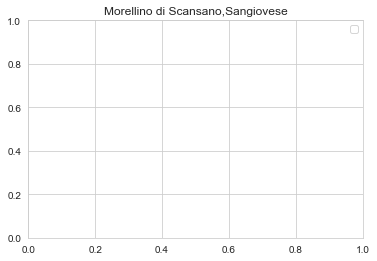

In [63]:
def get_italy_classified_regions():
    italy_region = italy_variety_year_per_region.index.tolist() # set this list into a unique list 
    myItalylist = set(italy_region)
    myItalylist = list(myItalylist)

    appended_dfs = []
    for region in myItalylist:
        # print(f'===================={region}==========================')
        try:
            varieties = list(italy_variety_year_per_region.loc[str(region)]['variety'].values)
            summary_stat_italy = show_plot(italy_var,region,varieties) ## append this df to another df. 
            appended_dfs.append(summary_stat_italy)
        except:
            variety = pd.DataFrame(italy_variety_year_per_region.loc[str(region)]).transpose()['variety'].values
            summary_stat_italy2 = show_plot(italy_var,region, variety)
            appended_dfs.append(summary_stat_italy2)

    italy_classified_regions = pd.concat(appended_dfs)

    italy_classified_regions['classification'] = np.where((italy_classified_regions['coefficient_years'] < 0) & (italy_classified_regions['p-value-year'] < 0.05) , 'appreciating', 'depreciating')
    italy_classified_regions['country'] = 'Italy'
    print(italy_classified_regions.shape)

italy_classified_regions = get_italy_classified_regions()

# Spain Regression on Price, Points and Year based on Grape Variety

#### The data I will use for this is the "data_price_df".

In [64]:
# checking the distribution of the variety per region
spain_var = data_price_df[data_price_df['country'] == 'Spain']
spain_variety_year_per_region = spain_var.groupby(['region_1','variety'])['years'].agg(['count']) 

In [65]:
#check the distribution of the variety in each region 

spain_variety_year_per_region['count'].describe()

count    546.000000
mean      11.109890
std       44.625812
min        1.000000
25%        1.000000
50%        2.000000
75%        5.000000
max      624.000000
Name: count, dtype: float64

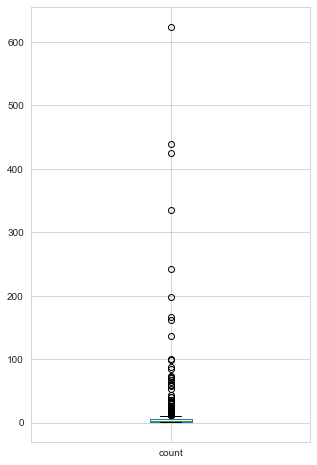

In [66]:
boxplot_spain = spain_variety_year_per_region.boxplot(column = 'count', figsize = (5,8))

In [67]:
spain_variety_year_per_region = spain_variety_year_per_region[spain_variety_year_per_region['count'] >= minimum_count_per_region].reset_index().set_index('region_1')

In [68]:
spain_variety_year_per_region.loc['Alicante']

,variety,count
region_1,,
Alicante,Monastrell,36
Alicante,Red Blend,15


36
['Garnacha Blanca', 'Red Blend', 'White Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Terra Alta,Garnacha Blanca,2007.0,1,2007.0,1,40.000000,1,88.000000
1,Terra Alta,Garnacha Blanca,2009.0,1,2009.0,1,15.000000,1,88.000000
2,Terra Alta,Garnacha Blanca,2011.0,3,2011.0,3,32.000000,3,89.000000
3,Terra Alta,Garnacha Blanca,2012.0,2,2012.0,2,24.500000,2,86.500000
4,Terra Alta,Garnacha Blanca,2013.0,3,2013.0,3,10.666667,3,87.333333
5,Terra Alta,Garnacha Blanca,2014.0,3,2014.0,3,16.000000,3,86.333333
6,Terra Alta,Garnacha Blanca,2015.0,1,2015.0,1,12.000000,1,86.000000


++++++++++++++++++++++++++++++++++++++++


No handles with labels found to put in legend.


pvals cons: 0.3143993482034201
pvals year: 0.27398304374869786
pvals points: 0.8154810779114288
The coeff1:  -2.464426399581893
The coeff2:  1.2537149275735544
the R 0.514803433885973


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
7,Terra Alta,Red Blend,2004.0,1,2004.0,1,25.00,1,81.00
8,Terra Alta,Red Blend,2005.0,2,2005.0,2,15.50,2,83.50
9,Terra Alta,Red Blend,2006.0,2,2006.0,2,24.50,2,88.50
10,Terra Alta,Red Blend,2007.0,1,2007.0,1,18.00,1,84.00
11,Terra Alta,Red Blend,2008.0,2,2008.0,2,23.50,2,86.00
12,Terra Alta,Red Blend,2009.0,4,2009.0,4,37.75,4,87.75
13,Terra Alta,Red Blend,2010.0,2,2010.0,2,24.00,2,86.00
14,Terra Alta,Red Blend,2011.0,2,2011.0,2,24.00,2,91.50
15,Terra Alta,Red Blend,2012.0,2,2012.0,2,22.00,2,89.00
16,Terra Alta,Red Blend,2013.0,4,2013.0,4,20.50,4,87.25


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.14016708450671014
pvals year: 0.13482973081598
pvals points: 0.11893267638055945
The coeff1:  -0.9758031139140466
The coeff2:  1.2384246485349495
the R 0.28730069604636355


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
19,Terra Alta,White Blend,2011.0,1,2011.0,1,15.000000,1,89.0
20,Terra Alta,White Blend,2012.0,4,2012.0,4,18.000000,4,87.5
21,Terra Alta,White Blend,2013.0,2,2013.0,2,20.000000,2,88.0
22,Terra Alta,White Blend,2014.0,3,2014.0,3,15.333333,3,87.0
23,Terra Alta,White Blend,2015.0,1,2015.0,1,12.000000,1,87.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.5771719139799014
pvals year: 0.5693024440453857
pvals points: 0.7646086292041525
The coeff1:  -1.5247311827945964
The coeff2:  -1.4623655913970972
the R 0.24500038311240502
['Chardonnay', 'Garnacha', 'Merlot', 'Red Blend', 'Rosado', 'Rosé', 'Tempranillo', 'Tempranillo Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Navarra,Chardonnay,2005.0,1,2005.0,1,12.000000,1,81.000000
1,Navarra,Chardonnay,2007.0,2,2007.0,2,13.500000,2,85.000000
2,Navarra,Chardonnay,2008.0,1,2008.0,1,14.000000,1,86.000000
3,Navarra,Chardonnay,2009.0,1,2009.0,1,14.000000,1,87.000000
4,Navarra,Chardonnay,2010.0,1,2010.0,1,14.000000,1,81.000000
5,Navarra,Chardonnay,2011.0,2,2011.0,2,14.000000,2,86.000000
6,Navarra,Chardonnay,2012.0,2,2012.0,2,12.000000,2,84.000000
7,Navarra,Chardonnay,2013.0,3,2013.0,3,13.333333,3,83.000000
8,Navarra,Chardonnay,2014.0,3,2014.0,3,14.000000,3,84.333333
9,Navarra,Chardonnay,2015.0,5,2015.0,5,14.800000,5,87.200000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.37297588825331557
pvals year: 0.39029356508496654
pvals points: 0.14449104255329534
The coeff1:  0.07897431224386131
The coeff2:  0.20232787988390954
the R 0.41121460424866074


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
10,Navarra,Garnacha,2004.0,1,2004.0,1,18.000000,1,87.000000
11,Navarra,Garnacha,2006.0,1,2006.0,1,12.000000,1,85.000000
12,Navarra,Garnacha,2007.0,2,2007.0,2,16.500000,2,86.000000
13,Navarra,Garnacha,2008.0,3,2008.0,3,29.666667,3,85.666667
14,Navarra,Garnacha,2009.0,2,2009.0,2,11.500000,2,85.500000
15,Navarra,Garnacha,2010.0,5,2010.0,5,13.400000,5,85.000000
16,Navarra,Garnacha,2011.0,6,2011.0,6,10.666667,6,84.500000
17,Navarra,Garnacha,2012.0,9,2012.0,9,15.777778,9,85.666667
18,Navarra,Garnacha,2013.0,5,2013.0,5,13.600000,5,84.800000
19,Navarra,Garnacha,2014.0,3,2014.0,3,16.333333,3,87.333333


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.6615077456901439
pvals year: 0.5428851102561035
pvals points: 0.3165205884942802
The coeff1:  -0.3084726718873534
The coeff2:  2.0537197397568754
the R 0.18043821248017844


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
21,Navarra,Merlot,1999.0,1,1999.0,1,12.000000,1,85.000000
22,Navarra,Merlot,2003.0,1,2003.0,1,15.000000,1,87.000000
23,Navarra,Merlot,2004.0,3,2004.0,3,19.666667,3,84.333333
24,Navarra,Merlot,2007.0,1,2007.0,1,18.000000,1,86.000000
25,Navarra,Merlot,2009.0,1,2009.0,1,18.000000,1,87.000000
26,Navarra,Merlot,2013.0,2,2013.0,2,9.500000,2,83.000000
27,Navarra,Merlot,2014.0,1,2014.0,1,12.000000,1,84.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.9829637777223177
pvals year: 0.8667976195300141
pvals points: 0.3023866532821965
The coeff1:  -0.056711509033170904
The coeff2:  1.3288262567663458
the R 0.3274799016014631


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
28,Navarra,Red Blend,2000.0,1,2000.0,1,22.000000,1,85.000000
29,Navarra,Red Blend,2002.0,2,2002.0,2,19.500000,2,85.500000
30,Navarra,Red Blend,2003.0,3,2003.0,3,23.000000,3,83.000000
31,Navarra,Red Blend,2004.0,2,2004.0,2,26.500000,2,85.500000
32,Navarra,Red Blend,2005.0,2,2005.0,2,35.500000,2,87.500000
33,Navarra,Red Blend,2006.0,5,2006.0,5,28.800000,5,89.000000
34,Navarra,Red Blend,2007.0,4,2007.0,4,41.250000,4,90.000000
35,Navarra,Red Blend,2008.0,8,2008.0,8,21.250000,8,85.750000
36,Navarra,Red Blend,2009.0,4,2009.0,4,14.750000,4,87.250000
37,Navarra,Red Blend,2010.0,1,2010.0,1,15.000000,1,90.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.11863422640007634
pvals year: 0.1117397700545441
pvals points: 0.0896874296698504
The coeff1:  -1.3972672503334111
The coeff2:  2.569835229067537
the R 0.3061500480617825


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
40,Navarra,Rosado,2012.0,1,2012.0,1,10.000000,1,84.000000
41,Navarra,Rosado,2013.0,3,2013.0,3,11.333333,3,85.666667
42,Navarra,Rosado,2014.0,3,2014.0,3,17.000000,3,84.000000
43,Navarra,Rosado,2015.0,3,2015.0,3,10.000000,3,85.333333
44,Navarra,Rosado,2016.0,4,2016.0,4,13.500000,4,84.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.6220135219076852
pvals year: 0.5779035013690579
pvals points: 0.4531476163646644
The coeff1:  0.7019230769231855
The coeff2:  -2.0288461538463274
the R 0.3633163315110939


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
45,Navarra,Rosé,2006.0,1,2006.0,1,13.000000,1,84.000000
46,Navarra,Rosé,2007.0,1,2007.0,1,12.000000,1,85.000000
47,Navarra,Rosé,2008.0,1,2008.0,1,15.000000,1,85.000000
48,Navarra,Rosé,2009.0,1,2009.0,1,8.000000,1,87.000000
49,Navarra,Rosé,2010.0,3,2010.0,3,9.666667,3,86.333333
50,Navarra,Rosé,2011.0,6,2011.0,6,10.166667,6,85.333333
51,Navarra,Rosé,2013.0,4,2013.0,4,9.500000,4,84.000000
52,Navarra,Rosé,2014.0,1,2014.0,1,12.000000,1,85.000000
53,Navarra,Rosé,2015.0,2,2015.0,2,14.500000,2,84.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.4627026002268412
pvals year: 0.6164891116688679
pvals points: 0.08661172979961555
The coeff1:  -0.12769179930604901
The coeff2:  -1.4893980283086317
the R 0.41151670738216006


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
54,Navarra,Tempranillo,1998.0,1,1998.0,1,12.00,1,86.0
55,Navarra,Tempranillo,2003.0,1,2003.0,1,15.00,1,83.0
56,Navarra,Tempranillo,2004.0,1,2004.0,1,17.00,1,86.0
57,Navarra,Tempranillo,2006.0,1,2006.0,1,20.00,1,84.0
58,Navarra,Tempranillo,2007.0,1,2007.0,1,11.00,1,82.0
59,Navarra,Tempranillo,2008.0,2,2008.0,2,15.50,2,85.0
60,Navarra,Tempranillo,2009.0,1,2009.0,1,8.00,1,86.0
61,Navarra,Tempranillo,2010.0,1,2010.0,1,8.00,1,86.0
62,Navarra,Tempranillo,2011.0,2,2011.0,2,8.00,2,85.0
63,Navarra,Tempranillo,2012.0,4,2012.0,4,10.25,4,84.5


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.10482391885789413
pvals year: 0.10671930556197216
pvals points: 0.6142373582276339
The coeff1:  -0.5262533293015612
The coeff2:  -0.3860767882957651
the R 0.2921602494169525


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
65,Navarra,Tempranillo Blend,2002.0,1,2002.0,1,47.000000,1,87.000000
66,Navarra,Tempranillo Blend,2003.0,1,2003.0,1,47.000000,1,89.000000
67,Navarra,Tempranillo Blend,2004.0,3,2004.0,3,12.000000,3,83.666667
68,Navarra,Tempranillo Blend,2005.0,3,2005.0,3,11.666667,3,83.333333
69,Navarra,Tempranillo Blend,2006.0,1,2006.0,1,47.000000,1,92.000000
70,Navarra,Tempranillo Blend,2008.0,1,2008.0,1,21.000000,1,86.000000
71,Navarra,Tempranillo Blend,2011.0,2,2011.0,2,32.500000,2,87.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.27501441490472256
pvals year: 0.2229832220265619
pvals points: 0.011747336512094062
The coeff1:  -1.5411427762526237
The coeff2:  4.82335097750747
the R 0.8366052654976359
['Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Montsant,Red Blend,2003.0,1,2003.0,1,27.000000,1,87.000000
1,Montsant,Red Blend,2005.0,2,2005.0,2,26.500000,2,86.500000
2,Montsant,Red Blend,2006.0,6,2006.0,6,38.000000,6,88.666667
3,Montsant,Red Blend,2007.0,3,2007.0,3,32.666667,3,91.000000
4,Montsant,Red Blend,2008.0,10,2008.0,10,25.500000,10,87.800000
5,Montsant,Red Blend,2009.0,4,2009.0,4,33.250000,4,88.750000
6,Montsant,Red Blend,2010.0,13,2010.0,13,29.615385,13,87.769231
7,Montsant,Red Blend,2011.0,12,2011.0,12,23.666667,12,87.916667
8,Montsant,Red Blend,2012.0,11,2012.0,11,27.181818,11,89.000000
9,Montsant,Red Blend,2013.0,5,2013.0,5,18.400000,5,85.600000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.19996086113916228
pvals year: 0.12675297753667786
pvals points: 0.006782038765385117
The coeff1:  -0.5784373353611416
The coeff2:  2.204649579319052
the R 0.7577159426375689
['Tempranillo', 'Tinta de Toro']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Toro,Tempranillo,2004.0,1,2004.0,1,45.000000,1,84.000000
1,Toro,Tempranillo,2005.0,3,2005.0,3,17.333333,3,85.000000
2,Toro,Tempranillo,2006.0,3,2006.0,3,15.666667,3,86.000000
3,Toro,Tempranillo,2008.0,2,2008.0,2,17.500000,2,85.000000
4,Toro,Tempranillo,2009.0,2,2009.0,2,17.500000,2,87.500000
5,Toro,Tempranillo,2010.0,2,2010.0,2,39.500000,2,89.000000
6,Toro,Tempranillo,2011.0,3,2011.0,3,20.666667,3,89.333333
7,Toro,Tempranillo,2012.0,3,2012.0,3,41.333333,3,90.666667
8,Toro,Tempranillo,2013.0,6,2013.0,6,20.000000,6,86.000000
9,Toro,Tempranillo,2015.0,2,2015.0,2,13.000000,2,85.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.3196345701286067
pvals year: 0.29744229515388054
pvals points: 0.20899522117821287
The coeff1:  -1.4144001329486269
The coeff2:  2.8245046724042795
the R 0.2399856428634659


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
10,Toro,Tinta de Toro,2003.0,2,2003.0,2,23.000000,2,90.000000
11,Toro,Tinta de Toro,2004.0,10,2004.0,10,46.900000,10,91.300000
12,Toro,Tinta de Toro,2005.0,11,2005.0,11,24.272727,11,88.000000
13,Toro,Tinta de Toro,2006.0,8,2006.0,8,33.125000,8,87.625000
14,Toro,Tinta de Toro,2007.0,10,2007.0,10,63.100000,10,88.900000
15,Toro,Tinta de Toro,2008.0,14,2008.0,14,72.928571,14,88.857143
16,Toro,Tinta de Toro,2009.0,25,2009.0,25,56.600000,25,90.320000
17,Toro,Tinta de Toro,2010.0,18,2010.0,18,34.500000,18,90.611111
18,Toro,Tinta de Toro,2011.0,20,2011.0,20,54.550000,20,90.950000
19,Toro,Tinta de Toro,2012.0,19,2012.0,19,40.263158,19,89.473684


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.9802250401689003
pvals year: 0.8964606120471235
pvals points: 0.2922315020866566
The coeff1:  -0.17501364099587502
The coeff2:  3.6254361726927025
the R 0.124031587117851
['Garnacha', 'Red Blend', 'Rosé']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Campo de Borja,Garnacha,2005.0,1,2005.0,1,14.000000,1,85.000000
1,Campo de Borja,Garnacha,2006.0,2,2006.0,2,111.500000,2,89.000000
2,Campo de Borja,Garnacha,2007.0,2,2007.0,2,17.500000,2,88.000000
3,Campo de Borja,Garnacha,2008.0,4,2008.0,4,14.250000,4,86.000000
4,Campo de Borja,Garnacha,2009.0,6,2009.0,6,47.500000,6,88.000000
5,Campo de Borja,Garnacha,2010.0,7,2010.0,7,15.142857,7,85.857143
6,Campo de Borja,Garnacha,2011.0,5,2011.0,5,18.600000,5,87.800000
7,Campo de Borja,Garnacha,2012.0,6,2012.0,6,50.833333,6,87.166667
8,Campo de Borja,Garnacha,2013.0,9,2013.0,9,37.444444,9,86.888889
9,Campo de Borja,Garnacha,2014.0,9,2014.0,9,10.333333,9,85.666667


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.8011836327316407
pvals year: 0.5385212716805137
pvals points: 0.015141335538456206
The coeff1:  -1.2134078153838357
The coeff2:  16.51667584452417
the R 0.5681671526800387


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
12,Campo de Borja,Red Blend,2005.0,1,2005.0,1,25.000000,1,81.000000
13,Campo de Borja,Red Blend,2006.0,3,2006.0,3,10.666667,3,85.333333
14,Campo de Borja,Red Blend,2007.0,1,2007.0,1,16.000000,1,89.000000
15,Campo de Borja,Red Blend,2008.0,6,2008.0,6,8.500000,6,86.000000
16,Campo de Borja,Red Blend,2009.0,3,2009.0,3,10.666667,3,87.000000
17,Campo de Borja,Red Blend,2013.0,1,2013.0,1,11.000000,1,86.000000
18,Campo de Borja,Red Blend,2014.0,2,2014.0,2,9.500000,2,83.500000
19,Campo de Borja,Red Blend,2015.0,1,2015.0,1,10.000000,1,82.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.07274057600033862
pvals year: 0.07998573726045574
pvals points: 0.18189143732077503
The coeff1:  -0.9574867560688063
The coeff2:  -0.9824478562369333
the R 0.5463101434523038


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
20,Campo de Borja,Rosé,2007.0,1,2007.0,1,8.0,1,84.0
21,Campo de Borja,Rosé,2008.0,1,2008.0,1,8.0,1,87.0
22,Campo de Borja,Rosé,2010.0,2,2010.0,2,8.0,2,85.0
23,Campo de Borja,Rosé,2011.0,2,2011.0,2,9.0,2,84.0
24,Campo de Borja,Rosé,2013.0,1,2013.0,1,9.0,1,87.0
25,Campo de Borja,Rosé,2014.0,1,2014.0,1,9.0,1,83.0
26,Campo de Borja,Rosé,2015.0,1,2015.0,1,9.0,1,82.0
27,Campo de Borja,Rosé,2016.0,1,2016.0,1,9.0,1,86.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.01820491883358628
pvals year: 0.014573467089157684
pvals points: 0.7643802214354554
The coeff1:  0.13316508313539105
The coeff2:  -0.020635391923991164
the R 0.7472288202692101
['Red Blend', 'Tempranillo', 'Tempranillo Blend', 'Tinta Fina', 'Tinto Fino', 'Tinto del Pais']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Ribera del Duero,Red Blend,2000.0,1,2000.0,1,20.000000,1,86.000000
1,Ribera del Duero,Red Blend,2004.0,1,2004.0,1,100.000000,1,91.000000
2,Ribera del Duero,Red Blend,2006.0,1,2006.0,1,50.000000,1,95.000000
3,Ribera del Duero,Red Blend,2007.0,1,2007.0,1,450.000000,1,92.000000
4,Ribera del Duero,Red Blend,2008.0,1,2008.0,1,30.000000,1,80.000000
5,Ribera del Duero,Red Blend,2009.0,2,2009.0,2,85.000000,2,89.000000
6,Ribera del Duero,Red Blend,2010.0,3,2010.0,3,75.333333,3,90.333333
7,Ribera del Duero,Red Blend,2011.0,4,2011.0,4,59.750000,4,87.250000
8,Ribera del Duero,Red Blend,2012.0,6,2012.0,6,58.666667,6,90.166667
9,Ribera del Duero,Red Blend,2013.0,1,2013.0,1,23.000000,1,82.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.886474422639284
pvals year: 0.8527123269740162
pvals points: 0.2817060005916882
The coeff1:  -1.8372187696224342
The coeff2:  10.49896063702893
the R 0.15307913425980235


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
11,Ribera del Duero,Tempranillo,2000.0,2,2000.0,2,179.000000,2,89.500000
12,Ribera del Duero,Tempranillo,2001.0,5,2001.0,5,78.400000,5,88.200000
13,Ribera del Duero,Tempranillo,2002.0,1,2002.0,1,49.000000,1,83.000000
14,Ribera del Duero,Tempranillo,2003.0,7,2003.0,7,36.571429,7,86.285714
15,Ribera del Duero,Tempranillo,2004.0,12,2004.0,12,37.500000,12,87.750000
16,Ribera del Duero,Tempranillo,2005.0,25,2005.0,25,42.720000,25,88.160000
17,Ribera del Duero,Tempranillo,2006.0,27,2006.0,27,29.259259,27,87.666667
18,Ribera del Duero,Tempranillo,2007.0,18,2007.0,18,30.722222,18,86.333333
19,Ribera del Duero,Tempranillo,2008.0,30,2008.0,30,28.000000,30,87.033333
20,Ribera del Duero,Tempranillo,2009.0,68,2009.0,68,42.382353,68,88.985294


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.03185221941596301
pvals year: 0.020891371723186728
pvals points: 0.10777042781156274
The coeff1:  -3.840635867316026
The coeff2:  6.012393949672642
the R 0.4568456047757029


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
28,Ribera del Duero,Tempranillo Blend,2001.0,1,2001.0,1,49.000000,1,86.000000
29,Ribera del Duero,Tempranillo Blend,2003.0,3,2003.0,3,221.000000,3,90.333333
30,Ribera del Duero,Tempranillo Blend,2004.0,13,2004.0,13,64.000000,13,89.384615
31,Ribera del Duero,Tempranillo Blend,2005.0,11,2005.0,11,39.454545,11,89.454545
32,Ribera del Duero,Tempranillo Blend,2006.0,19,2006.0,19,23.421053,19,87.105263
33,Ribera del Duero,Tempranillo Blend,2007.0,5,2007.0,5,42.000000,5,86.000000
34,Ribera del Duero,Tempranillo Blend,2008.0,4,2008.0,4,62.000000,4,85.750000
35,Ribera del Duero,Tempranillo Blend,2009.0,7,2009.0,7,56.000000,7,89.142857
36,Ribera del Duero,Tempranillo Blend,2010.0,9,2010.0,9,27.888889,9,88.333333
37,Ribera del Duero,Tempranillo Blend,2011.0,9,2011.0,9,37.111111,9,89.555556


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.15813094827887472
pvals year: 0.10893947877386104
pvals points: 0.1353730797784529
The coeff1:  -5.014560436424499
The coeff2:  11.850974680394286
the R 0.42228550649750995


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
42,Ribera del Duero,Tinta Fina,2005.0,1,2005.0,1,36.000000,1,90.000000
43,Ribera del Duero,Tinta Fina,2006.0,2,2006.0,2,27.000000,2,87.000000
44,Ribera del Duero,Tinta Fina,2008.0,2,2008.0,2,27.000000,2,86.000000
45,Ribera del Duero,Tinta Fina,2009.0,1,2009.0,1,40.000000,1,90.000000
46,Ribera del Duero,Tinta Fina,2010.0,3,2010.0,3,29.333333,3,87.666667
47,Ribera del Duero,Tinta Fina,2011.0,1,2011.0,1,33.000000,1,89.000000
48,Ribera del Duero,Tinta Fina,2012.0,1,2012.0,1,25.000000,1,89.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.44705074084568536
pvals year: 0.3769495541272621
pvals points: 0.07292780167781397
The coeff1:  -0.6625963453709947
The coeff2:  2.6986230189658906
the R 0.6155884371592368


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
49,Ribera del Duero,Tinto Fino,2005.0,5,2005.0,5,30.600000,5,88.000000
50,Ribera del Duero,Tinto Fino,2006.0,5,2006.0,5,71.200000,5,88.600000
51,Ribera del Duero,Tinto Fino,2007.0,3,2007.0,3,72.666667,3,89.333333
52,Ribera del Duero,Tinto Fino,2008.0,7,2008.0,7,92.000000,7,90.000000
53,Ribera del Duero,Tinto Fino,2009.0,15,2009.0,15,80.933333,15,89.933333
54,Ribera del Duero,Tinto Fino,2010.0,19,2010.0,19,97.842105,19,92.263158
55,Ribera del Duero,Tinto Fino,2011.0,15,2011.0,15,58.466667,15,91.266667
56,Ribera del Duero,Tinto Fino,2012.0,11,2012.0,11,38.818182,11,90.363636
57,Ribera del Duero,Tinto Fino,2013.0,11,2013.0,11,42.000000,11,86.727273
58,Ribera del Duero,Tinto Fino,2014.0,5,2014.0,5,24.400000,5,87.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.19320828111643246
pvals year: 0.13543511532913025
pvals points: 0.02866985458998557
The coeff1:  -3.0974886639201555
The coeff2:  9.539842061316143
the R 0.5993167059699084


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
60,Ribera del Duero,Tinto del Pais,1999.0,1,1999.0,1,18.000000,1,83.0
61,Ribera del Duero,Tinto del Pais,2000.0,1,2000.0,1,13.000000,1,84.0
62,Ribera del Duero,Tinto del Pais,2002.0,1,2002.0,1,29.000000,1,80.0
63,Ribera del Duero,Tinto del Pais,2006.0,2,2006.0,2,118.000000,2,91.5
64,Ribera del Duero,Tinto del Pais,2008.0,5,2008.0,5,52.000000,5,89.6
65,Ribera del Duero,Tinto del Pais,2009.0,1,2009.0,1,14.000000,1,86.0
66,Ribera del Duero,Tinto del Pais,2010.0,1,2010.0,1,22.000000,1,88.0
67,Ribera del Duero,Tinto del Pais,2011.0,3,2011.0,3,16.666667,3,88.0
68,Ribera del Duero,Tinto del Pais,2012.0,1,2012.0,1,15.000000,1,84.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.25624710235367115
pvals year: 0.2202577118487316
pvals points: 0.03618119906302863
The coeff1:  -3.036980253365499
The coeff2:  8.054214146088675
the R 0.546237891713873
['Red Blend', 'Tempranillo', 'Verdejo']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Vino de la Tierra de Castilla y León,Red Blend,2005.0,1,2005.0,1,30.00,1,87.00
1,Vino de la Tierra de Castilla y León,Red Blend,2006.0,1,2006.0,1,17.00,1,83.00
2,Vino de la Tierra de Castilla y León,Red Blend,2007.0,1,2007.0,1,13.00,1,85.00
3,Vino de la Tierra de Castilla y León,Red Blend,2009.0,4,2009.0,4,50.75,4,87.25
4,Vino de la Tierra de Castilla y León,Red Blend,2010.0,2,2010.0,2,90.00,2,92.50
5,Vino de la Tierra de Castilla y León,Red Blend,2012.0,2,2012.0,2,23.00,2,87.50


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.68525125533147
pvals year: 0.6167867349845209
pvals points: 0.041027932930694656
The coeff1:  -1.756276738993345
The coeff2:  9.0327600606794
the R 0.828642390182185


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
6,Vino de la Tierra de Castilla y León,Tempranillo,2000.0,1,2000.0,1,8.000000,1,84.00
7,Vino de la Tierra de Castilla y León,Tempranillo,2002.0,2,2002.0,2,45.000000,2,87.00
8,Vino de la Tierra de Castilla y León,Tempranillo,2005.0,1,2005.0,1,45.000000,1,93.00
9,Vino de la Tierra de Castilla y León,Tempranillo,2006.0,1,2006.0,1,9.000000,1,86.00
10,Vino de la Tierra de Castilla y León,Tempranillo,2007.0,2,2007.0,2,14.500000,2,87.00
11,Vino de la Tierra de Castilla y León,Tempranillo,2008.0,8,2008.0,8,36.750000,8,88.25
12,Vino de la Tierra de Castilla y León,Tempranillo,2009.0,10,2009.0,10,23.900000,10,87.00
13,Vino de la Tierra de Castilla y León,Tempranillo,2010.0,5,2010.0,5,51.800000,5,89.20
14,Vino de la Tierra de Castilla y León,Tempranillo,2011.0,3,2011.0,3,68.666667,3,93.00
15,Vino de la Tierra de Castilla y León,Tempranillo,2012.0,2,2012.0,2,35.000000,2,90.00


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.7867686421906488
pvals year: 0.9713929067039045
pvals points: 0.00634152387112665
The coeff1:  0.03803326661034667
The coeff2:  5.882027485487899
the R 0.6256592264871179


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
18,Vino de la Tierra de Castilla y León,Verdejo,2009.0,2,2009.0,2,15.0,2,85.0
19,Vino de la Tierra de Castilla y León,Verdejo,2010.0,2,2010.0,2,14.5,2,83.5
20,Vino de la Tierra de Castilla y León,Verdejo,2011.0,2,2011.0,2,16.5,2,87.0
21,Vino de la Tierra de Castilla y León,Verdejo,2012.0,1,2012.0,1,13.0,1,86.0
22,Vino de la Tierra de Castilla y León,Verdejo,2013.0,2,2013.0,2,24.0,2,84.5
23,Vino de la Tierra de Castilla y León,Verdejo,2014.0,2,2014.0,2,31.5,2,84.5
24,Vino de la Tierra de Castilla y León,Verdejo,2015.0,2,2015.0,2,19.5,2,87.5
25,Vino de la Tierra de Castilla y León,Verdejo,2016.0,1,2016.0,1,13.0,1,84.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.511851274775541
pvals year: 0.4995212454183542
pvals points: 0.833692019404973
The coeff1:  0.8177685950412545
The coeff2:  -0.4231404958677749
the R 0.10004056394465399
['Cabernet Sauvignon', 'Sparkling Blend', 'White Blend', 'Xarel-lo']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Penedès,Cabernet Sauvignon,1997.0,1,1997.0,1,19.00,1,87.00
1,Penedès,Cabernet Sauvignon,1999.0,1,1999.0,1,55.00,1,86.00
2,Penedès,Cabernet Sauvignon,2000.0,1,2000.0,1,36.00,1,85.00
3,Penedès,Cabernet Sauvignon,2003.0,1,2003.0,1,20.00,1,87.00
4,Penedès,Cabernet Sauvignon,2004.0,1,2004.0,1,58.00,1,92.00
5,Penedès,Cabernet Sauvignon,2005.0,1,2005.0,1,36.00,1,85.00
6,Penedès,Cabernet Sauvignon,2007.0,1,2007.0,1,20.00,1,89.00
7,Penedès,Cabernet Sauvignon,2008.0,4,2008.0,4,35.25,4,87.25
8,Penedès,Cabernet Sauvignon,2009.0,2,2009.0,2,24.00,2,86.00
9,Penedès,Cabernet Sauvignon,2010.0,1,2010.0,1,70.00,1,93.00


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.980565044744408
pvals year: 0.8743963744322188
pvals points: 0.04539334328899808
The coeff1:  -0.20684974373712572
The coeff2:  4.456739796004598
the R 0.4969185767708073


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
11,Penedès,Sparkling Blend,2004.0,1,2004.0,1,12.000000,1,86.000000
12,Penedès,Sparkling Blend,2005.0,1,2005.0,1,15.000000,1,88.000000
13,Penedès,Sparkling Blend,2010.0,2,2010.0,2,24.500000,2,89.500000
14,Penedès,Sparkling Blend,2011.0,4,2011.0,4,28.000000,4,87.750000
15,Penedès,Sparkling Blend,2012.0,3,2012.0,3,23.666667,3,90.333333
16,Penedès,Sparkling Blend,2013.0,3,2013.0,3,23.333333,3,89.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.07966164825490707
pvals year: 0.09210302297664594
pvals points: 0.8414161491299954
The coeff1:  1.5698336369624726
The coeff2:  -0.3452360260836973
the R 0.799775585443613


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
17,Penedès,White Blend,2002.0,1,2002.0,1,10.00,1,86.00
18,Penedès,White Blend,2005.0,1,2005.0,1,12.00,1,86.00
19,Penedès,White Blend,2006.0,2,2006.0,2,13.00,2,83.50
20,Penedès,White Blend,2009.0,2,2009.0,2,14.00,2,86.50
21,Penedès,White Blend,2010.0,5,2010.0,5,15.20,5,86.60
22,Penedès,White Blend,2011.0,4,2011.0,4,14.75,4,84.75
23,Penedès,White Blend,2013.0,4,2013.0,4,15.00,4,85.50
24,Penedès,White Blend,2014.0,2,2014.0,2,17.50,2,86.50
25,Penedès,White Blend,2015.0,2,2015.0,2,17.00,2,88.00
26,Penedès,White Blend,2016.0,1,2016.0,1,15.00,1,90.00


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.00038731284504293944
pvals year: 0.0004370368962925513
pvals points: 0.1660856667739274
The coeff1:  0.5111409386367534
The coeff2:  -0.33464781475988037
the R 0.8654915940573652


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
27,Penedès,Xarel-lo,2000.0,1,2000.0,1,15.00,1,84.00
28,Penedès,Xarel-lo,2007.0,1,2007.0,1,13.00,1,82.00
29,Penedès,Xarel-lo,2010.0,1,2010.0,1,30.00,1,84.00
30,Penedès,Xarel-lo,2012.0,2,2012.0,2,13.00,2,83.50
31,Penedès,Xarel-lo,2013.0,2,2013.0,2,22.00,2,87.50
32,Penedès,Xarel-lo,2014.0,4,2014.0,4,16.25,4,85.75
33,Penedès,Xarel-lo,2015.0,4,2015.0,4,15.75,4,86.00
34,Penedès,Xarel-lo,2016.0,2,2016.0,2,14.00,2,87.50


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.9268343008140596
pvals year: 0.9176662446786338
pvals points: 0.7863313516838306
The coeff1:  -0.06977130883557592
The coeff2:  0.48793282790900383
the R 0.017868369952424357
['Tempranillo', 'Verdejo']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,La Mancha,Tempranillo,1998.0,1,1998.0,1,9.000000,1,84.000000
1,La Mancha,Tempranillo,1999.0,1,1999.0,1,9.000000,1,88.000000
2,La Mancha,Tempranillo,2003.0,1,2003.0,1,11.000000,1,84.000000
3,La Mancha,Tempranillo,2004.0,3,2004.0,3,10.666667,3,83.666667
4,La Mancha,Tempranillo,2005.0,4,2005.0,4,17.250000,4,85.250000
5,La Mancha,Tempranillo,2006.0,2,2006.0,2,18.000000,2,86.500000
6,La Mancha,Tempranillo,2007.0,4,2007.0,4,9.000000,4,84.750000
7,La Mancha,Tempranillo,2008.0,5,2008.0,5,13.000000,5,86.800000
8,La Mancha,Tempranillo,2009.0,4,2009.0,4,10.500000,4,84.000000
9,La Mancha,Tempranillo,2010.0,10,2010.0,10,10.300000,10,85.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.53605905461626
pvals year: 0.6741643051589314
pvals points: 0.18683042556026228
The coeff1:  0.06435911517404846
The coeff2:  0.8686157946618785
the R 0.15809084917760596


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
15,La Mancha,Verdejo,2009.0,2,2009.0,2,11.0,2,85.500000
16,La Mancha,Verdejo,2010.0,1,2010.0,1,10.0,1,85.000000
17,La Mancha,Verdejo,2011.0,1,2011.0,1,11.0,1,83.000000
18,La Mancha,Verdejo,2012.0,2,2012.0,2,9.0,2,84.500000
19,La Mancha,Verdejo,2014.0,1,2014.0,1,7.0,1,83.000000
20,La Mancha,Verdejo,2015.0,1,2015.0,1,10.0,1,84.000000
21,La Mancha,Verdejo,2016.0,3,2016.0,3,11.0,3,85.666667


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.7555589277722017
pvals year: 0.6839631935478891
pvals points: 0.29759721059150024
The coeff1:  -0.101946836887715
The coeff2:  0.6673390575026854
the R 0.3061693333746226
['Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Dominio de Valdepusa,Red Blend,2002.0,1,2002.0,1,32.000000,1,87.000000
1,Dominio de Valdepusa,Red Blend,2003.0,1,2003.0,1,75.000000,1,92.000000
2,Dominio de Valdepusa,Red Blend,2005.0,3,2005.0,3,53.333333,3,91.333333
3,Dominio de Valdepusa,Red Blend,2007.0,3,2007.0,3,50.666667,3,90.000000
4,Dominio de Valdepusa,Red Blend,2008.0,3,2008.0,3,126.666667,3,91.666667
5,Dominio de Valdepusa,Red Blend,2010.0,2,2010.0,2,175.000000,2,93.500000
6,Dominio de Valdepusa,Red Blend,2011.0,1,2011.0,1,30.000000,1,92.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.981486461303605
pvals year: 0.9490665492686936
pvals points: 0.2666872755534439
The coeff1:  -0.5503380046922803
The coeff2:  17.1730151870605
the R 0.4041538367799895
['Garnacha']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Calatayud,Garnacha,2005.0,1,2005.0,1,45.000000,1,89.000000
1,Calatayud,Garnacha,2006.0,1,2006.0,1,11.000000,1,83.000000
2,Calatayud,Garnacha,2007.0,2,2007.0,2,7.000000,2,84.000000
3,Calatayud,Garnacha,2008.0,2,2008.0,2,13.500000,2,87.000000
4,Calatayud,Garnacha,2009.0,10,2009.0,10,16.600000,10,86.000000
5,Calatayud,Garnacha,2010.0,11,2010.0,11,27.363636,11,85.545455
6,Calatayud,Garnacha,2011.0,10,2011.0,10,16.300000,10,87.500000
7,Calatayud,Garnacha,2012.0,8,2012.0,8,12.875000,8,85.375000
8,Calatayud,Garnacha,2013.0,8,2013.0,8,11.875000,8,84.250000
9,Calatayud,Garnacha,2014.0,2,2014.0,2,11.000000,2,86.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.3179283511229226
pvals year: 0.2340330471214396
pvals points: 0.02909683248797938
The coeff1:  -0.9842490716215027
The coeff2:  3.883569475572876
the R 0.5544244288482507
['Pedro Ximénez']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Montilla-Moriles,Pedro Ximénez,1927.0,2,1927.0,2,27.5,2,95.0
1,Montilla-Moriles,Pedro Ximénez,1947.0,1,1947.0,1,258.0,1,93.0
2,Montilla-Moriles,Pedro Ximénez,1985.0,1,1985.0,1,33.0,1,89.0
3,Montilla-Moriles,Pedro Ximénez,2003.0,1,2003.0,1,11.0,1,90.0
4,Montilla-Moriles,Pedro Ximénez,2004.0,2,2004.0,2,23.5,2,92.5
5,Montilla-Moriles,Pedro Ximénez,2005.0,1,2005.0,1,21.0,1,91.0
6,Montilla-Moriles,Pedro Ximénez,2008.0,2,2008.0,2,23.0,2,90.0
7,Montilla-Moriles,Pedro Ximénez,2014.0,2,2014.0,2,25.0,2,90.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.47205185747298084
pvals year: 0.3354242371941774
pvals points: 0.8056479840689138
The coeff1:  -1.6641196361230213
The coeff2:  -6.463062089018572
the R 0.28169253906768155
['Chardonnay']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Somontano,Chardonnay,2007.0,1,2007.0,1,15.000000,1,86.000000
1,Somontano,Chardonnay,2009.0,1,2009.0,1,15.000000,1,86.000000
2,Somontano,Chardonnay,2011.0,1,2011.0,1,15.000000,1,80.000000
3,Somontano,Chardonnay,2012.0,1,2012.0,1,15.000000,1,82.000000
4,Somontano,Chardonnay,2013.0,3,2013.0,3,14.333333,3,83.333333
5,Somontano,Chardonnay,2014.0,2,2014.0,2,15.000000,2,84.000000
6,Somontano,Chardonnay,2015.0,3,2015.0,3,14.000000,3,83.333333
7,Somontano,Chardonnay,2016.0,4,2016.0,4,13.000000,4,86.250000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.02103751074967419
pvals year: 0.02616944477392738
pvals points: 0.13726569514305095
The coeff1:  -0.1851506634200042
The coeff2:  -0.14523226323890226
the R 0.7012742104097265
['Moscatel']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Málaga,Moscatel,2005.0,1,2005.0,1,112.000000,1,93.000000
1,Málaga,Moscatel,2007.0,1,2007.0,1,73.000000,1,90.000000
2,Málaga,Moscatel,2008.0,3,2008.0,3,35.000000,3,89.333333
3,Málaga,Moscatel,2009.0,1,2009.0,1,35.000000,1,85.000000
4,Málaga,Moscatel,2010.0,4,2010.0,4,58.250000,4,90.250000
5,Málaga,Moscatel,2011.0,3,2011.0,3,37.333333,3,88.666667
6,Málaga,Moscatel,2012.0,3,2012.0,3,27.000000,3,89.000000
7,Málaga,Moscatel,2014.0,1,2014.0,1,19.000000,1,90.000000
8,Málaga,Moscatel,2015.0,4,2015.0,4,20.500000,4,90.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.0026674957100781974
pvals year: 0.0020369953588547187
pvals points: 0.02493625177711519
The coeff1:  -6.9417345567174324
The coeff2:  6.209182876524641
the R 0.8805457091520409
['Sparkling Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Cava,Sparkling Blend,1872.0,1,1872.0,1,22.000000,1,87.000000
1,Cava,Sparkling Blend,1882.0,1,1882.0,1,10.000000,1,87.000000
2,Cava,Sparkling Blend,1887.0,2,1887.0,2,13.000000,2,83.000000
3,Cava,Sparkling Blend,1919.0,1,1919.0,1,13.000000,1,88.000000
4,Cava,Sparkling Blend,2001.0,1,2001.0,1,46.000000,1,92.000000
5,Cava,Sparkling Blend,2004.0,1,2004.0,1,14.000000,1,88.000000
6,Cava,Sparkling Blend,2005.0,5,2005.0,5,28.600000,5,89.000000
7,Cava,Sparkling Blend,2006.0,4,2006.0,4,49.750000,4,90.000000
8,Cava,Sparkling Blend,2007.0,14,2007.0,14,31.571429,14,88.428571
9,Cava,Sparkling Blend,2008.0,19,2008.0,19,31.052632,19,87.736842


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.0030835308642119807
pvals year: 0.4634111675286591
pvals points: 0.02963061562032743
The coeff1:  0.036683594342472294
The coeff2:  3.4929705879744413
the R 0.5118459492556453
['Bobal', 'Red Blend', 'Tempranillo']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Utiel-Requena,Bobal,2004.0,1,2004.0,1,20.000000,1,85.000000
1,Utiel-Requena,Bobal,2009.0,1,2009.0,1,13.000000,1,86.000000
2,Utiel-Requena,Bobal,2010.0,1,2010.0,1,13.000000,1,80.000000
3,Utiel-Requena,Bobal,2011.0,1,2011.0,1,15.000000,1,89.000000
4,Utiel-Requena,Bobal,2012.0,3,2012.0,3,12.666667,3,86.333333
5,Utiel-Requena,Bobal,2013.0,1,2013.0,1,16.000000,1,87.000000
6,Utiel-Requena,Bobal,2014.0,3,2014.0,3,13.666667,3,86.666667
7,Utiel-Requena,Bobal,2015.0,2,2015.0,2,13.000000,2,85.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.053851361956032386
pvals year: 0.05408797688284777
pvals points: 0.3372232639448082
The coeff1:  -0.5487441193880728
The coeff2:  0.3105112627348343
the R 0.565038362630742


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
8,Utiel-Requena,Red Blend,2004.0,1,2004.0,1,25.000000,1,80.0
9,Utiel-Requena,Red Blend,2006.0,2,2006.0,2,21.500000,2,84.0
10,Utiel-Requena,Red Blend,2008.0,2,2008.0,2,35.000000,2,84.0
11,Utiel-Requena,Red Blend,2009.0,3,2009.0,3,29.333333,3,89.0
12,Utiel-Requena,Red Blend,2010.0,2,2010.0,2,28.000000,2,90.0
13,Utiel-Requena,Red Blend,2011.0,1,2011.0,1,16.000000,1,86.0
14,Utiel-Requena,Red Blend,2012.0,1,2012.0,1,9.000000,1,80.0
15,Utiel-Requena,Red Blend,2014.0,2,2014.0,2,13.500000,2,85.0
16,Utiel-Requena,Red Blend,2016.0,2,2016.0,2,17.500000,2,87.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.028805617925377506
pvals year: 0.027140430534323218
pvals points: 0.06169378049464199
The coeff1:  -1.6902416138869323
The coeff2:  1.4386917328507767
the R 0.6348370693433198


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
17,Utiel-Requena,Tempranillo,2004.0,1,2004.0,1,15.0,1,82.0
18,Utiel-Requena,Tempranillo,2005.0,2,2005.0,2,9.0,2,83.0
19,Utiel-Requena,Tempranillo,2006.0,2,2006.0,2,12.0,2,83.0
20,Utiel-Requena,Tempranillo,2007.0,1,2007.0,1,10.0,1,87.0
21,Utiel-Requena,Tempranillo,2009.0,2,2009.0,2,8.5,2,82.5
22,Utiel-Requena,Tempranillo,2010.0,2,2010.0,2,7.5,2,81.5
23,Utiel-Requena,Tempranillo,2011.0,1,2011.0,1,10.0,1,85.0
24,Utiel-Requena,Tempranillo,2012.0,2,2012.0,2,11.0,2,86.0
25,Utiel-Requena,Tempranillo,2016.0,1,2016.0,1,11.0,1,86.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.38955906708824944
pvals year: 0.39488689873729577
pvals points: 0.6024565631379715
The coeff1:  -0.2318366240280595
The coeff2:  0.2637236010109548
the R 0.12430487699987636
['White Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Ribeiro,White Blend,2006.0,2,2006.0,2,14.500000,2,87.00
1,Ribeiro,White Blend,2007.0,1,2007.0,1,10.000000,1,82.00
2,Ribeiro,White Blend,2008.0,4,2008.0,4,15.500000,4,88.25
3,Ribeiro,White Blend,2009.0,4,2009.0,4,30.500000,4,90.00
4,Ribeiro,White Blend,2010.0,1,2010.0,1,15.000000,1,88.00
5,Ribeiro,White Blend,2011.0,2,2011.0,2,15.000000,2,88.00
6,Ribeiro,White Blend,2013.0,3,2013.0,3,14.333333,3,87.00
7,Ribeiro,White Blend,2014.0,2,2014.0,2,13.500000,2,87.50
8,Ribeiro,White Blend,2015.0,1,2015.0,1,18.000000,1,89.00


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.4448957243986995
pvals year: 0.3761720749668473
pvals points: 0.031678129651360715
The coeff1:  -0.5035519434097149
The coeff2:  2.07088836211762
the R 0.5645774845934612
['Tempranillo']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Cigales,Tempranillo,1998.0,1,1998.0,1,19.000000,1,89.000000
1,Cigales,Tempranillo,1999.0,1,1999.0,1,10.000000,1,84.000000
2,Cigales,Tempranillo,2003.0,1,2003.0,1,25.000000,1,90.000000
3,Cigales,Tempranillo,2004.0,2,2004.0,2,40.000000,2,87.500000
4,Cigales,Tempranillo,2005.0,2,2005.0,2,24.000000,2,87.500000
5,Cigales,Tempranillo,2006.0,2,2006.0,2,42.500000,2,88.500000
6,Cigales,Tempranillo,2009.0,1,2009.0,1,69.000000,1,89.000000
7,Cigales,Tempranillo,2010.0,1,2010.0,1,20.000000,1,85.000000
8,Cigales,Tempranillo,2011.0,1,2011.0,1,20.000000,1,91.000000
9,Cigales,Tempranillo,2012.0,2,2012.0,2,31.000000,2,88.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.20851172772676488
pvals year: 0.26172946369407446
pvals points: 0.2286035083649202
The coeff1:  1.3046321212006746
The coeff2:  3.6086145243155974
the R 0.30988961104049995
['Hondarrabi Zuri', 'White Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Getariako Txakolina,Hondarrabi Zuri,2013.0,1,2013.0,1,29.000000,1,90.000000
1,Getariako Txakolina,Hondarrabi Zuri,2014.0,5,2014.0,5,22.800000,5,88.000000
2,Getariako Txakolina,Hondarrabi Zuri,2015.0,3,2015.0,3,20.333333,3,85.333333
3,Getariako Txakolina,Hondarrabi Zuri,2016.0,3,2016.0,3,20.666667,3,84.333333


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.7356209297662364
pvals year: 0.7394448780780011
pvals points: 0.5541661369430682
The coeff1:  2.9943262411318585
The coeff2:  2.919148936234407
the R 0.8706614135719135


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
4,Getariako Txakolina,White Blend,2007.0,1,2007.0,1,25.000000,1,86.000000
5,Getariako Txakolina,White Blend,2009.0,1,2009.0,1,25.000000,1,88.000000
6,Getariako Txakolina,White Blend,2010.0,1,2010.0,1,25.000000,1,89.000000
7,Getariako Txakolina,White Blend,2011.0,5,2011.0,5,23.400000,5,85.400000
8,Getariako Txakolina,White Blend,2012.0,1,2012.0,1,26.000000,1,86.000000
9,Getariako Txakolina,White Blend,2013.0,3,2013.0,3,23.333333,3,85.666667
10,Getariako Txakolina,White Blend,2014.0,1,2014.0,1,22.000000,1,88.000000
11,Getariako Txakolina,White Blend,2015.0,4,2015.0,4,19.500000,4,85.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.06581692136281841
pvals year: 0.06320594121189305
pvals points: 0.7063225669082727
The coeff1:  -0.5665799659166951
The coeff2:  0.18033150468966985
the R 0.5671384218823317
['Garnacha', 'Graciano', 'Red Blend', 'Rosado', 'Rosé', 'Tempranillo', 'Tempranillo Blend', 'Tempranillo-Garnacha', 'Viura', 'White Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Rioja,Garnacha,2007.0,3,2007.0,3,38.333333,3,85.666667
1,Rioja,Garnacha,2008.0,4,2008.0,4,50.000000,4,83.750000
2,Rioja,Garnacha,2010.0,3,2010.0,3,49.000000,3,87.666667
3,Rioja,Garnacha,2011.0,6,2011.0,6,45.333333,6,87.000000
4,Rioja,Garnacha,2012.0,4,2012.0,4,26.750000,4,87.250000
5,Rioja,Garnacha,2014.0,3,2014.0,3,38.000000,3,86.666667


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.6254412540637102
pvals year: 0.6580160069622057
pvals points: 0.8181874053195332
The coeff1:  -1.072799391210851
The coeff2:  -0.9889917438071709
the R 0.18758028284479156


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
6,Rioja,Graciano,2004.0,2,2004.0,2,91.50,2,89.00
7,Rioja,Graciano,2005.0,2,2005.0,2,121.00,2,86.00
8,Rioja,Graciano,2006.0,1,2006.0,1,115.00,1,88.00
9,Rioja,Graciano,2007.0,1,2007.0,1,20.00,1,82.00
10,Rioja,Graciano,2008.0,2,2008.0,2,70.50,2,87.00
11,Rioja,Graciano,2009.0,4,2009.0,4,60.75,4,88.75
12,Rioja,Graciano,2010.0,1,2010.0,1,10.00,1,87.00
13,Rioja,Graciano,2011.0,4,2011.0,4,55.00,4,89.25
14,Rioja,Graciano,2012.0,2,2012.0,2,11.00,2,87.00
15,Rioja,Graciano,2014.0,1,2014.0,1,40.00,1,87.00


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.018109473980339005
pvals year: 0.014842288828869997
pvals points: 0.1892526189346709
The coeff1:  -7.665607727015959
The coeff2:  5.860250047001081
the R 0.6244989729158197


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
17,Rioja,Red Blend,1994.0,1,1994.0,1,25.000000,1,88.000000
18,Rioja,Red Blend,1997.0,1,1997.0,1,10.000000,1,80.000000
19,Rioja,Red Blend,1998.0,1,1998.0,1,14.000000,1,86.000000
20,Rioja,Red Blend,2001.0,1,2001.0,1,36.000000,1,89.000000
21,Rioja,Red Blend,2003.0,1,2003.0,1,15.000000,1,85.000000
22,Rioja,Red Blend,2004.0,3,2004.0,3,56.000000,3,89.666667
23,Rioja,Red Blend,2005.0,6,2005.0,6,45.166667,6,92.333333
24,Rioja,Red Blend,2006.0,2,2006.0,2,43.500000,2,90.000000
25,Rioja,Red Blend,2007.0,8,2007.0,8,27.250000,8,87.375000
26,Rioja,Red Blend,2008.0,7,2008.0,7,50.714286,7,87.285714


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.47139004721958533
pvals year: 0.6633675779101508
pvals points: 0.014790491495462695
The coeff1:  0.2440036228614999
The coeff2:  3.6563791859127175
the R 0.43827475935536186


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
35,Rioja,Rosado,2012.0,2,2012.0,2,10.500000,2,83.000000
36,Rioja,Rosado,2013.0,4,2013.0,4,16.250000,4,85.500000
37,Rioja,Rosado,2014.0,13,2014.0,13,13.846154,13,85.615385
38,Rioja,Rosado,2015.0,8,2015.0,8,13.500000,8,85.500000
39,Rioja,Rosado,2016.0,5,2016.0,5,12.400000,5,85.400000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.10898270681701477
pvals year: 0.09930291791978231
pvals points: 0.04133759320706948
The coeff1:  -1.0617343494404285
The coeff2:  2.4306965613346447
the R 0.9195381975558516


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
40,Rioja,Rosé,2007.0,3,2007.0,3,11.333333,3,87.333333
41,Rioja,Rosé,2008.0,2,2008.0,2,11.000000,2,84.000000
42,Rioja,Rosé,2009.0,2,2009.0,2,10.500000,2,86.500000
43,Rioja,Rosé,2010.0,7,2010.0,7,9.857143,7,85.714286
44,Rioja,Rosé,2011.0,7,2011.0,7,10.857143,7,86.000000
45,Rioja,Rosé,2012.0,6,2012.0,6,11.500000,6,84.666667
46,Rioja,Rosé,2013.0,5,2013.0,5,11.000000,5,84.200000
47,Rioja,Rosé,2014.0,3,2014.0,3,12.333333,3,86.333333
48,Rioja,Rosé,2015.0,10,2015.0,10,11.500000,10,85.600000
49,Rioja,Rosé,2016.0,8,2016.0,8,17.875000,8,87.250000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.041274249643714796
pvals year: 0.051312689544326724
pvals points: 0.14873376313307457
The coeff1:  0.44044568598072154
The coeff2:  0.785877760363769
the R 0.5517410243690803


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
50,Rioja,Tempranillo,1994.0,1,1994.0,1,29.000000,1,87.000000
51,Rioja,Tempranillo,1996.0,2,1996.0,2,16.500000,2,85.000000
52,Rioja,Tempranillo,1997.0,1,1997.0,1,45.000000,1,89.000000
53,Rioja,Tempranillo,1998.0,6,1998.0,6,24.833333,6,86.833333
54,Rioja,Tempranillo,1999.0,3,1999.0,3,38.333333,3,90.333333
55,Rioja,Tempranillo,2000.0,1,2000.0,1,7.000000,1,83.000000
56,Rioja,Tempranillo,2001.0,13,2001.0,13,40.384615,13,88.923077
57,Rioja,Tempranillo,2002.0,5,2002.0,5,27.600000,5,87.200000
58,Rioja,Tempranillo,2003.0,7,2003.0,7,31.571429,7,88.000000
59,Rioja,Tempranillo,2004.0,36,2004.0,36,32.194444,36,88.361111


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.6706861317286835
pvals year: 0.08371263231752135
pvals points: 4.659284367197147e-08
The coeff1:  -0.2790782875077401
The coeff2:  5.214266763062502
the R 0.819904459149239


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
71,Rioja,Tempranillo Blend,1978.0,1,1978.0,1,225.000000,1,83.000000
72,Rioja,Tempranillo Blend,1995.0,1,1995.0,1,60.000000,1,92.000000
73,Rioja,Tempranillo Blend,1996.0,1,1996.0,1,40.000000,1,91.000000
74,Rioja,Tempranillo Blend,1998.0,3,1998.0,3,53.333333,3,90.333333
75,Rioja,Tempranillo Blend,1999.0,1,1999.0,1,34.000000,1,90.000000
76,Rioja,Tempranillo Blend,2000.0,3,2000.0,3,42.333333,3,87.666667
77,Rioja,Tempranillo Blend,2001.0,15,2001.0,15,38.333333,15,88.466667
78,Rioja,Tempranillo Blend,2002.0,4,2002.0,4,32.750000,4,87.500000
79,Rioja,Tempranillo Blend,2003.0,11,2003.0,11,30.363636,11,87.545455
80,Rioja,Tempranillo Blend,2004.0,34,2004.0,34,39.411765,34,89.117647


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 1.061469133145926e-06
pvals year: 3.75980429360208e-06
pvals points: 0.007084231079423144
The coeff1:  -4.022586508954767
The coeff2:  -7.618765048870991
the R 0.7857768002851836


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
91,Rioja,Tempranillo-Garnacha,2008.0,4,2008.0,4,12.500000,4,85.500000
92,Rioja,Tempranillo-Garnacha,2009.0,3,2009.0,3,12.666667,3,83.666667
93,Rioja,Tempranillo-Garnacha,2010.0,1,2010.0,1,10.000000,1,83.000000
94,Rioja,Tempranillo-Garnacha,2011.0,3,2011.0,3,12.666667,3,85.666667
95,Rioja,Tempranillo-Garnacha,2013.0,2,2013.0,2,12.000000,2,87.000000
96,Rioja,Tempranillo-Garnacha,2014.0,1,2014.0,1,11.000000,1,86.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.1847598291917299
pvals year: 0.17977349220631506
pvals points: 0.1698083526940084
The coeff1:  -0.38445035212916934
The coeff2:  0.6101860920666743
the R 0.5682075891675793


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
97,Rioja,Viura,2000.0,1,2000.0,1,13.000000,1,86.000000
98,Rioja,Viura,2003.0,1,2003.0,1,26.000000,1,91.000000
99,Rioja,Viura,2007.0,4,2007.0,4,11.000000,4,85.750000
100,Rioja,Viura,2008.0,3,2008.0,3,19.666667,3,87.666667
101,Rioja,Viura,2009.0,6,2009.0,6,17.000000,6,86.833333
102,Rioja,Viura,2010.0,7,2010.0,7,17.000000,7,85.142857
103,Rioja,Viura,2011.0,8,2011.0,8,17.750000,8,83.875000
104,Rioja,Viura,2012.0,16,2012.0,16,14.562500,16,85.312500
105,Rioja,Viura,2013.0,5,2013.0,5,19.200000,5,84.600000
106,Rioja,Viura,2014.0,13,2014.0,13,14.307692,13,85.230769


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.3633463528130414
pvals year: 0.4668542408719518
pvals points: 0.031289207993194644
The coeff1:  0.18005141823192544
The coeff2:  1.586302148440958
the R 0.4266838347502221


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
109,Rioja,White Blend,2000.0,2,2000.0,2,7.000000,2,83.000000
110,Rioja,White Blend,2002.0,1,2002.0,1,8.000000,1,84.000000
111,Rioja,White Blend,2005.0,1,2005.0,1,26.000000,1,88.000000
112,Rioja,White Blend,2006.0,5,2006.0,5,25.400000,5,86.600000
113,Rioja,White Blend,2007.0,2,2007.0,2,10.500000,2,84.000000
114,Rioja,White Blend,2008.0,3,2008.0,3,34.666667,3,88.000000
115,Rioja,White Blend,2009.0,9,2009.0,9,22.777778,9,86.666667
116,Rioja,White Blend,2010.0,5,2010.0,5,18.400000,5,86.200000
117,Rioja,White Blend,2011.0,2,2011.0,2,13.500000,2,84.500000
118,Rioja,White Blend,2012.0,5,2012.0,5,23.600000,5,86.600000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.8585443687786981
pvals year: 0.4648403320550847
pvals points: 0.0005176117854816957
The coeff1:  -0.24886722306516018
The coeff2:  4.723091620201051
the R 0.7191354786709009
['Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Empordà,Red Blend,2005.0,4,2005.0,4,26.250000,4,85.000000
1,Empordà,Red Blend,2006.0,1,2006.0,1,19.000000,1,85.000000
2,Empordà,Red Blend,2007.0,2,2007.0,2,45.000000,2,87.000000
3,Empordà,Red Blend,2009.0,2,2009.0,2,27.500000,2,88.500000
4,Empordà,Red Blend,2011.0,1,2011.0,1,27.000000,1,90.000000
5,Empordà,Red Blend,2012.0,3,2012.0,3,24.333333,3,91.333333


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.1739931016181907
pvals year: 0.17426375479408712
pvals points: 0.17728734855701503
The coeff1:  -14.882990003044332
The coeff2:  15.822326567721305
the R 0.5118395977964196
['Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Costers del Segre,Red Blend,2007.0,1,2007.0,1,34.000000,1,87.0
1,Costers del Segre,Red Blend,2009.0,2,2009.0,2,24.500000,2,88.0
2,Costers del Segre,Red Blend,2010.0,3,2010.0,3,44.333333,3,88.0
3,Costers del Segre,Red Blend,2011.0,1,2011.0,1,18.000000,1,91.0
4,Costers del Segre,Red Blend,2012.0,1,2012.0,1,19.000000,1,86.0
5,Costers del Segre,Red Blend,2014.0,2,2014.0,2,57.500000,2,88.5
6,Costers del Segre,Red Blend,2015.0,2,2015.0,2,15.000000,2,86.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.9981307195345135
pvals year: 0.9890257329987447
pvals points: 0.7657509706912163
The coeff1:  -0.04127549837742084
The coeff2:  1.4542767732962354
the R 0.025723153870048865
['Pansa Blanca']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Alella,Pansa Blanca,2007.0,1,2007.0,1,12.000000,1,87.000
1,Alella,Pansa Blanca,2010.0,1,2010.0,1,12.000000,1,87.000
2,Alella,Pansa Blanca,2012.0,1,2012.0,1,15.000000,1,86.000
3,Alella,Pansa Blanca,2014.0,3,2014.0,3,20.333333,3,85.000
4,Alella,Pansa Blanca,2015.0,8,2015.0,8,18.625000,8,85.375


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.5118910496180613
pvals year: 0.8664818229057691
pvals points: 0.045150941306487447
The coeff1:  -0.05117639239659244
The coeff2:  -4.273516770791693
the R 0.9825563795470293
['Godello', 'Mencía']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Valdeorras,Godello,2006.0,1,2006.0,1,27.000000,1,87.000000
1,Valdeorras,Godello,2007.0,2,2007.0,2,18.500000,2,88.500000
2,Valdeorras,Godello,2008.0,2,2008.0,2,19.000000,2,88.000000
3,Valdeorras,Godello,2009.0,3,2009.0,3,16.666667,3,86.666667
4,Valdeorras,Godello,2010.0,2,2010.0,2,20.000000,2,88.500000
5,Valdeorras,Godello,2011.0,8,2011.0,8,26.875000,8,85.875000
6,Valdeorras,Godello,2012.0,3,2012.0,3,18.333333,3,87.000000
7,Valdeorras,Godello,2013.0,6,2013.0,6,21.666667,6,86.333333
8,Valdeorras,Godello,2014.0,2,2014.0,2,25.000000,2,87.000000
9,Valdeorras,Godello,2015.0,7,2015.0,7,23.000000,7,89.428571


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.7161376335381052
pvals year: 0.6332051331666646
pvals points: 0.4488009649256467
The coeff1:  0.2183747141880965
The coeff2:  -0.9461577757346813
the R 0.11105906736984306


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
10,Valdeorras,Mencía,2009.0,1,2009.0,1,49.0,1,87.0
11,Valdeorras,Mencía,2010.0,4,2010.0,4,22.0,4,89.0
12,Valdeorras,Mencía,2011.0,2,2011.0,2,21.0,2,88.5
13,Valdeorras,Mencía,2012.0,2,2012.0,2,18.0,2,87.0
14,Valdeorras,Mencía,2013.0,2,2013.0,2,21.0,2,85.0
15,Valdeorras,Mencía,2014.0,1,2014.0,1,44.0,1,90.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.8359463745907245
pvals year: 0.8215932004144884
pvals points: 0.6348777095269187
The coeff1:  -0.980162308384168
The coeff2:  2.20378719567168
the R 0.09825417435262462
['Tempranillo']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Valdepeñas,Tempranillo,1999.0,3,1999.0,3,14.333333,3,85.333333
1,Valdepeñas,Tempranillo,2001.0,1,2001.0,1,16.000000,1,86.000000
2,Valdepeñas,Tempranillo,2003.0,1,2003.0,1,12.000000,1,86.000000
3,Valdepeñas,Tempranillo,2004.0,4,2004.0,4,14.500000,4,84.250000
4,Valdepeñas,Tempranillo,2005.0,4,2005.0,4,13.250000,4,85.500000
5,Valdepeñas,Tempranillo,2006.0,3,2006.0,3,15.000000,3,83.666667
6,Valdepeñas,Tempranillo,2007.0,4,2007.0,4,12.500000,4,82.250000
7,Valdepeñas,Tempranillo,2008.0,1,2008.0,1,12.000000,1,82.000000
8,Valdepeñas,Tempranillo,2009.0,4,2009.0,4,10.750000,4,84.500000
9,Valdepeñas,Tempranillo,2010.0,3,2010.0,3,10.000000,3,84.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.0006333379636267836
pvals year: 0.0007168591922733564
pvals points: 0.17640578934709494
The coeff1:  -0.4988920022442621
The coeff2:  -0.4051772539040208
the R 0.7393761255411719
['Monastrell', 'Monastrell-Syrah', 'Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Jumilla,Monastrell,1995.0,1,1995.0,1,12.000000,1,83.000000
1,Jumilla,Monastrell,2000.0,1,2000.0,1,9.000000,1,85.000000
2,Jumilla,Monastrell,2004.0,1,2004.0,1,40.000000,1,90.000000
3,Jumilla,Monastrell,2006.0,2,2006.0,2,11.500000,2,87.000000
4,Jumilla,Monastrell,2007.0,5,2007.0,5,13.800000,5,85.200000
5,Jumilla,Monastrell,2008.0,7,2008.0,7,13.857143,7,85.428571
6,Jumilla,Monastrell,2009.0,7,2009.0,7,14.714286,7,86.714286
7,Jumilla,Monastrell,2010.0,10,2010.0,10,12.800000,10,86.600000
8,Jumilla,Monastrell,2011.0,10,2011.0,10,18.400000,10,87.300000
9,Jumilla,Monastrell,2012.0,6,2012.0,6,14.166667,6,86.166667


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.4111431599417733
pvals year: 0.1650756003424234
pvals points: 0.0005294847000154703
The coeff1:  -0.4456347587844692
The coeff2:  5.002084606961812
the R 0.7259421012965888


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
13,Jumilla,Monastrell-Syrah,2010.0,3,2010.0,3,26.333333,3,84.333333
14,Jumilla,Monastrell-Syrah,2011.0,3,2011.0,3,16.333333,3,86.000000
15,Jumilla,Monastrell-Syrah,2012.0,3,2012.0,3,13.333333,3,85.666667
16,Jumilla,Monastrell-Syrah,2013.0,4,2013.0,4,20.500000,4,88.000000
17,Jumilla,Monastrell-Syrah,2014.0,3,2014.0,3,17.333333,3,86.000000
18,Jumilla,Monastrell-Syrah,2015.0,2,2015.0,2,11.000000,2,86.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.23876455693216814
pvals year: 0.24795059426216862
pvals points: 0.8317968711330022
The coeff1:  -2.0621230398069788
The coeff2:  0.5319662243666361
the R 0.4368540072090974


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
19,Jumilla,Red Blend,2003.0,2,2003.0,2,39.000000,2,88.000000
20,Jumilla,Red Blend,2005.0,3,2005.0,3,16.000000,3,88.666667
21,Jumilla,Red Blend,2006.0,5,2006.0,5,20.800000,5,88.600000
22,Jumilla,Red Blend,2007.0,2,2007.0,2,104.500000,2,92.000000
23,Jumilla,Red Blend,2008.0,2,2008.0,2,11.500000,2,88.000000
24,Jumilla,Red Blend,2009.0,5,2009.0,5,21.600000,5,88.000000
25,Jumilla,Red Blend,2010.0,6,2010.0,6,36.666667,6,86.833333
26,Jumilla,Red Blend,2011.0,7,2011.0,7,38.857143,7,90.142857
27,Jumilla,Red Blend,2012.0,8,2012.0,8,38.875000,8,88.750000
28,Jumilla,Red Blend,2013.0,13,2013.0,13,16.307692,13,86.846154


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.8454552513262832
pvals year: 0.838731479377602
pvals points: 0.0052360267847660884
The coeff1:  -0.2984144821028367
The coeff2:  13.856905324258607
the R 0.6211733005659466
['Red Blend', 'White Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Priorat,Red Blend,1998.0,1,1998.0,1,46.000000,1,84.000000
1,Priorat,Red Blend,2000.0,1,2000.0,1,90.000000,1,92.000000
2,Priorat,Red Blend,2003.0,4,2003.0,4,56.000000,4,89.500000
3,Priorat,Red Blend,2004.0,6,2004.0,6,54.666667,6,88.000000
4,Priorat,Red Blend,2005.0,13,2005.0,13,54.076923,13,90.769231
5,Priorat,Red Blend,2006.0,18,2006.0,18,55.611111,18,90.833333
6,Priorat,Red Blend,2007.0,20,2007.0,20,52.650000,20,89.600000
7,Priorat,Red Blend,2008.0,16,2008.0,16,37.937500,16,88.562500
8,Priorat,Red Blend,2009.0,29,2009.0,29,42.172414,29,89.275862
9,Priorat,Red Blend,2010.0,27,2010.0,27,50.777778,27,90.814815


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 5.880591259749149e-07
pvals year: 2.8336416949630916e-07
pvals points: 3.4754352600868867e-06
The coeff1:  -2.518290685721716
The coeff2:  5.6276497585573875
the R 0.90053622941524


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
16,Priorat,White Blend,2007.0,3,2007.0,3,56.000000,3,90.666667
17,Priorat,White Blend,2008.0,1,2008.0,1,40.000000,1,82.000000
18,Priorat,White Blend,2009.0,1,2009.0,1,40.000000,1,88.000000
19,Priorat,White Blend,2011.0,2,2011.0,2,41.500000,2,89.000000
20,Priorat,White Blend,2012.0,1,2012.0,1,25.000000,1,88.000000
21,Priorat,White Blend,2013.0,2,2013.0,2,33.000000,2,88.000000
22,Priorat,White Blend,2014.0,3,2014.0,3,93.333333,3,89.000000
23,Priorat,White Blend,2015.0,1,2015.0,1,50.000000,1,87.000000
24,Priorat,White Blend,2016.0,1,2016.0,1,30.000000,1,82.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.6895623031527038
pvals year: 0.7144150164228791
pvals points: 0.3113038885964629
The coeff1:  0.9440313552618245
The coeff2:  2.8202612011565034
the R 0.17108465772030368
['Sauvignon Blanc', 'Verdejo', 'Verdejo-Viura', 'White Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Rueda,Sauvignon Blanc,2006.0,2,2006.0,2,16.500000,2,85.0
1,Rueda,Sauvignon Blanc,2008.0,1,2008.0,1,11.000000,1,85.0
2,Rueda,Sauvignon Blanc,2012.0,1,2012.0,1,13.000000,1,85.0
3,Rueda,Sauvignon Blanc,2013.0,1,2013.0,1,22.000000,1,83.0
4,Rueda,Sauvignon Blanc,2014.0,5,2014.0,5,16.600000,5,84.6
5,Rueda,Sauvignon Blanc,2015.0,3,2015.0,3,14.333333,3,86.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.7872478688574535
pvals year: 0.5534593147055299
pvals points: 0.10963349096401448
The coeff1:  0.24181502167151692
The coeff2:  -2.964460249585472
the R 0.6533454126181466


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
6,Rueda,Verdejo,2000.0,2,2000.0,2,11.000000,2,84.000000
7,Rueda,Verdejo,2005.0,3,2005.0,3,17.000000,3,84.666667
8,Rueda,Verdejo,2006.0,10,2006.0,10,18.100000,10,86.800000
9,Rueda,Verdejo,2007.0,8,2007.0,8,16.250000,8,87.875000
10,Rueda,Verdejo,2008.0,10,2008.0,10,17.500000,10,85.800000
11,Rueda,Verdejo,2009.0,14,2009.0,14,19.214286,14,88.142857
12,Rueda,Verdejo,2010.0,11,2010.0,11,15.363636,11,85.909091
13,Rueda,Verdejo,2011.0,24,2011.0,24,15.916667,24,86.208333
14,Rueda,Verdejo,2012.0,23,2012.0,23,16.173913,23,85.695652
15,Rueda,Verdejo,2013.0,38,2013.0,38,14.894737,38,86.815789


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.5541389293852357
pvals year: 0.7852862285996703
pvals points: 0.049286585837006736
The coeff1:  0.03407406067053487
The coeff2:  1.0103778127009588
the R 0.43179265666379785


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
19,Rueda,Verdejo-Viura,2008.0,3,2008.0,3,12.333333,3,84.000000
20,Rueda,Verdejo-Viura,2009.0,2,2009.0,2,10.000000,2,86.000000
21,Rueda,Verdejo-Viura,2010.0,1,2010.0,1,10.000000,1,87.000000
22,Rueda,Verdejo-Viura,2011.0,2,2011.0,2,12.000000,2,87.000000
23,Rueda,Verdejo-Viura,2012.0,1,2012.0,1,12.000000,1,84.000000
24,Rueda,Verdejo-Viura,2013.0,2,2013.0,2,8.500000,2,86.500000
25,Rueda,Verdejo-Viura,2014.0,3,2014.0,3,10.000000,3,85.333333
26,Rueda,Verdejo-Viura,2015.0,3,2015.0,3,9.333333,3,86.666667
27,Rueda,Verdejo-Viura,2016.0,1,2016.0,1,16.000000,1,85.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.6311168233001074
pvals year: 0.5239894066811184
pvals points: 0.16881713725341196
The coeff1:  0.18889477233332808
The coeff2:  -1.0001629261537168
the R 0.314120869856948


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
28,Rueda,White Blend,2000.0,1,2000.0,1,9.000000,1,85.000000
29,Rueda,White Blend,2007.0,2,2007.0,2,10.500000,2,87.000000
30,Rueda,White Blend,2009.0,1,2009.0,1,15.000000,1,84.000000
31,Rueda,White Blend,2010.0,1,2010.0,1,10.000000,1,84.000000
32,Rueda,White Blend,2011.0,3,2011.0,3,11.000000,3,86.333333
33,Rueda,White Blend,2012.0,2,2012.0,2,14.000000,2,83.500000
34,Rueda,White Blend,2013.0,1,2013.0,1,13.000000,1,87.000000
35,Rueda,White Blend,2014.0,1,2014.0,1,14.000000,1,87.000000
36,Rueda,White Blend,2015.0,3,2015.0,3,14.333333,3,89.000000
37,Rueda,White Blend,2016.0,1,2016.0,1,9.000000,1,86.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.30099678878501557
pvals year: 0.29947980479411396
pvals points: 0.9151130873701714
The coeff1:  0.20794307900702025
The coeff2:  -0.055038838303712145
the R 0.16307593346624905
['Garnacha', 'Red Blend', 'Tempranillo']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Cariñena,Garnacha,2001.0,1,2001.0,1,5.000000,1,84.000000
1,Cariñena,Garnacha,2005.0,1,2005.0,1,21.000000,1,82.000000
2,Cariñena,Garnacha,2006.0,3,2006.0,3,15.000000,3,83.333333
3,Cariñena,Garnacha,2007.0,3,2007.0,3,17.333333,3,87.000000
4,Cariñena,Garnacha,2008.0,8,2008.0,8,12.875000,8,84.125000
5,Cariñena,Garnacha,2009.0,4,2009.0,4,11.000000,4,85.500000
6,Cariñena,Garnacha,2010.0,10,2010.0,10,14.800000,10,85.400000
7,Cariñena,Garnacha,2011.0,5,2011.0,5,14.000000,5,86.000000
8,Cariñena,Garnacha,2012.0,11,2012.0,11,16.454545,11,86.181818
9,Cariñena,Garnacha,2013.0,5,2013.0,5,13.200000,5,83.600000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.6571839398287556
pvals year: 0.6217385368310346
pvals points: 0.6454267011170658
The coeff1:  0.1821180402145609
The coeff2:  -0.4692611433753305
the R 0.0355564778394567


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
12,Cariñena,Red Blend,1999.0,1,1999.0,1,22.000000,1,81.000000
13,Cariñena,Red Blend,2001.0,1,2001.0,1,22.000000,1,85.000000
14,Cariñena,Red Blend,2002.0,3,2002.0,3,14.666667,3,84.000000
15,Cariñena,Red Blend,2003.0,1,2003.0,1,22.000000,1,83.000000
16,Cariñena,Red Blend,2004.0,3,2004.0,3,20.666667,3,88.000000
17,Cariñena,Red Blend,2005.0,3,2005.0,3,20.333333,3,85.666667
18,Cariñena,Red Blend,2006.0,2,2006.0,2,25.000000,2,84.000000
19,Cariñena,Red Blend,2009.0,2,2009.0,2,16.000000,2,86.500000
20,Cariñena,Red Blend,2010.0,2,2010.0,2,19.000000,2,86.500000
21,Cariñena,Red Blend,2012.0,2,2012.0,2,12.000000,2,86.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.021945325371379918
pvals year: 0.02395555130716285
pvals points: 0.49651514125590535
The coeff1:  -0.8024800725232266
The coeff2:  0.4644952356071179
the R 0.49609468345252783


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
23,Cariñena,Tempranillo,2008.0,2,2008.0,2,9.00,2,87.00
24,Cariñena,Tempranillo,2009.0,1,2009.0,1,11.00,1,85.00
25,Cariñena,Tempranillo,2013.0,3,2013.0,3,10.00,3,85.00
26,Cariñena,Tempranillo,2015.0,4,2015.0,4,9.75,4,85.25


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.17832850329161992
pvals year: 0.2074777684029056
pvals points: 0.12216220234258977
The coeff1:  -0.17336424523441377
The coeff2:  -1.0319422977846804
the R 0.963629356080717
['Albariño']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Rías Baixas,Albariño,2000.0,3,2000.0,3,14.666667,3,84.333333
1,Rías Baixas,Albariño,2003.0,2,2003.0,2,18.000000,2,87.000000
2,Rías Baixas,Albariño,2005.0,4,2005.0,4,33.250000,4,85.750000
3,Rías Baixas,Albariño,2006.0,14,2006.0,14,20.000000,14,87.357143
4,Rías Baixas,Albariño,2007.0,12,2007.0,12,25.750000,12,87.416667
5,Rías Baixas,Albariño,2008.0,5,2008.0,5,16.400000,5,86.200000
6,Rías Baixas,Albariño,2009.0,16,2009.0,16,18.875000,16,88.062500
7,Rías Baixas,Albariño,2010.0,24,2010.0,24,24.625000,24,86.958333
8,Rías Baixas,Albariño,2011.0,33,2011.0,33,18.909091,33,86.787879
9,Rías Baixas,Albariño,2012.0,27,2012.0,27,20.518519,27,87.370370


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.9586254204925718
pvals year: 0.9760782914775876
pvals points: 0.9668811581585851
The coeff1:  -0.01353727751404843
The coeff2:  0.08456621505887302
the R 0.0001641594409012015
['Godello', 'Mencía']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Bierzo,Godello,2007.0,2,2007.0,2,39.500000,2,84.0
1,Bierzo,Godello,2008.0,2,2008.0,2,44.000000,2,87.5
2,Bierzo,Godello,2009.0,2,2009.0,2,16.000000,2,85.5
3,Bierzo,Godello,2010.0,2,2010.0,2,20.500000,2,85.5
4,Bierzo,Godello,2011.0,3,2011.0,3,37.333333,3,87.0
5,Bierzo,Godello,2012.0,1,2012.0,1,22.000000,1,86.0
6,Bierzo,Godello,2013.0,7,2013.0,7,22.000000,7,85.0
7,Bierzo,Godello,2014.0,4,2014.0,4,20.250000,4,87.0
8,Bierzo,Godello,2015.0,6,2015.0,6,20.500000,6,88.5


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.051468687605334955
pvals year: 0.05147315584647965
pvals points: 0.236253333580835
The coeff1:  -3.113899825021869
The coeff2:  3.3177493438319954
the R 0.49521051697681917


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
9,Bierzo,Mencía,2003.0,2,2003.0,2,34.000000,2,87.500000
10,Bierzo,Mencía,2004.0,1,2004.0,1,20.000000,1,80.000000
11,Bierzo,Mencía,2006.0,4,2006.0,4,39.000000,4,91.750000
12,Bierzo,Mencía,2007.0,17,2007.0,17,25.941176,17,88.117647
13,Bierzo,Mencía,2008.0,6,2008.0,6,43.000000,6,89.500000
14,Bierzo,Mencía,2009.0,14,2009.0,14,34.428571,14,89.714286
15,Bierzo,Mencía,2010.0,17,2010.0,17,33.176471,17,88.823529
16,Bierzo,Mencía,2011.0,19,2011.0,19,36.157895,19,90.736842
17,Bierzo,Mencía,2012.0,20,2012.0,20,22.400000,20,88.700000
18,Bierzo,Mencía,2013.0,19,2013.0,19,21.052632,19,87.263158


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.010460476338791755
pvals year: 0.008266393027006344
pvals points: 0.0018501921751287794
The coeff1:  -1.2893036880904984
The coeff2:  2.200842588626312
the R 0.7129517182161038
['Monastrell', 'Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Alicante,Monastrell,1999.0,1,1999.0,1,88.000000,1,97.000000
1,Alicante,Monastrell,2004.0,1,2004.0,1,39.000000,1,87.000000
2,Alicante,Monastrell,2006.0,1,2006.0,1,40.000000,1,89.000000
3,Alicante,Monastrell,2007.0,1,2007.0,1,30.000000,1,91.000000
4,Alicante,Monastrell,2008.0,2,2008.0,2,14.000000,2,86.000000
5,Alicante,Monastrell,2009.0,1,2009.0,1,13.000000,1,89.000000
6,Alicante,Monastrell,2010.0,4,2010.0,4,25.750000,4,88.250000
7,Alicante,Monastrell,2011.0,3,2011.0,3,24.000000,3,87.666667
8,Alicante,Monastrell,2012.0,7,2012.0,7,28.142857,7,90.000000
9,Alicante,Monastrell,2013.0,5,2013.0,5,19.600000,5,88.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.03510092221964039
pvals year: 0.021147705283756126
pvals points: 0.011786771358933258
The coeff1:  -2.1958131461147823
The coeff2:  3.7257867983041093
the R 0.8684147745089682


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
12,Alicante,Red Blend,2002.0,1,2002.0,1,39.000000,1,87.000000
13,Alicante,Red Blend,2006.0,2,2006.0,2,46.000000,2,89.000000
14,Alicante,Red Blend,2008.0,1,2008.0,1,45.000000,1,92.000000
15,Alicante,Red Blend,2009.0,2,2009.0,2,19.000000,2,85.000000
16,Alicante,Red Blend,2010.0,1,2010.0,1,42.000000,1,90.000000
17,Alicante,Red Blend,2011.0,2,2011.0,2,43.500000,2,91.000000
18,Alicante,Red Blend,2012.0,3,2012.0,3,25.000000,3,87.333333
19,Alicante,Red Blend,2014.0,3,2014.0,3,20.666667,3,88.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.009806697301697991
pvals year: 0.006730008214964832
pvals points: 0.0014404708527274992
The coeff1:  -1.7687300798872436
The coeff2:  4.1114801937167
the R 0.9165016875762337
['Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Catalunya,Red Blend,2003.0,1,2003.0,1,15.000000,1,88.000000
1,Catalunya,Red Blend,2005.0,1,2005.0,1,10.000000,1,86.000000
2,Catalunya,Red Blend,2006.0,1,2006.0,1,10.000000,1,86.000000
3,Catalunya,Red Blend,2007.0,1,2007.0,1,11.000000,1,85.000000
4,Catalunya,Red Blend,2009.0,3,2009.0,3,14.666667,3,85.666667
5,Catalunya,Red Blend,2010.0,1,2010.0,1,12.000000,1,85.000000
6,Catalunya,Red Blend,2011.0,2,2011.0,2,14.000000,2,85.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.026121160925956538
pvals year: 0.027546800461458045
pvals points: 0.022999698249342768
The coeff1:  1.0985979194934448
The coeff2:  3.1225689733153494
the R 0.7703317005113094
['Mencía']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Ribeira Sacra,Mencía,2008.0,1,2008.0,1,25.000000,1,88.000000
1,Ribeira Sacra,Mencía,2009.0,1,2009.0,1,19.000000,1,87.000000
2,Ribeira Sacra,Mencía,2010.0,1,2010.0,1,73.000000,1,89.000000
3,Ribeira Sacra,Mencía,2011.0,3,2011.0,3,30.333333,3,87.666667
4,Ribeira Sacra,Mencía,2012.0,6,2012.0,6,20.333333,6,89.666667
5,Ribeira Sacra,Mencía,2013.0,2,2013.0,2,20.500000,2,85.500000
6,Ribeira Sacra,Mencía,2014.0,2,2014.0,2,17.500000,2,89.000000
7,Ribeira Sacra,Mencía,2015.0,1,2015.0,1,20.000000,1,89.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.4099403290077477
pvals year: 0.3896227724942572
pvals points: 0.4976241827536432
The coeff1:  -2.9100349760273048
The coeff2:  4.0521103513321695
the R 0.1949669771942879
['Red Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Valencia,Red Blend,2005.0,1,2005.0,1,75.000000,1,85.000000
1,Valencia,Red Blend,2006.0,2,2006.0,2,25.000000,2,87.500000
2,Valencia,Red Blend,2009.0,1,2009.0,1,16.000000,1,87.000000
3,Valencia,Red Blend,2010.0,2,2010.0,2,20.500000,2,88.000000
4,Valencia,Red Blend,2011.0,6,2011.0,6,21.833333,6,88.833333
5,Valencia,Red Blend,2012.0,4,2012.0,4,33.750000,4,85.750000
6,Valencia,Red Blend,2013.0,9,2013.0,9,23.888889,9,88.333333
7,Valencia,Red Blend,2014.0,5,2014.0,5,14.600000,5,85.400000
8,Valencia,Red Blend,2016.0,1,2016.0,1,14.000000,1,83.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.032483991864235014
pvals year: 0.03486762007070885
pvals points: 0.1926543424042335
The coeff1:  -4.020500931816289
The coeff2:  -4.145771596223366
the R 0.5666341380204357
['Red Blend', 'Tempranillo', 'Tempranillo-Cabernet Sauvignon', 'Verdejo', 'White Blend']


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
0,Vino de la Tierra de Castilla,Red Blend,2004.0,1,2004.0,1,34.000000,1,93.000000
1,Vino de la Tierra de Castilla,Red Blend,2005.0,2,2005.0,2,18.500000,2,83.500000
2,Vino de la Tierra de Castilla,Red Blend,2006.0,2,2006.0,2,27.000000,2,88.000000
3,Vino de la Tierra de Castilla,Red Blend,2007.0,3,2007.0,3,34.333333,3,84.000000
4,Vino de la Tierra de Castilla,Red Blend,2008.0,2,2008.0,2,38.500000,2,85.000000
5,Vino de la Tierra de Castilla,Red Blend,2009.0,3,2009.0,3,30.000000,3,89.333333
6,Vino de la Tierra de Castilla,Red Blend,2010.0,3,2010.0,3,41.333333,3,90.666667
7,Vino de la Tierra de Castilla,Red Blend,2011.0,2,2011.0,2,17.000000,2,89.000000
8,Vino de la Tierra de Castilla,Red Blend,2012.0,2,2012.0,2,15.000000,2,87.000000
9,Vino de la Tierra de Castilla,Red Blend,2013.0,2,2013.0,2,47.500000,2,88.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.446067578771313
pvals year: 0.4196091715756295
pvals points: 0.3057428279971106
The coeff1:  -0.8409815754921433
The coeff2:  1.32157755206122
the R 0.18722540398352694


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
12,Vino de la Tierra de Castilla,Tempranillo,2001.0,1,2001.0,1,69.000000,1,85.000000
13,Vino de la Tierra de Castilla,Tempranillo,2003.0,1,2003.0,1,10.000000,1,84.000000
14,Vino de la Tierra de Castilla,Tempranillo,2004.0,1,2004.0,1,27.000000,1,91.000000
15,Vino de la Tierra de Castilla,Tempranillo,2006.0,3,2006.0,3,9.000000,3,84.000000
16,Vino de la Tierra de Castilla,Tempranillo,2007.0,3,2007.0,3,8.333333,3,86.000000
17,Vino de la Tierra de Castilla,Tempranillo,2008.0,5,2008.0,5,14.000000,5,85.200000
18,Vino de la Tierra de Castilla,Tempranillo,2009.0,9,2009.0,9,11.444444,9,83.888889
19,Vino de la Tierra de Castilla,Tempranillo,2010.0,10,2010.0,10,11.500000,10,85.300000
20,Vino de la Tierra de Castilla,Tempranillo,2011.0,10,2011.0,10,14.000000,10,86.400000
21,Vino de la Tierra de Castilla,Tempranillo,2012.0,2,2012.0,2,9.000000,2,84.500000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.06176231933160357
pvals year: 0.052672656988088234
pvals points: 0.9090235793615725
The coeff1:  -1.967867476221262
The coeff2:  0.25794837026303974
the R 0.3411147162096154


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
26,Vino de la Tierra de Castilla,Tempranillo-Cabernet Sauvignon,2003.0,1,2003.0,1,29.000000,1,85.0
27,Vino de la Tierra de Castilla,Tempranillo-Cabernet Sauvignon,2005.0,1,2005.0,1,9.000000,1,86.0
28,Vino de la Tierra de Castilla,Tempranillo-Cabernet Sauvignon,2006.0,1,2006.0,1,8.000000,1,86.0
29,Vino de la Tierra de Castilla,Tempranillo-Cabernet Sauvignon,2008.0,1,2008.0,1,16.000000,1,85.0
30,Vino de la Tierra de Castilla,Tempranillo-Cabernet Sauvignon,2009.0,3,2009.0,3,17.666667,3,86.0
31,Vino de la Tierra de Castilla,Tempranillo-Cabernet Sauvignon,2010.0,2,2010.0,2,26.500000,2,86.5
32,Vino de la Tierra de Castilla,Tempranillo-Cabernet Sauvignon,2011.0,1,2011.0,1,11.000000,1,85.0


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.8148137954307818
pvals year: 0.8239181835549827
pvals points: 0.9826734377736829
The coeff1:  -0.34474885844751935
The coeff2:  -0.15400581154003223
the R 0.014731359047260528


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
33,Vino de la Tierra de Castilla,Verdejo,2006.0,1,2006.0,1,10.000000,1,85.000000
34,Vino de la Tierra de Castilla,Verdejo,2007.0,1,2007.0,1,10.000000,1,84.000000
35,Vino de la Tierra de Castilla,Verdejo,2010.0,1,2010.0,1,10.000000,1,83.000000
36,Vino de la Tierra de Castilla,Verdejo,2011.0,1,2011.0,1,20.000000,1,86.000000
37,Vino de la Tierra de Castilla,Verdejo,2012.0,1,2012.0,1,20.000000,1,80.000000
38,Vino de la Tierra de Castilla,Verdejo,2013.0,2,2013.0,2,20.000000,2,88.000000
39,Vino de la Tierra de Castilla,Verdejo,2014.0,3,2014.0,3,11.666667,3,85.333333
40,Vino de la Tierra de Castilla,Verdejo,2015.0,1,2015.0,1,20.000000,1,85.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.1190964978924503
pvals year: 0.11946021183017869
pvals points: 0.9647706175563553
The coeff1:  1.0377615406749527
The coeff2:  0.035146133925275436
the R 0.42081038375498225


,region,variety,year,year_count,year_mean,price_count,price_mean,points_count,points_mean
41,Vino de la Tierra de Castilla,White Blend,2007.0,1,2007.0,1,8.0,1,84.000000
42,Vino de la Tierra de Castilla,White Blend,2009.0,1,2009.0,1,7.0,1,86.000000
43,Vino de la Tierra de Castilla,White Blend,2010.0,4,2010.0,4,8.5,4,86.250000
44,Vino de la Tierra de Castilla,White Blend,2011.0,1,2011.0,1,10.0,1,83.000000
45,Vino de la Tierra de Castilla,White Blend,2012.0,3,2012.0,3,7.0,3,84.333333
46,Vino de la Tierra de Castilla,White Blend,2013.0,2,2013.0,2,9.0,2,84.500000
47,Vino de la Tierra de Castilla,White Blend,2014.0,2,2014.0,2,9.0,2,83.000000


No handles with labels found to put in legend.


++++++++++++++++++++++++++++++++++++++++
pvals cons: 0.8031378057103
pvals year: 0.7218232690978399
pvals points: 0.33084646718386
The coeff1:  0.07796986411947193
The coeff2:  -0.41991120678056604
the R 0.3365781564500443


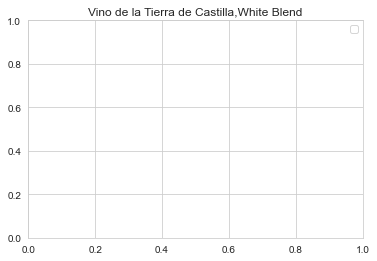

In [69]:
def get_spain_classified_regions():
    spain_region = spain_variety_year_per_region.index.tolist() # set this list into a unique list 
    mySpainlist = set(spain_region) # get the unique list
    mySpainlist_final = list(mySpainlist)
    print(len(mySpainlist_final))

    appended_dfs = []
    for region in mySpainlist_final:
        # print(f'===================={region}==========================')
        try:
            varieties = list(spain_variety_year_per_region.loc[str(region)]['variety'].values)
            summary_stat_spain = show_plot(spain_var,region,varieties) ## append this df to another df. 
            appended_dfs.append(summary_stat_spain)
        except:
            variety = pd.DataFrame(spain_variety_year_per_region.loc[str(region)]).transpose()['variety'].values
            summary_stat_spain2 = show_plot(spain_var,region, variety)
            appended_dfs.append(summary_stat_spain2)



    spain_classified_regions = pd.concat(appended_dfs)
    
    return spain_classified_regions
        
spain_classified_regions = get_spain_classified_regions()

In [70]:
spain_classified_regions['classification'] = np.where((spain_classified_regions['coefficient_years'] < 0) & (spain_classified_regions['p-value-year'] < 0.05) , 'appreciating', 'depreciating')
spain_classified_regions['country'] = 'Spain'
spain_classified_regions.shape

(86, 9)

In [71]:
country_list = [france_classified_regions, italy_classified_regions, spain_classified_regions]
all_countries_classification = pd.concat(country_list)
all_countries_classification.shape

(86, 9)

In [72]:
all_countries_classification.head()

,region,grape_variety,coefficient_years,coefficient_points,p-value-year,p-value-points,R-squared,classification,country
0,Terra Alta,Garnacha Blanca,-2.464426,1.253715,0.273983,0.815481,0.514803,depreciating,Spain
1,Terra Alta,Red Blend,-0.975803,1.238425,0.134830,0.118933,0.287301,depreciating,Spain
2,Terra Alta,White Blend,-1.524731,-1.462366,0.569302,0.764609,0.245000,depreciating,Spain
0,Navarra,Chardonnay,0.078974,0.202328,0.390294,0.144491,0.411215,depreciating,Spain
1,Navarra,Garnacha,-0.308473,2.053720,0.542885,0.316521,0.180438,depreciating,Spain


In [73]:
all_countries_classification[all_countries_classification['classification'] == 'appreciating'].shape

(13, 9)

In [74]:
all_countries_classification.to_excel('all_countries_classification- filter 10 region count.xlsx')

FileCreateError: [Errno 13] Permission denied: 'all_countries_classification- filter 10 region count.xlsx'

# Correlations between points and scores

## France correlation of price and scores 

The dataset that we will use is the data_price_df. 

In [ ]:
data_price_df[['points','price']].describe()

In [ ]:
plt.figure(figsize=(15,5))
plt.subplot(1, 2, 1)
plt.hist(data_price_df['price'])
plt.xlabel('Price')
plt.ylabel('Frequency')
plt.title('Distribution of Wine Prices')
plt.subplot(1, 2, 2)
plt.hist(data_price_df['points'])
plt.xlabel('Points')
plt.ylabel('Frequency')
plt.title('Distribution of Wine Review Points')
plt.tight_layout()
plt.show()

In [ ]:
plt.figure(figsize=(10,14))
ax = sns.jointplot(x='price', y='points', data=data_price_df[data_price_df['price'] < 200], kind='reg')
plt.tight_layout()
plt.show()

In [ ]:
plt.figure(figsize=(10,14))
ax = sns.jointplot(x='years', y='points', data=data_price_df[data_price_df['years'] < 1980], kind='reg')
plt.tight_layout()
plt.show()

Remarks: There is a positive correlation between price and points. 

In [ ]:
france = final_data[final_data['country'] == 'France']

In [ ]:
len(france['region_1'].unique()) # france

In [ ]:
spain = final_data[final_data['country'] == 'Spain']
len(spain['region_1'].unique())

In [ ]:
final_data.shape

In [ ]:
final_data.to_excel('wine_final_data.xlsx')